In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from keras import layers

%run C:\Projects\Stock_price_prediction\Experiments_YHdata\data_processing_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\feature_engineering.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\training_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\simulation_functions.ipynb
%run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\CNN_Class.ipynb

import random
import math
import gc

In [2]:
# Check if GPU is connected
print(tf.config.list_physical_devices('GPU'))
print(tf.config.list_physical_devices('CPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


In [3]:
# For importing processed data
processed_data_path = 'C:/Projects/Stock_price_prediction/Experiments_YHdata/YH_processed_20180103-20241206.csv'

# Prepare data

In [4]:
basic_factors = ['cshtrd', 'prccd', 'prchd', 'prcld', 'prcod', 'dol_vol', 'Mom_2day', 'Mom_3day', 'Mom_5day',
                 'MA_10day', 'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD', 'MACD_Signal_Line']

TA_factors = [# Momentum indicators
              'momentum_stoch_rsi', 'momentum_stoch', 'momentum_ao', 'momentum_pvo', 'momentum_kama', 'momentum_wr',
              # Volume indicators
              'volume_adi', 'volume_em', 'volume_fi', 'volume_cmf', 'volume_vpt',
              # Volatility indicators
              'volatility_atr', 'volatility_bbh', 'volatility_dcw', 'volatility_ui',
              # Trend indicators
              'trend_adx', 'trend_aroon_up', 'trend_aroon_down', 'trend_ichimoku_a',
              # Other indicators
              'others_dr'
]

# Remove factors that have low variance
basic_factors.remove('dol_vol')

# Remove factors that have high correlation with the prcod (and prcod since it shouldn't affect the return)
basic_factors.remove('prccd')
basic_factors.remove('prcld')
basic_factors.remove('prchd')
basic_factors.remove('prcod')
basic_factors.remove('MA_10day')
TA_factors.remove('trend_ichimoku_a')
TA_factors.remove('volatility_bbh')
TA_factors.remove('momentum_kama')

# Remove factors that have high correlation with momentum_stoch
TA_factors.remove('momentum_wr')

factors = basic_factors + TA_factors
print(f'There are {len(basic_factors)} basic factors')
print(f'There are {len(TA_factors)} TA factors')
print(f'There are {len(factors)} factors')

data = pd.read_csv(processed_data_path)
all_days = list(data['datadate'].unique())
num_of_tokens = data.sector.nunique()
num_to_tic_dict, tic_to_num_dict = num_tic_dicts(data)

data = remove_dead_stocks(data)

# 1. Use fixed_size objective labeling
# data = assign_class_labels(data, 'fixed_size')
# data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'DistinctRank', 'rank', 'sector']]
# 2. Use fixed_threshold objective labeling
data = assign_class_labels(data, 'fixed_thres')
data = data[['datadate', 'tic'] + factors + ['ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector']]

data

There are 12 basic factors
There are 16 TA factors
There are 28 factors
EXPRQ is dead after 2024-08-14
IDEX is dead after 2024-08-13
SAVE is dead after 2024-11-21
SRNE is dead after 2023-09-28
VTNR is dead after 2024-10-07
ZOM is dead after 2020-09-24


,datadate,tic,cshtrd,Mom_2day,Mom_3day,Mom_5day,MA_50day,open/MA10,open/MA50,STD_10day,...,volatility_ui,trend_adx,trend_aroon_up,trend_aroon_down,others_dr,ret_d,TBill1y,rel_ret_d,rank,sector
0,2018-01-03,A,1698900.0,0.000000,0.000000,0.000000,67.620003,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.000000,-0.011648,0.000071,-0.012974,-1,0
1,2018-01-04,A,2230700.0,0.000000,0.000000,0.000000,68.580002,1.013998,1.013998,1.357644,...,0.000000,0.000000,4.0,0.0,2.839394,0.014550,0.000072,0.012388,1,0
2,2018-01-05,A,1632500.0,0.016415,0.000000,0.000000,68.630002,1.001457,1.001457,0.963898,...,0.000000,0.000000,8.0,0.0,-1.164794,0.013624,0.000071,0.010738,1,0
3,2018-01-08,A,1613400.0,0.002732,0.031204,0.000000,68.905003,1.011973,1.011973,0.960156,...,0.000000,0.000000,12.0,0.0,1.454969,0.010894,0.000070,0.013818,1,0
4,2018-01-09,A,2666100.0,0.028372,0.016393,0.000000,69.260002,1.020502,1.020502,1.149586,...,0.000000,0.000000,16.0,0.0,1.362393,-0.007418,0.000070,-0.010233,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3750931,2024-11-29,ZWS,429100.0,0.001502,-0.003984,0.023018,37.296400,1.014662,1.072490,0.558605,...,2.369220,42.423606,36.0,12.0,0.225508,0.005238,0.000167,0.004944,0,2
3750932,2024-12-02,ZWS,1118400.0,0.004510,0.003756,0.011863,37.401800,1.013705,1.071874,0.552304,...,2.304960,42.155556,32.0,8.0,0.225000,0.003722,0.000167,0.005939,0,2
3750933,2024-12-03,ZWS,663000.0,0.007500,0.009772,0.003486,37.514600,1.015037,1.074248,0.520022,...,2.295787,42.199615,100.0,4.0,0.523819,0.007911,0.000166,-0.004699,0,2
3750934,2024-12-04,ZWS,851300.0,0.008980,0.011250,0.012769,37.637200,1.014624,1.074735,0.462531,...,2.261093,42.325318,100.0,0.0,0.372212,0.000000,0.000164,0.000000,0,2


In [5]:
data.columns

Index(['datadate', 'tic', 'cshtrd', 'Mom_2day', 'Mom_3day', 'Mom_5day',
       'MA_50day', 'open/MA10', 'open/MA50', 'STD_10day', 'H-L', 'RSI', 'MACD',
       'MACD_Signal_Line', 'momentum_stoch_rsi', 'momentum_stoch',
       'momentum_ao', 'momentum_pvo', 'volume_adi', 'volume_em', 'volume_fi',
       'volume_cmf', 'volume_vpt', 'volatility_atr', 'volatility_dcw',
       'volatility_ui', 'trend_adx', 'trend_aroon_up', 'trend_aroon_down',
       'others_dr', 'ret_d', 'TBill1y', 'rel_ret_d', 'rank', 'sector'],
      dtype='object')

# First Training

## Set parameters

In [6]:
# Whether to save the model after every training
save = True

# Set Seed
seed = 120

all_days = list(data['datadate'].unique())
num_of_ts = len(all_days)
batch_size = 4096 # Only for model.predict()
print(f'There are {num_of_ts} days in the dataset')

tickers = list(data.tic.unique())
nt = len(tickers)
print(f'There are {nt} tickers')
assert len(tickers) * num_of_ts == data.shape[0]

seq_length = 20 # Length of time-series
train_length = 200 # Length of training data
ftd = train_length # First train day
ltd = ftd+train_length-1 # Last train day
num_stocks = 10 # Choose the top {num_stocks} each day
num_of_models = 3

num_iters = math.floor((num_of_ts - 2*train_length) / seq_length)
print(f'There are {num_iters} iterations')

There are 1743 days in the dataset
There are 2152 tickers
There are 67 iterations


In [7]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\training_functions.ipynb
data_train, x_train, y_train, data_test, x_test, y_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)

Standardization data are from 2018-01-03 to 2018-10-17
Training data are from 2018-10-18 to 2019-08-06
Testing data are from 2019-07-11 to 2019-09-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)


In [8]:
model_params = {
    # For training and validation
    'num_models': 3,
    'train_patience': 20,
    'plateau_patience': 5,
    'retrain_patience': 20,
    'validation_split': 0.2,
    'learning_rate': 0.01,
    'retrain_learning_rate': 0.01,
    'min_learning_rate': 0.001,
    'epochs': 500,
    'batch_size': 1024,
    # Model inputs
    'target': keras.layers.Input(shape=1),
    'ret_d': keras.layers.Input(shape=1),
    'sector_input': keras.layers.Input(shape=1),
    # Categorical input dimension
    'embedding_dim': len(factors),
    # Convolution parameters
    'num_of_tokens': num_of_tokens,
    'filter_dims': [64, 128],
    'kernel_sizes': [4, 5],
    'strides': [2, 2],
    'paddings': ["valid", "valid"],
    # Dense layer parameters
    'layer_dims': [32, 8],
    'output_dim': 1,
    'activation': "leaky_relu",
    # Regularization parameter
    'dropout_conv': 0.4,
    'dropout_dense': 0.4
}

In [9]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\CNN_Class.ipynb
CNN_model = CNN(x_train.shape[1:], seed, **model_params)

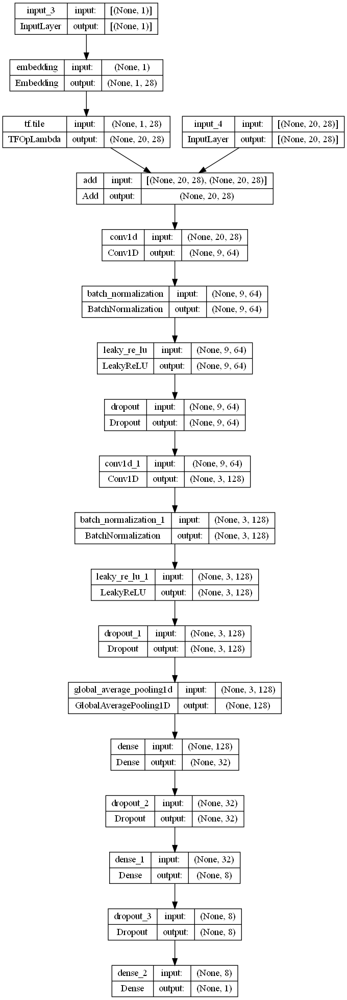

In [10]:
keras.utils.plot_model(CNN_model.model_dict[0], "pic.png", show_shapes=True)

In [11]:
# Save previous weights to compare with next trained weights
old_weights = {}
for i in range(num_of_models):
    old_weights[i] = CNN_model.model_dict[i].get_weights()

In [12]:
# %run C:\Projects\Stock_price_prediction\Experiments\Baseline\CNN_MSE\CNN_Class.ipynb
gc.collect()
CNN_model.compile_model()
CNN_model.train_model(x_train, y_train, sector_train) 
CNN_model.evaluate_model(x_train, y_train, sector_train, x_test, y_test, sector_test, batch_size)

if save:
    for i in range(model_params['num_models']):
        CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

gc.collect()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 28)        336         ['input_3[0][0]']                
                                                                                                  
 input_4 (InputLayer)           [(None, 20, 28)]     0           []                               
                                                                                                  
 tf.tile (TFOpLambda)           (None, 20, 28)       0           ['embedding[0][0]']              
                                                                                              

305/305 [==============================] - 2s 8ms/step - loss: 0.0572 - val_loss: 0.0592 - lr: 0.0010
Epoch 30: early stopping
Epoch 1/500
305/305 [==============================] - 3s 8ms/step - loss: 0.1970 - val_loss: 0.0591 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0641 - val_loss: 0.0590 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0619 - val_loss: 0.0588 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0612 - val_loss: 0.0588 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0607 - val_loss: 0.0588 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0606 - val_loss: 0.0588 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0603 - val_loss: 0.0588 - lr: 0.0100
Epoch 8/500
305/305 [==============================] - 2s 7ms/step - loss: 

2900

In [13]:
# Save trained weights to compare with old weights
new_weights = {}
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([x_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))
    new_weights[i] = CNN_model.model_dict[i].get_weights()
    print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
    x = old_weights[i][-1]
    y = new_weights[i][-1]
    print(np.corrcoef(x.reshape(8, ), y.reshape(8, ))[0, 1])
    
# Now set the new weights to old weights
old_weights = new_weights.copy()

[0.00742472]
[0.01008693]
0.10193510871671554
0.6080625836502713
[0.00292705]
[0.0027397]
0.4626169484069138
0.7327876629973874
[0.00583402]
[0.01131937]
0.3546989203616284
0.6774250858785162


In [14]:
for i in range(num_of_models):
    y = CNN_model.model_dict[i].predict([x_test, sector_test], batch_size=4096, verbose=0)
    print(np.mean(y, axis=0))
    print(np.std(y, axis=0))

[0.00742472]
[0.01008693]
[0.00292705]
[0.0027397]
[0.00583402]
[0.01131937]


## Simulating

Testing data from 2019-07-11 to 2019-08-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-08 are ['MVIS', 'ENTA', 'OII', 'MOH', 'BJRI', 'EXC', 'UUUU', 'MMSI', 'TOON', 'IWM']
position on 2019-08-09 market open will be {'MVIS': 0.1, 'IWM': 0.10129204297054034, 'EXC': 0.10140061624451358, 'UUUU': 0.10649350820252826, 'OII': 0.09901441118345491, 'MOH': 0.1024690419201104, 'ENTA': 0.10044125718372439, 'TOON': 0.15000000000000002, 'MMSI': 0.09976321979331186, 'BJRI': 0.10410396725392829}
Total asset on 2019-08-09 will be 1.0649780647521119
It should be the same as 1.064978064752112
top_stocks by model 1 to buy on 2019-08-08 are ['CENN', 'MGNX', 'ILMN', 'CXW', 'AR', 'IQLT', 'GUSH', 'UUUU', 'IWM', 'FCEL']
position on 2019-08-09 market open will be {'MGNX': 0.1013986000461365, 'IQLT': 0.10055344119078724, 'GUSH': 0.10786516853932585, 'IWM': 0.10129204297054034, 'UUUU': 0.10649350820252826, 'FCEL': 0.09687499813735491, 'ILMN': 0.10185950355722831, 'CENN': 0.0989247311

Testing data from 2019-07-16 to 2019-08-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-13 are ['EXC', 'VUZI', 'MOH', 'LGND', 'HCSG', 'OII', 'LYG', 'MVIS', 'ROL', 'TOON']
position on 2019-08-14 market open will be {'EXC': 0.10020008803493051, 'OII': 0.09203942933688833, 'MOH': 0.10211957242470417, 'TOON': 0.11166666348775231, 'HCSG': 0.10138332030181216, 'MVIS': 0.09733611838334202, 'VUZI': 0.10017880619203415, 'LYG': 0.10156433925782142, 'ROL': 0.10025610975504137, 'LGND': 0.10264871901352673}
Total asset on 2019-08-14 will be 1.009393166187853
It should be the same as 1.009393166187853
top_stocks by model 1 to buy on 2019-08-13 are ['CSX', 'ALGN', 'AR', 'MMSI', 'IQLT', 'UUUU', 'IWM', 'CENN', 'GUSH', 'FCEL']
position on 2019-08-14 market open will be {'IQLT': 0.09854030100349896, 'GUSH': 0.09129213483146069, 'IWM': 0.09853480050771175, 'UUUU': 0.10649350820252826, 'FCEL': 0.10312499192853798, 'CENN': 0.0860215053763441, 'AR': 0.0875634517152159, 'MMSI': 0

top_stocks by model 0 to buy on 2019-08-16 are ['NSP', 'NGVT', 'GVA', 'ATI', 'MEOH', 'FTV', 'FLR', 'OII', 'IDCC', 'CARS']
position on 2019-08-19 market open will be {'OII': 0.09378317118338841, 'MEOH': 0.10288874928994984, 'NGVT': 0.09890066285200856, 'ATI': 0.10246286882497618, 'IDCC': 0.10329715954729587, 'GVA': 0.10479429745264401, 'NSP': 0.10553792794075437, 'CARS': 0.10146851090015466, 'FTV': 0.10357882121779854, 'FLR': 0.10581962827766012}
Total asset on 2019-08-19 will be 1.0225317974866301
It should be the same as 1.0225317974866304
top_stocks by model 1 to buy on 2019-08-16 are ['FIX', 'NSP', 'ALGN', 'CENN', 'MMSI', 'UUUU', 'IQLT', 'GUSH', 'IWM', 'FCEL']
position on 2019-08-19 market open will be {'IQLT': 0.10020753879716038, 'GUSH': 0.09466292134831464, 'UUUU': 0.11168831631272348, 'FCEL': 0.12499999503294648, 'CENN': 0.06344086021505378, 'MMSI': 0.09910690054445842, 'ALGN': 0.09797321207427528, 'IWM': 0.10316168346496322, 'NSP': 0.09935470051187015, 'FIX': 0.0964717279842457

Testing data from 2019-07-24 to 2019-08-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-08-21 are ['FTV', 'RL', 'TPR', 'NGVT', 'TBF', 'DXC', 'OI', 'AXL', 'IDCC', 'FLR']
position on 2019-08-22 market open will be {'NGVT': 0.10169635096820252, 'IDCC': 0.1028591080785351, 'FLR': 0.10438802247754085, 'DXC': 0.11287348487711442, 'FTV': 0.11018800658394012, 'TPR': 0.10803294551283486, 'RL': 0.10495102987901397, 'AXL': 0.10447891823692006, 'TBF': 0.10606965960212611, 'OI': 0.10316622422230957}
Total asset on 2019-08-22 will be 1.0587037504385375
It should be the same as 1.0587037504385375
top_stocks by model 1 to buy on 2019-08-21 are ['ERIE', 'CENN', 'IQLT', 'MMSI', 'FIX', 'NSP', 'CARS', 'GUSH', 'IWM', 'FCEL']
position on 2019-08-22 market open will be {'IQLT': 0.10051885029167065, 'GUSH': 0.10028089887640451, 'FCEL': 0.10312499192853801, 'CENN': 0.0541935483870968, 'MMSI': 0.09465264932523755, 'NSP': 0.1023486288136818, 'FIX': 0.09471635028709653, 'CARS': 0.103780

top_stocks by model 0 to buy on 2019-08-26 are ['AEG', 'COMM', 'TDW', 'TBT', 'TBF', 'TPR', 'XELA', 'FLR', 'IDCC', 'DXC']
position on 2019-08-27 market open will be {'IDCC': 0.1016492425469045, 'FLR': 0.1020020128106754, 'DXC': 0.10941150443083036, 'TBF': 0.10420382915707416, 'TDW': 0.09995507189859572, 'TPR': 0.10288620571793367, 'XELA': 0.1099416571800169, 'TBT': 0.10140940920975847, 'AEG': 0.1032099348343823, 'COMM': 0.09874076446351823}
Total asset on 2019-08-27 will be 1.0334096322496895
It should be the same as 1.03340963224969
top_stocks by model 1 to buy on 2019-08-26 are ['FIX', 'WES', 'NSP', 'IQLT', 'FLR', 'DXC', 'GUSH', 'CENN', 'CARS', 'FCEL']
position on 2019-08-27 market open will be {'IQLT': 0.0999308182017668, 'GUSH': 0.08342696629213486, 'FCEL': 0.10312499192853802, 'CENN': 0.05430107526881723, 'NSP': 0.10134367235125229, 'FIX': 0.09236760056613424, 'CARS': 0.09933730832991983, 'FLR': 0.09993137652951714, 'WES': 0.10073856540883055, 'DXC': 0.09887971100678966}
Total asse

position on 2019-08-30 market open will be {'IDCC': 0.10273394710574421, 'FLR': 0.10486522441091399, 'DXC': 0.1084317024053111, 'TPR': 0.1001399606506309, 'XELA': 0.09494961301910551, 'ODP': 0.10765591070612941, 'HIMX': 0.10024212522790026, 'HQY': 0.10003619693563104, 'DBI': 0.09837524891392917, 'M': 0.10072223767155317}
Total asset on 2019-08-30 will be 1.018152167046848
It should be the same as 1.0181521670468487
top_stocks by model 1 to buy on 2019-08-29 are ['IQLT', 'ICUI', 'AR', 'NGVT', 'FLR', 'GUSH', 'DXC', 'CENN', 'CARS', 'FCEL']
position on 2019-08-30 market open will be {'IQLT': 0.10110688238157456, 'GUSH': 0.09494382022471914, 'FCEL': 0.10312499192853802, 'CENN': 0.050537634408602185, 'CARS': 0.10423581484984232, 'FLR': 0.10273646506280124, 'DXC': 0.09799422330939253, 'AR': 0.10955233970366543, 'NGVT': 0.1040088736533835, 'ICUI': 0.10055627177392475}
Total asset on 2019-08-30 will be 0.9687973172964427
It should be the same as 0.9687973172964437
top_stocks by model 2 to buy o

Testing data from 2019-08-06 to 2019-09-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-09-04 are ['DXC', 'CI', 'M', 'UNH', 'ODP', 'HIMX', 'MAT', 'ELV', 'AGNC', 'TPR']
position on 2019-09-05 market open will be {'TPR': 0.1058776570837141, 'ELV': 0.09966929169535316, 'AGNC': 0.10394621622531958, 'ODP': 0.10169967998956203, 'M': 0.10577606719633338, 'MAT': 0.10323310652480416, 'DXC': 0.10091939637969434, 'HIMX': 0.11507273622693308, 'CI': 0.09787845706821463, 'UNH': 0.098026842840693}
Total asset on 2019-09-05 will be 1.0320994512306207
It should be the same as 1.0320994512306216
top_stocks by model 1 to buy on 2019-09-04 are ['IQLT', 'NGVT', 'FLR', 'AR', 'ICUI', 'GUSH', 'DXC', 'CARS', 'CENN', 'FCEL']
position on 2019-09-05 market open will be {'GUSH': 0.09382022471910116, 'FCEL': 0.10937499565382819, 'CENN': 0.048064516129032286, 'CARS': 0.10366622890075423, 'FLR': 0.11185300836919009, 'DXC': 0.09681356553980507, 'AR': 0.11772788767548553, 'NGVT': 0.1032278722

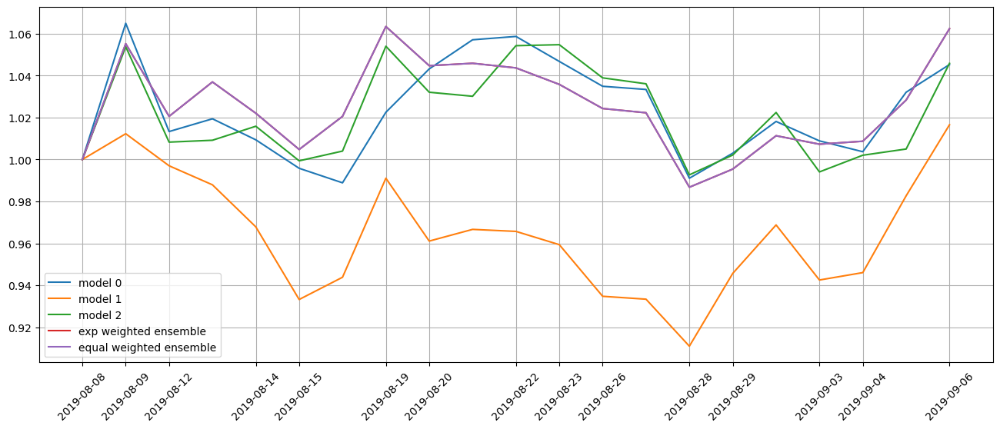

In [15]:
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\simulation_functions.ipynb
ftd = train_length
ltd = ftd+train_length-1
first_run = True
total_dict = {}
total_asset_dict = {}
position_dict_all = {}
num_iter = 0
for i in range(num_of_models):
    total_dict[i] = 1
    total_asset_dict[i] = [1]
    position_dict_all[i] = {}
total_dict['ensemble_weighted'] = 1
total_asset_dict['ensemble_weighted'] = [1]
position_dict_all['ensemble_weighted'] = {}
total_dict['ensemble_equal'] = 1
total_asset_dict['ensemble_equal'] = [1]
position_dict_all['ensemble_equal'] = {}

return_dict = {}
total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, position_dict_all, return_dict)

In [16]:
# pd.DataFrame(CNN_model.model_dict[0].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test0.csv')
# pd.DataFrame(CNN_model.model_dict[1].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test1.csv')
# pd.DataFrame(CNN_model.model_dict[2].predict([x_test, sector_test], batch_size=4096, verbose=0)).to_csv('test2.csv')

# Retraining

Running 67 iterations; first iteration already completed.
Standardization data are from 2018-02-01 to 2018-11-14
Training data are from 2018-11-15 to 2019-09-04
Testing data are from 2019-08-08 to 2019-10-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 2 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 3s 8ms/step - loss: 0.0556 - val_loss: 0.0608 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0551 - val_loss: 0.0609 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0552 - val_loss: 0.0609 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0550 - val_loss: 0.0613 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 3s 8ms/step - loss: 0.0549 - val_loss: 0.0609 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0

305/305 [==============================] - 2s 7ms/step - loss: 0.0541 - val_loss: 0.0640 - lr: 0.0010
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05620643307808394
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.05317270839229231
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05625593487873041
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.05323599854837526
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.056184144124739197
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.05326783344716737
Correlations between old and new weights
0.9469112745977444
-0.34913385097132454
0.8864886383236041
-0.4986911958219884
0.5121516187467231
-0.530932499679112
Weight of model 0 is 0.3364457414937054
Weight of model 1 is 0.32692022019295675
Weight of model 2 is 0.3366340383133378
Testing data from 2019-08-08 to 201

position on 2019-09-11 market open will be {'FCEL': 0.13437499068677464, 'DXC': 0.11460319123101957, 'CARS': 0.10661243897326071, 'XELA': 0.10970960851317814, 'HQY': 0.10417351679653652, 'MYGN': 0.10690995689365726, 'AXSM': 0.10404441487910629, 'YPF': 0.10150085745802949, 'OI': 0.11241963268595632, 'ICUI': 0.1059799275858278}
Total asset on 2019-09-11 will be 1.1003285357033472
It should be the same as 1.1003285357033468
Testing data from 2019-08-13 to 2019-09-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-09-11 are ['PCG', 'GGAL', 'AGNC', 'ICUI', 'XELA', 'TVTX', 'HQY', 'CARS', 'MYGN', 'FCEL']
position on 2019-09-12 market open will be {'XELA': 0.12278619493292106, 'HQY': 0.10658496290713655, 'MYGN': 0.11247509208570577, 'CARS': 0.10963522375354566, 'GGAL': 0.1079195987543427, 'FCEL': 0.09596543455810239, 'ICUI': 0.10631243264504289, 'TVTX': 0.09855370445575788, 'AGNC': 0.10609137317895664, 'PCG': 0.10550738914642423}
Total asset on 2019-09-12 will be 1.0718

top_stocks by model 0 to buy on 2019-09-16 are ['CARS', 'AGNC', 'WOLF', 'MYGN', 'HQY', 'ULTA', 'OLLI', 'SHV', 'TVTX', 'FCEL']
position on 2019-09-17 market open will be {'HQY': 0.1105365469838236, 'MYGN': 0.11942840251366021, 'CARS': 0.11868967406438546, 'FCEL': 0.10662825873699097, 'TVTX': 0.10196071111230079, 'AGNC': 0.10642773890905673, 'ULTA': 0.11099946842262445, 'WOLF': 0.1143532156364482, 'OLLI': 0.10975407319092012, 'SHV': 0.10647745256658854}
Total asset on 2019-09-17 will be 1.1052555421367984
It should be the same as 1.105255542136799
top_stocks by model 1 to buy on 2019-09-16 are ['CYBR', 'CARS', 'HQY', 'ULTA', 'TVTX', 'YPF', 'CENN', 'WKHS', 'AXSM', 'FCEL']
position on 2019-09-17 market open will be {'FCEL': 0.12499999503294655, 'CENN': 0.04483870967741939, 'CARS': 0.12394379505747899, 'CYBR': 0.09294568243370051, 'WKHS': 0.09947592072957802, 'AXSM': 0.12659533764598774, 'YPF': 0.10253457146131412, 'HQY': 0.10376851741502932, 'TVTX': 0.10401853141472829, 'ULTA': 0.106753135

position on 2019-09-20 market open will be {'HQY': 0.11066227861269393, 'MYGN': 0.11757418372026833, 'FCEL': 0.09863114272133773, 'TVTX': 0.10295788089294713, 'ULTA': 0.11301593702725586, 'WOLF': 0.11204859389575217, 'OLLI': 0.11014484210244012, 'SHV': 0.10650636141616489, 'MMSI': 0.1190702592803616, 'BMA': 0.11279651390123847}
Total asset on 2019-09-20 will be 1.10340799357046
It should be the same as 1.1034079935704604
top_stocks by model 1 to buy on 2019-09-19 are ['IQLT', 'CYBR', 'EHTH', 'TVTX', 'OLLI', 'CENN', 'ULTA', 'WKHS', 'AXSM', 'FCEL']
position on 2019-09-20 market open will be {'FCEL': 0.11562499937911844, 'CENN': 0.03978494623655918, 'CYBR': 0.09735333800150903, 'WKHS': 0.08797581926336957, 'AXSM': 0.11868312955852811, 'TVTX': 0.10503582655736159, 'ULTA': 0.10869246323996651, 'OLLI': 0.12438508512058233, 'EHTH': 0.10359033874010304, 'IQLT': 0.10244602659883516}
Total asset on 2019-09-20 will be 1.0035719726959313
It should be the same as 1.003571972695933
top_stocks by mod

top_stocks by model 1 to buy on 2019-09-24 are ['ENPH', 'IQLT', 'CYBR', 'OLLI', 'CENN', 'EHTH', 'ULTA', 'WKHS', 'AXSM', 'FCEL']
position on 2019-09-25 market open will be {'FCEL': 0.1031249919285381, 'CENN': 0.0391397849462366, 'CYBR': 0.09187355113199872, 'WKHS': 0.09343836896783014, 'AXSM': 0.11133298729296069, 'ULTA': 0.11293061646173971, 'OLLI': 0.12261990956446138, 'EHTH': 0.09745968734379168, 'IQLT': 0.10104265690804916, 'ENPH': 0.09440730595025347}
Total asset on 2019-09-25 will be 0.9673698604958579
It should be the same as 0.9673698604958596
top_stocks by model 2 to buy on 2019-09-24 are ['WKHS', 'MMSI', 'SPSC', 'OKTA', 'CYBR', 'ENPH', 'EHTH', 'AXSM', 'ULTA', 'FCEL']
position on 2019-09-25 market open will be {'FCEL': 0.1031249919285381, 'AXSM': 0.1014978287276166, 'SPSC': 0.11020387979876144, 'ULTA': 0.12523118523160945, 'EHTH': 0.11938525239600636, 'ENPH': 0.10523143392337053, 'CYBR': 0.10247515616971788, 'MMSI': 0.11685060244000339, 'WKHS': 0.11216524019023541, 'OKTA': 0.11

position on 2019-09-30 market open will be {'FCEL': 0.10624999379118319, 'CENN': 0.038602150537634446, 'CYBR': 0.09040738777182296, 'WKHS': 0.1009134340983139, 'AXSM': 0.09620034824343206, 'ULTA': 0.11616126072232955, 'EHTH': 0.08678781518609184, 'ENPH': 0.08592555110806452, 'MGNX': 0.0967906763795412, 'SPTI': 0.12237828610868315}
Total asset on 2019-09-30 will be 0.9404169039470954
It should be the same as 0.9404169039470968
top_stocks by model 2 to buy on 2019-09-27 are ['VRNT', 'LOPE', 'WKHS', 'EHTH', 'CYBR', 'OKTA', 'ENPH', 'AXSM', 'ULTA', 'FCEL']
position on 2019-09-30 market open will be {'FCEL': 0.10624999379118319, 'AXSM': 0.08770200734716387, 'ULTA': 0.12881371601459185, 'EHTH': 0.10631252267760892, 'ENPH': 0.09577721620953863, 'CYBR': 0.10083980717696515, 'WKHS': 0.12113845413928272, 'OKTA': 0.1051068392768843, 'VRNT': 0.11162417219334567, 'LOPE': 0.10894294474108843}
Total asset on 2019-09-30 will be 1.0725076735676506
It should be the same as 1.0725076735676526
top_stocks b

top_stocks by model 2 to buy on 2019-10-02 are ['MDB', 'WKHS', 'FICO', 'CYBR', 'OKTA', 'BAND', 'ULTA', 'ENPH', 'AXSM', 'FCEL']
position on 2019-10-03 market open will be {'FCEL': 0.12187499317030151, 'AXSM': 0.07197477187562289, 'ULTA': 0.13814507494437103, 'ENPH': 0.09347754514303701, 'CYBR': 0.10279200284388772, 'WKHS': 0.11596159689973341, 'OKTA': 0.11404379210302189, 'FICO': 0.10490289303074689, 'BAND': 0.10594538421242898, 'MDB': 0.11480956971159169}
Total asset on 2019-10-03 will be 1.083927623934741
It should be the same as 1.0839276239347428
top_stocks by return weighted ensemble to buy on 2019-10-02 are ['OKTA', 'FICO', 'ENPH', 'LOPE', 'BAND', 'CYBR', 'WKHS', 'ULTA', 'AXSM', 'FCEL']
position on 2019-10-03 market open will be {'FCEL': 0.12187499317030151, 'AXSM': 0.07694819758653657, 'ULTA': 0.12433303964730401, 'WKHS': 0.11863151861763824, 'CYBR': 0.1211735744912956, 'ENPH': 0.09116358361988358, 'LOPE': 0.09390259893378468, 'OKTA': 0.11279877988867172, 'FICO': 0.10506485305307

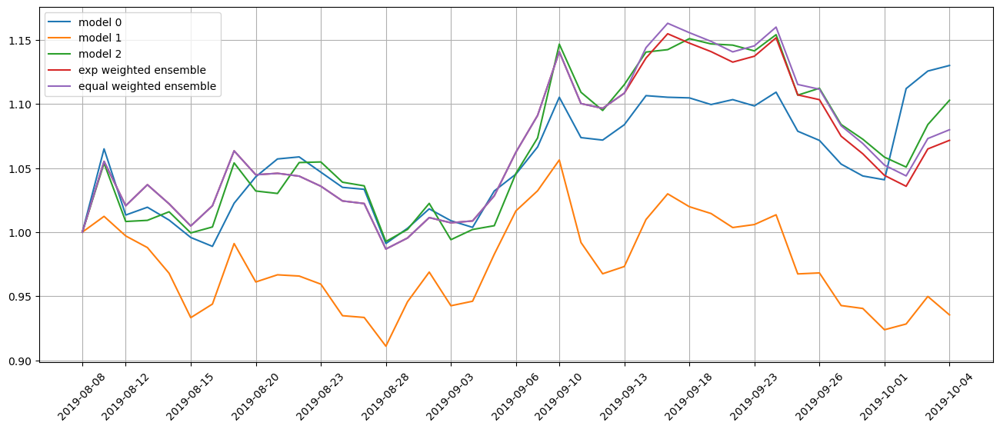

Standardization data are from 2018-03-02 to 2018-12-14
Training data are from 2018-12-17 to 2019-10-02
Testing data are from 2019-09-06 to 2019-10-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 3 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0537 - val_loss: 0.0521 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0521 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0521 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0535 - val_loss: 0.0521 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0537 - val_loss: 0.0862 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0537 - val_loss: 0.0521 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 7ms/step - loss: 0.0526 - val_loss: 0.0533 - lr: 0.0010
Epoch 25/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0526 - val_loss: 0.0540 - lr: 0.0010
Epoch 25: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.053300250239084336
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.042924035531432675
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05329413303443662
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.04297798992751439
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05321262033458439
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.04276814039273515
Correlations between old and new weights
0.9471211339313819
-0.6626974981751138
0.8798347108876207
-0.35508366171748645
0.7532367759440611
0.1660915383341255
Weight of model 0 is 0.3576120690685052


position on 2019-10-09 market open will be {'FCEL': 0.1031249919285381, 'AXSM': 0.07280251754974953, 'ENPH': 0.10386866468059247, 'MRIN': 0.12933819957710535, 'MKTX': 0.1221791678190056, 'WKHS': 0.12406081133185688, 'SPTI': 0.11821862270096829, 'ASND': 0.11553127514205067, 'ERIE': 0.1185613646093077, 'EHTH': 0.10908574400393185}
Total asset on 2019-10-09 will be 1.1167713593431046
It should be the same as 1.1167713593431066
top_stocks by return weighted ensemble to buy on 2019-10-08 are ['MMSI', 'EHTH', 'GDOT', 'SPTI', 'ENPH', 'JDST', 'ERIE', 'AM', 'ESGU', 'CENN']
position on 2019-10-09 market open will be {'ERIE': 0.09246930306367455, 'GDOT': 0.10418528635012214, 'ENPH': 0.11454912209801675, 'JDST': 0.09364837014959244, 'CENN': 0.0900668910180178, 'AM': 0.10433280440609771, 'SPTI': 0.10722248930716403, 'MMSI': 0.10606675515703512, 'ESGU': 0.10679587125571048, 'EHTH': 0.10635219406624166}
Total asset on 2019-10-09 will be 1.0256890868716741
It should be the same as 1.0256890868716728
t

top_stocks by model 2 to buy on 2019-10-11 are ['MKTX', 'TMF', 'ASND', 'WKHS', 'SPTI', 'ENPH', 'ERIE', 'MRIN', 'AXSM', 'FCEL']
position on 2019-10-14 market open will be {'FCEL': 0.09374999627470998, 'AXSM': 0.0711470186833702, 'ENPH': 0.10374091014079787, 'MRIN': 0.12875295477219262, 'MKTX': 0.12304444721246079, 'WKHS': 0.12784106568603737, 'SPTI': 0.11664237411195966, 'ASND': 0.11789515192014496, 'ERIE': 0.12183716019993142, 'TMF': 0.10177446299411536}
Total asset on 2019-10-14 will be 1.106425541995718
It should be the same as 1.1064255419957203
top_stocks by return weighted ensemble to buy on 2019-10-11 are ['BCRX', 'GUSH', 'ENPH', 'EHTH', 'GDOT', 'JDST', 'ERIE', 'AM', 'ESGU', 'CENN']
position on 2019-10-14 market open will be {'ERIE': 0.09502418707873465, 'GDOT': 0.11025969226420597, 'ENPH': 0.11440823099844875, 'JDST': 0.10780983100148206, 'CENN': 0.09971691505566256, 'AM': 0.1110247051371748, 'ESGU': 0.10876400524548226, 'EHTH': 0.10614136678374667, 'GUSH': 0.10875390760482573, 

position on 2019-10-17 market open will be {'FCEL': 0.09062499441206491, 'AXSM': 0.08494284006382295, 'ENPH': 0.10344280538428335, 'MRIN': 0.1299234350798675, 'WKHS': 0.1268100919929124, 'SPTI': 0.11698014217804911, 'ASND': 0.12580791280307166, 'ERIE': 0.12132305236606031, 'EHTH': 0.12824351481299323, 'MKTX': 0.09758822655066844}
Total asset on 2019-10-17 will be 1.1256870156437924
It should be the same as 1.125687015643794
top_stocks by return weighted ensemble to buy on 2019-10-16 are ['GDOT', 'BCRX', 'JDST', 'USHY', 'GUSH', 'EHTH', 'ERIE', 'AM', 'ESGU', 'CENN']
position on 2019-10-17 market open will be {'ERIE': 0.09462322009210884, 'GDOT': 0.11228449716132799, 'JDST': 0.11192122286170808, 'CENN': 0.09499912552614734, 'AM': 0.11087261302294182, 'ESGU': 0.11023885972931607, 'EHTH': 0.10838378647300587, 'GUSH': 0.10794231127941659, 'BCRX': 0.1097266770496857, 'USHY': 0.11246031330872419}
Total asset on 2019-10-17 will be 1.0734526265043842
It should be the same as 1.0734526265043822
t

position on 2019-10-22 market open will be {'ERIE': 0.09767159831657811, 'GDOT': 0.1121924585802583, 'JDST': 0.11133388116739007, 'CENN': 0.08899466612494615, 'AM': 0.11117678999925663, 'ESGU': 0.11050549283288144, 'EHTH': 0.11620352216235139, 'GUSH': 0.1063191186285983, 'BCRX': 0.10576065637549595, 'USHY': 0.11265345896470273}
Total asset on 2019-10-22 will be 1.0728116431524608
It should be the same as 1.0728116431524592
top_stocks by equal weighted ensemble to buy on 2019-10-21 are ['GDOT', 'JDST', 'BCRX', 'EHTH', 'GUSH', 'AM', 'ERIE', 'USHY', 'ESGU', 'CENN']
position on 2019-10-22 market open will be {'ERIE': 0.09767159831657811, 'GDOT': 0.11300485521592728, 'JDST': 0.11214006075950284, 'CENN': 0.0896390852620905, 'AM': 0.11198183207875849, 'ESGU': 0.11130567398352587, 'EHTH': 0.11474924983071368, 'GUSH': 0.1064285790208033, 'BCRX': 0.10769032910324818, 'USHY': 0.11346919374953167}
Total asset on 2019-10-22 will be 1.0780804573206817
It should be the same as 1.0780804573206797
Test

position on 2019-10-25 market open will be {'ERIE': 0.09379558149787885, 'CENN': 0.08855909628302917, 'AM': 0.11152226640348022, 'ESGU': 0.11112103075438144, 'EHTH': 0.1211462905722683, 'GUSH': 0.11455289803002495, 'BCRX': 0.10589548136980022, 'USHY': 0.1135803482579808, 'QGEN': 0.11580562425410007, 'GDOT': 0.10758424577690201}
Total asset on 2019-10-25 will be 1.0835628631998482
It should be the same as 1.0835628631998462
Testing data from 2019-09-27 to 2019-10-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-10-25 are ['QGEN', 'FDS', 'UNH', 'ELV', 'ESGU', 'STRA', 'ERIE', 'LOPE', 'EHTH', 'CENN']
position on 2019-10-28 market open will be {'LOPE': 0.09480849499554529, 'ELV': 0.12696326561442403, 'CENN': 0.0916361911514168, 'UNH': 0.12472685162444348, 'STRA': 0.10181764702634186, 'EHTH': 0.11248386437567857, 'ERIE': 0.10839846284792701, 'ESGU': 0.12215744142611527, 'FDS': 0.10594418027937716, 'QGEN': 0.12436163312946952}
Total asset on 2019-10-28 will be 1.1132

top_stocks by model 0 to buy on 2019-10-30 are ['UNH', 'FDS', 'ELV', 'ERIE', 'STRA', 'ESGU', 'LOPE', 'QGEN', 'EHTH', 'CENN']
position on 2019-10-31 market open will be {'LOPE': 0.09391503582173155, 'ELV': 0.13073472965409422, 'CENN': 0.08636711016021036, 'UNH': 0.12936482849166595, 'STRA': 0.09864288290890995, 'EHTH': 0.12465225943810863, 'ERIE': 0.10976634025482508, 'ESGU': 0.12261277705300487, 'FDS': 0.10484607947318529, 'QGEN': 0.1290951225996528}
Total asset on 2019-10-31 will be 1.1299971658553873
It should be the same as 1.129997165855389
top_stocks by model 1 to buy on 2019-10-30 are ['ERIE', 'QGEN', 'WES', 'EHTH', 'GUSH', 'BCRX', 'AM', 'USHY', 'ESGU', 'CENN']
position on 2019-10-31 market open will be {'CENN': 0.040537634408602224, 'ERIE': 0.09902338450072477, 'GUSH': 0.08999875654650394, 'BCRX': 0.07362330991121688, 'AM': 0.09410004821969864, 'ESGU': 0.09930357568303398, 'USHY': 0.1221681542211447, 'EHTH': 0.11299608509960953, 'QGEN': 0.10701178642675087, 'WES': 0.083374044410

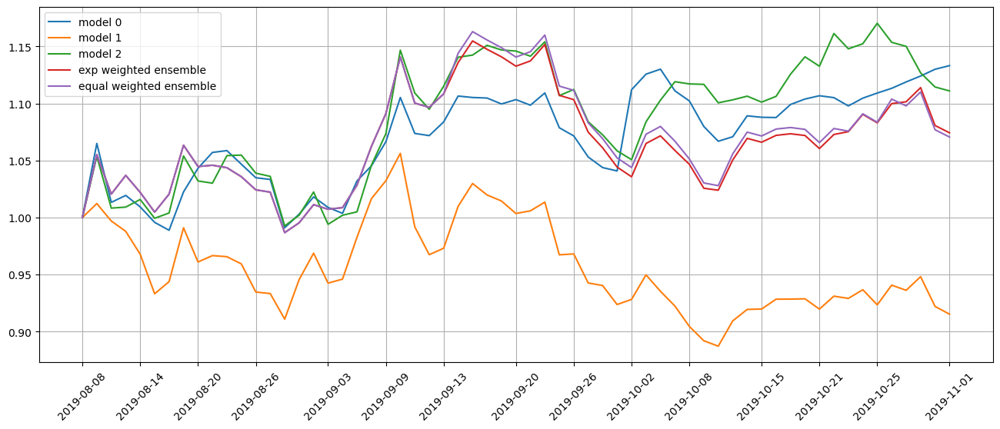

Standardization data are from 2018-04-02 to 2019-01-15
Training data are from 2019-01-16 to 2019-10-30
Testing data are from 2019-10-04 to 2019-11-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 4 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 3s 8ms/step - loss: 0.0527 - val_loss: 0.0456 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0519 - val_loss: 0.0456 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0519 - val_loss: 0.0458 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0519 - val_loss: 0.0455 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0519 - val_loss: 0.0456 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0518 - val_loss: 0.0456 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 7ms/step - loss: 0.0513 - val_loss: 0.0457 - lr: 0.0050
Epoch 13/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0512 - val_loss: 0.0456 - lr: 0.0025
Epoch 14/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0512 - val_loss: 0.0456 - lr: 0.0025
Epoch 15/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0511 - val_loss: 0.0456 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0512 - val_loss: 0.0457 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0511 - val_loss: 0.0456 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0509 - val_loss: 0.0456 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0507 - val_loss: 0.0457 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0509 - val_loss

Testing data from 2019-10-08 to 2019-11-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-11-05 are ['GDOT', 'GPRO', 'AXSM', 'INFY', 'GIL', 'IIPR', 'AUPH', 'QGEN', 'ERIE', 'EHTH']
position on 2019-11-06 market open will be {'EHTH': 0.13383385556036675, 'ERIE': 0.10545984137419218, 'QGEN': 0.1315479286158227, 'GPRO': 0.11664362168152421, 'GDOT': 0.11057462112926983, 'IIPR': 0.10780377047099798, 'AUPH': 0.11783952917836563, 'AXSM': 0.11678148227929445, 'GIL': 0.11989586428991844, 'INFY': 0.1003728787874395}
Total asset on 2019-11-06 will be 1.16075339336719
It should be the same as 1.1607533933671914
top_stocks by model 1 to buy on 2019-11-05 are ['HPQ', 'BB', 'BCRX', 'AUPH', 'GPRO', 'AXSM', 'GDOT', 'QGEN', 'ERIE', 'EHTH']
position on 2019-11-06 market open will be {'EHTH': 0.12131911447314486, 'QGEN': 0.10904500928027894, 'GPRO': 0.09443664555970359, 'GDOT': 0.08952308024174954, 'BB': 0.09271780004665806, 'AXSM': 0.0945482598273386, 'ERIE': 0.08723162518410266, 

position on 2019-11-11 market open will be {'EHTH': 0.14388200492314665, 'ERIE': 0.10413254083693396, 'QGEN': 0.13714205551972908, 'IIPR': 0.11899636171776215, 'AUPH': 0.11447908434078707, 'GIL': 0.12078662447800574, 'INFY': 0.09905218186659034, 'EXC': 0.11143183126591612, 'LRN': 0.10789507042680363, 'SMPL': 0.11176247655681579}
Total asset on 2019-11-11 will be 1.169560231932489
It should be the same as 1.1695602319324905
top_stocks by model 1 to buy on 2019-11-08 are ['HPQ', 'BCRX', 'EGHT', 'GDOT', 'AXSM', 'GPRO', 'ERIE', 'GIL', 'QGEN', 'EHTH']
position on 2019-11-11 market open will be {'EHTH': 0.13042766609995277, 'QGEN': 0.11368219077428049, 'GPRO': 0.09954132416947926, 'GDOT': 0.07358397765700003, 'AXSM': 0.0930480751573162, 'ERIE': 0.0861337420329044, 'HPQ': 0.09137688927766308, 'EGHT': 0.08874031566301256, 'BCRX': 0.08478949946645555, 'GIL': 0.0928662596907789}
Total asset on 2019-11-11 will be 0.9541899399888404
It should be the same as 0.9541899399888432
top_stocks by model 2

top_stocks by model 1 to buy on 2019-11-13 are ['IIPR', 'PRO', 'GPRO', 'BCRX', 'AXSM', 'GDOT', 'EHTH', 'QGEN', 'GIL', 'INFY']
position on 2019-11-14 market open will be {'EHTH': 0.12720207111759557, 'QGEN': 0.130697059645378, 'GPRO': 0.09762707476186082, 'AXSM': 0.09377986864229718, 'BCRX': 0.05876499918433267, 'GIL': 0.09320868166640718, 'INFY': 0.09042807330760452, 'IIPR': 0.08208808560116149, 'PRO': 0.08618658136808408, 'GDOT': 0.08442546949129505}
Total asset on 2019-11-14 will be 0.9444079647860137
It should be the same as 0.9444079647860164
top_stocks by model 2 to buy on 2019-11-13 are ['LRN', 'BNDX', 'SMPL', 'PRO', 'SBAC', 'GDOT', 'INFY', 'IIPR', 'EHTH', 'AXSM']
position on 2019-11-14 market open will be {'AXSM': 0.10102482582945425, 'EHTH': 0.17260148757515525, 'IIPR': 0.12032108207777749, 'SMPL': 0.11742506662612992, 'BNDX': 0.1043617990911589, 'INFY': 0.11312760327556061, 'GDOT': 0.10929247821658074, 'SBAC': 0.11332197001920472, 'PRO': 0.11157231488898176, 'LRN': 0.109598894

position on 2019-11-19 market open will be {'QGEN': 0.14703419890467642, 'BCRX': 0.07471549903442026, 'GIL': 0.09094866266460173, 'INFY': 0.09172122564247781, 'SMPL': 0.09649852622320154, 'PRO': 0.11078068483797567, 'EHTH': 0.1076290459001626, 'AXSM': 0.10454407482564894, 'EXC': 0.10424587646479526, 'NOK': 0.1043925007931112}
Total asset on 2019-11-19 will be 1.0325102952910683
It should be the same as 1.0325102952910714
top_stocks by model 2 to buy on 2019-11-18 are ['SMPL', 'LRN', 'HSY', 'PRO', 'EHTH', 'ENPH', 'IIPR', 'INFY', 'GIL', 'AXSM']
position on 2019-11-19 market open will be {'AXSM': 0.10945999030011391, 'EHTH': 0.18811316190784433, 'IIPR': 0.12310958424956804, 'SMPL': 0.12329166515323786, 'INFY': 0.11474536664221754, 'PRO': 0.11603795258903053, 'LRN': 0.11089750090615864, 'ENPH': 0.10324888852474763, 'GIL': 0.10769623636412469, 'HSY': 0.11113922298307585}
Total asset on 2019-11-19 will be 1.2077395696201179
It should be the same as 1.2077395696201192
top_stocks by return wei

top_stocks by model 2 to buy on 2019-11-21 are ['SNN', 'SMPL', 'INFY', 'IIPR', 'KHC', 'LRN', 'HSY', 'ENPH', 'GIL', 'PRO']
position on 2019-11-22 market open will be {'IIPR': 0.11940146424205095, 'INFY': 0.11150983990890366, 'PRO': 0.12162988383808057, 'LRN': 0.11150200004400118, 'GIL': 0.11114284193012791, 'KHC': 0.13088946278840466, 'HSY': 0.12792948909095014, 'ENPH': 0.13425875027095488, 'SNN': 0.13122067089856654, 'SMPL': 0.13049524757563874}
Total asset on 2019-11-22 will be 1.2299796505876777
It should be the same as 1.2299796505876792
top_stocks by return weighted ensemble to buy on 2019-11-21 are ['HSY', 'MCD', 'YUM', 'HAS', 'ENPH', 'LRN', 'PRO', 'INFY', 'NOK', 'GIL']
position on 2019-11-22 market open will be {'GIL': 0.09562762203724363, 'INFY': 0.10363572006913026, 'PRO': 0.11068667139379261, 'LRN': 0.1014172074318905, 'ENPH': 0.12026836046201192, 'NOK': 0.12520209844168428, 'HAS': 0.11824659530442465, 'YUM': 0.1374305325617769, 'HSY': 0.12744749299513342, 'MCD': 0.12800168159

position on 2019-11-27 market open will be {'PRO': 0.1305980832097946, 'LRN': 0.10743538282064652, 'GIL': 0.11394067559358596, 'HSY': 0.13033502588131532, 'ENPH': 0.1518908457174843, 'AXSM': 0.14235290534286177, 'VTR': 0.12470478548761314, 'TMF': 0.12144598543679871, 'NOK': 0.12147648435161745, 'YUM': 0.12468832928189537}
Total asset on 2019-11-27 will be 1.268868503123611
It should be the same as 1.268868503123613
top_stocks by return weighted ensemble to buy on 2019-11-26 are ['VTR', 'HAS', 'AXSM', 'LRN', 'INFY', 'PRO', 'YUM', 'ENPH', 'GIL', 'NOK']
position on 2019-11-27 market open will be {'GIL': 0.09803488619790315, 'INFY': 0.10395791104177086, 'PRO': 0.11884798920095588, 'LRN': 0.09771839519243017, 'ENPH': 0.1360631090842368, 'NOK': 0.12630682175516522, 'HAS': 0.12453499411597047, 'YUM': 0.13947130201195568, 'AXSM': 0.12759930182169082, 'VTR': 0.13184589224142684}
Total asset on 2019-11-27 will be 1.2043806026635064
It should be the same as 1.2043806026635058
top_stocks by equal 

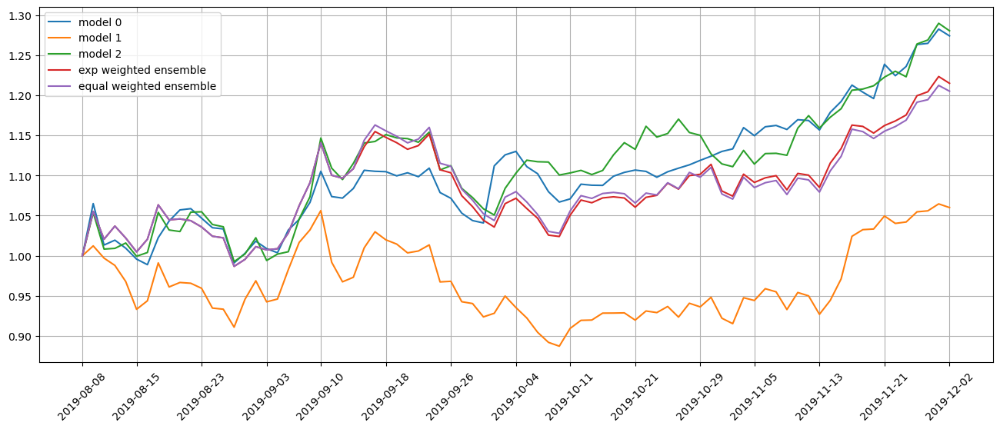

Standardization data are from 2018-04-30 to 2019-02-13
Training data are from 2019-02-14 to 2019-11-27
Testing data are from 2019-11-01 to 2019-12-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 5 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 3s 8ms/step - loss: 0.0516 - val_loss: 0.0555 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0517 - val_loss: 0.0477 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0516 - val_loss: 0.0478 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0516 - val_loss: 0.0478 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0516 - val_loss: 0.0477 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0515 - val_loss: 0.0482 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 7ms/step - loss: 0.0505 - val_loss: 0.0482 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.0508136765594745
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.04707653200685996
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.050811024321251355
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.04712052967345305
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05068243116263637
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.04690737527562656
Correlations between old and new weights
0.957420922540669
0.09868165635487842
0.9894861343243054
-0.6558389419532431
0.9691122305148415
0.592756230228637
Weight of model 0 is 0.35539048199810486
Weight of model 1 is 0.28694447484027275
Weight of model 2 is 0.3576650431616224
Testing data from 2019-11-01 to 2019-1

position on 2019-12-05 market open will be {'NOK': 0.10916753004379048, 'YUM': 0.12950449542611622, 'VTR': 0.11900211495380911, 'SHV': 0.11164868004977781, 'WKHS': 0.1200206596318747, 'FCEL': 0.10175126496742669, 'ETSY': 0.10332595865416165, 'XELA': 0.1269747460510655, 'HAS': 0.1320458727362095, 'ANET': 0.13115049706873702}
Total asset on 2019-12-05 will be 1.184591819582968
It should be the same as 1.1845918195829686
Testing data from 2019-11-06 to 2019-12-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2019-12-05 are ['XELA', 'CNP', 'NSP', 'YUM', 'AWR', 'VTR', 'SWX', 'EXPE', 'NOK', 'FCEL']
position on 2019-12-06 market open will be {'NOK': 0.11394486060140911, 'YUM': 0.13772317795020728, 'VTR': 0.1320453092885697, 'SWX': 0.11278780958882377, 'EXPE': 0.14023776951355646, 'NSP': 0.11112340380875922, 'FCEL': 0.09530360213942886, 'AWR': 0.1291925225987944, 'CNP': 0.14963159046877073, 'XELA': 0.14156414004705442}
Total asset on 2019-12-06 will be 1.2635541860053714
I

position on 2019-12-11 market open will be {'NOK': 0.1129625782625246, 'VTR': 0.12959323634062048, 'SWX': 0.11323836468556438, 'EXPE': 0.1465258650998971, 'NSP': 0.11199684217044716, 'FCEL': 0.08561170465225611, 'AWR': 0.1295524707025604, 'CNP': 0.1505384462865645, 'XELA': 0.15167586433612976, 'CWT': 0.1377925921146952}
Total asset on 2019-12-11 will be 1.2694879646512571
It should be the same as 1.2694879646512596
top_stocks by model 1 to buy on 2019-12-10 are ['PRG', 'SHV', 'XELA', 'VTR', 'YUM', 'EXPE', 'SWX', 'NOK', 'WKHS', 'FCEL']
position on 2019-12-11 market open will be {'NOK': 0.10379081548835076, 'YUM': 0.10403780946256617, 'SHV': 0.10484648265663545, 'WKHS': 0.11387419319698652, 'FCEL': 0.08166682380290043, 'VTR': 0.10384634769163864, 'SWX': 0.10904499909568999, 'XELA': 0.09884322214473704, 'EXPE': 0.10105143427223873, 'PRG': 0.09771624077682253}
Total asset on 2019-12-11 will be 1.0187183685885615
It should be the same as 1.0187183685885663
top_stocks by model 2 to buy on 20

top_stocks by model 1 to buy on 2019-12-13 are ['SHV', 'VTR', 'AWR', 'XELA', 'PRG', 'UHAL', 'SWX', 'EXPE', 'WKHS', 'FCEL']
position on 2019-12-16 market open will be {'WKHS': 0.11426959121993518, 'FCEL': 0.0986165482353307, 'VTR': 0.1019181675445329, 'SWX': 0.10861112864680936, 'EXPE': 0.10263248042681096, 'UHAL': 0.10325460848970357, 'AWR': 0.09956290781023557, 'PRG': 0.10362657966812748, 'SHV': 0.10451515559448109, 'XELA': 0.1117230973596177}
Total asset on 2019-12-16 will be 1.0487302649955799
It should be the same as 1.0487302649955845
top_stocks by model 2 to buy on 2019-12-13 are ['MED', 'AWR', 'SHAK', 'TRIP', 'SWX', 'UHAL', 'EXPE', 'CNP', 'WKHS', 'FCEL']
position on 2019-12-16 market open will be {'WKHS': 0.13989820588366972, 'FCEL': 0.12073446681024164, 'SWX': 0.1248633293986412, 'EXPE': 0.13477937552888752, 'SHAK': 0.128685773533952, 'UHAL': 0.12609229514433792, 'AWR': 0.1215840701026784, 'TRIP': 0.1259434373067576, 'MED': 0.12427481850651323, 'CNP': 0.1321496074505238}
Total 

position on 2019-12-19 market open will be {'WKHS': 0.1312716458740065, 'FCEL': 0.10478007637711798, 'SWX': 0.11072260869487521, 'EXPE': 0.09973239087899048, 'UHAL': 0.10530113910776542, 'PRG': 0.10339924987043302, 'XELA': 0.12613898088989095, 'CNP': 0.10648200226158432, 'ASND': 0.10452639359465203, 'SRNE': 0.10065061760574981}
Total asset on 2019-12-19 will be 1.0930051051550609
It should be the same as 1.0930051051550658
top_stocks by model 2 to buy on 2019-12-18 are ['WIT', 'MOS', 'HOG', 'SBH', 'UI', 'TSE', 'CNP', 'UHAL', 'WKHS', 'FCEL']
position on 2019-12-19 market open will be {'WKHS': 0.16071351568785597, 'FCEL': 0.1282803634896998, 'UHAL': 0.1285914740816181, 'CNP': 0.13633026475999951, 'MOS': 0.13398659527409335, 'SBH': 0.12654668841233851, 'UI': 0.12634152642556407, 'WIT': 0.12587168681750707, 'HOG': 0.12931443435487858, 'TSE': 0.13156796154799336}
Total asset on 2019-12-19 will be 1.3275445108515458
It should be the same as 1.3275445108515487
top_stocks by return weighted en

top_stocks by model 2 to buy on 2019-12-23 are ['CNP', 'PSTG', 'LZB', 'UHAL', 'KSS', 'SMCI', 'TSE', 'QRTEA', 'WKHS', 'FCEL']
position on 2019-12-24 market open will be {'WKHS': 0.1694268951750752, 'FCEL': 0.1546910318525311, 'UHAL': 0.12983586700981847, 'CNP': 0.13653420400649027, 'TSE': 0.12966968556424247, 'QRTEA': 0.13400667329857355, 'KSS': 0.13016286885667086, 'LZB': 0.1294169043149492, 'PSTG': 0.12802287506635843, 'SMCI': 0.12423304359973367}
Total asset on 2019-12-24 will be 1.3660000487444417
It should be the same as 1.366000048744443
top_stocks by return weighted ensemble to buy on 2019-12-23 are ['LZB', 'TSE', 'SWX', 'QRTEA', 'UHAL', 'TOON', 'CNP', 'AUPH', 'WKHS', 'FCEL']
position on 2019-12-24 market open will be {'WKHS': 0.15455599122254438, 'FCEL': 0.14111352118269443, 'SWX': 0.11320495206252845, 'UHAL': 0.12505599800794323, 'CNP': 0.1425280243663725, 'TOON': 0.12094562513215207, 'TSE': 0.12057599942252858, 'QRTEA': 0.13091085059544505, 'LZB': 0.1301311276001467, 'AUPH': 0

position on 2019-12-30 market open will be {'WKHS': 0.15393643249442654, 'FCEL': 0.27165254432609803, 'TSE': 0.1280475159874942, 'QRTEA': 0.14176322171256844, 'KSS': 0.13062434917783508, 'LZB': 0.1288455297284657, 'PSTG': 0.12937682077503285, 'QGEN': 0.12937192285540644, 'AXSM': 0.13112246553577064, 'UI': 0.12840279813221842}
Total asset on 2019-12-30 will be 1.4731436007253156
It should be the same as 1.4731436007253162
top_stocks by return weighted ensemble to buy on 2019-12-27 are ['DLTR', 'LZB', 'UHAL', 'PSTG', 'CNP', 'TOON', 'AUPH', 'WKHS', 'AXSM', 'FCEL']
position on 2019-12-30 market open will be {'WKHS': 0.1404251543702871, 'FCEL': 0.24780911090332514, 'UHAL': 0.12452515055866166, 'CNP': 0.1427941293811352, 'TOON': 0.13756849586869582, 'LZB': 0.12955659972363207, 'PSTG': 0.12116731680575979, 'AUPH': 0.12586046332609152, 'AXSM': 0.12294954228534495, 'DLTR': 0.12168498943236788}
Total asset on 2019-12-30 will be 1.4143409526553004
It should be the same as 1.4143409526553015
top_s

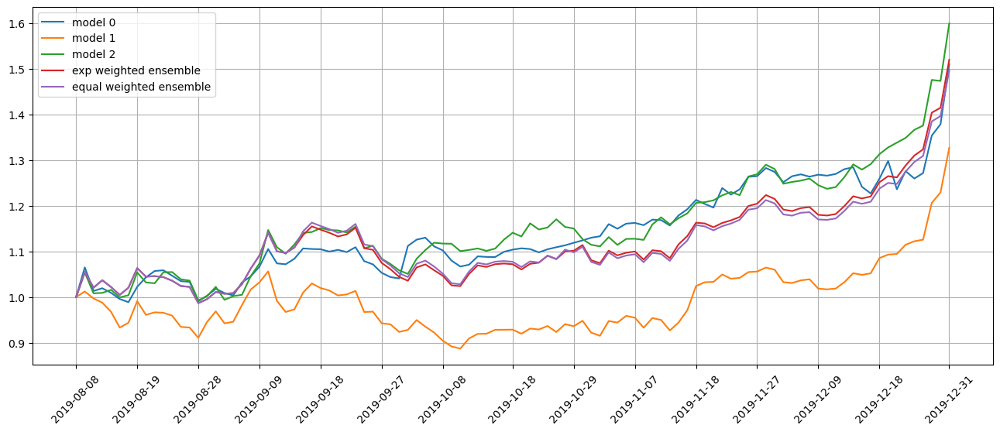

Standardization data are from 2018-05-29 to 2019-03-14
Training data are from 2019-03-15 to 2019-12-27
Testing data are from 2019-12-02 to 2020-01-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 6 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 3s 8ms/step - loss: 0.0536 - val_loss: 0.0444 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0443 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0447 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0444 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0537 - val_loss: 0.0443 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0446 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 7ms/step - loss: 0.0533 - val_loss: 0.0445 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0552 - val_loss: 0.0442 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0536 - val_loss: 0.0445 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0537 - val_loss: 0.0443 - lr: 0.0100
Epoch 8/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0535 - val_loss: 0.0446 - lr: 0.0100
Epoch 9/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0535 - val_loss: 0.0443 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0532 - val_loss: 0.0445 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0532 - val_loss: 0.0443 - lr: 0.0050
Epoch 12/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0531 - val_loss: 0.0

Testing data from 2019-12-04 to 2020-01-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-01-03 are ['PSTG', 'UNG', 'WKHS', 'ROL', 'SRNE', 'ODFL', 'QRTEA', 'TOON', 'AUPH', 'FCEL']
position on 2020-01-06 market open will be {'FCEL': 0.3731378324533536, 'TOON': 0.10978405130949, 'AUPH': 0.12657789850431228, 'QRTEA': 0.13422106640369216, 'PSTG': 0.12261578240956104, 'WKHS': 0.11931696161130508, 'SRNE': 0.1182571595434375, 'ROL': 0.15239297142533775, 'UNG': 0.15322233744695782, 'ODFL': 0.15061545217704608}
Total asset on 2020-01-06 will be 1.5601415132844907
It should be the same as 1.5601415132844934
top_stocks by model 1 to buy on 2020-01-03 are ['ROL', 'PSTG', 'WKHS', 'CENN', 'QRTEA', 'ODFL', 'AXSM', 'TOON', 'AUPH', 'FCEL']
position on 2020-01-06 market open will be {'WKHS': 0.12059593696234344, 'FCEL': 0.355944105317627, 'TOON': 0.15377692068770432, 'AUPH': 0.11542970230996556, 'PSTG': 0.11677987539000662, 'QRTEA': 0.09777821472495658, 'ROL': 0.1009523358766661

position on 2020-01-09 market open will be {'FCEL': 0.3828296991308336, 'TOON': 0.1387984085950319, 'AUPH': 0.13061101552787496, 'QRTEA': 0.13123468414683215, 'DBI': 0.14799752114004558, 'ITCI': 0.12672047503892223, 'YEXT': 0.15120344844352515, 'ROL': 0.13494200289535466, 'CVLT': 0.133143371760025, 'ODFL': 0.13583071150105253}
Total asset on 2020-01-09 will be 1.613311338179495
It should be the same as 1.6133113381794981
top_stocks by model 1 to buy on 2020-01-08 are ['CVLT', 'JNPR', 'UPS', 'IDCC', 'ODFL', 'WKHS', 'QRTEA', 'AUPH', 'ITCI', 'FCEL']
position on 2020-01-09 market open will be {'WKHS': 0.13443481497441565, 'FCEL': 0.36518938283529767, 'AUPH': 0.1191076074017082, 'QRTEA': 0.09560267601567668, 'IDCC': 0.10504121816805138, 'ITCI': 0.09050159729987974, 'JNPR': 0.10306834907972263, 'ODFL': 0.1313035185189195, 'CVLT': 0.1287057469284357, 'UPS': 0.1320713285168302}
Total asset on 2020-01-09 will be 1.4050262397389321
It should be the same as 1.4050262397389373
top_stocks by model 

top_stocks by model 1 to buy on 2020-01-13 are ['YEXT', 'WKHS', 'IFF', 'QRTEA', 'CARS', 'TOON', 'AXSM', 'AUPH', 'FCEL', 'ITCI']
position on 2020-01-14 market open will be {'WKHS': 0.1423427452670283, 'FCEL': 0.31742199810058425, 'AUPH': 0.11152545928401758, 'QRTEA': 0.10648035803567689, 'ITCI': 0.08905005999167205, 'TOON': 0.10970914178580322, 'IFF': 0.11898964339267998, 'YEXT': 0.122189494169396, 'AXSM': 0.11211090091185999, 'CARS': 0.1175007473494356}
Total asset on 2020-01-14 will be 1.3473205482881487
It should be the same as 1.3473205482881538
top_stocks by model 2 to buy on 2020-01-13 are ['NNDM', 'CVLT', 'AXSM', 'VUZI', 'AUPH', 'TOON', 'CENN', 'WKHS', 'ITCI', 'FCEL']
position on 2020-01-14 market open will be {'WKHS': 0.17426766360864884, 'FCEL': 0.38861404480577394, 'AUPH': 0.12696004667931482, 'CENN': 0.10578577003100255, 'TOON': 0.15428447690675456, 'ITCI': 0.11393027733180097, 'AXSM': 0.11882350062562683, 'VUZI': 0.10905264228150442, 'CVLT': 0.13233687639909408, 'NNDM': 0.17

position on 2020-01-17 market open will be {'FCEL': 0.35440320613800164, 'AUPH': 0.11282688082092471, 'QRTEA': 0.10889761686465496, 'ITCI': 0.08992773386264814, 'EXPRQ': 0.12574409148290203, 'PBI': 0.1271270405088541, 'CVLT': 0.12595638674582205, 'SPR': 0.11161888352299491, 'AXSM': 0.13279218017877698, 'CENN': 0.13060755423213485}
Total asset on 2020-01-17 will be 1.4199015743577084
It should be the same as 1.4199015743577144
top_stocks by model 2 to buy on 2020-01-16 are ['UUUU', 'PBI', 'CVLT', 'VUZI', 'AXSM', 'TOON', 'CENN', 'WKHS', 'ITCI', 'FCEL']
position on 2020-01-17 market open will be {'WKHS': 0.16797466833821642, 'FCEL': 0.4338894728580873, 'CENN': 0.09602092972044847, 'TOON': 0.16457011115282394, 'ITCI': 0.11505316964132366, 'VUZI': 0.11251463452830877, 'CVLT': 0.1394168629381372, 'UUUU': 0.15686158567670022, 'AXSM': 0.14067238654506345, 'PBI': 0.1373208835317116}
Total asset on 2020-01-17 will be 1.6642947049308205
It should be the same as 1.664294704930821
top_stocks by ret

top_stocks by model 2 to buy on 2020-01-22 are ['CVLT', 'NNDM', 'TOON', 'UUUU', 'CSGS', 'VUZI', 'CENN', 'WKHS', 'ITCI', 'FCEL']
position on 2020-01-23 market open will be {'WKHS': 0.1520001269676038, 'FCEL': 0.36786281394490017, 'CENN': 0.08625608940989438, 'TOON': 0.20571263587567276, 'ITCI': 0.10848858048658738, 'VUZI': 0.11597661989675963, 'CSGS': 0.14182901891962932, 'CVLT': 0.1392049933590603, 'NNDM': 0.1420905386691358, 'UUUU': 0.1393580308158111}
Total asset on 2020-01-23 will be 1.5987794483450541
It should be the same as 1.5987794483450546
top_stocks by return weighted ensemble to buy on 2020-01-22 are ['JDST', 'PBI', 'YANG', 'GDOT', 'SPR', 'CVLT', 'WKHS', 'AUPH', 'ITCI', 'FCEL']
position on 2020-01-23 market open will be {'WKHS': 0.1386588018694133, 'FCEL': 0.3355748317551215, 'AUPH': 0.11245590700524717, 'ITCI': 0.10513924821897412, 'CVLT': 0.12790570778651164, 'PBI': 0.12407355143336615, 'SPR': 0.12282604672236008, 'JDST': 0.1454918426784812, 'GDOT': 0.14867383411008384, 'Y

top_stocks by model 2 to buy on 2020-01-27 are ['UUUU', 'ACB', 'AUPH', 'AMC', 'TOON', 'VUZI', 'CENN', 'WKHS', 'ITCI', 'FCEL']
position on 2020-01-28 market open will be {'WKHS': 0.1481275159139582, 'FCEL': 0.3131550060478458, 'CENN': 0.08137366925461735, 'ITCI': 0.09976457670778317, 'VUZI': 0.107321649597279, 'UUUU': 0.1342904708184546, 'AMC': 0.14874948196273927, 'TOON': 0.14850358455439272, 'AUPH': 0.15486469169886083, 'ACB': 0.15688543156579898}
Total asset on 2020-01-28 will be 1.4930360781217284
It should be the same as 1.4930360781217298
top_stocks by return weighted ensemble to buy on 2020-01-27 are ['GDOT', 'SRNE', 'APLS', 'ATI', 'PBI', 'X', 'WKHS', 'AUPH', 'ITCI', 'FCEL']
position on 2020-01-28 market open will be {'WKHS': 0.13512609686766555, 'FCEL': 0.2856688267586628, 'AUPH': 0.11032067585430998, 'ITCI': 0.0966845777398414, 'PBI': 0.11643825584385158, 'X': 0.1349075226021677, 'ATI': 0.14382849789458635, 'APLS': 0.13406455757507083, 'GDOT': 0.12587068993885037, 'SRNE': 0.119

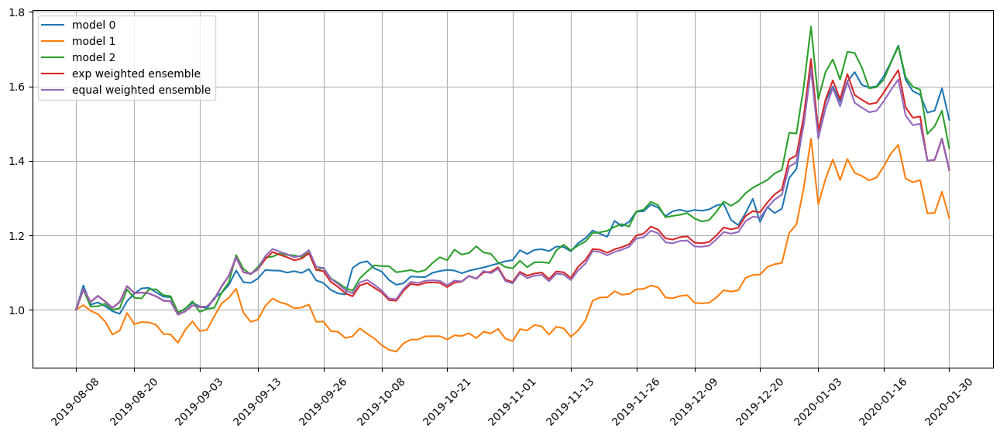

Standardization data are from 2018-06-26 to 2019-04-11
Training data are from 2019-04-12 to 2020-01-28
Testing data are from 2019-12-31 to 2020-02-26
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 7 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 3s 9ms/step - loss: 0.0519 - val_loss: 0.0499 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 8ms/step - loss: 0.0520 - val_loss: 0.0501 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0519 - val_loss: 0.0499 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0519 - val_loss: 0.0500 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0534 - val_loss: 0.0499 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0519 - val_loss: 0.0499 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 6ms/step - loss: 0.0518 - val_loss: 0.0502 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0518 - val_loss: 0.0504 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0516 - val_loss: 0.0504 - lr: 0.0050
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.0501 - lr: 0.0050
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0519 - val_loss: 0.0499 - lr: 0.0050
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.0500 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0516 - val_loss: 0.0501 - lr: 0.0050
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0514 - val_loss: 0.0505 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0513 - val_loss

position on 2020-02-03 market open will be {'WKHS': 0.13433891215693194, 'FCEL': 0.2527370119738522, 'AUPH': 0.11317900958934195, 'ITCI': 0.09668718476187196, 'APLS': 0.1333246674030833, 'X': 0.12885174843416872, 'CEIX': 0.12336123243525797, 'RAMP': 0.12512597318468455, 'ATI': 0.12591460424904624, 'AZO': 0.12508384033717979}
Total asset on 2020-02-03 will be 1.358604184525417
It should be the same as 1.3586041845254186
Testing data from 2020-01-03 to 2020-01-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-03 are ['WKHS', 'WAFD', 'APLS', 'AZO', 'CXW', 'GEO', 'AXSM', 'AUPH', 'ITCI', 'FCEL']
position on 2020-02-04 market open will be {'FCEL': 0.2681423225568546, 'AUPH': 0.11683636587002982, 'ITCI': 0.10790855998134945, 'GEO': 0.14677252924280507, 'AZO': 0.14037114271324358, 'WKHS': 0.14968793887815365, 'WAFD': 0.1474977204590157, 'APLS': 0.15612342104421667, 'AXSM': 0.15614255274312117, 'CXW': 0.14564489182269036}
Total asset on 2020-02-04 will be 1.535127445

Testing data from 2020-01-08 to 2020-02-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-02-06 are ['SBH', 'RAMP', 'TNK', 'WKHS', 'BTU', 'APLS', 'CEIX', 'AUPH', 'ITCI', 'FCEL']
position on 2020-02-07 market open will be {'FCEL': 0.2681423225568546, 'AUPH': 0.12347549897315406, 'ITCI': 0.1007241070196149, 'CEIX': 0.17443657048415237, 'APLS': 0.15097844765350987, 'RAMP': 0.1483896704297274, 'SBH': 0.15134573707933924, 'WKHS': 0.15007198917333117, 'TNK': 0.14029006788429887, 'BTU': 0.14397446505360698}
Total asset on 2020-02-07 will be 1.551828876307586
It should be the same as 1.5518288763075894
top_stocks by model 1 to buy on 2020-02-06 are ['GBX', 'GME', 'ATI', 'ARCH', 'AUPH', 'CENN', 'WKHS', 'CEIX', 'ITCI', 'FCEL']
position on 2020-02-07 market open will be {'FCEL': 0.2557866579026711, 'AUPH': 0.11260054288671943, 'ITCI': 0.07193543560406705, 'WKHS': 0.10283623934905028, 'ATI': 0.13297843129678108, 'CENN': 0.1000351189504636, 'CEIX': 0.13557814829651924, 'GBX

top_stocks by model 0 to buy on 2020-02-11 are ['AYI', 'ARCH', 'GBX', 'LYG', 'AUPH', 'AXSM', 'CEIX', 'ESGU', 'ITCI', 'FCEL']
position on 2020-02-12 market open will be {'FCEL': 0.31821709029593903, 'AUPH': 0.12000081481197704, 'ITCI': 0.10322921481970987, 'CEIX': 0.14323504200431095, 'GBX': 0.14858410634299687, 'LYG': 0.14542001248852243, 'ESGU': 0.14531006048914621, 'AYI': 0.14594146009014797, 'AXSM': 0.1452678824990318, 'ARCH': 0.149072197767161}
Total asset on 2020-02-12 will be 1.5642778816089402
It should be the same as 1.5642778816089433
top_stocks by model 1 to buy on 2020-02-11 are ['EQT', 'AA', 'GME', 'AUPH', 'ARCH', 'WKHS', 'CEIX', 'ESGU', 'ITCI', 'FCEL']
position on 2020-02-12 market open will be {'FCEL': 0.3035540426373845, 'AUPH': 0.10943188735455199, 'ITCI': 0.07372454077627658, 'WKHS': 0.1136968351464352, 'CEIX': 0.11132723896267444, 'GME': 0.12544783189534858, 'ARCH': 0.12179471739102116, 'EQT': 0.13173142361558673, 'ESGU': 0.11283336231674665, 'AA': 0.11529119674762425

top_stocks by model 1 to buy on 2020-02-14 are ['BTU', 'RRC', 'AA', 'EQT', 'AUPH', 'ARCH', 'WKHS', 'CEIX', 'ITCI', 'FCEL']
position on 2020-02-18 market open will be {'FCEL': 0.32050377686648823, 'AUPH': 0.10620664733883327, 'ITCI': 0.0778428506890984, 'WKHS': 0.11233925581669858, 'CEIX': 0.09842179033852097, 'ARCH': 0.1159721953225602, 'EQT': 0.1332255404277226, 'AA': 0.11225721734196728, 'RRC': 0.12390093127318798, 'BTU': 0.11644609429473465}
Total asset on 2020-02-18 will be 1.3171162997098051
It should be the same as 1.3171162997098123
top_stocks by model 2 to buy on 2020-02-14 are ['ATRA', 'TECK', 'GME', 'RYTM', 'EQT', 'AA', 'ARCH', 'CEIX', 'ITCI', 'FCEL']
position on 2020-02-18 market open will be {'FCEL': 0.39238701113633995, 'ITCI': 0.09959182024286507, 'CEIX': 0.11179252698647368, 'EQT': 0.11492322756693228, 'ARCH': 0.12511708599351137, 'AA': 0.12668189002347646, 'RYTM': 0.13297446635911364, 'GME': 0.1255390715226771, 'ATRA': 0.13479684797440863, 'TECK': 0.1222362343479609}
To

top_stocks by model 1 to buy on 2020-02-20 are ['CENN', 'AUPH', 'AA', 'ARCH', 'CHRW', 'CEIX', 'WKHS', 'AXSM', 'ITCI', 'FCEL']
position on 2020-02-21 market open will be {'FCEL': 0.39138439458207225, 'AUPH': 0.11520337516814695, 'ITCI': 0.08304137905444027, 'WKHS': 0.1303271236749467, 'CEIX': 0.0856581563384401, 'ARCH': 0.11031602694788212, 'AA': 0.11565238608431935, 'CHRW': 0.1287239454493906, 'AXSM': 0.12761956421601736, 'CENN': 0.1259291150532095}
Total asset on 2020-02-21 will be 1.4138554665688579
It should be the same as 1.4138554665688652
top_stocks by model 2 to buy on 2020-02-20 are ['WKHS', 'RYTM', 'QD', 'EQT', 'AA', 'ARCH', 'ACMR', 'AXSM', 'ITCI', 'FCEL']
position on 2020-02-21 market open will be {'FCEL': 0.47916487692261867, 'ITCI': 0.10624279586754207, 'ARCH': 0.11901490518232592, 'AA': 0.1305133264639466, 'RYTM': 0.13796007902960386, 'WKHS': 0.14428870306651098, 'EQT': 0.1264033587448448, 'AXSM': 0.11783848199056197, 'ACMR': 0.12542426700538958, 'QD': 0.13499459076332362}

position on 2020-02-26 market open will be {'FCEL': 0.3405352702681489, 'ITCI': 0.0779441229798704, 'WKHS': 0.12252106194921517, 'CEIX': 0.08409815489914613, 'ARCH': 0.10547085960278191, 'WES': 0.10762294017523401, 'CHRW': 0.11433799691872035, 'MMM': 0.1117634725586286, 'NNDM': 0.11693213183715098, 'AM': 0.11035072764275097}
Total asset on 2020-02-26 will be 1.2915767388316397
It should be the same as 1.2915767388316475
top_stocks by model 2 to buy on 2020-02-25 are ['PFE', 'CHRW', 'NGVT', 'EQT', 'INO', 'CEIX', 'ARCH', 'MMM', 'ITCI', 'FCEL']
position on 2020-02-26 market open will be {'FCEL': 0.4169112083277797, 'ITCI': 0.09972138759155369, 'ARCH': 0.11378767621003855, 'CEIX': 0.12969540443564595, 'INO': 0.11517467353693386, 'MMM': 0.12034106415472187, 'CHRW': 0.12540219769998287, 'EQT': 0.1182271535802094, 'PFE': 0.12343561572914415, 'NGVT': 0.11537172743511206}
Total asset on 2020-02-26 will be 1.4780681087011203
It should be the same as 1.478068108701122
top_stocks by return weighte

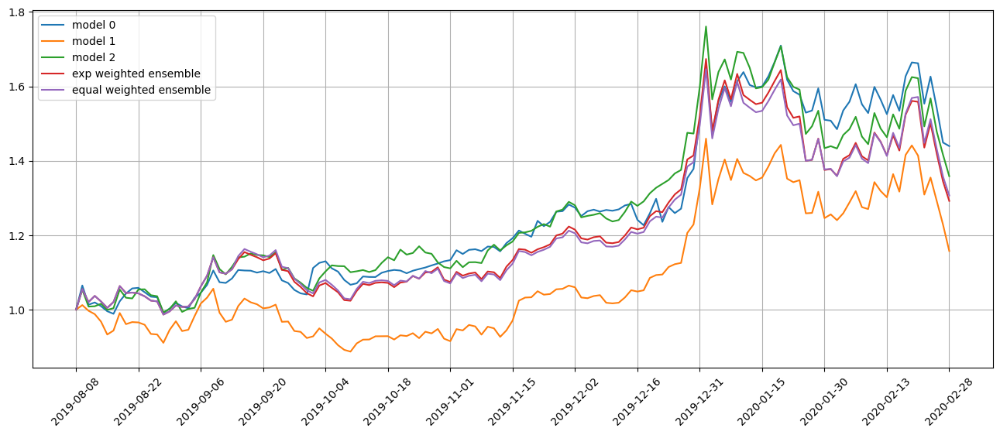

Standardization data are from 2018-07-25 to 2019-05-10
Training data are from 2019-05-13 to 2020-02-26
Testing data are from 2020-01-30 to 2020-03-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 8 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0512 - val_loss: 0.1017 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0512 - val_loss: 0.1003 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0512 - val_loss: 0.1005 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0511 - val_loss: 0.1007 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0513 - val_loss: 0.0999 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0512 - val_loss: 0.1012 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 6ms/step - loss: 0.0506 - val_loss: 0.1016 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0505 - val_loss: 0.1014 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0505 - val_loss: 0.1015 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.06098279616376963
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.7319161537402473
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06102720098850798
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.7425270940083919
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.060998020706347925
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.7580785642156346
Correlations between old and new weights
0.9880757238103736
-0.3516727954280112
0.99394

position on 2020-03-04 market open will be {'CHRW': 0.14055136446114347, 'AM': 0.1312470412255717, 'FNKO': 0.12894639046827402, 'EXTR': 0.1339574494000522, 'NNDM': 0.14152419263556204, 'TKO': 0.13375367070529748, 'MNRO': 0.13358068568539616, 'TDC': 0.13537714105901494, 'TOON': 0.14866215613456926, 'WES': 0.13447757798331172}
Total asset on 2020-03-04 will be 1.362077669758191
It should be the same as 1.362077669758193
Testing data from 2020-02-04 to 2020-03-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-04 are ['MNRO', 'EQT', 'FNKO', 'GLPG', 'TSLA', 'AM', 'ITCI', 'NNDM', 'CEIX', 'FCEL']
position on 2020-03-05 market open will be {'FCEL': 0.3117558458442858, 'ITCI': 0.10190576011140166, 'NNDM': 0.1395895846522673, 'FNKO': 0.12729154779711882, 'GLPG': 0.13150442651365618, 'EQT': 0.13258952427513876, 'CEIX': 0.1514809608070373, 'MNRO': 0.13519982383376775, 'TSLA': 0.131830724361027, 'AM': 0.13591503610052547}
Total asset on 2020-03-05 will be 1.4990632342962

Testing data from 2020-02-07 to 2020-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-03-09 are ['CODX', 'XELA', 'GLPG', 'TDC', 'FNKO', 'ITCI', 'NSP', 'NNDM', 'CEIX', 'FCEL']
position on 2020-03-10 market open will be {'FCEL': 0.26814232255685466, 'ITCI': 0.09330332704564212, 'NNDM': 0.11470151637173558, 'GLPG': 0.12323370762982289, 'CEIX': 0.15273911312548408, 'TDC': 0.13885697879584316, 'FNKO': 0.10754103303588204, 'NSP': 0.10926543777573161, 'CODX': 0.06935835165887998, 'XELA': 0.10438782279356382}
Total asset on 2020-03-10 will be 1.281529610789437
It should be the same as 1.28152961078944
top_stocks by model 1 to buy on 2020-03-09 are ['UAL', 'PRG', 'UI', 'NMIH', 'LPSN', 'HLF', 'PRO', 'ACIW', 'ARCH', 'BRC']
position on 2020-03-10 market open will be {'BRC': 0.12240033563039167, 'PRO': 0.11530965876275902, 'HLF': 0.10791548382997505, 'PRG': 0.11255414488380462, 'UAL': 0.11526198674582441, 'UI': 0.11015150504579924, 'ARCH': 0.11776119076216114, 'NMIH': 0

position on 2020-03-13 market open will be {'FCEL': 0.20352971372195985, 'CEIX': 0.11725934493076048, 'TDC': 0.1226814087486821, 'CARS': 0.11466267956017236, 'GSY': 0.09068503057186206, 'NEAR': 0.09145516514717689, 'DXC': 0.08904754951211659, 'JPST': 0.09059847030644554, 'ENPH': 0.09612048882656199, 'ENLC': 0.0897197005449395}
Total asset on 2020-03-13 will be 1.105759551870675
It should be the same as 1.1057595518706773
top_stocks by model 1 to buy on 2020-03-12 are ['PRG', 'LPSN', 'ACIW', 'FLRN', 'NEAR', 'CODX', 'GSY', 'JPST', 'DRIP', 'FTSM']
position on 2020-03-13 market open will be {'LPSN': 0.11572095556312718, 'ACIW': 0.10902621703104982, 'FTSM': 0.1132569475650503, 'PRG': 0.10075528407526724, 'CODX': 0.16013174065577435, 'DRIP': 0.12122617893855107, 'NEAR': 0.10446701299804666, 'GSY': 0.1035873069851584, 'FLRN': 0.10002500665345847, 'JPST': 0.10348843129718792}
Total asset on 2020-03-13 will be 1.1316850817626642
It should be the same as 1.1316850817626714
top_stocks by model 2 

position on 2020-03-18 market open will be {'FTSM': 0.11221319363686573, 'DRIP': 0.09839210067741685, 'SABR': 0.07948979617487445, 'BIL': 0.10417563186614313, 'YUM': 0.08703597935782223, 'CODX': 0.0869675934229479, 'FHI': 0.09140095538038598, 'INO': 0.10160816500086503, 'UAL': 0.07906353554697586, 'LPSN': 0.09053659166940176}
Total asset on 2020-03-18 will be 0.9308835427336916
It should be the same as 0.9308835427336989
top_stocks by model 2 to buy on 2020-03-17 are ['SPIB', 'SPAB', 'VTEB', 'ITM', 'CENN', 'GUSH', 'SHM', 'CEIX', 'DRIP', 'FTSM']
position on 2020-03-18 market open will be {'CEIX': 0.18608890101918427, 'GUSH': 0.0875652842287698, 'VTEB': 0.11894518462369952, 'SPAB': 0.10864788730616094, 'ITM': 0.11347485348199368, 'DRIP': 0.16930016603661005, 'SHM': 0.11309185539636697, 'CENN': 0.1347507735003108, 'FTSM': 0.11333134372227072, 'SPIB': 0.11112288639876604}
Total asset on 2020-03-18 will be 1.2563191357141312
It should be the same as 1.2563191357141328
top_stocks by return w

position on 2020-03-23 market open will be {'GUSH': 0.07279278775238086, 'GRPN': 0.1236901443322692, 'FLR': 0.17639554369805124, 'FLOT': 0.1154142690977474, 'GSY': 0.11457426811387954, 'NEAR': 0.11623138919999577, 'FLRN': 0.11400029263563831, 'JPST': 0.11229615616305116, 'CEIX': 0.09329669215657335, 'MPLX': 0.10857901797945156}
Total asset on 2020-03-23 will be 1.147270561129036
It should be the same as 1.1472705611290384
top_stocks by equal weighted ensemble to buy on 2020-03-20 are ['MPLX', 'FLR', 'CEIX', 'GRPN', 'GUSH', 'FLOT', 'NEAR', 'FLRN', 'JPST', 'GSY']
position on 2020-03-23 market open will be {'GUSH': 0.06553506978618548, 'GRPN': 0.1219182314885289, 'FLR': 0.17386860405266202, 'FLOT': 0.11840562762368013, 'GSY': 0.11754385511949222, 'NEAR': 0.11924392620934898, 'FLRN': 0.11695500308869008, 'JPST': 0.11520669804659694, 'CEIX': 0.09571479745417329, 'MPLX': 0.11139321741691588}
Total asset on 2020-03-23 will be 1.1557850302862727
It should be the same as 1.1557850302862738
Test

top_stocks by model 0 to buy on 2020-03-26 are ['CEIX', 'BTU', 'CODX', 'MPLX', 'GUSH', 'FLRN', 'NEAR', 'GSY', 'JPST', 'FCEL']
position on 2020-03-27 market open will be {'FCEL': 0.2487585481223043, 'GSY': 0.09608530302848557, 'CODX': 0.0941801485652929, 'GUSH': 0.08818221184157855, 'NEAR': 0.09584036247874128, 'FLRN': 0.09456279810971435, 'JPST': 0.09586326502400686, 'CEIX': 0.09191382060901775, 'MPLX': 0.09229501174954388, 'BTU': 0.0859953190399871}
Total asset on 2020-03-27 will be 1.0836767885686702
It should be the same as 1.0836767885686727
top_stocks by model 1 to buy on 2020-03-26 are ['CNP', 'STIP', 'AGNC', 'BAC-PL', 'SPSB', 'PCY', 'FIXD', 'HYD', 'HYMB', 'FTSM']
position on 2020-03-27 market open will be {'FIXD': 0.0982432765434457, 'PCY': 0.10015962938028942, 'AGNC': 0.089275802548284, 'STIP': 0.09074330412253215, 'CNP': 0.0908882855403887, 'HYD': 0.09402875490064462, 'FTSM': 0.09085299694578956, 'BAC-PL': 0.08564745507469437, 'HYMB': 0.09383114480485258, 'SPSB': 0.08995196364

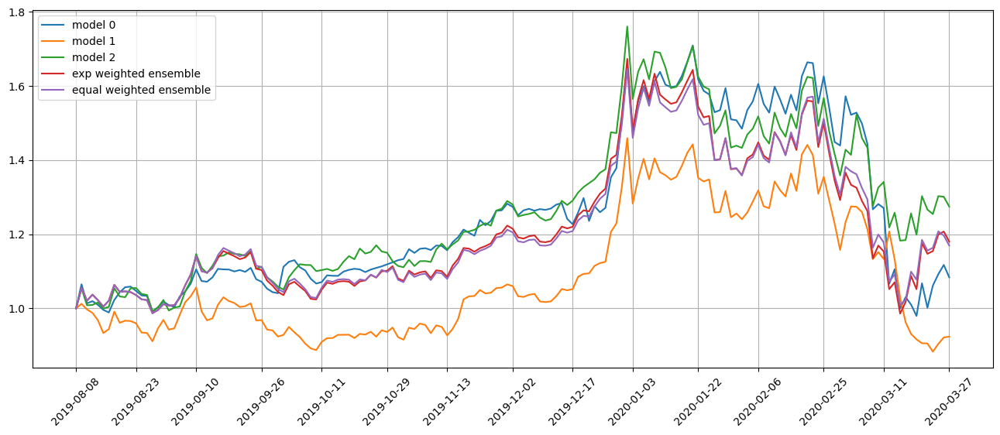

Standardization data are from 2018-08-22 to 2019-06-10
Training data are from 2019-06-11 to 2020-03-25
Testing data are from 2020-02-28 to 2020-04-23
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 9 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0527 - val_loss: 0.4756 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0526 - val_loss: 0.5116 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0526 - val_loss: 0.4970 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0525 - val_loss: 0.5077 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0525 - val_loss: 0.5484 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0525 - val_loss: 0.4947 - lr: 0.0100
Epoch 7/500
305/305 [=

305/305 [==============================] - 2s 6ms/step - loss: 0.0518 - val_loss: 0.5243 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.5025 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.4990 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.5305 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0517 - val_loss: 0.5119 - lr: 0.0012
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.13720432721961706
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.2640197673665582
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.1367835326676807
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.26127175753909937
96/96 [==============================] - 0s

top_stocks by model 2 to buy on 2020-03-31 are ['IGSB', 'FLRN', 'ITCI', 'HYD', 'ZOM', 'SPIB', 'FPE', 'FCEL', 'FLOT', 'FTSM']
position on 2020-04-01 market open will be {'FCEL': 0.11555970940693483, 'FTSM': 0.12620127755260083, 'ITCI': 0.12300602201699118, 'ZOM': 0.14831399675205628, 'FLOT': 0.13758819687763238, 'FPE': 0.1304549114107961, 'IGSB': 0.13655345969728494, 'FLRN': 0.13704593641890525, 'HYD': 0.12736357051760777, 'SPIB': 0.1334731013989472}
Total asset on 2020-04-01 will be 1.3155601820497562
It should be the same as 1.3155601820497567
top_stocks by return weighted ensemble to buy on 2020-03-31 are ['SPR', 'BJRI', 'SAVE', 'CARS', 'HYD', 'SPIB', 'INO', 'FPE', 'FLOT', 'FTSM']
position on 2020-04-01 market open will be {'INO': 0.09365008917448937, 'FLOT': 0.11621861842863876, 'SPR': 0.10502531739429703, 'FPE': 0.11019324270145985, 'SPIB': 0.11274266102758294, 'CARS': 0.10058336408489578, 'HYD': 0.10758203493908305, 'SAVE': 0.10258657473583585, 'FTSM': 0.11553958297394934, 'BJRI':

position on 2020-04-06 market open will be {'INO': 0.10849082048906496, 'JPST': 0.10954504885586883, 'DRIP': 0.09044119347705283, 'BIL': 0.10796121525009446, 'SCO': 0.10458871200334968, 'GSY': 0.10498962858219778, 'PUMP': 0.10634872446775818, 'OVV': 0.10376168090834793, 'CNP': 0.10529003497716766, 'GVI': 0.10538505271335903}
Total asset on 2020-04-06 will be 1.046802111724258
It should be the same as 1.0468021117242614
top_stocks by equal weighted ensemble to buy on 2020-04-03 are ['NEAR', 'PUMP', 'OVV', 'SCO', 'GSY', 'INO', 'GVI', 'JPST', 'DRIP', 'BIL']
position on 2020-04-06 market open will be {'INO': 0.10699113727970574, 'JPST': 0.11115170350516235, 'DRIP': 0.09146579956404234, 'BIL': 0.1091843052387521, 'SCO': 0.10577359498453473, 'GSY': 0.10617905353757921, 'NEAR': 0.10628874096529244, 'PUMP': 0.10755354658745835, 'OVV': 0.10493719447431975, 'GVI': 0.10657895741913023}
Total asset on 2020-04-06 will be 1.0561040335559753
It should be the same as 1.056104033555977
Testing data fro

position on 2020-04-09 market open will be {'JPST': 0.10978750402790421, 'GSY': 0.10537210511009594, 'FTSM': 0.10367606208528156, 'NEAR': 0.10444633080562546, 'DRIP': 0.07863094286590319, 'BIL': 0.10397305302004425, 'IGSB': 0.11298325959389253, 'MINT': 0.11106729054680356, 'SPSB': 0.11142177014168703, 'ERY': 0.09283488939732241}
Total asset on 2020-04-09 will be 1.0341932075945561
It should be the same as 1.0341932075945601
top_stocks by equal weighted ensemble to buy on 2020-04-08 are ['SPSB', 'GSY', 'MINT', 'IGSB', 'JPST', 'NEAR', 'BIL', 'ERY', 'FTSM', 'DRIP']
position on 2020-04-09 market open will be {'JPST': 0.11139771467295898, 'GSY': 0.10656586313278386, 'FTSM': 0.10482279898772888, 'NEAR': 0.10560158747192813, 'DRIP': 0.07950066150726506, 'BIL': 0.10512307487041239, 'IGSB': 0.11356061511122585, 'MINT': 0.11163485527473717, 'SPSB': 0.11199114629505325, 'ERY': 0.09330928477047086}
Total asset on 2020-04-09 will be 1.0435076020945617
It should be the same as 1.0435076020945644
Tes

top_stocks by model 0 to buy on 2020-04-15 are ['IGSB', 'DRIP', 'GSY', 'MINT', 'SPSB', 'BIL', 'JPST', 'ERY', 'NEAR', 'FTSM']
position on 2020-04-16 market open will be {'JPST': 0.10252749292950515, 'DRIP': 0.06380772251395979, 'FTSM': 0.10330073560305192, 'BIL': 0.10827849852224161, 'NEAR': 0.10786149384881437, 'GSY': 0.09847387416862236, 'IGSB': 0.09860076916775008, 'MINT': 0.0984050674958877, 'ERY': 0.09709769240687229, 'SPSB': 0.09883677144928198}
Total asset on 2020-04-16 will be 0.9771901181059843
It should be the same as 0.9771901181059872
top_stocks by model 1 to buy on 2020-04-15 are ['IGSB', 'ICSH', 'MINT', 'SPSB', 'GSY', 'JPST', 'BIL', 'ERY', 'NEAR', 'FTSM']
position on 2020-04-16 market open will be {'JPST': 0.08665032974246799, 'BIL': 0.08452411889148569, 'FTSM': 0.08374790486967595, 'GSY': 0.10160857413402036, 'NEAR': 0.09899133966133437, 'ICSH': 0.09671235546715644, 'IGSB': 0.09677933160418585, 'MINT': 0.09658724510063697, 'ERY': 0.09530402096010705, 'SPSB': 0.09701097425

top_stocks by model 0 to buy on 2020-04-20 are ['IVR', 'ARI', 'MFA', 'TWO', 'NYMT', 'RWT', 'JPST', 'DRIP', 'BIL', 'FTSM']
position on 2020-04-21 market open will be {'JPST': 0.10277326179292606, 'DRIP': 0.056491597581299666, 'FTSM': 0.10337021147076553, 'BIL': 0.1083021490565348, 'NYMT': 0.09310913325409341, 'MFA': 0.09434417610279236, 'RWT': 0.09780311319002767, 'IVR': 0.10409436456542345, 'TWO': 0.0923429443424018, 'ARI': 0.08831031082638971}
Total asset on 2020-04-21 will be 0.9409412621826514
It should be the same as 0.9409412621826544
top_stocks by model 1 to buy on 2020-04-20 are ['EPR', 'MMSI', 'DRIP', 'ICSH', 'TWO', 'GSY', 'NEAR', 'JPST', 'BIL', 'FTSM']
position on 2020-04-21 market open will be {'JPST': 0.08685803942547463, 'BIL': 0.08454258091857073, 'FTSM': 0.08380423029975202, 'GSY': 0.10136461814206177, 'NEAR': 0.09895104102374386, 'EPR': 0.08770663056288085, 'ICSH': 0.09694560139772541, 'DRIP': 0.08189895174794837, 'TWO': 0.08832668107669606, 'MMSI': 0.093826827344831}
To

position on 2020-04-24 market open will be {'JPST': 0.08682342004447823, 'BIL': 0.08453334638308486, 'FTSM': 0.08373381948315622, 'GSY': 0.10140527876659175, 'NEAR': 0.09913238104981159, 'ICSH': 0.09690703822244293, 'FIXD': 0.08766246605396823, 'EPR': 0.09034077487055084, 'HYMB': 0.09066899729396556, 'SPSB': 0.09069489655216076}
Total asset on 2020-04-24 will be 0.9119024187202031
It should be the same as 0.911902418720211
top_stocks by model 2 to buy on 2020-04-23 are ['ITM', 'NEAR', 'GSY', 'ITCI', 'JPST', 'ZOM', 'BIL', 'FCEL', 'MFA', 'FTSM']
position on 2020-04-24 market open will be {'FCEL': 0.15380835319791536, 'JPST': 0.13266059016428083, 'FTSM': 0.12768586142763427, 'MFA': 0.12805248485439732, 'BIL': 0.1296458635466713, 'NEAR': 0.1295601967294527, 'ZOM': 0.10545133761347246, 'GSY': 0.12634932793889228, 'ITCI': 0.12964857800170948, 'ITM': 0.12264840656962092}
Total asset on 2020-04-24 will be 1.285511000044046
It should be the same as 1.285511000044047
top_stocks by return weighte

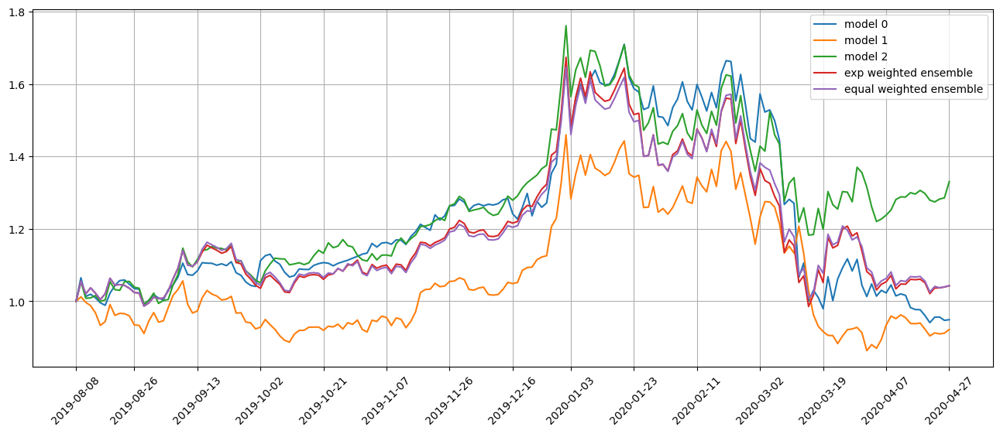

Standardization data are from 2018-09-20 to 2019-07-09
Training data are from 2019-07-10 to 2020-04-23
Testing data are from 2020-03-27 to 2020-05-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 10 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0651 - val_loss: 0.5697 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0650 - val_loss: 0.5756 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0650 - val_loss: 0.5915 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0649 - val_loss: 0.5491 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0649 - val_loss: 0.6000 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0648 - val_loss: 0.5875 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0629 - val_loss: 0.6072 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.16178238910994816
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.23212810323887093
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.1632190990204975
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.23831120205661216
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.15882310491818424
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.23413315421051237
Correlations between old and new weights
0.9585344192481196
-0.5536611794826221
0.9947977180165231
0.2050387487727812
0.9335921541459293
-0.20645221144814588
Weight of model 0 is 0.27638146653855616
Weight of model 1 is 0.3275265207093679
Weight of model 2 is 0.3960920127520761
Testing data from 2020-03-27 to 2020-

position on 2020-04-30 market open will be {'FTSM': 0.10517591740019593, 'BIL': 0.10511158983184588, 'NEAR': 0.10493402059358375, 'MFA': 0.12503380133898617, 'GSY': 0.11191347434273892, 'JPST': 0.11175704155606234, 'CEIX': 0.1205272225921961, 'ESGU': 0.11201823545355512, 'HYMB': 0.11167371239549996, 'SPSB': 0.11163463475413875}
Total asset on 2020-04-30 will be 1.1197796502587996
It should be the same as 1.119779650258803
Testing data from 2020-04-01 to 2020-04-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-04-30 are ['JDST', 'SHM', 'VTEB', 'ESGU', 'ICSH', 'GSY', 'ITM', 'BIL', 'NEAR', 'FTSM']
position on 2020-05-01 market open will be {'FTSM': 0.10347443521165892, 'BIL': 0.10827849852224163, 'NEAR': 0.09226147574116245, 'ITM': 0.10444975595804178, 'GSY': 0.10376988245293663, 'ICSH': 0.10362475038072126, 'VTEB': 0.10146797866829085, 'SHM': 0.10093731053128702, 'ESGU': 0.09864367065714429, 'JDST': 0.11341529116409209}
Total asset on 2020-05-01 will be 1.030323

position on 2020-05-06 market open will be {'FTSM': 0.10356128501596239, 'ICSH': 0.10364534417012343, 'VTEB': 0.10151785015195755, 'HYD': 0.10259573561959612, 'HYMB': 0.10092246466040748, 'ITM': 0.10350481388946345, 'GSY': 0.10350189059207139, 'NEAR': 0.10329359749954749, 'CIM': 0.10591079582576135, 'ARI': 0.10261916244537869}
Total asset on 2020-05-06 will be 1.0310729398702656
It should be the same as 1.0310729398702692
top_stocks by model 1 to buy on 2020-05-05 are ['TBT', 'TMV', 'CIM', 'HYMB', 'GIL', 'CEIX', 'NEAR', 'ICSH', 'GUSH', 'UCO']
position on 2020-05-06 market open will be {'UCO': 0.12949313327859965, 'ICSH': 0.10818668391870294, 'NEAR': 0.10809928128790337, 'GUSH': 0.11783121423147945, 'CIM': 0.10982627798537323, 'TBT': 0.10457012701638528, 'GIL': 0.1008947305644444, 'CEIX': 0.09261978160207258, 'TMV': 0.10586118695146075, 'HYMB': 0.10117684197354013}
Total asset on 2020-05-06 will be 1.078559258809954
It should be the same as 1.0785592588099617
top_stocks by model 2 to bu

Testing data from 2020-04-09 to 2020-05-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-08 are ['TWO', 'ICSH', 'HYD', 'HYMB', 'RITM', 'FTSM', 'MFA', 'RWT', 'IVR', 'NYMT']
position on 2020-05-11 market open will be {'FTSM': 0.10363076750989131, 'ICSH': 0.10381012591424489, 'HYD': 0.1031668590523847, 'IVR': 0.10215265004392116, 'NYMT': 0.10290376815168939, 'RITM': 0.10407549302080167, 'MFA': 0.10519041449786161, 'RWT': 0.11182712847837846, 'TWO': 0.10280724095931405, 'HYMB': 0.10279286181825176}
Total asset on 2020-05-11 will be 1.0423573094467355
It should be the same as 1.0423573094467389
top_stocks by model 1 to buy on 2020-05-08 are ['FANG', 'HYD', 'NYMT', 'NEAR', 'GUSH', 'SPR', 'GSY', 'CIM', 'ICSH', 'UCO']
position on 2020-05-11 market open will be {'UCO': 0.13274012586705064, 'ICSH': 0.10835868576412669, 'NEAR': 0.10834091890508407, 'GSY': 0.10457407056068865, 'GUSH': 0.10810589309767811, 'SPR': 0.10412057505235717, 'FANG': 0.1029473168197167, 'HYD': 0

position on 2020-05-14 market open will be {'FTSM': 0.10373499125078468, 'ICSH': 0.10385131349304923, 'NYMT': 0.08325380271472363, 'HYMB': 0.10448898472145848, 'NEAR': 0.10323860955764705, 'GSY': 0.10309167503888936, 'HYD': 0.10382267601932246, 'VTEB': 0.10270573321828164, 'FIXD': 0.10281996708181593, 'MINT': 0.10272713006611008}
Total asset on 2020-05-14 will be 1.0137348831620794
It should be the same as 1.0137348831620827
top_stocks by model 1 to buy on 2020-05-13 are ['VTEB', 'TVTX', 'AXSM', 'SAVA', 'JPST', 'JDST', 'GSY', 'ICSH', 'NEAR', 'UCO']
position on 2020-05-14 market open will be {'UCO': 0.12369493328105045, 'ICSH': 0.10840167802398322, 'NEAR': 0.1085386216482573, 'GSY': 0.10461579266794697, 'SAVA': 0.08779512003288671, 'JPST': 0.1050816383669599, 'VTEB': 0.10549019093013073, 'AXSM': 0.09676471218689219, 'JDST': 0.11081160389401286, 'TVTX': 0.09698637255334641}
Total asset on 2020-05-14 will be 1.0481806635854598
It should be the same as 1.048180663585467
top_stocks by model

Testing data from 2020-04-20 to 2020-05-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-18 are ['MMSI', 'IGSB', 'BLMN', 'SJNK', 'FTSM', 'JPST', 'ICSH', 'GSY', 'NYMT', 'NEAR']
position on 2020-05-19 market open will be {'NYMT': 0.09411299624927674, 'NEAR': 0.10518154409800744, 'GSY': 0.1133749566919738, 'ICSH': 0.11339756908468608, 'BLMN': 0.11212224619663165, 'IGSB': 0.11352395914718134, 'JPST': 0.1134200648252112, 'SJNK': 0.11363118226275841, 'FTSM': 0.1134355272987611, 'MMSI': 0.11816495025923705}
Total asset on 2020-05-19 will be 1.1103649961137216
It should be the same as 1.1103649961137247
top_stocks by model 1 to buy on 2020-05-18 are ['HYLB', 'HYS', 'FSK', 'MMSI', 'PUMP', 'JPST', 'GSY', 'NEAR', 'ICSH', 'UCO']
position on 2020-05-19 market open will be {'UCO': 0.16644699990472414, 'ICSH': 0.10846618281676683, 'GSY': 0.10457407056068863, 'NEAR': 0.08469288250425636, 'PUMP': 0.09814679468389192, 'JPST': 0.08455446163985249, 'MMSI': 0.10747940381688705,

top_stocks by model 1 to buy on 2020-05-21 are ['JPST', 'SAVA', 'NYMT', 'GIL', 'ICSH', 'ARCH', 'PUMP', 'NEAR', 'GSY', 'UCO']
position on 2020-05-22 market open will be {'UCO': 0.17201326659396077, 'ICSH': 0.10855218373947871, 'GSY': 0.10457407056068864, 'NEAR': 0.08477838427473385, 'JPST': 0.0847054220539094, 'SAVA': 0.09217123780168232, 'NYMT': 0.10350174333188228, 'GIL': 0.09911413350073893, 'PUMP': 0.0970405773640185, 'ARCH': 0.09407051002908536}
Total asset on 2020-05-22 will be 1.0405215292501717
It should be the same as 1.0405215292501786
top_stocks by model 2 to buy on 2020-05-21 are ['NAT', 'INO', 'NYMT', 'GUSH', 'XELA', 'ZOM', 'CENN', 'MVIS', 'MFA', 'TOON']
position on 2020-05-22 market open will be {'MFA': 0.13119487413313682, 'CENN': 0.15205705174667167, 'INO': 0.18808014035278695, 'MVIS': 0.16466733653133866, 'TOON': 0.31654699340917825, 'GUSH': 0.1587404377218423, 'ZOM': 0.13236084867093392, 'XELA': 0.16947517026932662, 'NYMT': 0.1402527852450396, 'NAT': 0.1360644513751899

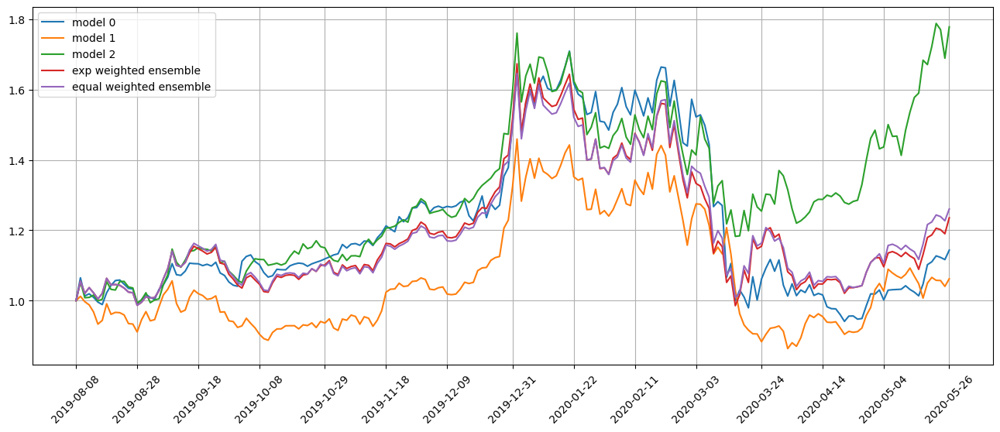

Standardization data are from 2018-10-18 to 2019-08-06
Training data are from 2019-08-07 to 2020-05-21
Testing data are from 2020-04-27 to 2020-06-19
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 11 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1596 - val_loss: 0.2469 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1564 - val_loss: 0.2484 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1534 - val_loss: 0.2511 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1543 - val_loss: 0.2524 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1542 - val_loss: 0.2492 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1523 - val_loss: 0.2514 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.17730290849039207
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.24351769469745335
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.17722120905950609
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.24917182433749518
Correlations between old and new weights
0.9816423791875882
0.1861804570606083
0.9972545195005609
-0.11430868990581627
0.970842560188824
0.18043986672764764
Weight of model 0 is 0.26705753423235257
Weight of model 1 is 0.2964052502082634
Weight of model 2 is 0.4365372155593841
Testing data from 2020-04-27 to 2020-05-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-26 are ['CINF', 'UCO', 'INO', 'NYMT', 'SAVA', 'XELA', 'MVIS', 'CENN', 'TOON', 'MFA']
position on 2020-05-27 market open will be {'NYMT': 0.11531427328707455, 'MVIS': 0.1081544841216063, 'MFA': 0.12394862461624395, 'UCO': 0.111164743

Testing data from 2020-04-30 to 2020-05-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-05-29 are ['UCO', 'ZOM', 'INO', 'NYMT', 'SAVA', 'XELA', 'CENN', 'MVIS', 'MFA', 'TOON']
position on 2020-06-01 market open will be {'NYMT': 0.1075577029541856, 'MVIS': 0.10340043845025698, 'MFA': 0.1119535920711918, 'UCO': 0.11494618100793731, 'INO': 0.11990994923793177, 'CENN': 0.10788851072579363, 'TOON': 0.19268003793292354, 'SAVA': 0.11004528947272206, 'XELA': 0.10240623706329444, 'ZOM': 0.12158993622350649}
Total asset on 2020-06-01 will be 1.1923778751397407
It should be the same as 1.1923778751397436
top_stocks by model 1 to buy on 2020-05-29 are ['CC', 'TKO', 'FCEL', 'FLRN', 'FLOT', 'NYMT', 'CENN', 'MVIS', 'MFA', 'TOON']
position on 2020-06-01 market open will be {'FLOT': 0.09719899917903031, 'MVIS': 0.09616361363479844, 'MFA': 0.10411814625081182, 'FLRN': 0.10728771697699033, 'TKO': 0.10845843513682808, 'FCEL': 0.11037034214341954, 'CENN': 0.10033757319182085, 'TOO

position on 2020-06-04 market open will be {'NYMT': 0.12307084361996358, 'MVIS': 0.12122809732068351, 'MFA': 0.12861335331621396, 'INO': 0.10100668483663268, 'CENN': 0.13531167733168095, 'TOON': 0.7683016107156578, 'SAVA': 0.15458743996881213, 'XELA': 0.10743231004799601, 'ZOM': 0.12674829642214772, 'NNDM': 0.13337894154216573}
Total asset on 2020-06-04 will be 1.899679255121951
It should be the same as 1.8996792551219541
top_stocks by model 1 to buy on 2020-06-03 are ['UGI', 'FLRN', 'FCEL', 'TKO', 'FLOT', 'CENN', 'NYMT', 'MVIS', 'MFA', 'TOON']
position on 2020-06-04 market open will be {'FLOT': 0.097295770897148, 'MVIS': 0.11274354429392634, 'MFA': 0.119611918498064, 'FLRN': 0.10735853557454776, 'TKO': 0.11173795948214288, 'FCEL': 0.13244440789890063, 'CENN': 0.1258414379496081, 'TOON': 0.7145294580486393, 'NYMT': 0.12447622069374978, 'UGI': 0.11572305630409453}
Total asset on 2020-06-04 will be 1.7617623096408146
It should be the same as 1.7617623096408215
top_stocks by model 2 to bu

Testing data from 2020-05-08 to 2020-06-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-06-08 are ['ZOM', 'NYMT', 'INO', 'SAVA', 'XELA', 'CENN', 'MVIS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-09 market open will be {'NYMT': 0.1768496950970564, 'MVIS': 0.12122809732068357, 'MFA': 0.22190801469953936, 'INO': 0.09735584478372172, 'CENN': 0.1695906355890401, 'TOON': 0.35794954455126043, 'SAVA': 0.1346744759248281, 'XELA': 0.14167243225627546, 'ZOM': 0.15032936690988116, 'NNDM': 0.13440493245935345}
Total asset on 2020-06-09 will be 1.7059630395916368
It should be the same as 1.7059630395916399
top_stocks by model 1 to buy on 2020-06-08 are ['X', 'FCEL', 'TKO', 'FLOT', 'NYMT', 'CENN', 'MVIS', 'NNDM', 'MFA', 'TOON']
position on 2020-06-09 market open will be {'FLOT': 0.09754738327082109, 'MVIS': 0.11274354429392637, 'MFA': 0.20637704160507497, 'TKO': 0.11323716754766339, 'CENN': 0.15772126889684213, 'TOON': 0.33289725091000244, 'NYMT': 0.1788691864703581, 'NNDM

top_stocks by model 0 to buy on 2020-06-11 are ['ZOM', 'NYMT', 'INO', 'SAVA', 'XELA', 'CENN', 'MVIS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-12 market open will be {'NYMT': 0.14530632222728515, 'MVIS': 0.13073618866338224, 'MFA': 0.17392790040731718, 'INO': 0.10230477184533526, 'CENN': 0.21830283942844525, 'TOON': 0.3498876181492393, 'SAVA': 0.13624655006086872, 'XELA': 0.15078218954104705, 'ZOM': 0.14590791687973084, 'NNDM': 0.12414502328747648}
Total asset on 2020-06-12 will be 1.6775473204901248
It should be the same as 1.6775473204901277
top_stocks by model 1 to buy on 2020-06-11 are ['FLOT', 'CC', 'SAGE', 'UGI', 'TKO', 'NYMT', 'MVIS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-12 market open will be {'FLOT': 0.09743125277915456, 'MVIS': 0.12158618012784993, 'MFA': 0.16175497575986714, 'TKO': 0.10464013345146589, 'TOON': 0.3253995653363663, 'NYMT': 0.1469656118520886, 'NNDM': 0.11030422796723437, 'UGI': 0.12430123515165808, 'SAGE': 0.16990409896944733, 'CC': 0.15900386971411962

position on 2020-06-17 market open will be {'FLOT': 0.09766350637927879, 'MVIS': 0.12600749145653817, 'MFA': 0.17043149471977398, 'TKO': 0.10541316763674143, 'TOON': 0.2556710666204303, 'NYMT': 0.14748862065880547, 'NNDM': 0.10392298705816959, 'SAGE': 0.18582355886552065, 'JETS': 0.143966667285457, 'INGN': 0.14344041802853932}
Total asset on 2020-06-17 will be 1.4798289787092476
It should be the same as 1.4798289787092545
top_stocks by model 2 to buy on 2020-06-16 are ['GSY', 'XELA', 'NEAR', 'MVIS', 'CENN', 'SAVA', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-17 market open will be {'MFA': 0.2160394689446314, 'MVIS': 0.1955424640479449, 'NEAR': 0.15699106005708205, 'NNDM': 0.14033973723470064, 'JETS': 0.17231801173879227, 'SAVA': 0.19815576265342297, 'TOON': 0.2082413555723384, 'XELA': 0.5443902338884479, 'CENN': 0.3841321183694773, 'GSY': 0.6823860878679567}
Total asset on 2020-06-17 will be 2.8985363003747926
It should be the same as 2.8985363003747944
top_stocks by return weig

position on 2020-06-22 market open will be {'MFA': 0.17095201372823718, 'NYMT': 0.1605058832005587, 'MVIS': 0.20310882572223118, 'INO': 0.1294378286328636, 'CENN': 0.15900799572146376, 'TOON': 0.2607945953761781, 'XELA': 0.17281890359464727, 'NNDM': 0.1219292224191889, 'SAVA': 0.11384178554254144, 'JETS': 0.1253620890472542}
Total asset on 2020-06-22 will be 1.6177591429851614
It should be the same as 1.6177591429851643
top_stocks by equal weighted ensemble to buy on 2020-06-19 are ['NYMT', 'INO', 'SAVA', 'XELA', 'MVIS', 'JETS', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-06-22 market open will be {'MFA': 0.17485786156447272, 'NYMT': 0.16447579876272672, 'MVIS': 0.21014303084418093, 'INO': 0.13132501699734367, 'CENN': 0.16132631365490172, 'TOON': 0.26459694999778705, 'XELA': 0.17533858294550442, 'NNDM': 0.11899435232733953, 'SAVA': 0.11881526575149165, 'JETS': 0.1157183120292446}
Total asset on 2020-06-22 will be 1.6355914848749897
It should be the same as 1.635591484874993
Testing

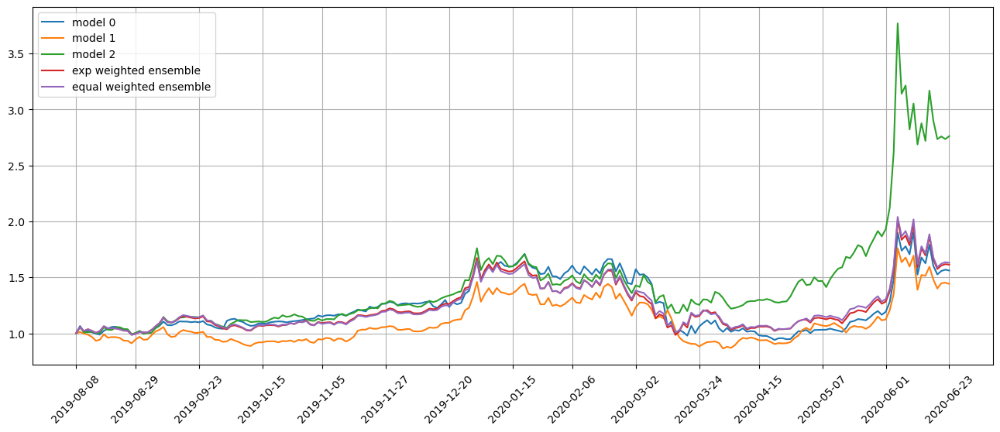

Standardization data are from 2018-11-15 to 2019-09-04
Training data are from 2019-09-05 to 2020-06-19
Testing data are from 2020-05-26 to 2020-07-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 12 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1858 - val_loss: 0.2372 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1841 - val_loss: 0.2347 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1819 - val_loss: 0.2534 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1799 - val_loss: 0.2375 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1791 - val_loss: 0.2411 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1834 - val_loss: 0.2380 - lr: 0.0100
Epoch 7/500
305/305 [

11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.11394800110091294
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.1954915010345684
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.11271669609092325
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.19541767942224395
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.11431907654132281
Correlations between old and new weights
0.9568591242153506
0.5711911778836262
0.993406732001499
0.7038222156241501
0.946049256822996
0.35039431611571836
Weight of model 0 is 0.24667634817927694
Weight of model 1 is 0.2599941400567999
Weight of model 2 is 0.49332951176392315
Testing data from 2020-05-26 to 2020-06-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-06-23 are ['DPST', 'MVIS', 'DFEN', 'GUSH', 'UCO', 'CENN', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-24 market open will be {'MVIS': 0.1640

top_stocks by model 0 to buy on 2020-06-26 are ['NYMT', 'MVIS', 'DFEN', 'UCO', 'GUSH', 'CENN', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-06-29 market open will be {'MVIS': 0.160448958170144, 'MFA': 0.15593535953373228, 'CENN': 0.12964663137717933, 'TOON': 0.18784287901633004, 'NNDM': 0.10824213960951419, 'JETS': 0.13944474687792183, 'DFEN': 0.12127079934594416, 'UCO': 0.12810457531086944, 'GUSH': 0.11376303099935187, 'NYMT': 0.13084701898834517}
Total asset on 2020-06-29 will be 1.37554613922933
It should be the same as 1.3755461392293324
top_stocks by model 1 to buy on 2020-06-26 are ['UCO', 'DFEN', 'UAL', 'CENN', 'NYMT', 'GUSH', 'MFA', 'JETS', 'NNDM', 'TOON']
position on 2020-06-29 market open will be {'MFA': 0.14502170291491584, 'TOON': 0.17469606814544075, 'NYMT': 0.13702843205495457, 'NNDM': 0.09617433971155818, 'JETS': 0.1272794370946867, 'CENN': 0.09314907742133102, 'GUSH': 0.11243961964976744, 'DFEN': 0.11986004973055712, 'UCO': 0.126614328018662, 'UAL': 0.146025803914827

position on 2020-07-02 market open will be {'MVIS': 0.17827661704057057, 'MFA': 0.16992956152162872, 'CENN': 0.12486561877812659, 'TOON': 0.20961008645254872, 'NNDM': 0.10926814275747841, 'JETS': 0.14660239243907214, 'DFEN': 0.1312820936224006, 'UCO': 0.13775910127144828, 'GUSH': 0.1211753519328692, 'DPST': 0.1291590869941957}
Total asset on 2020-07-02 will be 1.4579280528103362
It should be the same as 1.4579280528103387
top_stocks by model 1 to buy on 2020-07-01 are ['NYMT', 'UCO', 'UAL', 'DFEN', 'GUSH', 'CENN', 'MFA', 'JETS', 'NNDM', 'TOON']
position on 2020-07-02 market open will be {'MFA': 0.15803647396676967, 'TOON': 0.19493982491453832, 'NYMT': 0.13598241444152084, 'NNDM': 0.09708595487043635, 'JETS': 0.13381264195427212, 'CENN': 0.08971399462734868, 'GUSH': 0.11976571266228084, 'DFEN': 0.12975488209181044, 'UAL': 0.15781343012151514, 'UCO': 0.13473245155844732}
Total asset on 2020-07-02 will be 1.3516377812089333
It should be the same as 1.3516377812089397
top_stocks by model 2

Testing data from 2020-06-08 to 2020-07-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-07 are ['JETS', 'MVIS', 'DFEN', 'UCO', 'NYMT', 'GUSH', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-08 market open will be {'MVIS': 0.17589959774693406, 'MFA': 0.15793452897657662, 'CENN': 0.11577266965676063, 'TOON': 0.1942924293640895, 'NNDM': 0.10516416685795113, 'JETS': 0.13884109259961389, 'DFEN': 0.11941303075946073, 'UCO': 0.1394896250027247, 'GUSH': 0.11387045158512213, 'NYMT': 0.1182302511933022}
Total asset on 2020-07-08 will be 1.3789078437425328
It should be the same as 1.3789078437425355
top_stocks by model 1 to buy on 2020-07-07 are ['NYMT', 'DPST', 'UCO', 'DFEN', 'GUSH', 'CENN', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-07-08 market open will be {'MFA': 0.14688095381146457, 'TOON': 0.18069422518476982, 'NYMT': 0.1244762206937498, 'NNDM': 0.09343952683646489, 'JETS': 0.12672844626525018, 'CENN': 0.08318085286580013, 'GUSH': 0.11254579060618852,

top_stocks by model 0 to buy on 2020-07-10 are ['MVIS', 'NYMT', 'UCO', 'JETS', 'DFEN', 'GUSH', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-13 market open will be {'MFA': 0.16193288375025158, 'CENN': 0.10373895262095546, 'TOON': 0.18945527044749597, 'NNDM': 0.09849521978084286, 'JETS': 0.14039335585717463, 'DFEN': 0.11518145550606654, 'UCO': 0.13898868872283354, 'GUSH': 0.11111321621533433, 'NYMT': 0.12121084277536406, 'MVIS': 0.19149566369053414}
Total asset on 2020-07-13 will be 1.3720055493668495
It should be the same as 1.372005549366853
top_stocks by model 1 to buy on 2020-07-10 are ['NCLH', 'UAL', 'NYMT', 'DFEN', 'GUSH', 'CENN', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-07-13 market open will be {'MFA': 0.1505994703805747, 'TOON': 0.17619561098044811, 'NYMT': 0.12761427353405097, 'NNDM': 0.08751409350683918, 'JETS': 0.1281452884057294, 'CENN': 0.07453481534112663, 'GUSH': 0.10982063030111901, 'DFEN': 0.11384154354926178, 'UAL': 0.14784229370602092, 'NCLH': 0.142162754

position on 2020-07-16 market open will be {'MFA': 0.15989572486331846, 'TOON': 0.16869792540681205, 'NNDM': 0.08295607204835033, 'JETS': 0.13271066029539902, 'CENN': 0.07440518957531599, 'GUSH': 0.11569565498826923, 'DFEN': 0.12200222973189462, 'DPST': 0.14062901496161997, 'IDEX': 0.1355190954135726, 'UAL': 0.13768694566453027}
Total asset on 2020-07-16 will be 1.2701985129490767
It should be the same as 1.2701985129490825
top_stocks by model 2 to buy on 2020-07-15 are ['GUSH', 'MVIS', 'NYMT', 'JETS', 'INO', 'IVR', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-16 market open will be {'MFA': 0.20268429577987113, 'NNDM': 0.11202558435673043, 'JETS': 0.15884536017842193, 'TOON': 0.1374026601183999, 'CENN': 0.2370879956387958, 'GUSH': 0.30324379226484793, 'INO': 0.38029343411210953, 'MVIS': 0.33643905265617513, 'NYMT': 0.33647744338348357, 'IVR': 0.34468480164955767}
Total asset on 2020-07-16 will be 2.5491844201383893
It should be the same as 2.5491844201383933
top_stocks by return 

position on 2020-07-21 market open will be {'MFA': 0.17298715482335145, 'MVIS': 0.2985455158730458, 'CENN': 0.10521128306164282, 'TOON': 0.17829835151570916, 'NNDM': 0.120317824527168, 'JETS': 0.11859951464938598, 'GUSH': 0.12156189482268316, 'INO': 0.1434325189682476, 'DFEN': 0.14534319484870625, 'DPST': 0.14052873062115517}
Total asset on 2020-07-21 will be 1.5448259837110914
It should be the same as 1.5448259837110956
top_stocks by equal weighted ensemble to buy on 2020-07-20 are ['MVIS', 'DPST', 'DFEN', 'JETS', 'GUSH', 'INO', 'CENN', 'MFA', 'NNDM', 'TOON']
position on 2020-07-21 market open will be {'MFA': 0.17693950080412135, 'MVIS': 0.3088849503580902, 'CENN': 0.1067452512323321, 'TOON': 0.18089792057477302, 'NNDM': 0.11742174122806219, 'JETS': 0.10947596475950083, 'GUSH': 0.12174912109286334, 'DFEN': 0.14838642839364322, 'DPST': 0.1351670573881758, 'INO': 0.15562687468795183}
Total asset on 2020-07-21 will be 1.5612948105195092
It should be the same as 1.561294810519514
Testing 

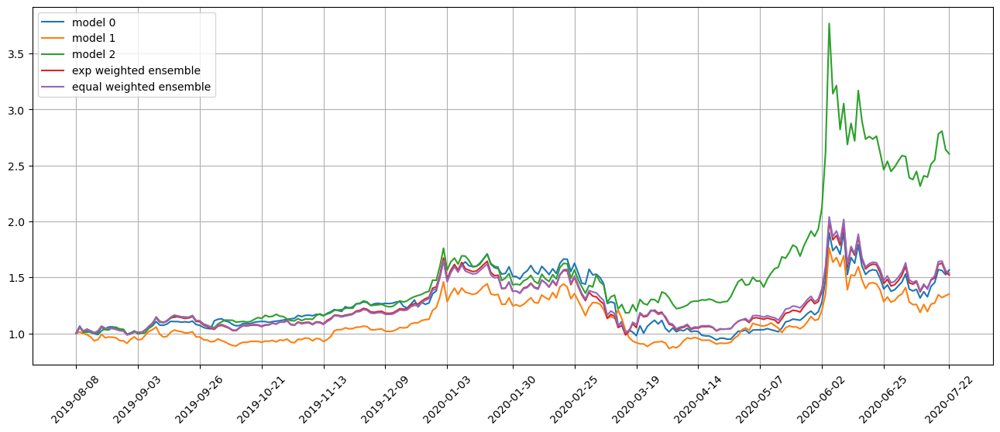

Standardization data are from 2018-12-17 to 2019-10-02
Training data are from 2019-10-03 to 2020-07-20
Testing data are from 2020-06-23 to 2020-08-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 13 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2058 - val_loss: 0.1818 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2047 - val_loss: 0.1927 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2040 - val_loss: 0.2033 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2028 - val_loss: 0.1889 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2007 - val_loss: 0.1941 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1998 - val_loss: 0.2219 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1987 - val_loss: 0.1872 - lr: 0.0100
Epoch 8/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1986 - val_loss: 0.1815 - lr: 0.0100
Epoch 9/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1970 - val_loss: 0.2345 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1963 - val_loss: 0.2134 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1962 - val_loss: 0.1840 - lr: 0.0100
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1955 - val_loss: 0.2258 - lr: 0.0100
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1950 - val_loss: 0.1840 - lr: 0.0100
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1935 - val_loss: 0.1889 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1927 - val_loss: 

position on 2020-07-24 market open will be {'TOON': 0.16649808294125987, 'ZD': 0.14738516895019987, 'UAL': 0.15001773292739032, 'CACI': 0.1486890545251987, 'FE': 0.1514955145666631, 'NCLH': 0.14663915109511966, 'GUSH': 0.1514734905188749, 'HRTX': 0.1476062962141414, 'AAL': 0.15558108688105926, 'IDEX': 0.14357069995801608}
Total asset on 2020-07-24 will be 1.5089562785779187
It should be the same as 1.508956278577923
Testing data from 2020-06-25 to 2020-07-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-07-24 are ['MGM', 'CNK', 'SPG', 'CUK', 'RCL', 'H', 'IHG', 'AAL', 'GNW', 'NCLH']
position on 2020-07-27 market open will be {'NCLH': 0.15439395432661385, 'IHG': 0.15214539207957434, 'GNW': 0.15440848501398444, 'H': 0.15404199207472158, 'MGM': 0.15836174838759426, 'RCL': 0.15836906623259273, 'CUK': 0.15292132918922902, 'SPG': 0.15368121862599057, 'AAL': 0.1540041881062443, 'CNK': 0.153168798150944}
Total asset on 2020-07-27 will be 1.5454961721874847
It should be

top_stocks by model 0 to buy on 2020-07-29 are ['GUSH', 'LC', 'ZLAB', 'AXSM', 'CNP', 'IDEX', 'ZD', 'CNK', 'GEVO', 'TOON']
position on 2020-07-30 market open will be {'ZD': 0.15211917184395962, 'CNK': 0.1426414340855704, 'GUSH': 0.15641529310059663, 'GEVO': 0.16087644046902239, 'LC': 0.14725205971740526, 'IDEX': 0.15755477848225277, 'ZLAB': 0.15887356826262344, 'TOON': 0.14800150938446646, 'AXSM': 0.14892888686246802, 'CNP': 0.15337346013744854}
Total asset on 2020-07-30 will be 1.5260366023458094
It should be the same as 1.5260366023458136
top_stocks by model 1 to buy on 2020-07-29 are ['CACI', 'DFEN', 'FE', 'NCLH', 'UAL', 'ZD', 'JETS', 'MFA', 'NNDM', 'TOON']
position on 2020-07-30 market open will be {'MFA': 0.16423399173127812, 'TOON': 0.12296204054749182, 'NNDM': 0.10346718491232086, 'JETS': 0.12279278032541872, 'CACI': 0.12665371544753243, 'NCLH': 0.12063677040625068, 'UAL': 0.1251492069542763, 'ZD': 0.1241505387804822, 'DFEN': 0.14503734108531893, 'FE': 0.12277060231717371}
Total 

position on 2020-08-04 market open will be {'MFA': 0.16113522546101752, 'TOON': 0.13495834032544965, 'NNDM': 0.1089368215296879, 'JETS': 0.12247792735049969, 'NCLH': 0.11260583045286905, 'UAL': 0.125071060169286, 'ZD': 0.13309300789683962, 'DFEN': 0.14584911000230183, 'KODK': 0.08766135659144807, 'AAL': 0.12438394670510156}
Total asset on 2020-08-04 will be 1.2561726264844968
It should be the same as 1.256172626484501
top_stocks by model 2 to buy on 2020-08-03 are ['KBH', 'NNDM', 'WFC', 'CUK', 'AMCX', 'EXPE', 'FUN', 'CLNE', 'H', 'KODK']
position on 2020-08-04 market open will be {'NNDM': 0.14711052233422164, 'FUN': 0.2536161217650516, 'CUK': 0.23627105170262455, 'CLNE': 0.260993629955585, 'AMCX': 0.2583647307036159, 'H': 0.2498065065666148, 'KBH': 0.2575403608660685, 'WFC': 0.25967858287285167, 'KODK': 0.18570960028666741, 'EXPE': 0.2562364795199122}
Total asset on 2020-08-04 will be 2.3653275865732093
It should be the same as 2.3653275865732133
top_stocks by return weighted ensemble t

top_stocks by model 2 to buy on 2020-08-06 are ['SYK', 'ST', 'ZBH', 'HRTX', 'ONB', 'WAT', 'HRB', 'PRTA', 'NNDM', 'KODK']
position on 2020-08-07 market open will be {'NNDM': 0.135415540562514, 'KODK': 0.19445322256484235, 'HRB': 0.26733168471929303, 'ZBH': 0.2618490628452784, 'PRTA': 0.2730129429282767, 'ST': 0.26622597920511964, 'ONB': 0.2638951701127949, 'HRTX': 0.24467770051647136, 'SYK': 0.2663006510147206, 'WAT': 0.26434980168477984}
Total asset on 2020-08-07 will be 2.437511756154086
It should be the same as 2.437511756154091
top_stocks by return weighted ensemble to buy on 2020-08-06 are ['AZN', 'CNK', 'HSBC', 'HAE', 'WAT', 'UAL', 'HRB', 'PRTA', 'GUSH', 'KODK']
position on 2020-08-07 market open will be {'KODK': 0.1048434828749565, 'UAL': 0.1503178332234887, 'GUSH': 0.13905429850531634, 'HRB': 0.1541398013380801, 'PRTA': 0.15054858654941594, 'AZN': 0.14533053270729887, 'HSBC': 0.14462240864126774, 'HAE': 0.14640741844911384, 'WAT': 0.14577143695607586, 'CNK': 0.1332586685349873}


position on 2020-08-12 market open will be {'KODK': 0.07030938562745351, 'AZN': 0.14766559339800042, 'OKE': 0.15081564477341455, 'RNG': 0.1654130063309593, 'NCLH': 0.15321530356668278, 'DPST': 0.1644302446077601, 'GUSH': 0.15132995760466986, 'HCA': 0.15539936654158318, 'UUP': 0.1564530603303909, 'EW': 0.15772473203356857}
Total asset on 2020-08-12 will be 1.4727562948144788
It should be the same as 1.4727562948144832
Testing data from 2020-07-15 to 2020-08-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-08-12 are ['ZLAB', 'ZOM', 'RNG', 'EW', 'XENE', 'ESPR', 'MYGN', 'GUSH', 'DVAX', 'BLDP']
position on 2020-08-13 market open will be {'RNG': 0.15171368215159758, 'GUSH': 0.13720566709751172, 'BLDP': 0.13895300279185333, 'EW': 0.14780460555885758, 'ESPR': 0.1447297470508413, 'XENE': 0.1464752817939892, 'ZLAB': 0.15429905396597302, 'ZOM': 0.13958888372328598, 'DVAX': 0.13880725534172236, 'MYGN': 0.1491966994213513}
Total asset on 2020-08-13 will be 1.44877387889697

top_stocks by model 0 to buy on 2020-08-17 are ['ARI', 'CBRL', 'TWO', 'UAL', 'SABR', 'AKR', 'OKE', 'BXMT', 'BLDP', 'BCO']
position on 2020-08-18 market open will be {'BLDP': 0.15451032441972273, 'UAL': 0.14003697918790875, 'TWO': 0.14654912203866877, 'SABR': 0.1477049170217299, 'CBRL': 0.14295823651770065, 'BXMT': 0.14715784927816447, 'OKE': 0.14466195627336084, 'BCO': 0.1434426952169432, 'ARI': 0.147314403771171, 'AKR': 0.14886370417089453}
Total asset on 2020-08-18 will be 1.4632001878962606
It should be the same as 1.4632001878962648
top_stocks by model 1 to buy on 2020-08-17 are ['DPST', 'MVIS', 'DFEN', 'NCLH', 'MFA', 'JETS', 'UUP', 'TOON', 'NNDM', 'KODK']
position on 2020-08-18 market open will be {'MFA': 0.17167099531747312, 'TOON': 0.11471459070670224, 'NNDM': 0.08660248921514149, 'JETS': 0.13310422088403265, 'NCLH': 0.13289906245394914, 'DFEN': 0.17182594759677197, 'MVIS': 0.1073427576123149, 'KODK': 0.06095359931333426, 'UUP': 0.14528367518078764, 'DPST': 0.13415075217544048}


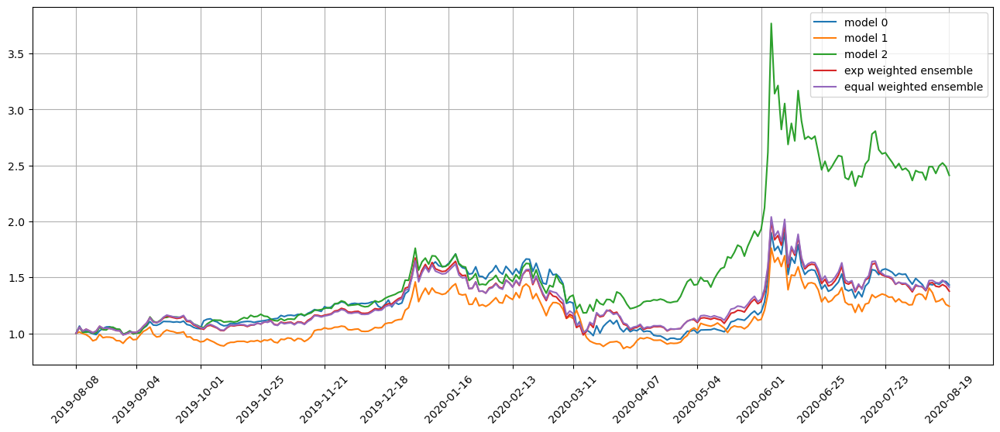

Standardization data are from 2019-01-16 to 2019-10-30
Training data are from 2019-10-31 to 2020-08-17
Testing data are from 2020-07-22 to 2020-09-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 14 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2210 - val_loss: 0.1237 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2214 - val_loss: 0.1378 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2268 - val_loss: 0.1304 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2233 - val_loss: 0.1238 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2205 - val_loss: 0.1287 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2211 - val_loss: 0.1356 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.2111 - val_loss: 0.1251 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2107 - val_loss: 0.1242 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2108 - val_loss: 0.1266 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2102 - val_loss: 0.1249 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2104 - val_loss: 0.1251 - lr: 0.0012
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2103 - val_loss: 0.1261 - lr: 0.0010
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2102 - val_loss: 0.1264 - lr: 0.0010
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2094 - val_loss: 0.1271 - lr: 0.0010
Epoch 30/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2093 - val_loss

position on 2020-08-21 market open will be {'DPST': 0.12684381087381832, 'DFEN': 0.1296697024364317, 'CNK': 0.1479297778682614, 'MGM': 0.1453367361749176, 'HXL': 0.1424171217080638, 'DRH': 0.14403617865886326, 'ALE': 0.14149023290492502, 'DAL': 0.14284236974925651, 'DVAX': 0.14839360913581276, 'BOIL': 0.13185413442172061}
Total asset on 2020-08-21 will be 1.4008136739320662
It should be the same as 1.400813673932071
Testing data from 2020-07-24 to 2020-08-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-08-21 are ['VNO', 'JBLU', 'BXMT', 'FTI', 'BP', 'PAA', 'LUV', 'OKE', 'AKR', 'SABR']
position on 2020-08-24 market open will be {'SABR': 0.14700207835327783, 'FTI': 0.14482415280938737, 'LUV': 0.14861465744206112, 'BXMT': 0.14739084070177186, 'PAA': 0.14289025630948554, 'BP': 0.1460445493241222, 'OKE': 0.14259704076952473, 'JBLU': 0.14457976906311729, 'VNO': 0.14660514745895575, 'AKR': 0.14296149505108924}
Total asset on 2020-08-24 will be 1.4535099872827884
It s

position on 2020-08-27 market open will be {'CRUS': 0.1494335255957719, 'NEM': 0.15410774305941008, 'CENX': 0.14851543219687197, 'WPM': 0.15724804353521285, 'EVRG': 0.14748779075546026, 'GLPG': 0.1453034753758018, 'POR': 0.1407507486129403, 'STRA': 0.1481975463826214, 'PAAS': 0.15814018625003018, 'PLCE': 0.15313051293871435}
Total asset on 2020-08-27 will be 1.5023150047028302
It should be the same as 1.5023150047028353
top_stocks by model 1 to buy on 2020-08-26 are ['PSEC', 'CIM', 'JETS', 'FULT', 'MVIS', 'TOON', 'NYMT', 'EVRG', 'MFA', 'KODK']
position on 2020-08-27 market open will be {'MFA': 0.170431494719774, 'TOON': 0.08922245546612945, 'JETS': 0.13908643491418146, 'MVIS': 0.11238570111491, 'KODK': 0.05123756193398251, 'FULT': 0.12872714102235622, 'NYMT': 0.1293869005437656, 'CIM': 0.13903252820955928, 'PSEC': 0.1301163046238513, 'EVRG': 0.13099207251419143}
Total asset on 2020-08-27 will be 1.220618595062697
It should be the same as 1.2206185950627013
top_stocks by model 2 to buy 

top_stocks by model 0 to buy on 2020-08-31 are ['CORT', 'MDRX', 'BHC', 'FHB', 'PSEC', 'CCOI', 'DVAX', 'EVRG', 'FULT', 'KOLD']
position on 2020-09-01 market open will be {'FULT': 0.14866809339321166, 'CORT': 0.1582634269913712, 'MDRX': 0.1535067889219045, 'FHB': 0.1539380278634884, 'EVRG': 0.15648557371378535, 'BHC': 0.1546104733930113, 'DVAX': 0.1554909805110699, 'PSEC': 0.15627893453719233, 'KOLD': 0.1499090050263105, 'CCOI': 0.15962267767212704}
Total asset on 2020-09-01 will be 1.5467739820234667
It should be the same as 1.5467739820234723
top_stocks by model 1 to buy on 2020-08-31 are ['MVIS', 'PSEC', 'CIM', 'JETS', 'IVR', 'FULT', 'TOON', 'NYMT', 'MFA', 'KODK']
position on 2020-09-01 market open will be {'MFA': 0.16423399173127823, 'TOON': 0.07760104854727366, 'JETS': 0.13822058360313882, 'MVIS': 0.11238570111491, 'KODK': 0.07872480675417078, 'FULT': 0.12767306899145148, 'NYMT': 0.1264901702139479, 'CIM': 0.13593603346907196, 'PSEC': 0.12960604508279883, 'IVR': 0.1304155512498671}


top_stocks by model 1 to buy on 2020-09-03 are ['MVIS', 'ARI', 'JETS', 'CIM', 'IVR', 'FULT', 'TOON', 'NYMT', 'MFA', 'KODK']
position on 2020-09-04 market open will be {'MFA': 0.1648537420301278, 'TOON': 0.07797592710567532, 'JETS': 0.14357309168344956, 'KODK': 0.05314755222188759, 'FULT': 0.13623731785556512, 'NYMT': 0.1255245972741878, 'CIM': 0.13578120528682772, 'MVIS': 0.11360903104146405, 'IVR': 0.12069172622544179, 'ARI': 0.1257839786444503}
Total asset on 2020-09-04 will be 1.1971781693690724
It should be the same as 1.197178169369077
top_stocks by model 2 to buy on 2020-09-03 are ['RCL', 'CIM', 'CNK', 'DBRG', 'SVC', 'RGA', 'DFEN', 'CODX', 'DPST', 'INO']
position on 2020-09-04 market open will be {'DFEN': 0.2571377487372769, 'INO': 0.1761392352188823, 'DPST': 0.2612960433033303, 'CODX': 0.22522050970574928, 'RCL': 0.2660075001896813, 'CIM': 0.2600890829386736, 'SVC': 0.26958588037896886, 'DBRG': 0.2628296965093575, 'RGA': 0.26764429813200613, 'CNK': 0.2600007188804415}
Total asse

position on 2020-09-10 market open will be {'DFEN': 0.23591564759537667, 'INO': 0.1841862078373808, 'DPST': 0.2306272929555072, 'CODX': 0.24744623231001636, 'SRNE': 0.27727150158264047, 'RRR': 0.270293835896357, 'ADUS': 0.2779838378321466, 'GEVO': 0.2538928648139747, 'DBRG': 0.2679980277068978, 'AMC': 0.25734366273473464}
Total asset on 2020-09-10 will be 2.5029591112650262
It should be the same as 2.5029591112650325
top_stocks by return weighted ensemble to buy on 2020-09-09 are ['DFEN', 'DPST', 'AMC', 'GEVO', 'ADUS', 'DBRG', 'RRR', 'SRNE', 'INO', 'CODX']
position on 2020-09-10 market open will be {'DFEN': 0.13370850210752458, 'DPST': 0.13021277757454722, 'INO': 0.12378100857054856, 'CODX': 0.1543128284308778, 'SRNE': 0.15209803534240296, 'RRR': 0.14678852937407721, 'ADUS': 0.15096474031612467, 'GEVO': 0.13788165061561078, 'DBRG': 0.14554174434570938, 'AMC': 0.13975567615628093}
Total asset on 2020-09-10 will be 1.4150454928336986
It should be the same as 1.4150454928337042
top_stocks

Testing data from 2020-08-17 to 2020-09-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-15 are ['FUN', 'PNW', 'RGR', 'VIPS', 'IVR', 'URBN', 'ERJ', 'GLPG', 'BMRN', 'JKHY']
position on 2020-09-16 market open will be {'ERJ': 0.16338782474806027, 'IVR': 0.17337099095022232, 'GLPG': 0.1664668503249984, 'VIPS': 0.1645237152652172, 'URBN': 0.1626670585350664, 'FUN': 0.1656621250784618, 'BMRN': 0.1653261303322004, 'RGR': 0.16494837265519144, 'JKHY': 0.16671575744128134, 'PNW': 0.1654851873335618}
Total asset on 2020-09-16 will be 1.658554012664255
It should be the same as 1.6585540126642617
top_stocks by model 1 to buy on 2020-09-15 are ['CIM', 'IVR', 'SABR', 'MVIS', 'FULT', 'JETS', 'TOON', 'NYMT', 'MFA', 'KODK']
position on 2020-09-16 market open will be {'MFA': 0.173530246214022, 'TOON': 0.07722616283852181, 'JETS': 0.14530477929216085, 'KODK': 0.07839263487451786, 'FULT': 0.12596023178400878, 'NYMT': 0.12938690054376573, 'CIM': 0.13887770002731506, 'MVIS': 0.13

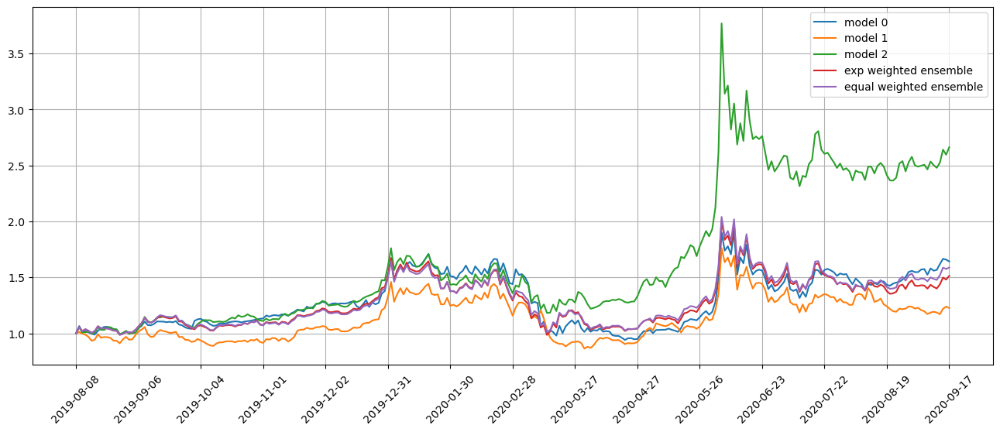

Standardization data are from 2019-02-14 to 2019-11-27
Training data are from 2019-11-29 to 2020-09-15
Testing data are from 2020-08-19 to 2020-10-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 15 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2328 - val_loss: 0.1126 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2326 - val_loss: 0.1023 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2320 - val_loss: 0.1005 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2310 - val_loss: 0.1013 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2298 - val_loss: 0.1160 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2312 - val_loss: 0.1058 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.2158 - val_loss: 0.1034 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2157 - val_loss: 0.1056 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2161 - val_loss: 0.1040 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2156 - val_loss: 0.1050 - lr: 0.0010
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2145 - val_loss: 0.1034 - lr: 0.0010
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2148 - val_loss: 0.1054 - lr: 0.0010
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2148 - val_loss: 0.1061 - lr: 0.0010
Epoch 30/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2146 - val_loss: 0.1062 - lr: 0.0010
Epoch 30: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 trainin

position on 2020-09-22 market open will be {'MFA': 0.17414999651287158, 'TOON': 0.0862233840968151, 'JETS': 0.13389135707467384, 'KODK': 0.08312609405907535, 'SABR': 0.11172700940222013, 'BMRN': 0.14235424000463168, 'DPST': 0.10737041040333636, 'DFEN': 0.1146052512529175, 'GUSH': 0.13044588408476704, 'UCO': 0.12891306126694385}
Total asset on 2020-09-22 will be 1.2128066881582478
It should be the same as 1.2128066881582524
top_stocks by model 2 to buy on 2020-09-21 are ['SITC', 'GRFS', 'DDS', 'PEB', 'PLAY', 'URBN', 'FXN', 'BLMN', 'SABR', 'AKR']
position on 2020-09-22 market open will be {'SABR': 0.2538259033821184, 'AKR': 0.24656343437783565, 'GRFS': 0.2530997656243076, 'BLMN': 0.2574984302916121, 'PLAY': 0.2635581592470767, 'URBN': 0.26237528965695145, 'SITC': 0.2472258799728163, 'DDS': 0.24967949297044043, 'PEB': 0.24775084580726991, 'FXN': 0.25706997053428055}
Total asset on 2020-09-22 will be 2.538647171864704
It should be the same as 2.538647171864709
top_stocks by return weighted

position on 2020-09-25 market open will be {'SABR': 0.12896193555518132, 'DPST': 0.13545019197879551, 'SQQQ': 0.13247441238113872, 'GUSH': 0.13823850658552556, 'QID': 0.13458408065425864, 'GRFS': 0.14122611230958984, 'PSQ': 0.13647376615728893, 'JETS': 0.1391650581954562, 'OPK': 0.1389966755727703, 'SAVA': 0.15135863091444646}
Total asset on 2020-09-25 will be 1.3769293703044463
It should be the same as 1.3769293703044512
top_stocks by equal weighted ensemble to buy on 2020-09-24 are ['DFEN', 'GRFS', 'SQQQ', 'DPST', 'GUSH', 'JETS', 'SABR', 'OPK', 'KODK', 'SAVA']
position on 2020-09-25 market open will be {'DPST': 0.10708971102606238, 'SABR': 0.1335990587462776, 'JETS': 0.14760645796204364, 'GRFS': 0.16253850605916134, 'SQQQ': 0.14377855411474622, 'GUSH': 0.15003450283413772, 'DFEN': 0.1469584655325697, 'KODK': 0.16297660502597588, 'OPK': 0.15085736695409369, 'SAVA': 0.16427417728833088}
Total asset on 2020-09-25 will be 1.4697134055433934
It should be the same as 1.469713405543399
Test

position on 2020-09-30 market open will be {'DPST': 0.11978548559774532, 'JETS': 0.15171407034584997, 'DFEN': 0.1619542270297488, 'KODK': 0.160082461710384, 'SAVA': 0.16856075900764908, 'MLKN': 0.1610829616964555, 'SABR': 0.1583150772526852, 'GUSH': 0.15264799185013084, 'KOS': 0.1536747525607785, 'OXY': 0.15481663668333068}
Total asset on 2020-09-30 will be 1.542634423734752
It should be the same as 1.542634423734758
Testing data from 2020-09-01 to 2020-09-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-09-30 are ['GILD', 'JKHY', 'POR', 'DVAX', 'OPK', 'W', 'JETS', 'DFEN', 'DPST', 'SAVA']
position on 2020-10-01 market open will be {'DPST': 0.14412151456129174, 'DFEN': 0.14774881440967885, 'JETS': 0.15186476264892948, 'SAVA': 0.21988112057034437, 'DVAX': 0.16313458591051774, 'GILD': 0.17196149763638607, 'W': 0.16905002476302922, 'JKHY': 0.17183924133981784, 'OPK': 0.17833617277561367, 'POR': 0.16987260587552314}
Total asset on 2020-10-01 will be 1.6878103404911

position on 2020-10-06 market open will be {'DPST': 0.1820047007102466, 'DFEN': 0.15618764619704284, 'JETS': 0.1572916870521461, 'SAVA': 0.22064727444497068, 'CNK': 0.14531812763809085, 'H': 0.18081429948586916, 'FOXF': 0.18022385879225214, 'WING': 0.17021401071670703, 'OXY': 0.18456341764797476, 'JKHY': 0.17444703605814918}
Total asset on 2020-10-06 will be 1.7517120587434432
It should be the same as 1.7517120587434492
top_stocks by model 1 to buy on 2020-10-05 are ['JDST', 'CENN', 'POR', 'DPST', 'DFEN', 'FXN', 'TOON', 'JETS', 'MFA', 'KODK']
position on 2020-10-06 market open will be {'MFA': 0.1741499965128715, 'TOON': 0.09034711259238498, 'JETS': 0.13916515003458307, 'KODK': 0.07448961726849627, 'DPST': 0.13909294247301532, 'DFEN': 0.11936284723803228, 'JDST': 0.11295098315481193, 'FXN': 0.13696947633215598, 'POR': 0.12182196855406811, 'CENN': 0.13029089581995726}
Total asset on 2020-10-06 will be 1.2386409899803712
It should be the same as 1.2386409899803767
top_stocks by model 2 to

Testing data from 2020-09-10 to 2020-10-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-08 are ['CBRL', 'JKHY', 'DFEN', 'JETS', 'DPST', 'CB', 'SABR', 'HIG', 'QRTEA', 'CNK']
position on 2020-10-09 market open will be {'DPST': 0.2035704403522669, 'DFEN': 0.16545653328488785, 'JETS': 0.16013859265091687, 'CNK': 0.15181470471253963, 'JKHY': 0.17618079892086108, 'SABR': 0.19727556552655473, 'HIG': 0.1982078056488443, 'CBRL': 0.19517254395699746, 'QRTEA': 0.1976890327915231, 'CB': 0.19648342646722253}
Total asset on 2020-10-09 will be 1.8419894443126084
It should be the same as 1.8419894443126148
top_stocks by model 1 to buy on 2020-10-08 are ['GUSH', 'POR', 'JDST', 'DFEN', 'DPST', 'TOON', 'CENN', 'JETS', 'MFA', 'KODK']
position on 2020-10-09 market open will be {'MFA': 0.177868498305969, 'TOON': 0.1004689838265836, 'JETS': 0.1416839738339354, 'KODK': 0.07365918360956275, 'DPST': 0.15557406725556155, 'DFEN': 0.12644638284709867, 'JDST': 0.10942126977651434, 'POR

top_stocks by model 1 to buy on 2020-10-13 are ['CNK', 'GUSH', 'MVIS', 'DFEN', 'TOON', 'DPST', 'CENN', 'JETS', 'MFA', 'KODK']
position on 2020-10-14 market open will be {'MFA': 0.1815870148750791, 'TOON': 0.11021597650238056, 'JETS': 0.13829929872354046, 'KODK': 0.08013653922259649, 'DPST': 0.13911724684093177, 'DFEN': 0.11936284723803228, 'CENN': 0.12038497519466491, 'GUSH': 0.12974958708741272, 'MVIS': 0.12913478675923432, 'CNK': 0.1069884855831891}
Total asset on 2020-10-14 will be 1.254976758027056
It should be the same as 1.2549767580270617
top_stocks by model 2 to buy on 2020-10-13 are ['BA', 'RCL', 'AMC', 'ERJ', 'AHT', 'CCL', 'IMAX', 'EPR', 'SABR', 'SAVA']
position on 2020-10-14 market open will be {'SAVA': 0.2606663903833443, 'SABR': 0.23545864866607885, 'EPR': 0.21283450760496067, 'RCL': 0.219625952901506, 'CCL': 0.2336214132447291, 'IMAX': 0.23320966917204494, 'ERJ': 0.24690772779374265, 'BA': 0.24607059038897428, 'AHT': 0.23518738795651398, 'AMC': 0.19815110507747408}
Total 

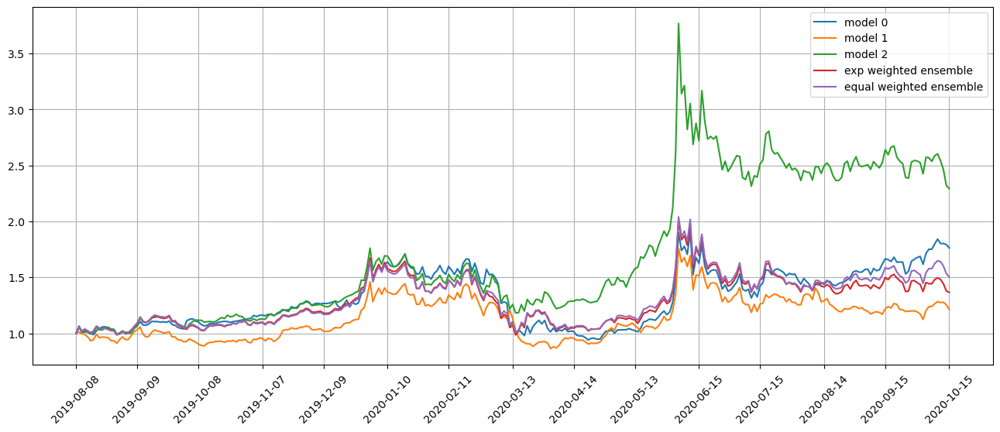

Standardization data are from 2019-03-15 to 2019-12-27
Training data are from 2019-12-30 to 2020-10-13
Testing data are from 2020-09-17 to 2020-11-10
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 16 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2400 - val_loss: 0.0845 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2447 - val_loss: 0.0863 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2425 - val_loss: 0.0843 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2396 - val_loss: 0.0881 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2393 - val_loss: 0.0853 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2372 - val_loss: 0.0851 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 7ms/step - loss: 0.2283 - val_loss: 0.0853 - lr: 0.0050
Epoch 17/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2271 - val_loss: 0.0853 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2263 - val_loss: 0.0888 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2261 - val_loss: 0.0871 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2250 - val_loss: 0.0873 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2248 - val_loss: 0.0869 - lr: 0.0025
Epoch 22/500
305/305 [==============================] - 2s 8ms/step - loss: 0.2241 - val_loss: 0.0867 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2251 - val_loss: 0.0869 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2241 - val_loss

position on 2020-10-20 market open will be {'CBRL': 0.1426447089593928, 'IHG': 0.14194605232729582, 'MAR': 0.13598653461697513, 'CCL': 0.1425406241771998, 'CHH': 0.13627204360975942, 'OXM': 0.13480302083376378, 'DPST': 0.13539368021567172, 'RYTM': 0.13358295558893746, 'H': 0.1367560631543468, 'SKYW': 0.14112207140660463}
Total asset on 2020-10-20 will be 1.3810477548899414
It should be the same as 1.3810477548899471
top_stocks by equal weighted ensemble to buy on 2020-10-19 are ['CCL', 'HXL', 'CHH', 'H', 'OXM', 'CBRL', 'MAR', 'EPR', 'IHG', 'RYTM']
position on 2020-10-20 market open will be {'EPR': 0.14429783252224768, 'CBRL': 0.15781494711743982, 'IHG': 0.15559984372966204, 'MAR': 0.1490670799843773, 'CCL': 0.156251607448443, 'CHH': 0.14938005208844266, 'OXM': 0.1477697240051143, 'HXL': 0.14639395168837385, 'H': 0.15235991828969336, 'RYTM': 0.1488247594218592}
Total asset on 2020-10-20 will be 1.5077597162956482
It should be the same as 1.5077597162956533
Testing data from 2020-09-22 t

Testing data from 2020-09-25 to 2020-10-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-10-23 are ['IMO', 'KEX', 'ERX', 'BP', 'CVX', 'CRS', 'GUSH', 'SU', 'DFEN', 'DPST']
position on 2020-10-26 market open will be {'DPST': 0.22399109432590666, 'DFEN': 0.1679520286154492, 'CRS': 0.20242082726807023, 'SU': 0.20043072663970524, 'CVX': 0.19478076488475787, 'IMO': 0.19592459320176278, 'GUSH': 0.19267461121526155, 'BP': 0.19767005484456443, 'ERX': 0.18981954247170163, 'KEX': 0.1955901980991362}
Total asset on 2020-10-26 will be 1.96125444156631
It should be the same as 1.961254441566316
top_stocks by model 1 to buy on 2020-10-23 are ['ALK', 'SU', 'KEX', 'EPD', 'GLNG', 'IMO', 'PARR', 'PBA', 'HYLS', 'CVX']
position on 2020-10-26 market open will be {'EPD': 0.12569178659197852, 'PARR': 0.13297127308091883, 'SU': 0.1306267343867539, 'CVX': 0.12694448433541558, 'IMO': 0.12768995166098207, 'PBA': 0.12635880064255767, 'HYLS': 0.13025949957948646, 'GLNG': 0.1175645270430074

top_stocks by model 1 to buy on 2020-10-28 are ['EPD', 'FTI', 'LYB', 'TRP', 'CVX', 'CNK', 'KMI', 'TRGP', 'OKE', 'BXMT']
position on 2020-10-29 market open will be {'TRP': 0.12366042949996923, 'CVX': 0.12002018550459707, 'KMI': 0.1219074109957937, 'CNK': 0.1207222257658004, 'FTI': 0.11835520188183446, 'BXMT': 0.12283149273928207, 'TRGP': 0.12099312898925148, 'EPD': 0.11974024711796084, 'OKE': 0.11815789704030911, 'LYB': 0.12041849526137267}
Total asset on 2020-10-29 will be 1.2068067147961652
It should be the same as 1.2068067147961712
top_stocks by model 2 to buy on 2020-10-28 are ['TWM', 'CHH', 'CZR', 'ESPR', 'SRTY', 'EQC', 'TZA', 'ARCH', 'CNK', 'BTU']
position on 2020-10-29 market open will be {'TWM': 0.2651546499628222, 'SRTY': 0.2792305528252349, 'TZA': 0.26281452022744467, 'ESPR': 0.23573507211627714, 'EQC': 0.23744993287663713, 'CHH': 0.2379274426960335, 'ARCH': 0.21741575488772585, 'CZR': 0.2360702233080469, 'CNK': 0.24135575872748605, 'BTU': 0.21557339239152884}
Total asset on 

position on 2020-11-03 market open will be {'CNK': 0.12485452279722278, 'ALSN': 0.12400921423034707, 'PBA': 0.1261259383625855, 'PDI': 0.12352529952863399, 'ITGR': 0.12173323751330797, 'TRP': 0.12371794330100613, 'SU': 0.13070531836254373, 'TRGP': 0.12693752893783863, 'KMI': 0.12504115660690254, 'GME': 0.12412902097507406}
Total asset on 2020-11-03 will be 1.2507791806154571
It should be the same as 1.2507791806154624
top_stocks by model 2 to buy on 2020-11-02 are ['SRTY', 'TWM', 'SAP', 'SH', 'PSQ', 'QID', 'SPXU', 'SDS', 'SPXS', 'CNK']
position on 2020-11-03 market open will be {'CNK': 0.24961731685383423, 'SH': 0.23703133658330355, 'SPXU': 0.23200129043390483, 'SPXS': 0.23168993860445508, 'TWM': 0.228892895916528, 'QID': 0.23933920228926223, 'SDS': 0.23480324233523528, 'SAP': 0.24477430857982052, 'PSQ': 0.23954818526266033, 'SRTY': 0.222454443791056}
Total asset on 2020-11-03 will be 2.360152160650052
It should be the same as 2.36015216065006
top_stocks by return weighted ensemble to 

top_stocks by model 1 to buy on 2020-11-05 are ['SRTY', 'LIVN', 'TWM', 'PSQ', 'ITGR', 'AMC', 'WING', 'DFEN', 'CNK', 'KOS']
position on 2020-11-06 market open will be {'CNK': 0.13046264723427692, 'ITGR': 0.12827908720442555, 'KOS': 0.1337467687685305, 'AMC': 0.12897010026306235, 'TWM': 0.12150601316862585, 'WING': 0.1273455895315406, 'DFEN': 0.12698285475956797, 'PSQ': 0.12721997839299432, 'SRTY': 0.11885536207663536, 'LIVN': 0.1313401385880059}
Total asset on 2020-11-06 will be 1.2747085399876599
It should be the same as 1.2747085399876652
top_stocks by model 2 to buy on 2020-11-05 are ['CVNA', 'HXL', 'AMC', 'PLCE', 'EBS', 'EPR', 'WING', 'RWT', 'ALT', 'VRTX']
position on 2020-11-06 market open will be {'EPR': 0.23776767657831827, 'ALT': 0.2607595386198344, 'AMC': 0.23100741049266463, 'VRTX': 0.23241297568879504, 'WING': 0.2336617007203294, 'HXL': 0.24389158655510298, 'PLCE': 0.23884307723698833, 'RWT': 0.235376499788323, 'EBS': 0.22060531975103384, 'CVNA': 0.23265998897999315}
Total as

top_stocks by model 2 to buy on 2020-11-10 are ['JETS', 'PII', 'LGND', 'CVNA', 'EBS', 'ANGI', 'PATK', 'THO', 'ALT', 'AIV']
position on 2020-11-11 market open will be {'ALT': 0.2037183921030746, 'CVNA': 0.22030907182328976, 'AIV': 0.2674744816337135, 'THO': 0.268276964985643, 'EBS': 0.2543836370934559, 'PATK': 0.25377680312607104, 'JETS': 0.2566932534237803, 'PII': 0.2674193920739247, 'ANGI': 0.2622635571292456, 'LGND': 0.2601963334273114}
Total asset on 2020-11-11 will be 2.5145118868195024
It should be the same as 2.51451188681951
top_stocks by return weighted ensemble to buy on 2020-11-10 are ['GUSH', 'SRNE', 'TWM', 'DFEN', 'ALT', 'THO', 'DPST', 'CVNA', 'OPK', 'AIV']
position on 2020-11-11 market open will be {'DPST': 0.25585647321673793, 'DFEN': 0.2302355539083195, 'CVNA': 0.1437615455145439, 'ALT': 0.11898098284123702, 'AIV': 0.1568436031707354, 'TWM': 0.14635877667614242, 'GUSH': 0.1610966143847388, 'THO': 0.15731416910896018, 'OPK': 0.17212503016402564, 'SRNE': 0.1617729210408013

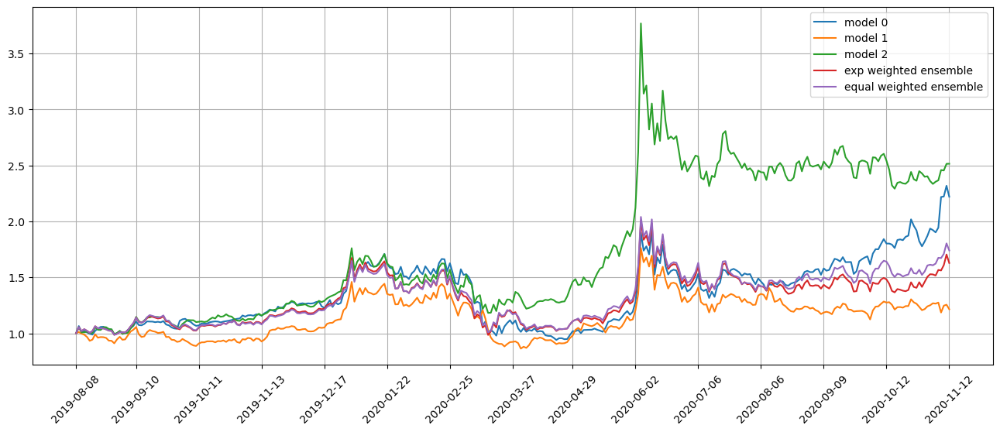

Standardization data are from 2019-04-12 to 2020-01-28
Training data are from 2020-01-29 to 2020-11-10
Testing data are from 2020-10-15 to 2020-12-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 17 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2362 - val_loss: 0.1142 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2357 - val_loss: 0.1104 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2340 - val_loss: 0.1112 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2344 - val_loss: 0.1153 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2330 - val_loss: 0.1157 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.2341 - val_loss: 0.1128 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.2215 - val_loss: 0.1118 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2204 - val_loss: 0.1122 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2203 - val_loss: 0.1123 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2200 - val_loss: 0.1124 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2204 - val_loss: 0.1131 - lr: 0.0010
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2197 - val_loss: 0.1120 - lr: 0.0010
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2197 - val_loss: 0.1120 - lr: 0.0010
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2193 - val_loss: 0.1117 - lr: 0.0010
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.2194 - val_loss

top_stocks by model 2 to buy on 2020-11-16 are ['KMB', 'LGND', 'EFX', 'G', 'GEO', 'QSR', 'ADP', 'PHM', 'CVE', 'SAP']
position on 2020-11-17 market open will be {'PHM': 0.2561472070511902, 'KMB': 0.2718215362624069, 'QSR': 0.2735694321883101, 'CVE': 0.26482340637483914, 'G': 0.2650842434709609, 'SAP': 0.2620230791034549, 'GEO': 0.2757443117323984, 'EFX': 0.27501006485392926, 'LGND': 0.2615445412042538, 'ADP': 0.2705070367247092}
Total asset on 2020-11-17 will be 2.676274858966445
It should be the same as 2.6762748589664525
top_stocks by return weighted ensemble to buy on 2020-11-16 are ['EFX', 'SLGN', 'SKY', 'ICLR', 'GLPG', 'MTH', 'CVE', 'JETS', 'PHM', 'SAP']
position on 2020-11-17 market open will be {'JETS': 0.16903254862701853, 'MTH': 0.15803640908871192, 'GLPG': 0.15790609115475335, 'PHM': 0.15977793051397984, 'CVE': 0.1815751552664164, 'SKY': 0.18460058221584447, 'SAP': 0.17965512158790287, 'EFX': 0.1885595986745973, 'ICLR': 0.1853334156175797, 'SLGN': 0.18410025239690192}
Total as

top_stocks by return weighted ensemble to buy on 2020-11-19 are ['FIS', 'JBLU', 'CBRL', 'DRI', 'CHEF', 'BP', 'CUK', 'RCL', 'ALSN', 'AMC']
position on 2020-11-20 market open will be {'ALSN': 0.18389238864114724, 'DRI': 0.18597625507912263, 'FIS': 0.1873766408407321, 'CBRL': 0.18526460221754895, 'CHEF': 0.18260746361795424, 'BP': 0.18630263822860596, 'RCL': 0.18636859460394317, 'JBLU': 0.18470257373502166, 'CUK': 0.18857865345946084, 'AMC': 0.1894447715242663}
Total asset on 2020-11-20 will be 1.8605145819477955
It should be the same as 1.860514581947803
top_stocks by equal weighted ensemble to buy on 2020-11-19 are ['JBLU', 'CBRL', 'VYX', 'DRI', 'CUK', 'CHEF', 'BP', 'AMC', 'RCL', 'ALSN']
position on 2020-11-20 market open will be {'ALSN': 0.18220280294135496, 'DRI': 0.1818745136145992, 'CBRL': 0.18117855639142527, 'VYX': 0.18754192195989108, 'CHEF': 0.17858002148597585, 'BP': 0.18219369832201804, 'RCL': 0.18225820001702817, 'JBLU': 0.18062892355333143, 'CUK': 0.18441951560667644, 'AMC':

position on 2020-11-25 market open will be {'SAP': 0.1815391148023635, 'ROP': 0.19350995838209978, 'KBH': 0.17887988480002293, 'WTW': 0.19103510071471466, 'AIV': 0.18908387731552426, 'WEN': 0.18972075097811034, 'GIB': 0.190911868470731, 'JKHY': 0.1861152742584361, 'MTH': 0.18331775760380387, 'AON': 0.1905198203016981}
Total asset on 2020-11-25 will be 1.8746334076274986
It should be the same as 1.8746334076275042
Testing data from 2020-10-28 to 2020-11-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-11-25 are ['EBAY', 'BFAM', 'MODG', 'ITGR', 'ESPR', 'GUSH', 'DFEN', 'ZOM', 'DPST', 'JETS']
position on 2020-11-27 market open will be {'DPST': 0.34432031512707656, 'JETS': 0.25243561533076353, 'GUSH': 0.2984704234002755, 'DFEN': 0.27770123487839243, 'ESPR': 0.24506098075031926, 'ITGR': 0.24327342034308622, 'MODG': 0.25774517120317125, 'BFAM': 0.24877698331251855, 'ZOM': 0.248128755835612, 'EBAY': 0.24905770406922328}
Total asset on 2020-11-27 will be 2.664970604250

position on 2020-12-02 market open will be {'DPST': 0.3121307305100789, 'JETS': 0.24735374962027823, 'GUSH': 0.24859668647533834, 'DFEN': 0.252382831424695, 'CENN': 0.20248785271930814, 'HBI': 0.23748644270744484, 'AIV': 0.27470042924411925, 'AHT': 0.21730687325364648, 'ZOM': 0.24302891131224139, 'AMC': 0.223827981193912}
Total asset on 2020-12-02 will be 2.459302488461055
It should be the same as 2.4593024884610624
top_stocks by model 1 to buy on 2020-12-01 are ['CIM', 'SU', 'PAGP', 'WES', 'OXM', 'PAA', 'ERJ', 'CENN', 'AAT', 'PARR']
position on 2020-12-02 market open will be {'OXM': 0.13129753792125784, 'CENN': 0.10385782985360559, 'AAT': 0.12332035836626608, 'ERJ': 0.12437707137587994, 'SU': 0.11785296852061769, 'PAGP': 0.12064687106276856, 'PAA': 0.12290572816394382, 'CIM': 0.12373803268113281, 'PARR': 0.1255747849863098, 'WES': 0.12052556309400635}
Total asset on 2020-12-02 will be 1.2140967460257828
It should be the same as 1.2140967460257885
top_stocks by model 2 to buy on 2020-1

Testing data from 2020-11-05 to 2020-12-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-04 are ['VMC', 'BKD', 'BTU', 'ZOM', 'VRE', 'HBI', 'DPST', 'CENN', 'GUSH', 'JETS']
position on 2020-12-07 market open will be {'DPST': 0.3498866943554588, 'JETS': 0.26050029281694187, 'GUSH': 0.3122899353830231, 'CENN': 0.2036866460686636, 'ZOM': 0.24302891131224139, 'HBI': 0.23791394310436606, 'VMC': 0.2456528913311082, 'VRE': 0.24471240275491274, 'BKD': 0.24547775779399794, 'BTU': 0.2480978125195801}
Total asset on 2020-12-07 will be 2.591247287440286
It should be the same as 2.591247287440294
top_stocks by model 1 to buy on 2020-12-04 are ['F', 'HOG', 'BABA', 'MTDR', 'NOG', 'FANG', 'RITM', 'BKD', 'VRE', 'HBI']
position on 2020-12-07 market open will be {'HBI': 0.12296395321947616, 'FANG': 0.13594010184875607, 'RITM': 0.12539240561005757, 'F': 0.1269811284101661, 'NOG': 0.13862104053838198, 'HOG': 0.12452342543597872, 'BKD': 0.12687325144521605, 'VRE': 0.12647768370339

position on 2020-12-10 market open will be {'DPST': 0.34654685711143446, 'JETS': 0.252325137698856, 'GUSH': 0.3156868980557521, 'ZOM': 0.24302891131224139, 'MHO': 0.2295668443648628, 'RWM': 0.23896974882342673, 'ERY': 0.2371035308225816, 'FOXF': 0.22978731253208656, 'KNDI': 0.22371633538099656, 'BTU': 0.20945336921182384}
Total asset on 2020-12-10 will be 2.526184945314055
It should be the same as 2.5261849453140623
top_stocks by model 1 to buy on 2020-12-09 are ['MHO', 'LC', 'W', 'STAG', 'ERY', 'BAP', 'HOG', 'FOXF', 'HBI', 'POOL']
position on 2020-12-10 market open will be {'HBI': 0.12384163521523091, 'W': 0.12737004155416534, 'HOG': 0.12680222685263196, 'MHO': 0.12588354074272678, 'STAG': 0.1257150735151836, 'BAP': 0.1258107584438348, 'POOL': 0.12653529282494996, 'ERY': 0.13001630120031932, 'LC': 0.11898769276289, 'FOXF': 0.12600443500159927}
Total asset on 2020-12-10 will be 1.2569669981135263
It should be the same as 1.2569669981135319
top_stocks by model 2 to buy on 2020-12-09 are

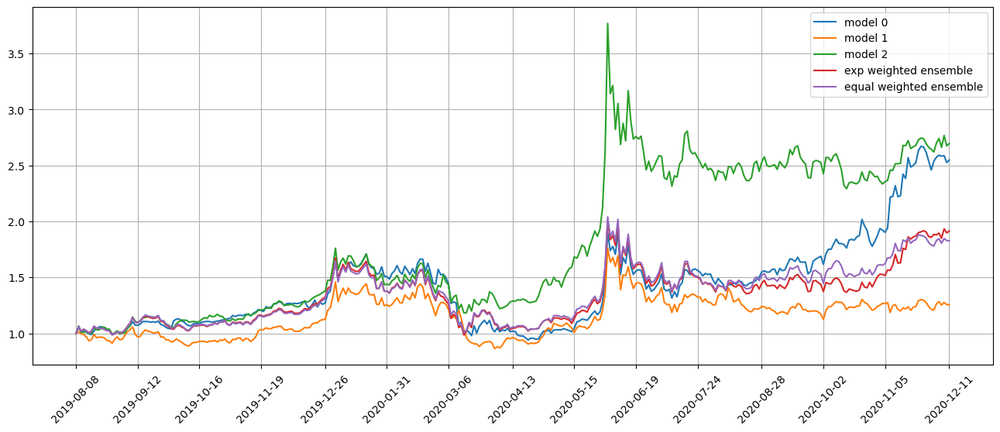

Standardization data are from 2019-05-13 to 2020-02-26
Training data are from 2020-02-27 to 2020-12-09
Testing data are from 2020-11-12 to 2021-01-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 18 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1586 - val_loss: 0.1200 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1595 - val_loss: 0.1211 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1600 - val_loss: 0.1217 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1617 - val_loss: 0.1194 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1567 - val_loss: 0.1196 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1558 - val_loss: 0.1207 - lr: 0.0100
Epoch 7/500
305/305 [

Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.15020640491817344
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.08978032694002902
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.14666571940723788
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.09059651377243993
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.14404696460277586
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.09121981880630757
Correlations between old and new weights
0.9821355376702697
-0.34989371004544945
0.9962103063323255
0.8326773177898926
0.9962558185911479
0.9196410986359826
Weight of model 0 is 0.5035464215527947
Weight of model 1 is 0.23515168877073583
Weight of model 2 is 0.26130188967646945
Testing data from 2020-11-12 to 2020-12-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-11 are ['BLNK', 'MFA

Testing data from 2020-11-17 to 2020-12-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2020-12-16 are ['CENN', 'MFA', 'MARA', 'IDEX', 'JETS', 'BLNK', 'GEVO', 'KODK', 'KNDI', 'MRIN']
position on 2020-12-17 market open will be {'JETS': 0.2527670271550331, 'MARA': 0.49358240720568514, 'BLNK': 0.2715391328035456, 'MFA': 0.25978445424091284, 'MRIN': 0.25445553169000856, 'GEVO': 0.3313839441461195, 'KODK': 0.23672076231045372, 'IDEX': 0.2544555316900086, 'CENN': 0.23868891273012655, 'KNDI': 0.24858111529433352}
Total asset on 2020-12-17 will be 2.8419588192662193
It should be the same as 2.841958819266227
top_stocks by model 1 to buy on 2020-12-16 are ['WFC', 'TRP', 'UAL', 'SAVE', 'WBA', 'RCL', 'SLG', 'CUK', 'ENB', 'CCL']
position on 2020-12-17 market open will be {'CCL': 0.12180408429482839, 'RCL': 0.12123301167557106, 'TRP': 0.12344423772415342, 'WBA': 0.12220889637890385, 'WFC': 0.12458387719393335, 'UAL': 0.12338200144083016, 'SAVE': 0.12645952828344503, 'ENB': 0.1

position on 2020-12-22 market open will be {'JETS': 0.24414998258077011, 'MARA': 0.6616865610906425, 'BLNK': 0.3505821975588931, 'MFA': 0.2584522275735354, 'MRIN': 0.2743348608873949, 'GEVO': 0.44233838925837193, 'KODK': 0.24237533676255554, 'IDEX': 0.3047873951012191, 'CENN': 0.2833609601815896, 'KNDI': 0.24610767370818093}
Total asset on 2020-12-22 will be 3.308175584703145
It should be the same as 3.3081755847031538
top_stocks by model 1 to buy on 2020-12-21 are ['RYTM', 'COLB', 'SAVE', 'SFNC', 'PFE', 'DK', 'AIV', 'WBA', 'RCL', 'CACC']
position on 2020-12-22 market open will be {'RCL': 0.11944805215452658, 'RYTM': 0.12011218427128914, 'CACC': 0.12243648522211163, 'PFE': 0.11876971369717346, 'WBA': 0.11913986580249007, 'AIV': 0.13078761379490414, 'COLB': 0.11751175764436089, 'DK': 0.12383637314932991, 'SAVE': 0.12103982759358188, 'SFNC': 0.1185409140017832}
Total asset on 2020-12-22 will be 1.2116227873315446
It should be the same as 1.2116227873315508
top_stocks by model 2 to buy on

position on 2020-12-28 market open will be {'VTLE': 0.13398551729584432, 'ABEV': 0.12138070365607453, 'FIS': 0.12926953233387478, 'ERJ': 0.12349337911028432, 'PAGP': 0.12160447033764092, 'ABG': 0.12403654864462083, 'BB': 0.12352079300296089, 'ITUB': 0.1238687385715904, 'TM': 0.12627717110285588, 'HMC': 0.12295665731148632}
Total asset on 2020-12-28 will be 1.2503935113672273
It should be the same as 1.2503935113672333
top_stocks by model 2 to buy on 2020-12-24 are ['BVN', 'BOIL', 'FIS', 'FAZ', 'BCRX', 'FDS', 'FCN', 'WLY', 'ERJ', 'VTLE']
position on 2020-12-28 market open will be {'VTLE': 0.29403940816465063, 'BVN': 0.2770502049439364, 'FIS': 0.28310633295541504, 'ERJ': 0.2704562867442493, 'FAZ': 0.2662876634597041, 'FDS': 0.2735747019123618, 'WLY': 0.2716984610393553, 'BCRX': 0.2612442608618996, 'FCN': 0.2744044159166487, 'BOIL': 0.21426517361642128}
Total asset on 2020-12-28 will be 2.6861269096146283
It should be the same as 2.686126909614642
top_stocks by return weighted ensemble to

position on 2020-12-31 market open will be {'MRIN': 0.21339418982259856, 'KODK': 0.17459314148211127, 'QSR': 0.20794194363499827, 'IGT': 0.2271957025757408, 'FAF': 0.21335389538936209, 'DRI': 0.20960824788308996, 'EC': 0.21062323194251978, 'MTH': 0.20968066314871617, 'AGO': 0.21152438486627737, 'BJRI': 0.21192738577761847}
Total asset on 2020-12-31 will be 2.089842786523025
It should be the same as 2.089842786523033
top_stocks by equal weighted ensemble to buy on 2020-12-30 are ['EVRI', 'ABEV', 'FAF', 'AGO', 'BJRI', 'KODK', 'EC', 'QSR', 'IGT', 'DRI']
position on 2020-12-31 market open will be {'KODK': 0.16814504984919393, 'QSR': 0.1860768004621485, 'EVRI': 0.1805357407096885, 'IGT': 0.19531776257228112, 'FAF': 0.18341810611333417, 'AGO': 0.18104872628144303, 'DRI': 0.18207315103613297, 'EC': 0.18295480215348264, 'ABEV': 0.18083280132515564, 'BJRI': 0.18408763638395967}
Total asset on 2020-12-31 will be 1.8244905768868138
It should be the same as 1.8244905768868203
Testing data from 202

top_stocks by model 0 to buy on 2021-01-06 are ['JETS', 'MVIS', 'MFA', 'GEVO', 'ARCT', 'CENN', 'MARA', 'KNDI', 'KODK', 'MRIN']
position on 2021-01-07 market open will be {'JETS': 0.24746422725218617, 'MARA': 1.0311069653596854, 'MFA': 0.25578775835738593, 'MRIN': 0.27168428506540376, 'GEVO': 0.6982732768675505, 'KODK': 0.21178925289662734, 'CENN': 0.5001518372247833, 'KNDI': 0.23312209063800501, 'ARCT': 0.3010216286942256, 'MVIS': 0.35232917092197}
Total asset on 2021-01-07 will be 4.102730493277813
It should be the same as 4.102730493277822
top_stocks by model 1 to buy on 2021-01-06 are ['EVRI', 'EPR', 'MTH', 'BJRI', 'PHM', 'KBH', 'DRI', 'HOG', 'CBRL', 'CARG']
position on 2021-01-07 market open will be {'CBRL': 0.12606365785181545, 'CARG': 0.12841508844389793, 'EPR': 0.13371829200540308, 'DRI': 0.13320827152304804, 'KBH': 0.1338901655216732, 'EVRI': 0.12789196896787278, 'HOG': 0.1372470073603553, 'MTH': 0.1338944046756777, 'PHM': 0.13180162853299562, 'BJRI': 0.1408003546018025}
Total 

position on 2021-01-12 market open will be {'CARG': 0.13001180073009944, 'IHG': 0.13378674604048027, 'VTNR': 0.13871131106066079, 'DBI': 0.14625431262292943, 'AIV': 0.12798304134000102, 'LULU': 0.13230946354299042, 'CUK': 0.12773142607984864, 'AZUL': 0.12918920597671404, 'HRB': 0.1328566041738902, 'BTU': 0.1443970019971989}
Total asset on 2021-01-12 will be 1.3432309135648077
It should be the same as 1.3432309135648133
top_stocks by model 2 to buy on 2021-01-11 are ['HXL', 'DBI', 'CYBR', 'ERY', 'RWM', 'TZA', 'SRTY', 'TWM', 'FAZ', 'BTU']
position on 2021-01-12 market open will be {'TWM': 0.285588399432348, 'FAZ': 0.2808650584466789, 'RWM': 0.28506987251901306, 'ERY': 0.2761002685460489, 'TZA': 0.2861737372538989, 'DBI': 0.3109028830595042, 'HXL': 0.2783183072729036, 'SRTY': 0.26167659405452376, 'CYBR': 0.2907710084825543, 'BTU': 0.30695466971850394}
Total asset on 2021-01-12 will be 2.8624207987859602
It should be the same as 2.862420798785977
top_stocks by return weighted ensemble to b

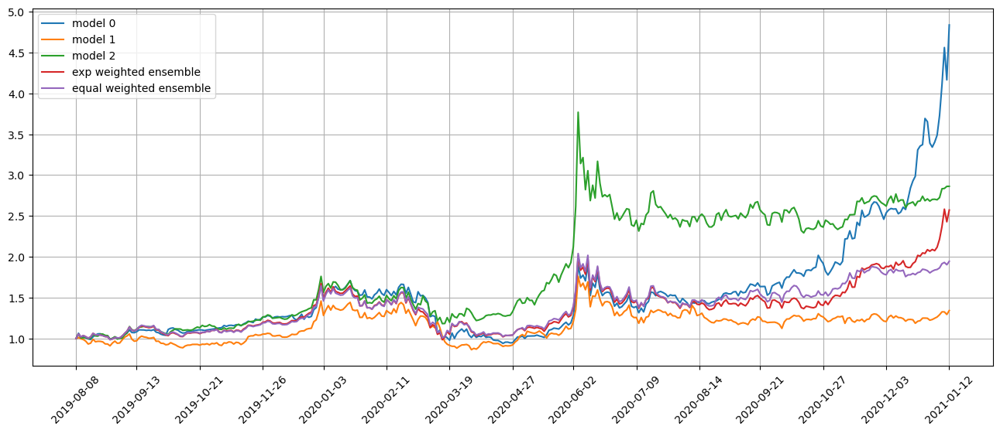

Standardization data are from 2019-06-11 to 2020-03-25
Training data are from 2020-03-26 to 2021-01-08
Testing data are from 2020-12-11 to 2021-02-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 19 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1437 - val_loss: 0.0929 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1427 - val_loss: 0.0936 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1423 - val_loss: 0.0933 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1421 - val_loss: 0.0931 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1424 - val_loss: 0.0930 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1420 - val_loss: 0.0930 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.13283256927790973
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.2547564768369546
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.1323489750216806
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.26889244665021106
96/96 [==============================] - 0s 4ms/step
Model 2 training loss 0.1325770076548703
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.28329754360069287
Correlations between old and new weights
0.97709561617343
0.8634144284767185
0.9806445216284374
0.7758288596224734
0.9734488953148396
0.4953004966958391
Weight of model 0 is 0.7933727046334916
Weight of model 1 is 0.097853906415761
Weight of model 2 is 0.10877338895074758
Testing data from 2020-12-11 to 2021-01-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-01-12 are ['ARCT', 'BABA', 'MVIS', 'BLNK', 'KODK', 'KNDI'

position on 2021-01-15 market open will be {'MARA': 0.18671893962396138, 'MRIN': 0.19399370030183336, 'GEVO': 0.24748322731697686, 'KODK': 0.19950215217403652, 'KNDI': 0.19709951355250915, 'SENS': 0.405812709846209, 'CENN': 0.19164483966270543, 'LC': 0.19736609357241258, 'CCL': 0.20569475000125648, 'WTW': 0.20158650567288666}
Total asset on 2021-01-15 will be 2.226902431724781
It should be the same as 2.2269024317247874
Testing data from 2020-12-16 to 2021-01-14 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-01-15 are ['RWM', 'MVIS', 'ARCT', 'BLNK', 'KODK', 'KNDI', 'GEVO', 'CENN', 'MARA', 'MRIN']
position on 2021-01-19 market open will be {'MARA': 1.2170945108409843, 'MRIN': 0.27963601253137754, 'GEVO': 1.3107417941351622, 'KODK': 0.209219009608865, 'CENN': 0.6861393821599969, 'KNDI': 0.24919949043374653, 'ARCT': 0.3656924448922204, 'MVIS': 0.4501983833385293, 'BLNK': 0.26830086424394756, 'RWM': 0.482813876644194}
Total asset on 2021-01-19 will be 5.51903576882

Testing data from 2020-12-21 to 2021-01-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-01-21 are ['ERJ', 'ARCT', 'MVIS', 'BLNK', 'KNDI', 'KODK', 'GEVO', 'CENN', 'MRIN', 'MARA']
position on 2021-01-22 market open will be {'MARA': 0.959062334941626, 'MRIN': 0.2995153627936681, 'GEVO': 1.3566030268593436, 'KODK': 0.23029511732321228, 'CENN': 0.6668690964989429, 'KNDI': 0.24950864851770346, 'ARCT': 0.3681932060282419, 'MVIS': 0.43323437158600236, 'BLNK': 0.24747154349362116, 'ERJ': 0.44164026348356067}
Total asset on 2021-01-22 will be 5.2523929715259134
It should be the same as 5.252392971525922
top_stocks by model 1 to buy on 2021-01-21 are ['RWM', 'TOON', 'ERJ', 'AIV', 'GEVO', 'CENN', 'KNDI', 'KODK', 'MARA', 'MRIN']
position on 2021-01-22 market open will be {'MARA': 0.10505185359372445, 'MRIN': 0.14119544411006876, 'GEVO': 0.23917334663643194, 'KODK': 0.1485845490120475, 'CENN': 0.11581500242027154, 'KNDI': 0.1334959755581345, 'TOON': 0.17409185514723552, 'A

top_stocks by model 1 to buy on 2021-01-26 are ['GNW', 'MUR', 'RIG', 'HLX', 'CENN', 'GEVO', 'KNDI', 'KODK', 'MARA', 'MRIN']
position on 2021-01-27 market open will be {'MARA': 0.09564923549076433, 'MRIN': 0.13432309135648135, 'GEVO': 0.2942066808883959, 'KODK': 0.21093699721685172, 'CENN': 0.0889909481727345, 'KNDI': 0.14375217044023905, 'MUR': 0.17167246989206822, 'GNW': 0.17044089282543654, 'HLX': 0.16797583500846008, 'RIG': 0.1741092416866168}
Total asset on 2021-01-27 will be 1.6520575629780427
It should be the same as 1.6520575629780487
top_stocks by model 2 to buy on 2021-01-26 are ['MJ', 'ERJ', 'XELA', 'RGR', 'GNW', 'ZOM', 'MARA', 'GEVO', 'DPST', 'BTU']
position on 2021-01-27 market open will be {'MARA': 0.20413039268190736, 'DPST': 0.2921268378798347, 'ZOM': 0.33502759935281395, 'XELA': 0.30307782451644244, 'GNW': 0.3306184747572465, 'ERJ': 0.33507029450548936, 'GEVO': 0.2955073068631892, 'RGR': 0.32778581276298857, 'MJ': 0.33632238095852296, 'BTU': 0.3452652063560234}
Total as

position on 2021-02-01 market open will be {'DPST': 0.27723778198177096, 'GEVO': 0.27952686714693026, 'VTNR': 0.2609645256242608, 'AMC': 0.44759307048815716, 'BOIL': 0.34748430385251333, 'SNDR': 0.32943570700520297, 'GRFS': 0.3102080651207687, 'ANY': 0.32379388808633336, 'CENN': 0.2669243736625391, 'LLY': 0.3156894654177736}
Total asset on 2021-02-01 will be 3.1588580483862287
It should be the same as 3.1588580483862505
top_stocks by return weighted ensemble to buy on 2021-01-29 are ['SNDR', 'GRFS', 'GLPG', 'TOON', 'KNDI', 'KODK', 'GEVO', 'MARA', 'MRIN', 'CENN']
position on 2021-02-01 market open will be {'MRIN': 0.22037437478685756, 'KODK': 0.20051880011815074, 'MARA': 0.422073015716496, 'GEVO': 0.5208040006297646, 'CENN': 0.8701869129983817, 'KNDI': 0.27361433920908446, 'GRFS': 0.3017144183090008, 'TOON': 0.2902881858056527, 'SNDR': 0.32041559806187847, 'GLPG': 0.3145537557013141}
Total asset on 2021-02-01 will be 3.734543401336573
It should be the same as 3.7345434013365812
top_stoc

top_stocks by model 2 to buy on 2021-02-03 are ['CXW', 'CCL', 'JETS', 'GRBK', 'PBF', 'GEVO', 'DPST', 'AAL', 'VTNR', 'AMC']
position on 2021-02-04 market open will be {'DPST': 0.3213558159758803, 'GEVO': 0.3209188470539579, 'VTNR': 0.33854858287249484, 'AMC': 0.22906233607335102, 'GRBK': 0.26363498954678777, 'CCL': 0.28447272882828506, 'AAL': 0.2798423206363088, 'JETS': 0.2707644910636246, 'PBF': 0.2940987204068094, 'CXW': 0.25346096845496846}
Total asset on 2021-02-04 will be 2.856159800912447
It should be the same as 2.856159800912468
top_stocks by return weighted ensemble to buy on 2021-02-03 are ['TOON', 'PLUG', 'BLNK', 'KNDI', 'KODK', 'AMC', 'CENN', 'MARA', 'GEVO', 'MRIN']
position on 2021-02-04 market open will be {'MRIN': 0.22436304738084098, 'KODK': 0.21003838529302565, 'MARA': 0.4922134312317206, 'GEVO': 0.5979239889500129, 'CENN': 0.6156109544084296, 'KNDI': 0.2672722841306922, 'BLNK': 0.3232511017964571, 'AMC': 0.15698023578731268, 'TOON': 0.29630639520428176, 'PLUG': 0.30015

position on 2021-02-09 market open will be {'DPST': 0.3600429726112744, 'AMC': 0.15297151007287713, 'SIRI': 0.2723764052994367, 'DDS': 0.27030825439982176, 'IVR': 0.2733926524329222, 'VRNT': 0.27159687067499394, 'LLY': 0.27738258089827456, 'GME': 0.21539903806517013, 'HRB': 0.27681710049115826, 'REXR': 0.2754077389170873}
Total asset on 2021-02-09 will be 2.6456951238629958
It should be the same as 2.645695123863017
top_stocks by return weighted ensemble to buy on 2021-02-08 are ['HRB', 'BLNK', 'KNDI', 'KODK', 'AMC', 'MARA', 'GEVO', 'MRIN', 'CENN', 'GME']
position on 2021-02-09 market open will be {'MRIN': 0.275218662578069, 'KODK': 0.22786228164159178, 'MARA': 0.7282707548697706, 'GEVO': 0.6530794318839301, 'CENN': 0.5322951861426273, 'KNDI': 0.27844637568762926, 'AMC': 0.1048339248242533, 'BLNK': 0.2478422419470533, 'GME': 0.24046214990604037, 'HRB': 0.30902661271273196}
Total asset on 2021-02-09 will be 3.5973376221936864
It should be the same as 3.597337622193697
top_stocks by equa

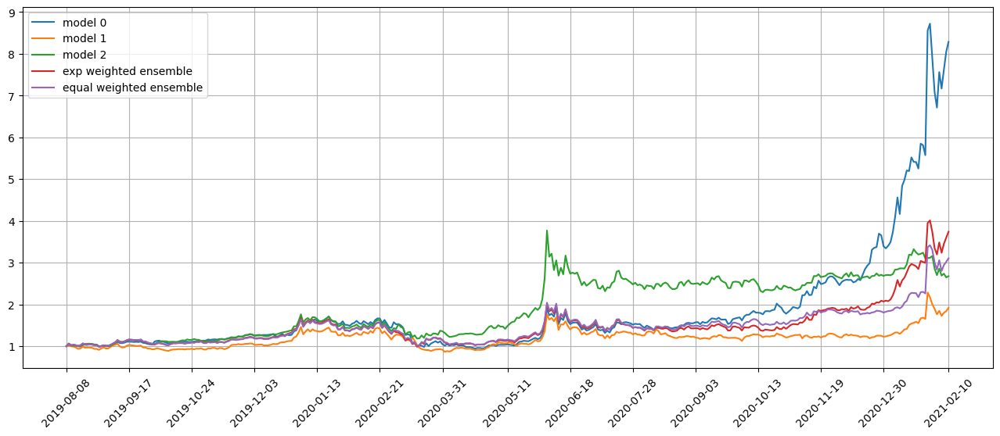

Standardization data are from 2019-07-10 to 2020-04-23
Training data are from 2020-04-24 to 2021-02-08
Testing data are from 2021-01-12 to 2021-03-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 20 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1231 - val_loss: 0.1869 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1227 - val_loss: 0.1918 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1217 - val_loss: 0.2136 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1216 - val_loss: 0.2219 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1206 - val_loss: 0.3392 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1203 - val_loss: 0.3251 - lr: 0.0100
Epoch 7/500
305/305 [

11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.11159208264575363
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.13623029196447808
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.12207206745487428
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.13805798347898196
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.11327230436173395
Correlations between old and new weights
0.9797320581115276
0.8491660696589205
0.9837420445737171
0.040026360971151996
0.9904649807601201
0.30276248484314205
Weight of model 0 is 0.9768357554834722
Weight of model 1 is 0.014066083119455893
Weight of model 2 is 0.009098161397071852
Testing data from 2021-01-12 to 2021-02-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-10 are ['TOON', 'PLUG', 'BLNK', 'AVXL', 'KNDI', 'GEVO', 'KODK', 'CENN', 'MARA', 'GME']
position on 2021-02-11 market open will be {'MARA'

position on 2021-02-16 market open will be {'GEVO': 0.5529762188149848, 'KODK': 0.2593767482128314, 'KNDI': 0.21716783130512815, 'MARA': 0.586875831953763, 'CENN': 0.312479917882317, 'GME': 0.2712127206110564, 'DQ': 0.26655790345706726, 'SAVA': 0.2688256314586169, 'APPS': 0.2504038695884098, 'TSLA': 0.2526969813624553}
Total asset on 2021-02-16 will be 3.2385736546466233
It should be the same as 3.23857365464663
Testing data from 2021-01-15 to 2021-02-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-16 are ['GNW', 'HRB', 'BLNK', 'TOON', 'PLUG', 'KNDI', 'MARA', 'GEVO', 'KODK', 'CENN']
position on 2021-02-17 market open will be {'MARA': 2.3519252546620524, 'GEVO': 1.9587157705210227, 'KODK': 0.2619092788947333, 'CENN': 1.7956413618229712, 'KNDI': 0.2730063730719028, 'BLNK': 0.25863794194787687, 'GNW': 0.35346443646179393, 'TOON': 0.4235301540522896, 'HRB': 0.4317143035118535, 'PLUG': 0.3785219887950384}
Total asset on 2021-02-17 will be 8.487066863741521
It s

Testing data from 2021-01-21 to 2021-02-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-02-19 are ['PGRE', 'CELH', 'UUP', 'BLNK', 'PLUG', 'GNW', 'KNDI', 'GEVO', 'KODK', 'CENN']
position on 2021-02-22 market open will be {'GEVO': 1.864034734320193, 'KODK': 0.23517859672828414, 'CENN': 1.7226478105293548, 'KNDI': 0.25167293201989915, 'BLNK': 0.24631924195648217, 'GNW': 0.7099871803817851, 'PLUG': 0.7621641218799207, 'PGRE': 0.7503612907952317, 'UUP': 0.7462878441476124, 'CELH': 0.7537247165791128}
Total asset on 2021-02-22 will be 8.042378469337864
It should be the same as 8.042378469337876
top_stocks by model 1 to buy on 2021-02-19 are ['CLDX', 'PACB', 'TSLA', 'UNG', 'MARA', 'CELH', 'KNDI', 'KODK', 'CENN', 'GME']
position on 2021-02-22 market open will be {'MARA': 0.20736126801155216, 'KODK': 0.15173533046779958, 'KNDI': 0.13465394398618882, 'CENN': 0.16965626004126028, 'GME': 0.15251600004640337, 'PACB': 0.1712909320161255, 'CLDX': 0.18359955056995103, 'TSLA'

position on 2021-02-25 market open will be {'GEVO': 1.6228937233459257, 'KODK': 0.24109020286272942, 'CENN': 1.7810426515642483, 'KNDI': 0.22972110108560787, 'BLNK': 0.23446694673984741, 'AHT': 0.7726288679001931, 'TOON': 0.7218599531718167, 'GNW': 0.7476331857470209, 'GME': 2.8088927255826275, 'AMC': 1.11534404408063}
Total asset on 2021-02-25 will be 10.275573402080635
It should be the same as 10.275573402080646
top_stocks by model 1 to buy on 2021-02-24 are ['BZUN', 'FIZZ', 'MVIS', 'TSLA', 'KNDI', 'PBI', 'IRBT', 'KODK', 'CENN', 'GME']
position on 2021-02-25 market open will be {'KODK': 0.15554945098252432, 'KNDI': 0.12290893593428344, 'CENN': 0.17540731970367585, 'BZUN': 0.16217406093567266, 'MVIS': 0.16249709744918267, 'FIZZ': 0.18085566772276962, 'TSLA': 0.1663406604593026, 'GME': 0.6185523309901877, 'PBI': 0.1726459233360137, 'IRBT': 0.16789638369712476}
Total asset on 2021-02-25 will be 2.0848278312107293
It should be the same as 2.084827831210737
top_stocks by model 2 to buy on

top_stocks by model 0 to buy on 2021-03-01 are ['HSBC', 'BLNK', 'UUP', 'AHT', 'TOON', 'AMC', 'KNDI', 'GEVO', 'KODK', 'CENN']
position on 2021-03-02 market open will be {'GEVO': 1.4853101662592532, 'KODK': 0.23389348734034823, 'CENN': 1.5620619976833985, 'KNDI': 0.23003028865531433, 'BLNK': 0.2233279900170212, 'TOON': 0.6857669708114326, 'AMC': 0.9361106143476408, 'UUP': 1.4007415475682254, 'HSBC': 1.4171728596082054, 'AHT': 1.2721934189167132}
Total asset on 2021-03-02 will be 9.446609341207544
It should be the same as 9.446609341207552
top_stocks by model 1 to buy on 2021-03-01 are ['SE', 'NOK', 'PLUG', 'LUMN', 'BLNK', 'RIOT', 'GEVO', 'KNDI', 'KODK', 'CENN']
position on 2021-03-02 market open will be {'KODK': 0.15090618827383107, 'KNDI': 0.12307436224913716, 'CENN': 0.1538408459696174, 'GEVO': 0.2132420793082098, 'BLNK': 0.2363636190930484, 'NOK': 0.2369734914397007, 'PLUG': 0.22793689692847133, 'RIOT': 0.27270429706913996, 'SE': 0.25263319683360397, 'LUMN': 0.2365059019166849}
Total 

top_stocks by model 1 to buy on 2021-03-04 are ['ROKU', 'PBF', 'SAVA', 'TSLA', 'MVIS', 'MARA', 'KODK', 'APPS', 'CENN', 'PLUG']
position on 2021-03-05 market open will be {'KODK': 0.1361472263240354, 'CENN': 0.12939884240435112, 'PLUG': 0.1826948054754725, 'APPS': 0.1819676875242689, 'MVIS': 0.18993325258741164, 'MARA': 0.1914198474965778, 'TSLA': 0.19373727079919859, 'SAVA': 0.19115682376875678, 'PBF': 0.205807557129013, 'ROKU': 0.198781851748503}
Total asset on 2021-03-05 will be 1.8010451652575807
It should be the same as 1.801045165257589
top_stocks by model 2 to buy on 2021-03-04 are ['RIOT', 'KODK', 'RH', 'ROKU', 'APPS', 'MVIS', 'CENN', 'TSLA', 'MARA', 'PLUG']
position on 2021-03-05 market open will be {'KODK': 0.17913735769782152, 'CENN': 0.18684879969798468, 'RIOT': 0.28643015148901424, 'MARA': 0.24648728643914658, 'MVIS': 0.2775943427269657, 'PLUG': 0.2881563757273226, 'RH': 0.29623831914469423, 'TSLA': 0.283154053419207, 'APPS': 0.27120294590989985, 'ROKU': 0.29052689158144857

top_stocks by model 2 to buy on 2021-03-09 are ['KNDI', 'MSTR', 'GEVO', 'ARKQ', 'MVIS', 'KODK', 'CENN', 'RIOT', 'MARA', 'GME']
position on 2021-03-10 market open will be {'KODK': 0.19157441479221116, 'CENN': 0.20968587521662732, 'RIOT': 0.36607541889693007, 'MARA': 0.2997407100137068, 'MVIS': 0.3088696941726719, 'GEVO': 0.3604134352634817, 'ARKQ': 0.30430451974152295, 'GME': 0.359335963511053, 'KNDI': 0.3128694473611171, 'MSTR': 0.3171827733524838}
Total asset on 2021-03-10 will be 3.0300522523217843
It should be the same as 3.030052252321805
top_stocks by return weighted ensemble to buy on 2021-03-09 are ['AMC', 'TOON', 'GME', 'MVIS', 'KNDI', 'RIOT', 'GEVO', 'KODK', 'MARA', 'CENN']
position on 2021-03-10 market open will be {'KODK': 0.1778338463971007, 'GEVO': 0.44417212469673645, 'CENN': 0.4674940330470034, 'KNDI': 0.20566374702622364, 'MVIS': 0.37025905674038656, 'TOON': 0.5403294093207792, 'RIOT': 0.5342146510009066, 'GME': 0.5438141406764969, 'MARA': 0.5407018468829369, 'AMC': 0.5

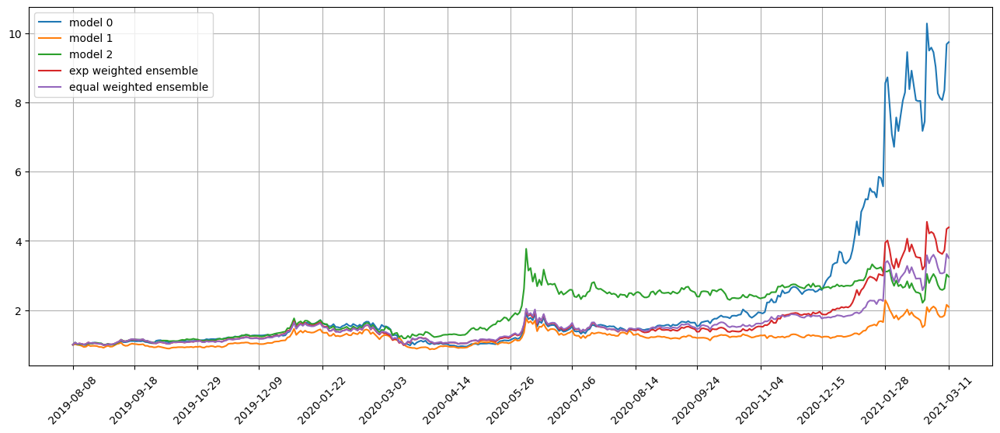

Standardization data are from 2019-08-07 to 2020-05-21
Training data are from 2020-05-22 to 2021-03-09
Testing data are from 2021-02-10 to 2021-04-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 21 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1047 - val_loss: 0.1919 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1042 - val_loss: 0.1935 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1040 - val_loss: 0.1957 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1041 - val_loss: 0.1964 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1042 - val_loss: 0.1994 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1040 - val_loss: 0.2020 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1028 - val_loss: 0.2745 - lr: 0.0025
Epoch 22/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1025 - val_loss: 0.2854 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1026 - val_loss: 0.3040 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1024 - val_loss: 0.2739 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1024 - val_loss: 0.2907 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1022 - val_loss: 0.3275 - lr: 0.0012
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.121768280085165
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.0744645197685326
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.12284427847274373
11/11 [=============

position on 2021-03-16 market open will be {'GEVO': 0.36613956967338596, 'KODK': 0.22919994632759583, 'KNDI': 0.1708195806905837, 'CENN': 0.22000818944890888, 'MARA': 0.45155346999481444, 'APPS': 0.38828471479008086, 'RIOT': 0.5298519233372121, 'GME': 0.3950591191909643, 'WKHS': 0.4443927778113152, 'MSTR': 0.3992405506202166}
Total asset on 2021-03-16 will be 3.594549841885068
It should be the same as 3.5945498418850783
Testing data from 2021-02-16 to 2021-03-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-03-16 are ['GME', 'MSTR', 'PACB', 'PLUG', 'WKHS', 'MARA', 'APPS', 'RIOT', 'GEVO', 'KODK']
position on 2021-03-17 market open will be {'GEVO': 1.2574837112721964, 'KODK': 0.2107611506791444, 'RIOT': 1.073274725140955, 'MARA': 1.0706883560340916, 'MSTR': 1.0645768933286235, 'GME': 0.8592288658429083, 'APPS': 0.8739508387513953, 'PACB': 0.8675078706271852, 'PLUG': 0.8144569067212132, 'WKHS': 0.8850233357155943}
Total asset on 2021-03-17 will be 8.9769526541133

top_stocks by model 0 to buy on 2021-03-19 are ['PACB', 'TSLA', 'KNDI', 'CENN', 'SSYS', 'MSTR', 'MARA', 'RIOT', 'GEVO', 'KODK']
position on 2021-03-22 market open will be {'GEVO': 1.48678959272136, 'KODK': 0.21538762291376326, 'RIOT': 1.1741390782270238, 'MARA': 1.2431094853362752, 'CENN': 0.8735249843990361, 'KNDI': 0.8947953976210266, 'SSYS': 0.9975321767071805, 'PACB': 0.9963456764115, 'TSLA': 0.9889150009510699, 'MSTR': 0.9560567784089065}
Total asset on 2021-03-22 will be 9.826595793697134
It should be the same as 9.826595793697141
top_stocks by model 1 to buy on 2021-03-19 are ['GEVO', 'MVIS', 'PACB', 'LGF-A', 'RIOT', 'APPS', 'MARA', 'CENN', 'PLUG', 'GME']
position on 2021-03-22 market open will be {'CENN': 0.13218810400051056, 'MARA': 0.26687561329252796, 'GME': 0.1897053847663524, 'RIOT': 0.27446314956792667, 'GEVO': 0.2297325039346655, 'LGF-A': 0.19679645893170908, 'MVIS': 0.2159441252775297, 'PLUG': 0.21024108502540836, 'APPS': 0.2076898513696158, 'PACB': 0.20366660892657779}

top_stocks by model 0 to buy on 2021-03-24 are ['SFIX', 'MSTR', 'KNDI', 'CENN', 'SSYS', 'MARA', 'RIOT', 'GEVO', 'KODK', 'GME']
position on 2021-03-25 market open will be {'GEVO': 1.1761170899727038, 'KODK': 0.19276934961724623, 'RIOT': 0.7712693505632064, 'MARA': 0.8632624197889407, 'CENN': 0.6664024588713827, 'KNDI': 0.7402983708664189, 'GME': 0.598176447813805, 'SFIX': 0.8072993347964532, 'SSYS': 0.7852323844768629, 'MSTR': 0.7522828081046647}
Total asset on 2021-03-25 will be 7.353110014871679
It should be the same as 7.353110014871685
top_stocks by model 1 to buy on 2021-03-24 are ['BLNK', 'DQ', 'CLDX', 'GEVO', 'APPS', 'LGF-A', 'MARA', 'CENN', 'RIOT', 'GME']
position on 2021-03-25 market open will be {'CENN': 0.10084482884034553, 'MARA': 0.18532855748521931, 'GME': 0.11413192139962884, 'RIOT': 0.1802895577246574, 'GEVO': 0.1817286893333927, 'APPS': 0.17369883088212276, 'LGF-A': 0.1741430230999122, 'CLDX': 0.18266048173092497, 'DQ': 0.15262020633893014, 'BLNK': 0.1577512527903061}
T

top_stocks by model 1 to buy on 2021-03-29 are ['MVIS', 'APPS', 'GEVO', 'CLDX', 'PLUG', 'MARA', 'RIOT', 'LGF-A', 'CENN', 'GME']
position on 2021-03-30 market open will be {'CENN': 0.10640898374395696, 'MARA': 0.24426851434209054, 'GME': 0.17329124327978335, 'RIOT': 0.22355356005673183, 'GEVO': 0.18195728411720793, 'APPS': 0.17637646522328668, 'LGF-A': 0.16833069328786562, 'CLDX': 0.13617574756296263, 'MVIS': 0.16759462713467865, 'PLUG': 0.16964677768001396}
Total asset on 2021-03-30 will be 1.747603896428569
It should be the same as 1.747603896428578
top_stocks by model 2 to buy on 2021-03-29 are ['CLDX', 'BLNK', 'AHT', 'MARA', 'RIOT', 'CENN', 'KNDI', 'GEVO', 'KODK', 'GME']
position on 2021-03-30 market open will be {'KODK': 0.1739006938652058, 'CENN': 0.15365199966404153, 'RIOT': 0.3108776239137602, 'MARA': 0.29920817809962624, 'GEVO': 0.3152627294706383, 'GME': 0.22178382152401746, 'KNDI': 0.21835418711371718, 'AHT': 0.25200331730990816, 'BLNK': 0.2844323538538472, 'CLDX': 0.26777123

top_stocks by model 1 to buy on 2021-04-01 are ['MVIS', 'VUZI', 'GEVO', 'CLDX', 'APPS', 'MARA', 'LGF-A', 'RIOT', 'CENN', 'GME']
position on 2021-04-05 market open will be {'CENN': 0.10208130900787704, 'MARA': 0.30364319758728286, 'GME': 0.15804161387116242, 'RIOT': 0.23855630901348565, 'GEVO': 0.22858955181558793, 'LGF-A': 0.17263554759435903, 'APPS': 0.1967721331924593, 'MVIS': 0.22143218313451604, 'VUZI': 0.19338947398006343, 'CLDX': 0.21474795430947688}
Total asset on 2021-04-05 will be 2.0298892735062615
It should be the same as 2.029889273506271
top_stocks by model 2 to buy on 2021-04-01 are ['APPS', 'BLNK', 'AHT', 'MARA', 'RIOT', 'CENN', 'KNDI', 'GEVO', 'KODK', 'GME']
position on 2021-04-05 market open will be {'KODK': 0.18241026088836276, 'CENN': 0.14740294198396575, 'RIOT': 0.331740717960067, 'MARA': 0.3719371208652768, 'GEVO': 0.3960587034670782, 'GME': 0.2022668452299039, 'KNDI': 0.26660472942621855, 'AHT': 0.2666653284988483, 'APPS': 0.3064506598424446, 'BLNK': 0.30432455517

position on 2021-04-08 market open will be {'KODK': 0.17630083188866744, 'CENN': 0.12865577739140194, 'RIOT': 0.32163704922172076, 'MARA': 0.3704916812443171, 'GEVO': 0.32872873143189524, 'GME': 0.2198676150816703, 'KNDI': 0.2543376328138477, 'AHT': 0.23917405751958556, 'APPS': 0.28368699918265483, 'LGF-A': 0.28979364273667}
Total asset on 2021-04-08 will be 2.6126740185124087
It should be the same as 2.612674018512431
top_stocks by return weighted ensemble to buy on 2021-04-07 are ['MVIS', 'AHT', 'APPS', 'MARA', 'KNDI', 'CENN', 'RIOT', 'GEVO', 'KODK', 'GME']
position on 2021-04-08 market open will be {'KODK': 0.16365575273596006, 'GEVO': 0.4051240181493928, 'RIOT': 0.46936564196712843, 'MARA': 0.6683294247698485, 'CENN': 0.26252893312140774, 'GME': 0.41142460761588145, 'KNDI': 0.3902617578162534, 'AHT': 0.32261748178549565, 'APPS': 0.3741090217229791, 'MVIS': 0.37418113594726754}
Total asset on 2021-04-08 will be 3.8415977756316018
It should be the same as 3.841597775631615
top_stocks

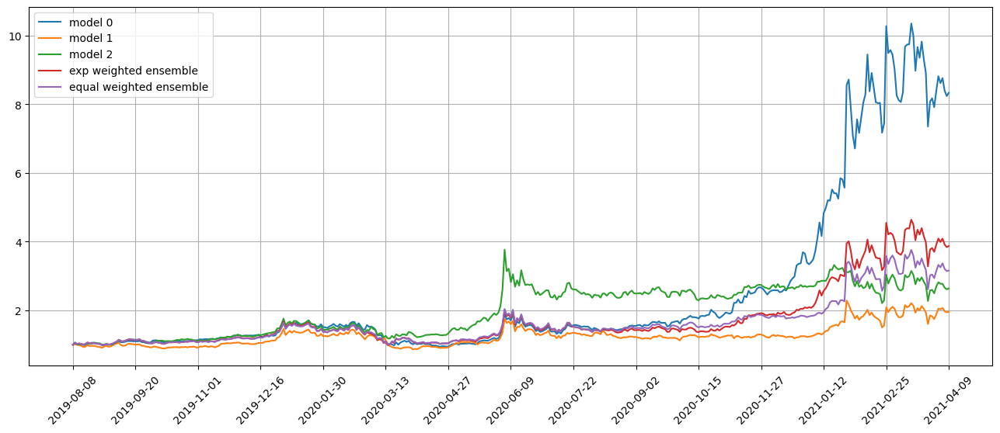

Standardization data are from 2019-09-05 to 2020-06-19
Training data are from 2020-06-22 to 2021-04-07
Testing data are from 2021-03-11 to 2021-05-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 22 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1248 - val_loss: 0.0972 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1244 - val_loss: 0.0964 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1246 - val_loss: 0.0960 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1243 - val_loss: 0.0959 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1243 - val_loss: 0.0958 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1243 - val_loss: 0.0959 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1236 - val_loss: 0.0959 - lr: 0.0010
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1236 - val_loss: 0.0957 - lr: 0.0010
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1235 - val_loss: 0.0956 - lr: 0.0010
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1234 - val_loss: 0.0958 - lr: 0.0010
Epoch 30/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1235 - val_loss: 0.0959 - lr: 0.0010
Epoch 31/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1234 - val_loss: 0.0964 - lr: 0.0010
Epoch 32/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1236 - val_loss: 0.0960 - lr: 0.0010
Epoch 33/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1234 - val_loss: 0.0958 - lr: 0.0010
Epoch 34/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1236 - val_loss

305/305 [==============================] - 2s 6ms/step - loss: 0.1227 - val_loss: 0.0952 - lr: 0.0010
Epoch 55/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1228 - val_loss: 0.0952 - lr: 0.0010
Epoch 56/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1230 - val_loss: 0.0952 - lr: 0.0010
Epoch 57/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1228 - val_loss: 0.0953 - lr: 0.0010
Epoch 58/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1231 - val_loss: 0.0952 - lr: 0.0010
Epoch 59/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1229 - val_loss: 0.0950 - lr: 0.0010
Epoch 60/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1229 - val_loss: 0.0947 - lr: 0.0010
Epoch 61/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1227 - val_loss: 0.0951 - lr: 0.0010
Epoch 62/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1224 - val_loss

Testing data from 2021-03-15 to 2021-04-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-04-13 are ['WBD', 'MVIS', 'PARA', 'APPS', 'VUZI', 'KODK', 'GEVO', 'RIOT', 'MARA', 'GME']
position on 2021-04-14 market open will be {'GEVO': 1.0651626448604514, 'KODK': 0.1873718068474878, 'RIOT': 1.1907278343559584, 'MARA': 1.4742577713522178, 'GME': 0.5564577233240933, 'APPS': 0.8324247020235407, 'PARA': 0.7143731209745962, 'VUZI': 0.6371304660929177, 'WBD': 0.6526830187486203, 'MVIS': 0.7799185862662136}
Total asset on 2021-04-14 will be 8.09050767484609
It should be the same as 8.090507674846096
top_stocks by model 1 to buy on 2021-04-13 are ['WBD', 'KODK', 'GEVO', 'MVIS', 'PARA', 'VUZI', 'APPS', 'RIOT', 'MARA', 'GME']
position on 2021-04-14 market open will be {'MARA': 0.3164994326903296, 'GME': 0.13269026702347456, 'RIOT': 0.2783408863190421, 'GEVO': 0.16458447294722364, 'VUZI': 0.20035363656910282, 'WBD': 0.14778196018656575, 'PARA': 0.15249319369042716, 'KODK': 0.1

position on 2021-04-19 market open will be {'GEVO': 0.871362222529536, 'KODK': 0.1927693496172463, 'RIOT': 0.7902670460707336, 'MARA': 1.0131183036725633, 'GME': 0.6658733279114823, 'PARA': 0.6897516104557393, 'VUZI': 0.5483021264792851, 'VIPS': 0.7042044622311526, 'MVIS': 0.6782604188808734, 'WBD': 0.678439081305525}
Total asset on 2021-04-19 will be 6.832347949154131
It should be the same as 6.832347949154137
top_stocks by model 1 to buy on 2021-04-16 are ['APPS', 'VIPS', 'WBD', 'PARA', 'KODK', 'GEVO', 'VUZI', 'RIOT', 'MARA', 'GME']
position on 2021-04-19 market open will be {'MARA': 0.21750020558918112, 'GME': 0.15878099266298507, 'RIOT': 0.18473040075613356, 'GEVO': 0.13463924296738156, 'VUZI': 0.1724204551892768, 'WBD': 0.14187067657531754, 'PARA': 0.14723737895963124, 'KODK': 0.14983249252590825, 'VIPS': 0.17416201403465223, 'APPS': 0.1517811716900838}
Total asset on 2021-04-19 will be 1.632955030950541
It should be the same as 1.6329550309505512
top_stocks by model 2 to buy on 2

top_stocks by model 0 to buy on 2021-04-21 are ['APPS', 'BLNK', 'MSTR', 'PACB', 'VUZI', 'KODK', 'GEVO', 'RIOT', 'MARA', 'GME']
position on 2021-04-22 market open will be {'GEVO': 0.9985900060102748, 'KODK': 0.19122719629102175, 'RIOT': 0.7947717320767778, 'MARA': 0.9995213067217188, 'GME': 0.6166498757451631, 'VUZI': 0.5765325021413998, 'APPS': 0.697677738820376, 'PACB': 0.6985205515033058, 'BLNK': 0.7057714603799433, 'MSTR': 0.6552188781041602}
Total asset on 2021-04-22 will be 6.934481247794135
It should be the same as 6.9344812477941415
top_stocks by model 1 to buy on 2021-04-21 are ['AHT', 'BLNK', 'MSTR', 'PARA', 'VUZI', 'KODK', 'GEVO', 'RIOT', 'GME', 'MARA']
position on 2021-04-22 market open will be {'MARA': 0.21458114902739192, 'GME': 0.14704340193866322, 'RIOT': 0.18578340233998372, 'GEVO': 0.15429794747552195, 'VUZI': 0.18129784957963027, 'PARA': 0.15748808255808658, 'KODK': 0.1486338337288322, 'AHT': 0.154671327183841, 'BLNK': 0.16360292490058034, 'MSTR': 0.15188447100171767}

position on 2021-04-27 market open will be {'MARA': 0.21799705267019273, 'GME': 0.16964057724185153, 'RIOT': 0.19068207594366657, 'GEVO': 0.166870377185379, 'VUZI': 0.20088933913798282, 'KODK': 0.1576237794699494, 'BLNK': 0.17001784743155823, 'APPS': 0.15699235369280365, 'MVIS': 0.3014283392031792, 'PACB': 0.16364174170483997}
Total asset on 2021-04-27 will be 1.895783483681392
It should be the same as 1.895783483681403
top_stocks by model 2 to buy on 2021-04-26 are ['PACB', 'KNDI', 'MVIS', 'ARKQ', 'APPS', 'RIOT', 'KODK', 'MARA', 'GEVO', 'GME']
position on 2021-04-27 market open will be {'KODK': 0.1721551427224358, 'RIOT': 0.2651659435764159, 'MARA': 0.26702786945839835, 'GEVO': 0.2891228610851876, 'GME': 0.21711157929367425, 'ARKQ': 0.238223831516375, 'KNDI': 0.22442344095020678, 'APPS': 0.20615992881020329, 'PACB': 0.21920977650147613, 'MVIS': 0.28898296411550356}
Total asset on 2021-04-27 will be 2.387583338029854
It should be the same as 2.3875833380298768
top_stocks by return weig

top_stocks by return weighted ensemble to buy on 2021-04-29 are ['MSTR', 'PACB', 'BLNK', 'APPS', 'VUZI', 'KODK', 'GEVO', 'RIOT', 'GME', 'MARA']
position on 2021-04-30 market open will be {'KODK': 0.15190818776106135, 'GEVO': 0.33971844782866023, 'RIOT': 0.37915305462572546, 'MARA': 0.48004440669953935, 'GME': 0.38734293329812974, 'VUZI': 0.2586940409238366, 'APPS': 0.3117717338018793, 'PACB': 0.31054209815599215, 'BLNK': 0.3334786101825474, 'MSTR': 0.3139216750412277}
Total asset on 2021-04-30 will be 3.266575188318583
It should be the same as 3.2665751883185994
top_stocks by equal weighted ensemble to buy on 2021-04-29 are ['KNDI', 'MVIS', 'BLNK', 'VUZI', 'APPS', 'KODK', 'RIOT', 'GEVO', 'MARA', 'GME']
position on 2021-04-30 market open will be {'GEVO': 0.262174007087024, 'KODK': 0.17962378811638455, 'MARA': 0.379786970804591, 'RIOT': 0.34876222127471834, 'GME': 0.34029998332448846, 'VUZI': 0.18645871300333425, 'BLNK': 0.26385240035001595, 'APPS': 0.21365052898729567, 'MVIS': 0.2106497

Testing data from 2021-04-07 to 2021-05-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-05 are ['AHT', 'MVIS', 'BLNK', 'APPS', 'GME', 'VUZI', 'KODK', 'GEVO', 'RIOT', 'MARA']
position on 2021-05-06 market open will be {'GEVO': 0.9053882551856781, 'KODK': 0.17991805964276328, 'RIOT': 0.7127092543167611, 'MARA': 0.9717488158229495, 'GME': 0.6234713738741225, 'VUZI': 0.5018193503588242, 'APPS': 0.6174386927839929, 'BLNK': 0.65835877711932, 'AHT': 0.5493169086953662, 'MVIS': 0.6139256225873444}
Total asset on 2021-05-06 will be 6.334095110387115
It should be the same as 6.334095110387122
top_stocks by model 1 to buy on 2021-05-05 are ['MSTR', 'MVIS', 'AHT', 'VUZI', 'APPS', 'KODK', 'GEVO', 'RIOT', 'GME', 'MARA']
position on 2021-05-06 market open will be {'MARA': 0.20861884190263758, 'GME': 0.1486700239986909, 'RIOT': 0.1666007292435627, 'GEVO': 0.13989680309514013, 'VUZI': 0.1578033653949809, 'KODK': 0.1398436596908478, 'AHT': 0.3456457793202868, 'MSTR': 0.1433

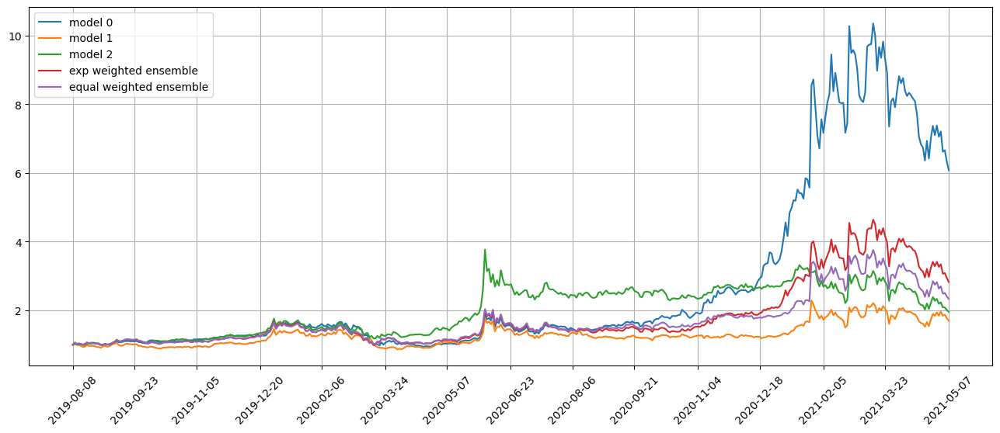

Standardization data are from 2019-10-03 to 2020-07-20
Training data are from 2020-07-21 to 2021-05-05
Testing data are from 2021-04-09 to 2021-06-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 23 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1203 - val_loss: 0.0796 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1202 - val_loss: 0.0779 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1199 - val_loss: 0.0775 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1201 - val_loss: 0.0776 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1199 - val_loss: 0.0775 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1200 - val_loss: 0.0773 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1199 - val_loss: 0.0772 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1217 - val_loss: 0.0784 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1235 - val_loss: 0.0773 - lr: 0.0100
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1206 - val_loss: 0.0774 - lr: 0.0050
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1200 - val_loss: 0.0772 - lr: 0.0050
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1202 - val_loss: 0.0773 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1197 - val_loss: 0.0775 - lr: 0.0050
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1198 - val_loss: 0.0773 - lr: 0.0050
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1181 - val_loss

position on 2021-05-11 market open will be {'GEVO': 0.18231641197571205, 'KODK': 0.16357739455075992, 'MARA': 0.2562313542927098, 'RIOT': 0.22211050590743037, 'KNDI': 0.21499156128324573, 'GME': 0.2222121836878565, 'SENS': 0.1736713211496745, 'AHT': 0.22098144009150164, 'EXPRQ': 0.16453829880536758, 'MRCY': 0.1958695903685173}
Total asset on 2021-05-11 will be 2.0165000621127622
It should be the same as 2.0165000621127755
Testing data from 2021-04-13 to 2021-05-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-11 are ['APPS', 'SENS', 'AHT', 'GEVO', 'MSTR', 'KNDI', 'EXPRQ', 'RIOT', 'MARA', 'KODK']
position on 2021-05-12 market open will be {'GEVO': 0.8003513748359773, 'KODK': 0.18197426407772935, 'RIOT': 0.5533632152400481, 'MARA': 0.718903195421171, 'APPS': 0.5576564490346284, 'AHT': 0.5299064172220318, 'MSTR': 0.5572290582966021, 'EXPRQ': 0.4872950018717455, 'KNDI': 0.532625852156978, 'SENS': 0.6119130557282247}
Total asset on 2021-05-12 will be 5.531217883

Testing data from 2021-04-16 to 2021-05-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-14 are ['MVIS', 'MSTR', 'RIOT', 'GEVO', 'AHT', 'KNDI', 'EXPRQ', 'GME', 'MARA', 'KODK']
position on 2021-05-17 market open will be {'GEVO': 0.8787592137541944, 'KODK': 0.17117917853821235, 'RIOT': 0.4582961406665836, 'MARA': 0.5947947318723286, 'AHT': 0.5357295646640321, 'MSTR': 0.48482577246688474, 'EXPRQ': 0.529953797453136, 'KNDI': 0.5250785038471779, 'GME': 0.6118146098075512, 'MVIS': 0.6601592815631009}
Total asset on 2021-05-17 will be 5.450590794633193
It should be the same as 5.450590794633201
top_stocks by model 1 to buy on 2021-05-14 are ['MSTR', 'VTNR', 'GME', 'SENS', 'MARA', 'GEVO', 'AHT', 'KNDI', 'EXPRQ', 'KODK']
position on 2021-05-17 market open will be {'MARA': 0.12769286271567026, 'GEVO': 0.13578219508645928, 'KODK': 0.13305125031465678, 'AHT': 0.3370962370756154, 'MSTR': 0.1131850236174051, 'SENS': 0.15705518910004673, 'EXPRQ': 0.14704007211906975, 'KND

position on 2021-05-20 market open will be {'GEVO': 0.9971105795481687, 'KODK': 0.1696370252119878, 'RIOT': 0.5105889077816735, 'MARA': 0.6789801707803963, 'AHT': 0.5920199899367019, 'MSTR': 0.4784749288289565, 'EXPRQ': 0.5955827522482896, 'KNDI': 0.5498768752512594, 'GME': 0.6536866381708041, 'MVIS': 0.6705332257220601}
Total asset on 2021-05-20 will be 5.896491093480289
It should be the same as 5.896491093480298
top_stocks by model 1 to buy on 2021-05-19 are ['MSTR', 'VTNR', 'MARA', 'SENS', 'GEVO', 'AHT', 'KNDI', 'EXPRQ', 'GME', 'KODK']
position on 2021-05-20 market open will be {'MARA': 0.14576612247590262, 'GEVO': 0.15406935269170677, 'KODK': 0.13185259151758072, 'AHT': 0.37251576923211116, 'SENS': 0.17668709870773103, 'EXPRQ': 0.16524936940603166, 'KNDI': 0.1525678951299595, 'GME': 0.17252643830576667, 'VTNR': 0.18375072943920395, 'MSTR': 0.12145385163248716}
Total asset on 2021-05-20 will be 1.7764392185384703
It should be the same as 1.7764392185384816
top_stocks by model 2 to b

Testing data from 2021-04-26 to 2021-05-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-05-24 are ['MSTR', 'GEVO', 'RIOT', 'MVIS', 'KNDI', 'EXPRQ', 'AHT', 'MARA', 'GME', 'KODK']
position on 2021-05-25 market open will be {'GEVO': 1.0178221267600367, 'KODK': 0.16706676966828024, 'MARA': 0.6480253946073383, 'AHT': 0.6153125797047034, 'MSTR': 0.4647916502692789, 'EXPRQ': 0.6087085306895907, 'KNDI': 0.548798712013919, 'GME': 0.6927647178408913, 'MVIS': 0.6672323987347926, 'RIOT': 0.4812302839607804}
Total asset on 2021-05-25 will be 5.911753164249604
It should be the same as 5.911753164249612
top_stocks by model 1 to buy on 2021-05-24 are ['CENN', 'DDD', 'VTNR', 'SENS', 'GEVO', 'AHT', 'KNDI', 'EXPRQ', 'GME', 'KODK']
position on 2021-05-25 market open will be {'GEVO': 0.15726961426512445, 'KODK': 0.1298548268557873, 'AHT': 0.3871721273658336, 'SENS': 0.16196316893978524, 'EXPRQ': 0.16889122539027623, 'KNDI': 0.152268749806468, 'GME': 0.18284025154229716, 'VTNR': 0

position on 2021-05-28 market open will be {'GEVO': 1.1820346547352565, 'KODK': 0.19199826682616156, 'MARA': 0.718613891743596, 'AHT': 0.8346511333533831, 'MSTR': 0.48282235260471307, 'EXPRQ': 0.8761465715507607, 'KNDI': 0.5983954548220821, 'SENS': 0.7388022221332639, 'MVIS': 0.7798883316801883, 'DNN': 0.796306515241331}
Total asset on 2021-05-28 will be 7.199659394690729
It should be the same as 7.199659394690735
top_stocks by model 1 to buy on 2021-05-27 are ['DDD', 'VTNR', 'MARA', 'SENS', 'GEVO', 'GME', 'KNDI', 'EXPRQ', 'AHT', 'KODK']
position on 2021-05-28 market open will be {'GEVO': 0.18264304666865527, 'KODK': 0.14923315836432374, 'AHT': 0.5251861664583862, 'SENS': 0.1685071290577436, 'EXPRQ': 0.24309412572723738, 'KNDI': 0.16602977704022068, 'GME': 0.2656436528799533, 'VTNR': 0.6206691392039461, 'MARA': 0.12443283400837583, 'DDD': 0.16025976593752936}
Total asset on 2021-05-28 will be 2.6056987953463606
It should be the same as 2.6056987953463713
top_stocks by model 2 to buy on

Testing data from 2021-05-04 to 2021-06-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-02 are ['DNN', 'SENS', 'MSTR', 'RIOT', 'GEVO', 'KNDI', 'EXPRQ', 'AHT', 'MARA', 'KODK']
position on 2021-06-03 market open will be {'GEVO': 1.1701995252101527, 'KODK': 0.21847192956621264, 'MARA': 0.7417576341592377, 'AHT': 1.1529831935160688, 'MSTR': 0.5020550915726281, 'EXPRQ': 0.8958352079183881, 'KNDI': 0.616724641153704, 'SENS': 0.979656085572201, 'DNN': 0.9465945701014781, 'RIOT': 0.7350710403804018}
Total asset on 2021-06-03 will be 7.959348919150465
It should be the same as 7.959348919150473
top_stocks by model 1 to buy on 2021-06-02 are ['RIOT', 'MSTR', 'SENS', 'GEVO', 'MARA', 'AHT', 'KNDI', 'EXPRQ', 'VTNR', 'KODK']
position on 2021-06-03 market open will be {'GEVO': 0.18081433199813043, 'KODK': 0.16981015819602957, 'AHT': 0.7254897276192591, 'SENS': 0.1668711390282541, 'EXPRQ': 0.2485569010207347, 'KNDI': 0.17111536165729072, 'VTNR': 0.80544070508242, 'MARA': 0

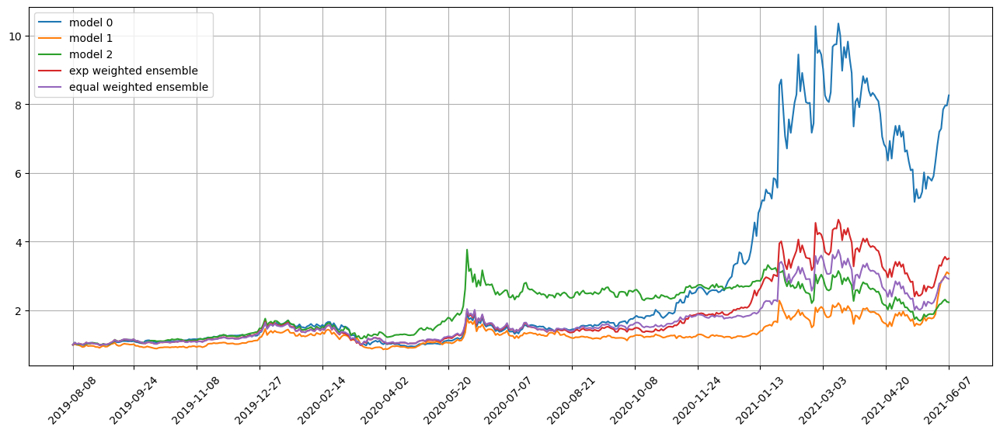

Standardization data are from 2019-10-31 to 2020-08-17
Training data are from 2020-08-18 to 2021-06-03
Testing data are from 2021-05-07 to 2021-07-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 24 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1188 - val_loss: 0.0797 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1189 - val_loss: 0.0792 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1191 - val_loss: 0.0794 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1196 - val_loss: 0.0791 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1191 - val_loss: 0.0791 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1188 - val_loss: 0.0793 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1190 - val_loss: 0.0791 - lr: 0.0050
Epoch 12/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1190 - val_loss: 0.0789 - lr: 0.0025
Epoch 13/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1188 - val_loss: 0.0790 - lr: 0.0025
Epoch 14/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1176 - val_loss: 0.0788 - lr: 0.0025
Epoch 15/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1157 - val_loss: 0.0792 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1171 - val_loss: 0.0789 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1158 - val_loss: 0.0788 - lr: 0.0012
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1172 - val_loss: 0.0789 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1160 - val_loss

position on 2021-06-09 market open will be {'VTNR': 0.2689705847706126, 'DINO': 0.29540471835543414, 'EC': 0.2966380465663469, 'SOXS': 0.29505453322316116, 'GEO': 0.4007625680398629, 'CTRA': 0.29582556576507557, 'CRK': 0.2952408560922844, 'GME': 0.29843212205227865, 'BAP': 0.2780580431535897, 'BTU': 0.3147391076454044}
Total asset on 2021-06-09 will be 3.039126145664034
It should be the same as 3.03912614566405
Testing data from 2021-05-11 to 2021-06-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-06-09 are ['MSTR', 'PAVE', 'IOVA', 'RIOT', 'PETS', 'ARKK', 'PBW', 'AMC', 'GME', 'VTNR']
position on 2021-06-10 market open will be {'AMC': 0.6624770938098399, 'PBW': 0.9118770327628168, 'ARKK': 0.9074100341992881, 'VTNR': 0.8032168333886557, 'PAVE': 0.876469239000587, 'GME': 0.7678076103106987, 'IOVA': 0.8331265688061485, 'PETS': 0.8246237125558121, 'RIOT': 0.9119009466534279, 'MSTR': 0.8958897229279844}
Total asset on 2021-06-10 will be 8.394798794415255
It should 

top_stocks by model 1 to buy on 2021-06-14 are ['DBI', 'RYTM', 'CENN', 'SOXS', 'EXPRQ', 'ANY', 'GEVO', 'AHT', 'GME', 'VTNR']
position on 2021-06-15 market open will be {'GEVO': 0.19110085746983219, 'AHT': 0.7193829117302082, 'EXPRQ': 0.2317133149228863, 'VTNR': 0.8330033132813677, 'SOXS': 0.1764131995996913, 'CENN': 0.17809594262754816, 'ANY': 0.15302868178758228, 'GME': 0.1647557316917886, 'DBI': 0.16940218143542965, 'RYTM': 0.18783405793430763}
Total asset on 2021-06-15 will be 3.004730192480632
It should be the same as 3.004730192480642
top_stocks by model 2 to buy on 2021-06-14 are ['DBI', 'HBAN', 'INSW', 'WERN', 'NEU', 'RAMP', 'GEVO', 'BVN', 'BAP', 'ANY']
position on 2021-06-15 market open will be {'GEVO': 0.22005464171754444, 'BAP': 0.21973776114547883, 'ANY': 0.20867574993814272, 'BVN': 0.23028144080129453, 'DBI': 0.22619962422337292, 'HBAN': 0.2284245167524527, 'RAMP': 0.23126934838926755, 'NEU': 0.22457990476627882, 'WERN': 0.22899236325667058, 'INSW': 0.22756881381444768}
Tot

top_stocks by model 2 to buy on 2021-06-17 are ['GFI', 'GEVO', 'MSGS', 'ANY', 'BVN', 'SCO', 'GRFS', 'BAP', 'AHT', 'GEO']
position on 2021-06-18 market open will be {'GEVO': 0.2076831537169036, 'GEO': 0.2612804449554626, 'SCO': 0.23014366765340044, 'AHT': 0.22110044602234152, 'BVN': 0.21828946991847073, 'MSGS': 0.21597022391676865, 'GFI': 0.21529399413480954, 'GRFS': 0.22169770632240016, 'ANY': 0.20386050771768302, 'BAP': 0.22189443036556772}
Total asset on 2021-06-18 will be 2.2172140447237814
It should be the same as 2.217214044723808
top_stocks by return weighted ensemble to buy on 2021-06-17 are ['BB', 'MSGS', 'BAP', 'CARG', 'GRFS', 'ANY', 'AMC', 'GEO', 'GME', 'VTNR']
position on 2021-06-18 market open will be {'VTNR': 0.3103804091349494, 'AMC': 0.37156790739993645, 'GME': 0.3420645462904161, 'BB': 0.3512233318980322, 'GEO': 0.419222441197381, 'ANY': 0.30269921029177216, 'GRFS': 0.35757034385133957, 'MSGS': 0.3483326395595057, 'BAP': 0.35788763483700703, 'CARG': 0.35772081776550274}

position on 2021-06-23 market open will be {'AHT': 0.19760590147347792, 'BVN': 0.21646659506686455, 'VTNR': 0.2093856122602405, 'NG': 0.22304429706668388, 'EHTH': 0.22156415389321404, 'HBAN': 0.22437463018067547, 'CVI': 0.23065193457546712, 'GEO': 0.2145518698129003, 'RACE': 0.2206832166931455, 'AMC': 0.23383312440103296}
Total asset on 2021-06-23 will be 2.1921613354236755
It should be the same as 2.192161335423702
top_stocks by return weighted ensemble to buy on 2021-06-22 are ['JD', 'MODG', 'LVS', 'RACE', 'BB', 'GEO', 'VRTX', 'AMC', 'GME', 'VTNR']
position on 2021-06-23 market open will be {'VTNR': 0.28425143379276546, 'AMC': 0.34597184443190354, 'GME': 0.3440375840308885, 'VRTX': 0.36620511684916196, 'GEO': 0.3238959243466721, 'BB': 0.3588966911643975, 'JD': 0.35782250930616644, 'MODG': 0.3569586394662178, 'LVS': 0.348628829962024, 'RACE': 0.3497534620586415}
Total asset on 2021-06-23 will be 3.436422035408819
It should be the same as 3.436422035408839
top_stocks by equal weighted 

position on 2021-06-28 market open will be {'AHT': 0.223617718652577, 'VTNR': 0.280541728988776, 'AMC': 0.22588016484978393, 'BB': 0.20263480771772058, 'GEVO': 0.22637765619197076, 'GME': 0.20730677745305728, 'QSR': 0.22312606046789715, 'KN': 0.22423973210372788, 'ARCH': 0.21941230687038943, 'MRIN': 0.40358352046689444}
Total asset on 2021-06-28 will be 2.436720473762768
It should be the same as 2.436720473762794
top_stocks by return weighted ensemble to buy on 2021-06-25 are ['KN', 'LCII', 'LVS', 'VRTX', 'QSR', 'SENS', 'AMC', 'MRIN', 'VTNR', 'GME']
position on 2021-06-28 market open will be {'VTNR': 0.38084941865369704, 'AMC': 0.3342049055446695, 'GME': 0.3281911972367815, 'LVS': 0.3401018651690985, 'VRTX': 0.3617839971778898, 'QSR': 0.3588695737047338, 'KN': 0.3606607713100674, 'MRIN': 0.6491121908417707, 'SENS': 0.39760523003325576, 'LCII': 0.35554461905423074}
Total asset on 2021-06-28 will be 3.8669237687261746
It should be the same as 3.866923768726195
top_stocks by equal weighte

position on 2021-07-01 market open will be {'AHT': 0.19550817428161518, 'VTNR': 0.3732779862041265, 'AMC': 0.23309520184924626, 'BB': 0.20465107246816452, 'MRIN': 0.8847506347629268, 'EQC': 0.21878310070197865, 'DK': 0.23424894126216403, 'GME': 0.22143100281778455, 'ANY': 0.20132086770214436, 'GEO': 0.22711050925499449}
Total asset on 2021-07-01 will be 2.994177491305119
It should be the same as 2.9941774913051455
top_stocks by return weighted ensemble to buy on 2021-06-30 are ['GEO', 'TMHC', 'CUK', 'ANY', 'XELA', 'EQC', 'AMC', 'MRIN', 'GME', 'VTNR']
position on 2021-07-01 market open will be {'VTNR': 0.5067435228067336, 'AMC': 0.3448800383546272, 'GME': 0.33153135851933285, 'MRIN': 1.423007614917518, 'EQC': 0.3622689633464471, 'ANY': 0.33478172191321165, 'CUK': 0.3729303459061076, 'GEO': 0.37766798951743047, 'XELA': 0.28503225790108366, 'TMHC': 0.36500779016840473}
Total asset on 2021-07-01 will be 4.703851603350874
It should be the same as 4.703851603350897
top_stocks by equal weight

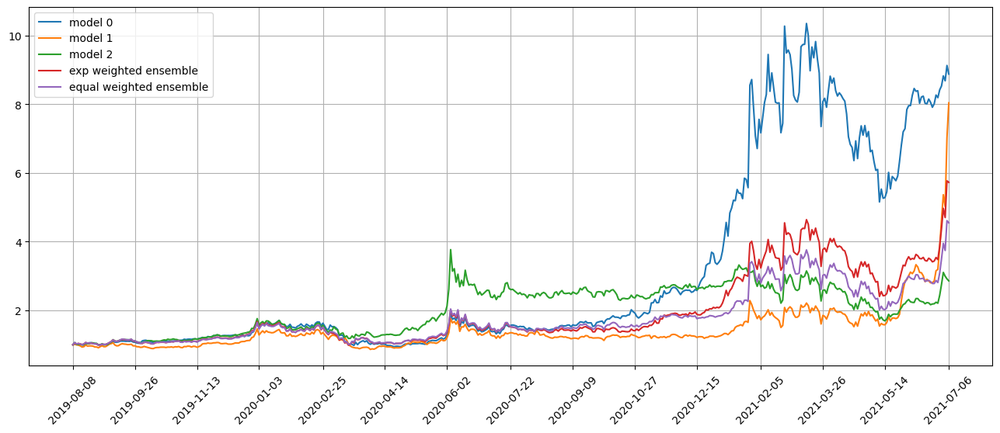

Standardization data are from 2019-11-29 to 2020-09-15
Training data are from 2020-09-16 to 2021-07-01
Testing data are from 2021-06-07 to 2021-07-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 25 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1201 - val_loss: 0.0569 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1198 - val_loss: 0.0568 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1199 - val_loss: 0.0567 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1198 - val_loss: 0.0568 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1199 - val_loss: 0.0567 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1197 - val_loss: 0.0578 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1153 - val_loss: 0.0569 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1159 - val_loss: 0.0587 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1183 - val_loss: 0.0572 - lr: 0.0025
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1175 - val_loss: 0.0574 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1171 - val_loss: 0.0564 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1173 - val_loss: 0.0567 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1162 - val_loss: 0.0572 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1176 - val_loss: 0.0567 - lr: 0.0012
Epoch 27/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1167 - val_loss

Testing data from 2021-06-09 to 2021-07-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-07-08 are ['ANY', 'AMC', 'GEO', 'DDD', 'AVXL', 'BB', 'AHT', 'SENS', 'EXPRQ', 'GME']
position on 2021-07-09 market open will be {'AMC': 0.668558703367026, 'GME': 0.6396037139618448, 'SENS': 0.73320767887757, 'AVXL': 1.0129253182504552, 'DDD': 0.8989270180840645, 'BB': 0.910615947374522, 'AHT': 0.8285624046820041, 'ANY': 1.1591824257888055, 'GEO': 0.9555643619967236, 'EXPRQ': 0.851968828611393}
Total asset on 2021-07-09 will be 8.659116400994405
It should be the same as 8.659116400994408
top_stocks by model 1 to buy on 2021-07-08 are ['TRP', 'GLPG', 'EXPRQ', 'YPF', 'BTU', 'TTE', 'SOXS', 'NOV', 'EQC', 'VTNR']
position on 2021-07-09 market open will be {'EXPRQ': 0.25037783769572686, 'EQC': 0.24556907111589438, 'NOV': 0.23551154051610493, 'VTNR': 0.2245336382844452, 'TRP': 0.23561326969361127, 'SOXS': 0.25765890379855433, 'GLPG': 0.23780129481173226, 'YPF': 1.3344675437257862, 

position on 2021-07-14 market open will be {'SENS': 0.6614564832621346, 'AVXL': 0.9793157084855882, 'DDD': 0.7799474553826027, 'BB': 0.88287747332132, 'AHT': 0.6893367547149462, 'GEO': 0.9147863417544925, 'EXPRQ': 0.7884584486603847, 'NTLA': 0.6274865645740875, 'VTNR': 1.115904928073673, 'ANY': 0.5441262004059565}
Total asset on 2021-07-14 will be 7.98369635863518
It should be the same as 7.983696358635185
top_stocks by model 1 to buy on 2021-07-13 are ['INSW', 'GLPG', 'YPF', 'VTNR', 'SOXS', 'AHT', 'NAT', 'EXPRQ', 'EQC', 'MRIN']
position on 2021-07-14 market open will be {'EXPRQ': 0.2317133149228865, 'EQC': 0.24741754692099874, 'VTNR': 0.20854121349966157, 'SOXS': 0.236517660409955, 'GLPG': 0.23087941159297756, 'YPF': 1.421161556994075, 'NAT': 0.7989420053488442, 'AHT': 0.6804126427457321, 'INSW': 0.7353890001372801, 'MRIN': 0.7457822134654901}
Total asset on 2021-07-14 will be 5.536756566037893
It should be the same as 5.536756566037901
top_stocks by model 2 to buy on 2021-07-13 are [

top_stocks by model 1 to buy on 2021-07-16 are ['GLPG', 'DHT', 'MLCO', 'INSW', 'VTNR', 'NAT', 'SOXS', 'EXPRQ', 'AHT', 'GME']
position on 2021-07-19 market open will be {'EXPRQ': 0.19301855818809238, 'VTNR': 0.17058586437102588, 'SOXS': 0.28970110080940015, 'NAT': 0.7287646705196746, 'AHT': 0.5426542005301717, 'MLCO': 0.6141435337754114, 'DHT': 0.6333678413856633, 'INSW': 0.5878180025382217, 'GLPG': 0.6813335270565412, 'GME': 0.6359414679033019}
Total asset on 2021-07-19 will be 5.0773287670774945
It should be the same as 5.077328767077504
top_stocks by model 2 to buy on 2021-07-16 are ['PBR-A', 'DOG', 'INSW', 'NAT', 'MLCO', 'AHT', 'EXPRQ', 'GME', 'VTNR', 'MRIN']
position on 2021-07-19 market open will be {'VTNR': 0.23329873790115715, 'EXPRQ': 0.1905004109792763, 'AHT': 0.17561360493739284, 'NAT': 0.24722628474795372, 'DOG': 0.27608495200867533, 'PBR-A': 0.23969846347359694, 'MLCO': 0.23584163363288638, 'MRIN': 0.19568127218369935, 'INSW': 0.22573217883643992, 'GME': 0.24421241360827842

position on 2021-07-22 market open will be {'EXPRQ': 0.22761621608702445, 'NAT': 0.7530568026078445, 'AHT': 0.6103603270783596, 'AEHR': 0.6624180988257672, 'VTNR': 0.556527945056844, 'SOXS': 0.45912232690633287, 'FNKO': 0.5852007289329483, 'INSW': 0.613731631712055, 'ANY': 0.6140349060374454, 'KAR': 0.584886663587196}
Total asset on 2021-07-22 will be 5.666955646831808
It should be the same as 5.666955646831817
top_stocks by model 2 to buy on 2021-07-21 are ['NTLA', 'GLNG', 'CXW', 'KAR', 'AHT', 'EXPRQ', 'AEHR', 'VTNR', 'GME', 'MRIN']
position on 2021-07-22 market open will be {'VTNR': 0.2716297123506479, 'EXPRQ': 0.2246467029759469, 'AHT': 0.19752464321528324, 'MRIN': 0.23746122456517252, 'AEHR': 0.37684859228487216, 'GLNG': 0.2668237340601072, 'NTLA': 0.26555713171355777, 'GME': 0.24977559461593596, 'KAR': 0.2573172709864974, 'CXW': 0.25438509253374764}
Total asset on 2021-07-22 will be 2.6019696993017423
It should be the same as 2.601969699301769
top_stocks by return weighted ensembl

top_stocks by model 1 to buy on 2021-07-26 are ['SOXS', 'CVI', 'PBF', 'ANY', 'EXPRQ', 'GLPG', 'VTNR', 'AHT', 'GME', 'AEHR']
position on 2021-07-27 market open will be {'EXPRQ': 0.23808655855387975, 'AHT': 0.5862274239572383, 'VTNR': 0.5120506380510308, 'ANY': 0.6708899910773407, 'GLPG': 0.5523453857801247, 'SOXS': 0.5603085837597921, 'CVI': 0.6338102084819308, 'PBF': 0.6066695199793498, 'GME': 0.6141952019231447, 'AEHR': 0.5552380192598176}
Total asset on 2021-07-27 will be 5.52982153082364
It should be the same as 5.529821530823649
top_stocks by model 2 to buy on 2021-07-26 are ['OXY', 'GLNG', 'NTLA', 'EC', 'AHT', 'GME', 'EXPRQ', 'VTNR', 'AEHR', 'MRIN']
position on 2021-07-27 market open will be {'VTNR': 0.24992126407697407, 'EXPRQ': 0.2349804478850038, 'AHT': 0.18971475966409282, 'MRIN': 0.16995236876496517, 'EC': 0.2708442208607333, 'NTLA': 0.2595976180884702, 'AEHR': 0.24810596668956655, 'GLNG': 0.26648941617062144, 'GME': 0.2744507562943527, 'OXY': 0.27109953592371167}
Total asset

position on 2021-07-30 market open will be {'VTNR': 0.2537123719052331, 'EXPRQ': 0.21521154830663047, 'AHT': 0.19047406585193333, 'MRIN': 0.15012458915746357, 'EC': 0.28058243047239434, 'TAL': 0.24262073081863647, 'VTLE': 0.25414644279783194, 'FRO': 0.2667966479906812, 'RNR': 0.2689819445610541, 'NOG': 0.26458056301341826}
Total asset on 2021-07-30 will be 2.387231334875249
It should be the same as 2.3872313348752767
top_stocks by return weighted ensemble to buy on 2021-07-29 are ['FTI', 'GLPG', 'TAL', 'ANY', 'PBF', 'EC', 'EXPRQ', 'SOXS', 'VTNR', 'AHT']
position on 2021-07-30 market open will be {'EXPRQ': 0.5451184894375622, 'AHT': 0.40266656864402306, 'VTNR': 0.49074937545871455, 'ANY': 0.6005183160036954, 'TAL': 0.49572480247494427, 'PBF': 0.5381766639658007, 'FTI': 0.5216101126469139, 'EC': 0.5471558857904999, 'GLPG': 0.5336508133875042, 'SOXS': 0.5268992014789429}
Total asset on 2021-07-30 will be 5.202270229288573
It should be the same as 5.202270229288602
top_stocks by equal weig

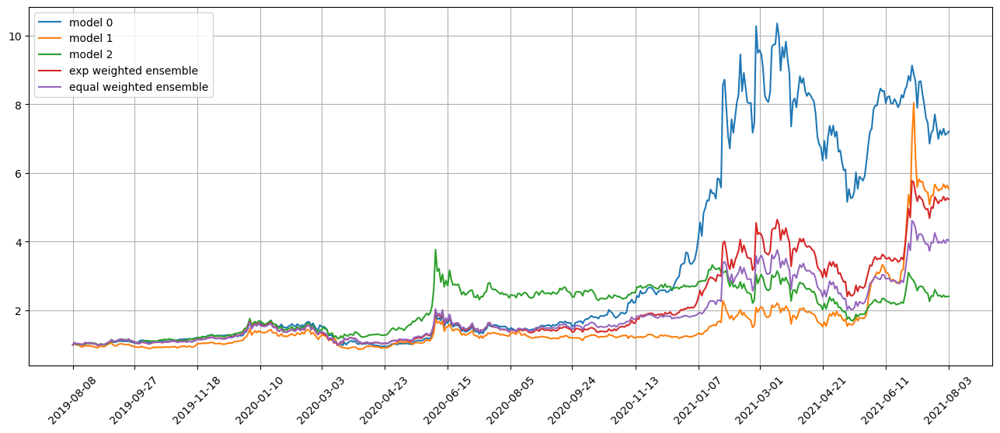

Standardization data are from 2019-12-30 to 2020-10-13
Training data are from 2020-10-14 to 2021-07-30
Testing data are from 2021-07-06 to 2021-08-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 26 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1109 - val_loss: 0.0602 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1108 - val_loss: 0.0604 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1108 - val_loss: 0.0605 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1107 - val_loss: 0.0604 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1107 - val_loss: 0.0607 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1106 - val_loss: 0.0614 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1098 - val_loss: 0.0625 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1079 - val_loss: 0.0612 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1097 - val_loss: 0.0626 - lr: 0.0025
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1082 - val_loss: 0.0640 - lr: 0.0025
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1067 - val_loss: 0.0629 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1077 - val_loss: 0.0642 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1104 - val_loss: 0.0621 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1076 - val_loss: 0.0615 - lr: 0.0012
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1084 - val_loss

top_stocks by model 2 to buy on 2021-08-05 are ['BTU', 'CENN', 'SOXS', 'AHT', 'SENS', 'ANY', 'GME', 'EXPRQ', 'MRIN', 'VTNR']
position on 2021-08-06 market open will be {'VTNR': 0.2551704945793908, 'EXPRQ': 0.22824104679572552, 'AHT': 0.15641434373514054, 'MRIN': 0.14469555104907614, 'SENS': 0.26137351377088747, 'ANY': 0.4330393707723535, 'SOXS': 0.2567497617734366, 'GME': 0.25930507421914417, 'CENN': 0.26945541777791565, 'BTU': 0.2825491134724501}
Total asset on 2021-08-06 will be 2.546993687945492
It should be the same as 2.54699368794552
top_stocks by return weighted ensemble to buy on 2021-08-05 are ['FRO', 'EPD', 'CENN', 'NAT', 'PBF', 'AHT', 'ANY', 'EXPRQ', 'VTNR', 'MRIN']
position on 2021-08-06 market open will be {'EXPRQ': 0.5781214606553743, 'AHT': 0.3306635304750414, 'VTNR': 0.493569784989048, 'ANY': 1.0533681962842827, 'MRIN': 0.47087722969049306, 'CENN': 0.5039116380063339, 'PBF': 0.5621275644920244, 'NAT': 0.538409684016878, 'EPD': 0.52583453811481, 'FRO': 0.5252002453164881

position on 2021-08-11 market open will be {'EXPRQ': 0.6987531318797177, 'AHT': 0.348778960248632, 'VTNR': 0.4687502994707558, 'ANY': 0.8623836603310646, 'MRIN': 0.448600845760313, 'CENN': 0.5183225766275309, 'PBF': 0.533151916268037, 'NAT': 0.5228999024243105, 'EPD': 0.5393478619258802, 'GME': 0.5375109712954483}
Total asset on 2021-08-11 will be 5.478500126231662
It should be the same as 5.478500126231691
top_stocks by equal weighted ensemble to buy on 2021-08-10 are ['EPD', 'TAL', 'CENN', 'AHT', 'EDU', 'ANY', 'GME', 'EXPRQ', 'MRIN', 'VTNR']
position on 2021-08-11 market open will be {'VTNR': 0.273579639098638, 'AHT': 0.26084339516395527, 'EXPRQ': 0.4803354206529026, 'MRIN': 0.27464991852195386, 'ANY': 0.6924378297552057, 'CENN': 0.4431426062370084, 'EPD': 0.4456284988150366, 'EDU': 0.4703541108193661, 'TAL': 0.46456311810691825, 'GME': 0.4459032103121599}
Total asset on 2021-08-11 will be 4.251437747483113
It should be the same as 4.251437747483145
Testing data from 2021-07-14 to 20

position on 2021-08-16 market open will be {'EXPRQ': 0.6771304611339433, 'AHT': 0.3171343151291287, 'VTNR': 0.4512638034185583, 'ANY': 0.8013473714195688, 'MRIN': 0.3932938731066144, 'NAT': 0.48744909381471974, 'EPD': 0.5239379320574433, 'AEHR': 0.4730785986903331, 'EHTH': 0.5244416872235297, 'MRCY': 0.5271173311643036}
Total asset on 2021-08-16 will be 5.176194467158113
It should be the same as 5.176194467158143
top_stocks by equal weighted ensemble to buy on 2021-08-13 are ['WKC', 'BTU', 'NAT', 'EPD', 'CENN', 'AHT', 'ANY', 'EXPRQ', 'MRIN', 'VTNR']
position on 2021-08-16 market open will be {'VTNR': 0.2633738871568018, 'AHT': 0.2371771262300565, 'EXPRQ': 0.4654716094233615, 'MRIN': 0.24078895798968086, 'ANY': 0.6434296708877674, 'CENN': 0.4210780631691481, 'EPD': 0.43289626346400395, 'BTU': 0.48707172327892706, 'NAT': 0.41947690632276885, 'WKC': 0.41772397042204795}
Total asset on 2021-08-16 will be 4.0284881783445305
It should be the same as 4.028488178344564
Testing data from 2021-0

position on 2021-08-19 market open will be {'VTNR': 0.25415579419905865, 'AHT': 0.22688744636036218, 'EXPRQ': 0.45139012132528766, 'MRIN': 0.2398483844735921, 'ANY': 0.6149733164089645, 'CENN': 0.4157632706214449, 'NAT': 0.4042231700564023, 'AEHR': 0.43777814344217236, 'WKC': 0.4202044782698458, 'CLB': 0.41006612225500605}
Total asset on 2021-08-19 will be 3.8752902474121034
It should be the same as 3.875290247412137
Testing data from 2021-07-22 to 2021-08-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-08-19 are ['FNKO', 'NAT', 'PARR', 'VTLE', 'CLB', 'WTI', 'BTU', 'WKC', 'CENN', 'ANY']
position on 2021-08-20 market open will be {'VTLE': 0.5221569962181217, 'BTU': 0.7346393947475194, 'ANY': 0.5590305258552389, 'CLB': 0.6346392625828041, 'CENN': 0.7904319072594083, 'NAT': 0.6732609301387048, 'WKC': 0.6426243293527535, 'WTI': 0.5680804852909338, 'PARR': 0.662574056812289, 'FNKO': 0.643739436834322}
Total asset on 2021-08-20 will be 6.431177325092091
It should b

Testing data from 2021-07-27 to 2021-08-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-08-24 are ['CVI', 'NAT', 'CLB', 'WTI', 'PARR', 'FNKO', 'WKC', 'BTU', 'CENN', 'ANY']
position on 2021-08-25 market open will be {'BTU': 0.8387954569043882, 'ANY': 0.6191461525641502, 'CENN': 0.9243468861604706, 'WKC': 0.6811687328872275, 'WTI': 0.6677065441300739, 'FNKO': 0.7360694421292747, 'PARR': 0.7320271776359988, 'CVI': 0.6977267722498965, 'CLB': 0.7148642685350116, 'NAT': 0.6825519102552312}
Total asset on 2021-08-25 will be 7.294403343451717
It should be the same as 7.294403343451723
top_stocks by model 1 to buy on 2021-08-24 are ['CVI', 'WTI', 'NOV', 'GME', 'CLB', 'NAT', 'EXPRQ', 'MRIN', 'VTNR', 'AEHR']
position on 2021-08-25 market open will be {'EXPRQ': 0.3309539642979424, 'VTNR': 0.4672387654665504, 'MRIN': 0.48159842417663284, 'NAT': 0.5557321310706701, 'AEHR': 0.5767115362445838, 'GME': 0.7210394899150329, 'CVI': 0.6480136259734611, 'CLB': 0.6639300728542563, 

top_stocks by model 0 to buy on 2021-08-27 are ['VRN', 'FANG', 'PBR-A', 'VET', 'NOG', 'DK', 'CENN', 'WKC', 'BTU', 'ANY']
position on 2021-08-30 market open will be {'BTU': 0.9823952658605448, 'CENN': 1.0076964721632202, 'WKC': 0.7138334316620205, 'PBR-A': 0.701356470035393, 'VET': 0.7307158003580556, 'VRN': 0.7134261376985722, 'FANG': 0.7330159176554772, 'DK': 0.742244335218432, 'NOG': 0.7416110858544713, 'ANY': 0.7859715552333473}
Total asset on 2021-08-30 will be 7.852266471739526
It should be the same as 7.852266471739533
top_stocks by model 1 to buy on 2021-08-27 are ['KOS', 'CRK', 'CENN', 'NAT', 'IEP', 'ANY', 'EXPRQ', 'MRIN', 'AEHR', 'VTNR']
position on 2021-08-30 market open will be {'EXPRQ': 0.2931696932663833, 'VTNR': 0.4745102319303358, 'MRIN': 0.6039504458272327, 'NAT': 0.5702927846167125, 'AEHR': 0.7111828671063591, 'CENN': 0.646279031421032, 'ANY': 0.8082428129698507, 'CRK': 0.7209806804364243, 'KOS': 0.705231928508946, 'IEP': 0.6646117371929937}
Total asset on 2021-08-30 w

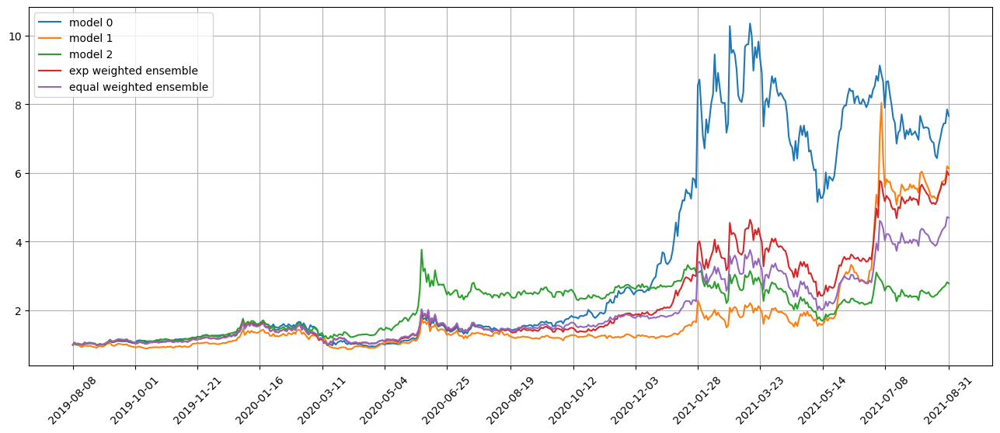

Standardization data are from 2020-01-29 to 2020-11-10
Training data are from 2020-11-11 to 2021-08-27
Testing data are from 2021-08-03 to 2021-09-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 27 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1045 - val_loss: 0.0585 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1046 - val_loss: 0.0585 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1044 - val_loss: 0.0585 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1045 - val_loss: 0.0585 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1046 - val_loss: 0.0585 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1045 - val_loss: 0.0586 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1040 - val_loss: 0.0595 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1024 - val_loss: 0.0609 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1039 - val_loss: 0.0592 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1017 - val_loss: 0.0599 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1014 - val_loss: 0.0594 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1035 - val_loss: 0.0595 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1018 - val_loss: 0.0592 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1018 - val_loss: 0.0603 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 trainin

position on 2021-09-03 market open will be {'EXPRQ': 0.255385387503346, 'VTNR': 0.4439365563942276, 'AEHR': 0.7282285115930536, 'ANY': 1.1180303958166609, 'SENS': 0.6745803139338791, 'CENN': 0.6095772679088074, 'XELA': 0.6946749285022951, 'FNKO': 0.6609268588229601, 'BB': 0.6359357012004138, 'DK': 0.660804608233878}
Total asset on 2021-09-03 will be 6.482080529909512
It should be the same as 6.482080529909522
top_stocks by model 2 to buy on 2021-09-02 are ['NTLA', 'SAVA', 'MSTR', 'ANY', 'BB', 'GME', 'SENS', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-03 market open will be {'VTNR': 0.21667619781965217, 'EXPRQ': 0.2520535938833394, 'SENS': 0.33628947464509784, 'ANY': 0.5827819626986627, 'AEHR': 0.33646702859713673, 'NTLA': 0.2692667929972198, 'MSTR': 0.24169711962556187, 'BB': 0.23662693351251157, 'SAVA': 0.2705462012141958, 'GME': 0.25520780206933114}
Total asset on 2021-09-03 will be 2.9976131070626804
It should be the same as 2.9976131070627092
top_stocks by return weighted ensemble

position on 2021-09-09 market open will be {'VTNR': 0.1997620415467284, 'EXPRQ': 0.23902409539424443, 'SENS': 0.31381468439823923, 'AEHR': 0.3885341001581366, 'BB': 0.2197250053726185, 'SAVA': 0.21732476195247996, 'GME': 0.21674308643536697, 'EDU': 0.25990100043358866, 'AVXL': 0.35247159143741014, 'TAL': 0.3343292677219037}
Total asset on 2021-09-09 will be 2.7416296348506877
It should be the same as 2.741629634850717
top_stocks by return weighted ensemble to buy on 2021-09-08 are ['CVI', 'CTRA', 'BB', 'CENN', 'XELA', 'SENS', 'ANY', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-09 market open will be {'EXPRQ': 0.6054343033434512, 'VTNR': 0.38639462629765703, 'AEHR': 0.7542078781043706, 'CENN': 0.48300287995486085, 'ANY': 0.9511277375604101, 'BB': 0.5324621561662329, 'SENS': 0.569909697858663, 'XELA': 0.5623121139838009, 'CVI': 0.5456199866448098, 'CTRA': 0.5989146345301424}
Total asset on 2021-09-09 will be 5.989386014444366
It should be the same as 5.989386014444399
top_stocks by equal

position on 2021-09-14 market open will be {'VTNR': 0.19772068648973384, 'EXPRQ': 0.2569958316323202, 'SENS': 0.32297109218530334, 'AEHR': 0.5224208257957698, 'BB': 0.22120393743334885, 'ANY': 0.2615422103001418, 'AVXL': 0.27059935998902723, 'GME': 0.2864701210199368, 'PRTA': 0.2877213601707642, 'MSTR': 0.31631519411002623}
Total asset on 2021-09-14 will be 2.9439606191263423
It should be the same as 2.943960619126372
top_stocks by return weighted ensemble to buy on 2021-09-13 are ['IEP', 'XELA', 'JWN', 'BB', 'CENN', 'SENS', 'ANY', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-14 market open will be {'EXPRQ': 0.6509556788818676, 'VTNR': 0.3824460852320926, 'AEHR': 1.0141037873911032, 'CENN': 0.484424380017046, 'ANY': 0.8740465080379469, 'BB': 0.5360460693969753, 'SENS': 0.5865383830503802, 'XELA': 0.5373039574393871, 'JWN': 0.5716684634928263, 'IEP': 0.5813821611162691}
Total asset on 2021-09-14 will be 6.218915474055859
It should be the same as 6.218915474055893
top_stocks by equal wei

position on 2021-09-17 market open will be {'VTNR': 0.18032825797000984, 'EXPRQ': 0.24980712685357997, 'SENS': 0.3179766789169251, 'AEHR': 0.49660609551540447, 'BB': 0.21296424217612683, 'ANY': 0.26648474107155784, 'EDU': 0.26479703739318483, 'AMC': 0.26002187900679086, 'PRTA': 0.2843748084909914, 'GME': 0.28885512474496755}
Total asset on 2021-09-17 will be 2.8222159921395082
It should be the same as 2.822215992139539
top_stocks by return weighted ensemble to buy on 2021-09-16 are ['FNKO', 'GEO', 'BB', 'CENN', 'GME', 'SENS', 'ANY', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-17 market open will be {'EXPRQ': 0.6327471026189612, 'VTNR': 0.3488043539689715, 'AEHR': 0.9639931975080873, 'CENN': 0.45796820596883464, 'ANY': 0.8905639250799944, 'BB': 0.5160787202308078, 'SENS': 0.5774681747450523, 'FNKO': 0.5685395569730844, 'GME': 0.5669081057565317, 'GEO': 0.5383277044462695}
Total asset on 2021-09-17 will be 6.061399047296562
It should be the same as 6.061399047296595
top_stocks by equal 

position on 2021-09-22 market open will be {'VTNR': 0.17643217610002568, 'EXPRQ': 0.2304875138254852, 'SENS': 0.28967509634390637, 'AEHR': 0.4913555980504384, 'BB': 0.20071034880815367, 'ANY': 0.2384770592183532, 'AMC': 0.21715493149157156, 'GSAT': 0.2861686131805093, 'PRTA': 0.2659686272189346, 'MRIN': 0.5402792015491458}
Total asset on 2021-09-22 will be 2.936709165786492
It should be the same as 2.9367091657865236
top_stocks by return weighted ensemble to buy on 2021-09-21 are ['KNDI', 'YEXT', 'BB', 'GSAT', 'CENN', 'SENS', 'ANY', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-22 market open will be {'EXPRQ': 0.583811632597677, 'VTNR': 0.3412682620942524, 'AEHR': 0.953801128007797, 'CENN': 0.4409099160124561, 'ANY': 0.7969652035048483, 'BB': 0.4863837181846038, 'SENS': 0.5260704958759445, 'GSAT': 0.5538048033502432, 'YEXT': 0.5425198949759343, 'KNDI': 0.5601461597231557}
Total asset on 2021-09-22 will be 5.785681214326879
It should be the same as 5.785681214326912
top_stocks by equal w

position on 2021-09-27 market open will be {'VTNR': 0.15805989715294433, 'EXPRQ': 0.23722691491476364, 'SENS': 0.2938370908625922, 'AEHR': 0.6956860320591698, 'BB': 0.21803481457349566, 'ANY': 0.24300771429594634, 'AMC': 0.22629236666294952, 'GSAT': 0.2896164245783769, 'PRTA': 0.2687310134876044, 'GME': 0.5552342060230616}
Total asset on 2021-09-27 will be 3.1857264746108727
It should be the same as 3.1857264746109046
top_stocks by return weighted ensemble to buy on 2021-09-24 are ['KNDI', 'BB', 'CENN', 'GSAT', 'GME', 'SENS', 'ANY', 'VTNR', 'EXPRQ', 'AEHR']
position on 2021-09-27 market open will be {'EXPRQ': 0.6008821484245832, 'VTNR': 0.30573123111966044, 'AEHR': 1.350439731937664, 'CENN': 0.5882747348630099, 'ANY': 0.8121061753776113, 'BB': 0.5283662971823769, 'SENS': 0.5336289727623337, 'GSAT': 0.5604771441494781, 'GME': 0.5431551505543342, 'KNDI': 0.5731589006358664}
Total asset on 2021-09-27 will be 6.396220487006886
It should be the same as 6.396220487006918
top_stocks by equal 

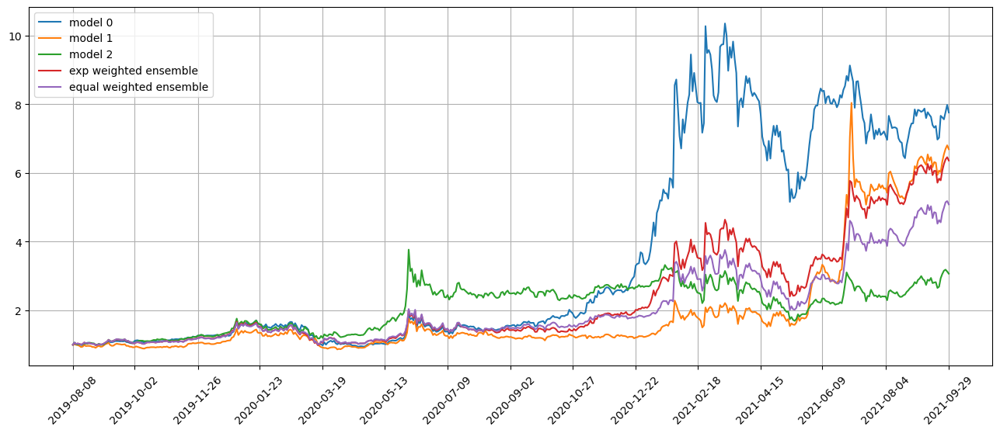

Standardization data are from 2020-02-27 to 2020-12-09
Training data are from 2020-12-10 to 2021-09-27
Testing data are from 2021-08-31 to 2021-10-25
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 28 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.1012 - val_loss: 0.0474 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0474 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0474 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0477 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1014 - val_loss: 0.0474 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0478 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.1011 - val_loss: 0.0474 - lr: 0.0050
Epoch 9/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1010 - val_loss: 0.0475 - lr: 0.0050
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0474 - lr: 0.0050
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1013 - val_loss: 0.0474 - lr: 0.0050
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1010 - val_loss: 0.0474 - lr: 0.0025
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1002 - val_loss: 0.0475 - lr: 0.0025
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1009 - val_loss: 0.0474 - lr: 0.0025
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1011 - val_loss: 0.0474 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.1011 - val_loss:

Testing data from 2021-09-02 to 2021-09-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-01 are ['CCJ', 'BTU', 'NXE', 'DNN', 'GME', 'SENS', 'EXPRQ', 'AEHR', 'VTNR', 'ANY']
position on 2021-10-04 market open will be {'VTNR': 0.6012689841019504, 'EXPRQ': 0.6172485475198637, 'ANY': 0.7774497038542537, 'AEHR': 0.6906029356284219, 'DNN': 0.9353300822415078, 'SENS': 0.8216868697550325, 'CCJ': 0.9053796867553714, 'NXE': 0.9303426138642769, 'BTU': 1.0145390659700801, 'GME': 0.6453059208402655}
Total asset on 2021-10-04 will be 7.939154410531011
It should be the same as 7.9391544105310246
top_stocks by model 1 to buy on 2021-10-01 are ['YY', 'TREE', 'JD', 'MOMO', 'ATHM', 'LVS', 'BZUN', 'MLCO', 'QD', 'VIPS']
position on 2021-10-04 market open will be {'BZUN': 0.6122476357217387, 'MOMO': 0.6139497103758395, 'MLCO': 0.6763934776927877, 'LVS': 0.6498795704321166, 'VIPS': 0.6554427855624201, 'YY': 0.6584295569394673, 'JD': 0.6637861446114585, 'QD': 0.6928359710770415, 'A

Testing data from 2021-09-08 to 2021-10-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-06 are ['CCJ', 'BTU', 'NXE', 'DNN', 'SENS', 'AEHR', 'EXPRQ', 'GME', 'VTNR', 'ANY']
position on 2021-10-07 market open will be {'VTNR': 0.5351608641136276, 'EXPRQ': 0.5820144761433655, 'ANY': 0.8827044066962066, 'AEHR': 0.7905512232774764, 'DNN': 0.8375178046355842, 'SENS': 0.7899897793025751, 'CCJ': 0.8797179308261702, 'NXE': 0.8761478650410458, 'BTU': 0.9878725344914284, 'GME': 0.630819098093963}
Total asset on 2021-10-07 will be 7.792495982621432
It should be the same as 7.792495982621443
top_stocks by model 1 to buy on 2021-10-06 are ['MLCO', 'PRGO', 'T', 'VIPS', 'YPF', 'MED', 'BZUN', 'WW', 'VZ', 'CTRA']
position on 2021-10-07 market open will be {'BZUN': 0.6534041202129062, 'VIPS': 0.6707855469583345, 'WW': 0.651676165837226, 'PRGO': 0.6632055663589879, 'MLCO': 0.6700868745645989, 'T': 0.6472022901653957, 'MED': 0.653954129307891, 'VZ': 0.6498271475669316, 'YPF': 0.

position on 2021-10-12 market open will be {'VTNR': 0.5884670737084372, 'EXPRQ': 0.600284009384653, 'ANY': 1.0433773662541062, 'AEHR': 1.1135478271573844, 'DNN': 0.8619708558181051, 'SENS': 0.7851133038483507, 'NXE': 0.89059977508986, 'BTU': 1.0169633486482128, 'GME': 0.6619932977090717, 'XENE': 0.8122812781864807}
Total asset on 2021-10-12 will be 8.374598135804654
It should be the same as 8.374598135804662
top_stocks by model 1 to buy on 2021-10-11 are ['UVXY', 'SAH', 'PRLB', 'MANU', 'VZ', 'VIPS', 'W', 'HBI', 'WW', 'GME']
position on 2021-10-12 market open will be {'VIPS': 0.686128308354249, 'WW': 0.6563722495595677, 'VZ': 0.6419249541190032, 'HBI': 0.6903667997785864, 'SAH': 0.6864931403703073, 'W': 0.66081223082984, 'UVXY': 0.6679256824095692, 'PRLB': 0.6834535187278286, 'MANU': 0.6702655499319855, 'GME': 0.7097935124693805}
Total asset on 2021-10-12 will be 6.753535946550307
It should be the same as 6.7535359465503175
top_stocks by model 2 to buy on 2021-10-11 are ['VGLT', 'TMF', 

position on 2021-10-15 market open will be {'VZ': 0.6406947602604994, 'HBI': 0.7251788131313776, 'W': 0.68827586592125, 'CTRA': 0.664369386683855, 'MANU': 0.6735475653496419, 'JWN': 0.702487360371751, 'SE': 0.6683175689023187, 'T': 0.6870101414237144, 'LAD': 0.6948762645357804, 'TREE': 0.693598222187953}
Total asset on 2021-10-15 will be 6.838355948768131
It should be the same as 6.838355948768142
top_stocks by model 2 to buy on 2021-10-14 are ['PRLB', 'PBF', 'HBI', 'TREE', 'CWEB', 'MANU', 'UVXY', 'W', 'ZWS', 'GME']
position on 2021-10-15 market open will be {'GME': 0.3374608113128721, 'W': 0.33754304353836506, 'CWEB': 0.31937125266003175, 'PRLB': 0.3299438469569532, 'HBI': 0.33481222152492884, 'ZWS': 0.33335291795048994, 'UVXY': 0.3092731366732218, 'MANU': 0.3229704133059154, 'TREE': 0.3325860300090561, 'PBF': 0.34633314754074807}
Total asset on 2021-10-15 will be 3.3036468214725514
It should be the same as 3.3036468214725825
top_stocks by return weighted ensemble to buy on 2021-10-14

position on 2021-10-20 market open will be {'CTRA': 0.6031459934426908, 'W': 0.6889510125225317, 'JWN': 0.6853228610750103, 'CENN': 0.6611200645288371, 'NAT': 0.7063921080091944, 'DBI': 0.6424979559071166, 'MNRO': 0.6717593329140739, 'M': 0.6442848831653988, 'MANU': 0.6638641736462149, 'PBF': 0.6621332513436842}
Total asset on 2021-10-20 will be 6.629471636554716
It should be the same as 6.629471636554753
top_stocks by equal weighted ensemble to buy on 2021-10-19 are ['BTU', 'CENN', 'INSW', 'MANU', 'PBF', 'CTRA', 'NAT', 'EXPRQ', 'ANY', 'GME']
position on 2021-10-20 market open will be {'EXPRQ': 0.3301328113074375, 'ANY': 1.2062330256237606, 'CTRA': 0.4576379618670537, 'CENN': 0.48619478948169587, 'INSW': 0.5448736173110811, 'NAT': 0.5310135749467234, 'MANU': 0.511299122567607, 'GME': 0.5126727432234238, 'PBF': 0.5099659898430984, 'BTU': 0.43049824645222085}
Total asset on 2021-10-20 will be 5.520521882624073
It should be the same as 5.520521882624101
Testing data from 2021-09-22 to 202

top_stocks by model 0 to buy on 2021-10-25 are ['RRC', 'NAT', 'DNN', 'BTU', 'SENS', 'AEHR', 'EXPRQ', 'XENE', 'VTNR', 'ANY']
position on 2021-10-26 market open will be {'VTNR': 0.4722007712831177, 'EXPRQ': 0.5441705141156608, 'ANY': 0.9289527115534263, 'AEHR': 1.2078492988136467, 'DNN': 1.1737475498986079, 'SENS': 0.8387545919769906, 'BTU': 0.836964463460592, 'XENE': 0.796610246971221, 'NAT': 0.8668623743928479, 'RRC': 0.8347182529730447}
Total asset on 2021-10-26 will be 8.500830775439145
It should be the same as 8.500830775439155
top_stocks by model 1 to buy on 2021-10-25 are ['VZ', 'KOS', 'BLMN', 'EAT', 'CAKE', 'BJRI', 'FALN', 'CTRA', 'MANU', 'NAT']
position on 2021-10-26 market open will be {'VZ': 0.6483220654267756, 'NAT': 0.6671674976823131, 'BLMN': 0.6935568664425841, 'KOS': 0.6987496141836115, 'CAKE': 0.6894373035440893, 'FALN': 0.6979327200737193, 'MANU': 0.7035127137234021, 'EAT': 0.69793827787961, 'BJRI': 0.690332855894796, 'CTRA': 0.7293312556860582}
Total asset on 2021-10-2

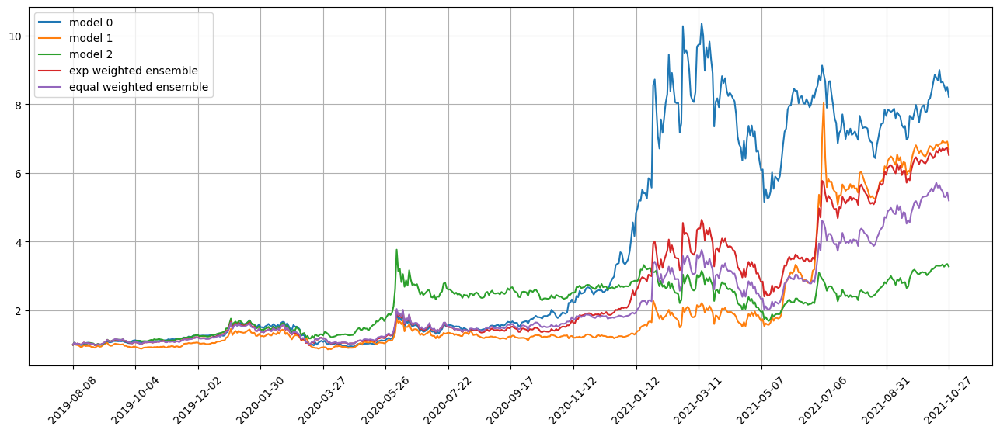

Standardization data are from 2020-03-26 to 2021-01-08
Training data are from 2021-01-11 to 2021-10-25
Testing data are from 2021-09-29 to 2021-11-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 29 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0727 - val_loss: 0.0477 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0726 - val_loss: 0.0477 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0725 - val_loss: 0.0477 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0725 - val_loss: 0.0477 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0725 - val_loss: 0.0477 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0725 - val_loss: 0.0477 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0720 - val_loss: 0.0477 - lr: 0.0025
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0710 - val_loss: 0.0477 - lr: 0.0025
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0477 - lr: 0.0025
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0728 - val_loss: 0.0477 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0715 - val_loss: 0.0477 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0477 - lr: 0.0012
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0715 - val_loss: 0.0477 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0720 - val_loss: 0.0477 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0723 - val_loss

305/305 [==============================] - 2s 6ms/step - loss: 0.0699 - val_loss: 0.0477 - lr: 0.0010
Epoch 84/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0477 - lr: 0.0010
Epoch 85/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0700 - val_loss: 0.0477 - lr: 0.0010
Epoch 86/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0698 - val_loss: 0.0477 - lr: 0.0010
Epoch 87/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0700 - val_loss: 0.0477 - lr: 0.0010
Epoch 88/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0715 - val_loss: 0.0477 - lr: 0.0010
Epoch 89/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0702 - val_loss: 0.0477 - lr: 0.0010
Epoch 90/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0702 - val_loss: 0.0477 - lr: 0.0010
Epoch 91/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0709 - val_loss

position on 2021-10-29 market open will be {'EXPRQ': 0.30509903810943056, 'ANY': 1.0022958831401723, 'VTNR': 0.5225524121859176, 'XENE': 0.4882459780595933, 'LPG': 0.4850989783122937, 'SID': 0.4583432425823789, 'EC': 0.4770287065589331, 'TCBI': 0.5006512674976246, 'GEO': 0.49492502400117855, 'TCOM': 0.4822083758438465}
Total asset on 2021-10-29 will be 5.216448906291339
It should be the same as 5.216448906291369
Testing data from 2021-10-01 to 2021-10-28 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-10-29 are ['STNG', 'CVI', 'HLX', 'PBR-A', 'PSX', 'NAT', 'BTU', 'EXPRQ', 'VTNR', 'ANY']
position on 2021-11-01 market open will be {'VTNR': 0.517322160303808, 'EXPRQ': 0.5063265023074823, 'ANY': 0.8598460840860841, 'BTU': 0.7321166073526632, 'NAT': 0.8416837383541804, 'PBR-A': 0.8929548679447771, 'PSX': 0.8888279767476585, 'HLX': 0.8952027787808395, 'STNG': 0.9381556994265973, 'CVI': 0.9180602818917893}
Total asset on 2021-11-01 will be 7.9904966971958675
It should 

top_stocks by model 0 to buy on 2021-11-03 are ['NOV', 'PBF', 'HLX', 'CVI', 'NAT', 'PSX', 'BTU', 'EXPRQ', 'VTNR', 'ANY']
position on 2021-11-04 market open will be {'VTNR': 0.5236181645832395, 'EXPRQ': 0.5637449926825517, 'ANY': 0.8585171160519681, 'BTU': 0.7369650571127672, 'NAT': 0.8416837383541805, 'PSX': 0.9410425535386159, 'HLX': 0.9394967361837118, 'CVI': 0.8553681299667804, 'NOV': 0.9595590510845442, 'PBF': 0.9289060588610509}
Total asset on 2021-11-04 will be 8.148901598419396
It should be the same as 8.14890159841941
top_stocks by model 1 to buy on 2021-11-03 are ['BZUN', 'ATHM', 'MLCO', 'EXPRQ', 'VTNR', 'AEHR', 'ANY', 'XENE', 'GME', 'CAR']
position on 2021-11-04 market open will be {'VTNR': 0.7549823834360255, 'AEHR': 0.8081156348706967, 'XENE': 0.7503413057248989, 'ANY': 0.6829411210351518, 'EXPRQ': 0.7348987650277167, 'BZUN': 0.6621469037602098, 'MLCO': 0.6667596656783924, 'ATHM': 0.6509246217062602, 'GME': 0.6830237068716952, 'CAR': 0.6033680686401716}
Total asset on 2021-

position on 2021-11-09 market open will be {'VTNR': 0.532957270121256, 'EXPRQ': 0.5715747641971188, 'ANY': 0.9980593390207692, 'BTU': 0.7472680273025082, 'PSX': 0.9172336496518243, 'CVI': 0.8373203343594349, 'NOV': 0.961496294090907, 'PBF': 0.9779972122943995, 'YPF': 0.8941963062913482, 'DK': 0.8401209671288552}
Total asset on 2021-11-09 will be 8.27822416445841
It should be the same as 8.27822416445842
top_stocks by model 1 to buy on 2021-11-08 are ['BZUN', 'YPF', 'LOGI', 'MLCO', 'EXPRQ', 'AEHR', 'VTNR', 'ANY', 'XENE', 'CAR']
position on 2021-11-09 market open will be {'VTNR': 0.7684480357666017, 'AEHR': 0.7590410802868927, 'XENE': 0.7675500147437351, 'ANY': 0.7939454567719845, 'EXPRQ': 0.7451056661819495, 'MLCO': 0.7067175381900271, 'YPF': 0.6442909698070022, 'CAR': 0.686048057124524, 'LOGI': 0.6247837090721439, 'BZUN': 0.6331665135115684}
Total asset on 2021-11-09 will be 7.129097041456417
It should be the same as 7.12909704145643
top_stocks by model 2 to buy on 2021-11-08 are ['ROK

position on 2021-11-12 market open will be {'VTNR': 0.7141316342421229, 'AEHR': 0.7458038738186922, 'XENE': 0.7110703067786652, 'ANY': 0.6987988750529887, 'EXPRQ': 0.7229906704185152, 'EHTH': 0.6254286158316839, 'PEGA': 0.6516250445531192, 'QRVO': 0.6580299389548003, 'QTWO': 0.6511700667274213, 'GME': 0.6553651770748674}
Total asset on 2021-11-12 will be 6.834414203452862
It should be the same as 6.8344142034528765
top_stocks by model 2 to buy on 2021-11-11 are ['JCI', 'XENE', 'FRPT', 'FCX', 'LNW', 'ETSY', 'PWR', 'GNRC', 'GME', 'FALN']
position on 2021-11-12 market open will be {'XENE': 0.34765573485627754, 'GNRC': 0.32788574089793265, 'FCX': 0.33563517500353734, 'JCI': 0.3249622512022259, 'FRPT': 0.3170357374056225, 'FALN': 0.32337825516783253, 'ETSY': 0.32804494266766326, 'GME': 0.32629800234322254, 'PWR': 0.3240660552452657, 'LNW': 0.30243839881329165}
Total asset on 2021-11-12 will be 3.257400293602841
It should be the same as 3.257400293602872
top_stocks by return weighted ensembl

position on 2021-11-17 market open will be {'XENE': 0.3371926312607464, 'RH': 0.33103761209271726, 'VTLE': 0.3109791399101939, 'MWA': 0.3185252889571101, 'TPIC': 0.3169958121871977, 'FRPT': 0.3319556886091026, 'PARR': 0.3124863190529756, 'CGNX': 0.3182094192424597, 'NBR': 0.3147643750725972, 'WKC': 0.31650703712396455}
Total asset on 2021-11-17 will be 3.2086533235090346
It should be the same as 3.208653323509065
top_stocks by return weighted ensemble to buy on 2021-11-16 are ['FRPT', 'RNG', 'YPF', 'NAT', 'TPIC', 'EXPRQ', 'CAR', 'VTNR', 'ANY', 'XENE']
position on 2021-11-17 market open will be {'VTNR': 0.673981610801231, 'XENE': 0.671524551792692, 'EXPRQ': 0.6940303721446385, 'ANY': 0.5980638067191661, 'RNG': 0.623476538100176, 'TPIC': 0.6412713423006603, 'FRPT': 0.671534644416657, 'CAR': 0.6739520318645128, 'YPF': 0.6176376607570435, 'NAT': 0.6346322449294255}
Total asset on 2021-11-17 will be 6.500104803826167
It should be the same as 6.500104803826204
top_stocks by equal weighted en

position on 2021-11-22 market open will be {'VTNR': 0.6732450722337803, 'XENE': 0.6206124040108095, 'EXPRQ': 0.7172198923620283, 'ANY': 0.528066687360387, 'AEHR': 0.517399670182433, 'NAT': 0.6000150732904883, 'TREE': 0.5960786759705641, 'GME': 0.676427241843405, 'RDFN': 0.6035181559730126, 'BTU': 0.6187613106666887}
Total asset on 2021-11-22 will be 6.15134418389356
It should be the same as 6.151344183893598
top_stocks by equal weighted ensemble to buy on 2021-11-19 are ['XELA', 'RH', 'SNBR', 'RIG', 'BTU', 'EXPRQ', 'GME', 'VTNR', 'XENE', 'ANY']
position on 2021-11-22 market open will be {'EXPRQ': 0.33873815685554515, 'ANY': 0.8110059518787195, 'VTNR': 0.5016942223871886, 'XENE': 0.46247298387344116, 'XELA': 0.4147772172380967, 'RIG': 0.4452981957999332, 'RH': 0.4509909138911313, 'GME': 0.4939857160470172, 'SNBR': 0.45057775648145554, 'BTU': 0.451873062177227}
Total asset on 2021-11-22 will be 4.821414176629723
It should be the same as 4.821414176629755
Testing data from 2021-10-25 to 2

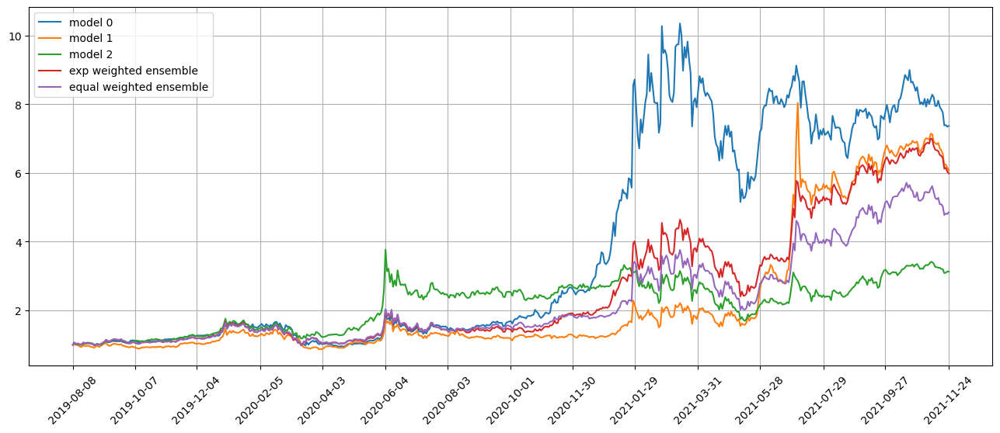

Standardization data are from 2020-04-24 to 2021-02-08
Training data are from 2021-02-09 to 2021-11-22
Testing data are from 2021-10-27 to 2021-12-21
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 30 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0630 - val_loss: 0.0522 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0620 - val_loss: 0.0528 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0619 - val_loss: 0.0526 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0618 - val_loss: 0.0527 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0618 - val_loss: 0.0527 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0618 - val_loss: 0.0525 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0617 - val_loss: 0.0527 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0617 - val_loss: 0.0529 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0617 - val_loss: 0.0528 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0617 - val_loss

position on 2021-11-30 market open will be {'VTLE': 0.5294022364432812, 'PRTA': 0.5696749586186058, 'EVH': 0.5844404196959366, 'SIG': 0.5739990476597494, 'UCO': 0.5309536070627608, 'DKS': 0.5577121878286607, 'CEIX': 0.5640337649277795, 'KFY': 0.5852077801868131, 'GTLS': 0.5878046229183141, 'BTU': 0.5659815821104339}
Total asset on 2021-11-30 will be 5.6492102074523185
It should be the same as 5.649210207452336
top_stocks by model 2 to buy on 2021-11-29 are ['NUE', 'DBO', 'ADSK', 'GPRE', 'JWN', 'MMS', 'KFY', 'VTLE', 'DPST', 'UCO']
position on 2021-11-30 market open will be {'VTLE': 0.2778721299411473, 'ADSK': 0.30270572747028024, 'DBO': 0.28873193683714504, 'NUE': 0.2988122196800969, 'MMS': 0.3061712154900124, 'DPST': 0.2827466810310403, 'UCO': 0.27477518766470427, 'GPRE': 0.2999322698470662, 'KFY': 0.30285240647149286, 'JWN': 0.30851371170041203}
Total asset on 2021-11-30 will be 2.9431134861333668
It should be the same as 2.9431134861333974
top_stocks by return weighted ensemble to bu

position on 2021-12-03 market open will be {'VTLE': 0.578111057492817, 'SHY': 0.5241667104617632, 'DBC': 0.5379907051705212, 'WK': 0.5555818450479976, 'COMT': 0.5414307269543236, 'NOG': 0.5574298122973512, 'PARR': 0.5624221383319602, 'RRC': 0.5502212914380173, 'SCHO': 0.524038491553712, 'EBAY': 0.5294212368807725}
Total asset on 2021-12-03 will be 5.460814015629204
It should be the same as 5.460814015629236
top_stocks by equal weighted ensemble to buy on 2021-12-02 are ['GTLS', 'EBAY', 'SCHO', 'SHY', 'WK', 'NOG', 'RRC', 'COMT', 'DBC', 'VTLE']
position on 2021-12-03 market open will be {'VTLE': 0.46299012009048174, 'SHY': 0.41978786788235734, 'DBC': 0.43085905029166033, 'WK': 0.44494721528840486, 'COMT': 0.43361405052587804, 'NOG': 0.44642719144110476, 'RRC': 0.4406541243200366, 'SCHO': 0.41968518157863227, 'EBAY': 0.4239960451628722, 'GTLS': 0.41546518782787145}
Total asset on 2021-12-03 will be 4.338426034409265
It should be the same as 4.3384260344092995
Testing data from 2021-11-04 

Testing data from 2021-11-09 to 2021-12-07 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2021-12-08 are ['WES', 'STNG', 'GEO', 'AEHR', 'FNKO', 'DNN', 'WEN', 'XELA', 'ANY', 'XENE']
position on 2021-12-09 market open will be {'ANY': 0.5581690005101935, 'XENE': 0.6999764950213616, 'XELA': 0.7605629977765542, 'WEN': 0.739169319991757, 'DNN': 0.6573697952300583, 'FNKO': 0.734093511845925, 'GEO': 0.619737489596047, 'STNG': 0.79797499803029, 'WES': 0.7631995183471126, 'AEHR': 0.8222364764127676}
Total asset on 2021-12-09 will be 7.152489602762047
It should be the same as 7.152489602762067
top_stocks by model 1 to buy on 2021-12-08 are ['ICVT', 'AXON', 'INFY', 'PRTA', 'VGSH', 'SPTS', 'HUBS', 'PDBC', 'SCHO', 'SHY']
position on 2021-12-09 market open will be {'PRTA': 0.56400595625491, 'INFY': 0.5469706094113919, 'SHY': 0.5465198599543769, 'ICVT': 0.5505465533221218, 'AXON': 0.543102971378936, 'VGSH': 0.5464434278566229, 'SPTS': 0.5464438401366004, 'HUBS': 0.5551724929260036,

top_stocks by model 0 to buy on 2021-12-13 are ['STNG', 'BTU', 'FNKO', 'GEO', 'WEN', 'DNN', 'XELA', 'AEHR', 'ANY', 'XENE']
position on 2021-12-14 market open will be {'ANY': 0.48108852862649115, 'XENE': 0.6648485080449582, 'XELA': 0.7016922106148038, 'WEN': 0.728847540873868, 'DNN': 0.558144163901525, 'FNKO': 0.6829459636629855, 'GEO': 0.5887506250998211, 'AEHR': 0.7047741226395153, 'BTU': 0.7089165691388565, 'STNG': 0.7294030612854786}
Total asset on 2021-12-14 will be 6.5494112938882845
It should be the same as 6.549411293888303
top_stocks by model 1 to buy on 2021-12-13 are ['OVV', 'MARA', 'RIOT', 'LNG', 'BTU', 'SUN', 'SM', 'CEIX', 'PRTA', 'CAR']
position on 2021-12-14 market open will be {'PRTA': 0.5297417264993145, 'MARA': 0.5049357526980801, 'SM': 0.5145512871505576, 'RIOT': 0.5180338877370774, 'SUN': 0.5488775718736261, 'LNG': 0.5552026863634414, 'CEIX': 0.5348132360265042, 'OVV': 0.5295682515580971, 'CAR': 0.5327859275784366, 'BTU': 0.5502951180403355}
Total asset on 2021-12-14

position on 2021-12-17 market open will be {'CEIX': 0.5668442499609044, 'BTU': 0.5914160309761012, 'PRTA': 0.5189460100452195, 'EVRI': 0.5224256158549311, 'COMT': 0.5491304002804022, 'PDBC': 0.548439072334601, 'MGY': 0.5262051807348064, 'VNOM': 0.528265482746955, 'SE': 0.4894742314802781, 'EQNR': 0.547992100098048}
Total asset on 2021-12-17 will be 5.3891383745122265
It should be the same as 5.389138374512246
top_stocks by model 2 to buy on 2021-12-16 are ['BKR', 'PDBC', 'GTLS', 'XENE', 'SPSC', 'BTU', 'SLM', 'COMT', 'SBLK', 'GOGL']
position on 2021-12-17 market open will be {'COMT': 0.27776560687268664, 'GOGL': 0.28637319787660237, 'XENE': 0.27996253870370663, 'SLM': 0.2823897547698236, 'PDBC': 0.28696056893117233, 'BKR': 0.2802900651034709, 'SPSC': 0.26135329228134174, 'SBLK': 0.27899242396385254, 'GTLS': 0.2773188697133025, 'BTU': 0.2850829375051358}
Total asset on 2021-12-17 will be 2.7964892557210637
It should be the same as 2.7964892557210947
top_stocks by return weighted ensemble

position on 2021-12-22 market open will be {'SE': 0.531425094467934, 'AEHR': 0.6673961316458139, 'GNRC': 0.5722640925896216, 'PCTY': 0.5824583420625008, 'CRL': 0.5710594876951658, 'EPD': 0.5700905953075371, 'RH': 0.579579828499393, 'HUBS': 0.5876860190948668, 'NXE': 0.5973896938374583, 'SPSC': 0.586288393236055}
Total asset on 2021-12-22 will be 5.845637678436325
It should be the same as 5.845637678436346
top_stocks by model 2 to buy on 2021-12-21 are ['NXPI', 'EVR', 'BX', 'AVAV', 'CTRA', 'GNRC', 'SPSC', 'SAIA', 'AN', 'GOGL']
position on 2021-12-22 market open will be {'GOGL': 0.2888936931451783, 'GNRC': 0.2846251132808681, 'EVR': 0.28648394860930043, 'AVAV': 0.2812097452886887, 'AN': 0.28505361750357544, 'NXPI': 0.28396994562915445, 'SAIA': 0.29209275838369214, 'SPSC': 0.2916003336587759, 'BX': 0.28741289806657083, 'CTRA': 0.28509160262735517}
Total asset on 2021-12-22 will be 2.8664336561931285
It should be the same as 2.866433656193159
top_stocks by return weighted ensemble to buy o

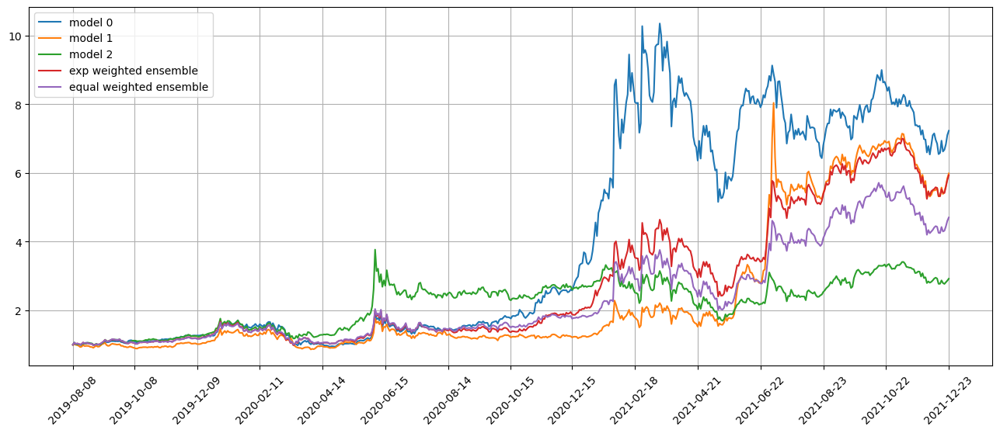

Standardization data are from 2020-05-22 to 2021-03-09
Training data are from 2021-03-10 to 2021-12-21
Testing data are from 2021-11-24 to 2022-01-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 31 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0590 - val_loss: 0.0688 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0590 - val_loss: 0.0689 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0590 - val_loss: 0.0688 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0590 - val_loss: 0.0688 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0590 - val_loss: 0.0688 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0590 - val_loss: 0.0688 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0699 - lr: 0.0050
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0693 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0695 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0693 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0692 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss: 0.0696 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0695 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss: 0.0697 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss

position on 2021-12-29 market open will be {'ENLC': 0.6202121190952646, 'BP': 0.6249134085557945, 'KOS': 0.6121533788174874, 'PTEN': 0.6093149641023162, 'NOG': 0.6065013799751046, 'NBR': 0.610863291438284, 'NTAP': 0.6265355065867892, 'BNDX': 0.6241426960878097, 'CTRA': 0.6285853201697651, 'EQNR': 0.6171384643121861}
Total asset on 2021-12-29 will be 6.180360529140779
It should be the same as 6.180360529140801
top_stocks by model 2 to buy on 2021-12-28 are ['SHY', 'BSV', 'XENE', 'VGSH', 'VNLA', 'PDBC', 'VTIP', 'EDU', 'BNDX', 'TAL']
position on 2021-12-29 market open will be {'TAL': 0.26950434033708065, 'EDU': 0.27815138780122034, 'SHY': 0.309186888194433, 'BSV': 0.30914654008252557, 'XENE': 0.3105131520965494, 'VGSH': 0.30922305812865986, 'VNLA': 0.30934797436625483, 'VTIP': 0.30898187197169075, 'PDBC': 0.30704695512450153, 'BNDX': 0.3082731388455925}
Total asset on 2021-12-29 will be 3.0193753069484783
It should be the same as 3.019375306948508
top_stocks by return weighted ensemble to

top_stocks by return weighted ensemble to buy on 2021-12-31 are ['MDB', 'NOG', 'CAR', 'CRK', 'WK', 'BNDX', 'TPL', 'SM', 'EDU', 'TAL']
position on 2022-01-03 market open will be {'EDU': 0.6022633520254416, 'TAL': 0.5677619934000406, 'CRK': 0.6140486305242907, 'TPL': 0.622220827416166, 'WK': 0.6215490266631778, 'SM': 0.6249396109556511, 'NOG': 0.643507092621791, 'BNDX': 0.6232553323324298, 'MDB': 0.6065431698968654, 'CAR': 0.6373383507755254}
Total asset on 2022-01-03 will be 6.163427386611342
It should be the same as 6.16342738661138
top_stocks by equal weighted ensemble to buy on 2021-12-31 are ['MDB', 'CROX', 'NOG', 'WK', 'BNDX', 'CRK', 'TPL', 'SM', 'EDU', 'TAL']
position on 2022-01-03 market open will be {'TAL': 0.44980325768363094, 'EDU': 0.48600680001058, 'CRK': 0.48562053695210083, 'TPL': 0.49208352122636306, 'WK': 0.4915522274066661, 'SM': 0.49423367197447887, 'NOG': 0.508917770217415, 'BNDX': 0.4929016597384328, 'CROX': 0.496109098753418, 'MDB': 0.47968484124531113}
Total asset 

Testing data from 2021-12-08 to 2022-01-05 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-06 are ['VTNR', 'PDBC', 'SPTS', 'BNDX', 'CROX', 'LC', 'WEN', 'AEHR', 'ANY', 'XENE']
position on 2022-01-07 market open will be {'ANY': 0.39297754963629905, 'XENE': 0.7942537608458718, 'WEN': 0.8027645109771933, 'AEHR': 0.9751316656327832, 'LC': 0.6082515337347291, 'PDBC': 0.7449583478199823, 'SPTS': 0.7637580527097673, 'VTNR': 0.7745444838075111, 'CROX': 0.779541098914281, 'BNDX': 0.7315523575450742}
Total asset on 2022-01-07 will be 7.3677333616234675
It should be the same as 7.367733361623492
top_stocks by model 1 to buy on 2022-01-06 are ['GSAT', 'DKS', 'RH', 'MARA', 'AR', 'NOG', 'PARR', 'CRK', 'TPL', 'CACC']
position on 2022-01-07 market open will be {'MARA': 0.5539405328431978, 'CACC': 0.6374030422511638, 'CRK': 0.6367629546693541, 'TPL': 0.6381923125409014, 'GSAT': 0.624118652434468, 'NOG': 0.6569866154730417, 'PARR': 0.6334243043110602, 'RH': 0.6342113717032016, 

top_stocks by model 0 to buy on 2022-01-11 are ['SCHO', 'CROX', 'VTNR', 'LC', 'SHY', 'SPTS', 'WEN', 'AEHR', 'ANY', 'XENE']
position on 2022-01-12 market open will be {'ANY': 0.3920472720124179, 'XENE': 0.7978698597643891, 'WEN': 0.7931086653843779, 'AEHR': 0.739721565364915, 'LC': 0.6904403426368229, 'VTNR': 0.7946423875206694, 'CROX': 0.8008201023476349, 'SPTS': 0.7696534561562979, 'SHY': 0.7697437361964269, 'SCHO': 0.7490381839424619}
Total asset on 2022-01-12 will be 7.297085571326389
It should be the same as 7.297085571326413
top_stocks by model 1 to buy on 2022-01-11 are ['LNW', 'RGEN', 'STLD', 'HRI', 'UEC', 'MDB', 'HUBS', 'TEAM', 'WK', 'NUE']
position on 2022-01-12 market open will be {'RGEN': 0.6279966956076138, 'NUE': 0.6491147626721782, 'HRI': 0.6481599159084007, 'STLD': 0.6664840724065387, 'TEAM': 0.6503963276318788, 'WK': 0.664554860478236, 'HUBS': 0.635699817568717, 'MDB': 0.6658306203354738, 'LNW': 0.6563546709706728, 'UEC': 0.631365434806256}
Total asset on 2022-01-12 wil

position on 2022-01-18 market open will be {'UEC': 0.5947434908235342, 'DBO': 0.628010097022679, 'DVN': 0.6326002430456261, 'CUBI': 0.6566474437287813, 'SLB': 0.648100210542851, 'LPG': 0.620291876232685, 'EOG': 0.6491282056151472, 'OVV': 0.6449601195241758, 'CTRA': 0.6350475519447781, 'EQNR': 0.6227218909377817}
Total asset on 2022-01-18 will be 6.332251129418014
It should be the same as 6.332251129418038
top_stocks by model 2 to buy on 2022-01-14 are ['CUBI', 'DBO', 'BNO', 'USO', 'SLB', 'PHG', 'JEF', 'CAR', 'EDU', 'TAL']
position on 2022-01-18 market open will be {'TAL': 0.2347524637601172, 'EDU': 0.24865050333331049, 'DBO': 0.31511687560628776, 'PHG': 0.3040796511043049, 'JEF': 0.3074335922108294, 'CUBI': 0.3294862484276217, 'USO': 0.3157463484144781, 'SLB': 0.32519749983998325, 'BNO': 0.3159260213443495, 'CAR': 0.3106196202371402}
Total asset on 2022-01-18 will be 3.007008824278392
It should be the same as 3.0070088242784228
top_stocks by return weighted ensemble to buy on 2022-01-1

position on 2022-01-21 market open will be {'TAL': 0.4985930178408177, 'RILY': 0.551230766755879, 'FAS': 0.558768584941015, 'GS': 0.6101195720824991, 'JEF': 0.6099359210350135, 'AN': 0.6038595288189338, 'PIPR': 0.5964271794520938, 'SLM': 0.584193079508916, 'UL': 0.610904247085604, 'DVN': 0.6025070972739541}
Total asset on 2022-01-21 will be 5.82653899479469
It should be the same as 5.826538994794727
top_stocks by equal weighted ensemble to buy on 2022-01-20 are ['CROX', 'DVN', 'AN', 'RILY', 'SLM', 'FAS', 'PIPR', 'JEF', 'GS', 'TAL']
position on 2022-01-21 market open will be {'TAL': 0.39500488988366383, 'RILY': 0.4340515239851111, 'FAS': 0.43998697183762536, 'GS': 0.4801707406761233, 'JEF': 0.4800262053038255, 'AN': 0.47524401852513437, 'PIPR': 0.469394678717434, 'SLM': 0.45976630896825454, 'CROX': 0.4409201712292925, 'DVN': 0.4741796401862293}
Total asset on 2022-01-21 will be 4.548745149312659
It should be the same as 4.548745149312694
Testing data from 2021-12-22 to 2022-01-20 have s

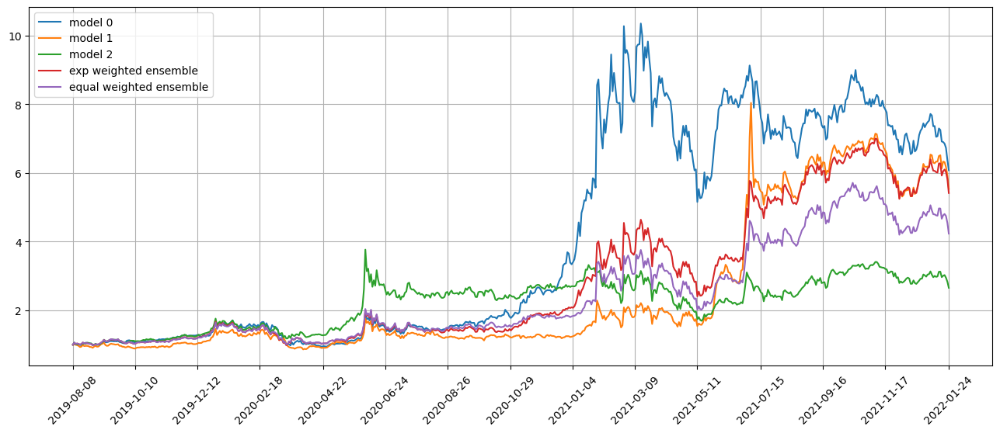

Standardization data are from 2020-06-22 to 2021-04-07
Training data are from 2021-04-08 to 2022-01-20
Testing data are from 2021-12-23 to 2022-02-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 32 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0680 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0681 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.0679 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss: 0.0681 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss: 0.0684 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0571 - val_loss: 0.0681 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0551 - val_loss: 0.0697 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0551 - val_loss: 0.0696 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0550 - val_loss: 0.0694 - lr: 0.0012
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05930212037444901
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.0816725064841602
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.0583582347607076
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.08157606926554481
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.058558052319199916
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.08156539339288191
Correlations between old and new weights
0.9958954701488996
0.06993597968946483
0.9826

position on 2022-01-27 market open will be {'TAL': 0.30824081207015597, 'EDU': 0.368010454096297, 'XENE': 0.4391473634504528, 'COF': 0.4745497699431631, 'PHG': 0.45209600601372224, 'JEF': 0.4656684146903145, 'NAVI': 0.42385747864833756, 'RJF': 0.4764198959933547, 'SPTS': 0.4640444805589418, 'FAS': 0.46787783631549595}
Total asset on 2022-01-27 will be 4.3399125117801995
It should be the same as 4.339912511780235
Testing data from 2021-12-29 to 2022-01-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-01-27 are ['ARES', 'UUUU', 'MTDR', 'OVV', 'VTLE', 'SCHO', 'TROW', 'CROX', 'SHY', 'ANY']
position on 2022-01-28 market open will be {'ANY': 0.23921529627912963, 'CROX': 0.5730037997824357, 'SHY': 0.6795903955947599, 'UUUU': 0.6013524037701117, 'SCHO': 0.6930918053524966, 'VTLE': 0.6411647529095457, 'TROW': 0.6530434467106985, 'ARES': 0.6798470567680511, 'OVV': 0.6610328330801224, 'MTDR': 0.6640525640590429}
Total asset on 2022-01-28 will be 6.085394354306368
It shou

Testing data from 2022-01-03 to 2022-01-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-01 are ['ALLY', 'SPTS', 'DHT', 'JEF', 'CROX', 'AEHR', 'ANY', 'TFIN', 'SCHO', 'SHY']
position on 2022-02-02 market open will be {'ANY': 0.31629576816283184, 'CROX': 0.6456004609055666, 'SHY': 0.6798304672236966, 'AEHR': 0.7983599525312464, 'SCHO': 0.6711688845637386, 'JEF': 0.7257456758540146, 'SPTS': 0.7220659153361534, 'DHT': 0.7602849303314281, 'TFIN': 0.7221541175333435, 'ALLY': 0.7378407365603772}
Total asset on 2022-02-02 will be 6.779346909002369
It should be the same as 6.779346909002397
top_stocks by model 1 to buy on 2022-02-01 are ['CROX', 'AEHR', 'SCHO', 'SHY', 'TAL', 'EDU', 'DDS', 'CWEB', 'CAR', 'XENE']
position on 2022-02-02 market open will be {'XENE': 0.6352077799602394, 'SHY': 0.5951989977075749, 'SCHO': 0.576126118949183, 'CWEB': 0.7251869009210523, 'CROX': 0.6432342662230389, 'EDU': 0.6428285708726637, 'CAR': 0.62216229303543, 'TAL': 0.6225332567321108

position on 2022-02-07 market open will be {'ANY': 0.4186267413297294, 'CROX': 0.6067527370319958, 'SHY': 0.6779898773646105, 'AEHR': 0.7161584260043153, 'SCHO': 0.6694404243285916, 'EPAM': 0.716897896553719, 'BX': 0.7047924355304382, 'CAR': 0.747373782077527, 'HUBS': 0.7446726903306361, 'TFIN': 0.7487599896266715}
Total asset on 2022-02-07 will be 6.7514650001782055
It should be the same as 6.751465000178234
top_stocks by model 1 to buy on 2022-02-04 are ['UPRO', 'KOLD', 'SHY', 'TAL', 'CWEB', 'EDU', 'HRI', 'NVDA', 'CROX', 'XENE']
position on 2022-02-07 market open will be {'XENE': 0.5896380761422192, 'SHY': 0.5935875411869623, 'CWEB': 0.6600203515619584, 'CROX': 0.6045289234089999, 'EDU': 0.6428285708726638, 'TAL': 0.6507316531939581, 'NVDA': 0.6579322618589577, 'UPRO': 0.6605880692810401, 'KOLD': 0.7892179246222908, 'HRI': 0.6470532069901579}
Total asset on 2022-02-07 will be 6.496126579119182
It should be the same as 6.496126579119207
top_stocks by model 2 to buy on 2022-02-04 are [

position on 2022-02-10 market open will be {'XENE': 0.6547985009632761, 'SHY': 0.5916957662826805, 'CWEB': 0.7045786875323861, 'EDU': 0.723744062813028, 'TAL': 0.7353267908639951, 'SCHO': 0.6697290592959116, 'CAR': 0.7314851763379477, 'IT': 0.6100071894250778, 'KOLD': 0.6745022762016221, 'AEHR': 0.6623550051126594}
Total asset on 2022-02-10 will be 6.758222514828556
It should be the same as 6.758222514828585
top_stocks by model 2 to buy on 2022-02-09 are ['BSV', 'IT', 'TGTX', 'SUB', 'SPSB', 'SHM', 'SCHO', 'SHY', 'TAL', 'EDU']
position on 2022-02-10 market open will be {'TAL': 0.24042625091559267, 'EDU': 0.22617361728599783, 'SHY': 0.3019834306306247, 'SCHO': 0.30198623789092854, 'BSV': 0.3110412813329538, 'SHM': 0.3114125138034321, 'SUB': 0.3117176292432672, 'SPSB': 0.31135515525148794, 'TGTX': 0.30601347069208856, 'IT': 0.2973540923674079}
Total asset on 2022-02-10 will be 2.9194636794137536
It should be the same as 2.919463679413781
top_stocks by return weighted ensemble to buy on 20

top_stocks by model 2 to buy on 2022-02-14 are ['SPTS', 'SPSB', 'MDGL', 'RVNC', 'SCHO', 'TTMI', 'MINT', 'SHY', 'TAL', 'EDU']
position on 2022-02-15 market open will be {'TAL': 0.23546168504090564, 'EDU': 0.2107207564538123, 'SPTS': 0.3044480171832411, 'SHY': 0.3081880210094193, 'MINT': 0.30852966174640906, 'SCHO': 0.3082228750542326, 'SPSB': 0.30790220272769914, 'TTMI': 0.30773248660058306, 'MDGL': 0.30366854901037876, 'RVNC': 0.31086272459857034}
Total asset on 2022-02-15 will be 2.9057369794252232
It should be the same as 2.9057369794252508
top_stocks by return weighted ensemble to buy on 2022-02-14 are ['SPSB', 'MDGL', 'TTMI', 'SPTS', 'MINT', 'SCHO', 'XENE', 'SHY', 'TAL', 'EDU']
position on 2022-02-15 market open will be {'TAL': 0.478418718987461, 'EDU': 0.5337990436934874, 'XENE': 0.660980985665661, 'SHY': 0.6082675451264558, 'SPTS': 0.6084723455261448, 'SCHO': 0.6083579570139301, 'MINT': 0.6120939548302959, 'TTMI': 0.6105124339971318, 'MDGL': 0.6024499624095013, 'SPSB': 0.61172484

position on 2022-02-18 market open will be {'TAL': 0.24113547219638107, 'EDU': 0.22055438907553723, 'SPTS': 0.30787661158929286, 'KMB': 0.3064884839165568, 'SHY': 0.30449944797583234, 'VMBS': 0.3051632979342013, 'MASI': 0.31806500248034403, 'VGSH': 0.3044645721929923, 'SCHO': 0.3044537494219559, 'TTMI': 0.30421115124411674}
Total asset on 2022-02-18 will be 2.9169121780271827
It should be the same as 2.916912178027211
top_stocks by return weighted ensemble to buy on 2022-02-17 are ['MASI', 'VMBS', 'VGSH', 'TTMI', 'SPTS', 'XENE', 'TAL', 'EDU', 'SCHO', 'SHY']
position on 2022-02-18 market open will be {'TAL': 0.48994690448506534, 'EDU': 0.558709658944911, 'XENE': 0.6616179880416388, 'SHY': 0.6098555314534129, 'SPTS': 0.5974070660664672, 'VMBS': 0.5915185247913172, 'MASI': 0.616526765599074, 'VGSH': 0.5901641377386421, 'SCHO': 0.5901431592343431, 'TTMI': 0.5896729148856816}
Total asset on 2022-02-18 will be 5.895562651240509
It should be the same as 5.895562651240553
top_stocks by equal w

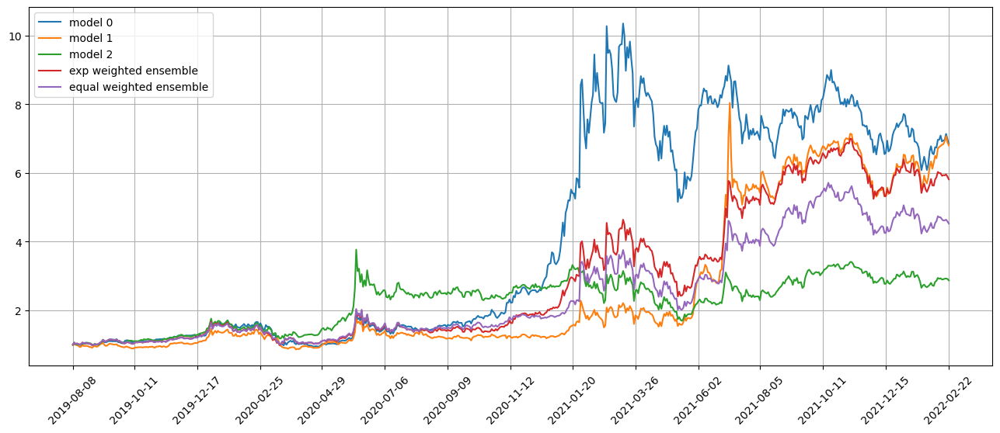

Standardization data are from 2020-07-21 to 2021-05-05
Training data are from 2021-05-06 to 2022-02-17
Testing data are from 2022-01-24 to 2022-03-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 33 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0559 - val_loss: 0.0766 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0559 - val_loss: 0.0769 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0559 - val_loss: 0.0767 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0559 - val_loss: 0.0768 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0558 - val_loss: 0.0768 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0557 - val_loss: 0.0779 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 4ms/step
Model 1 training loss 0.05902056198545002
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.14701173177579072
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05897374977825987
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.1471371864414803
Correlations between old and new weights
0.9994560401528237
0.5494577602953591
0.998236722786761
0.7097787211130485
0.9986674787848256
0.7595828121614845
Weight of model 0 is 0.2951420710006478
Weight of model 1 is 0.3660312781720341
Weight of model 2 is 0.338826650827318
Testing data from 2022-01-24 to 2022-02-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-22 are ['PIPR', 'WMS', 'SHY', 'MCO', 'PCTY', 'CROX', 'KKR', 'ACN', 'EPAM', 'AEHR']
position on 2022-02-23 market open will be {'CROX': 0.49925383231254716, 'SHY': 0.6751088957056564, 'AEHR': 0.7291687521333511, 'MCO': 0.7211584221292404, 

Testing data from 2022-01-27 to 2022-02-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-02-25 are ['IT', 'EXR', 'BLDR', 'ODFL', 'FELE', 'MSI', 'MINT', 'SCHO', 'SHY', 'AEHR']
position on 2022-02-28 market open will be {'SHY': 0.6767094139358059, 'AEHR': 0.7457273131351022, 'SCHO': 0.7249574901905144, 'MINT': 0.6314007539488807, 'EXR': 0.6424428052691467, 'MSI': 0.6401426961580554, 'BLDR': 0.6492117135622946, 'ODFL': 0.6512621711660874, 'FELE': 0.6402457412785258, 'IT': 0.6338227182020072}
Total asset on 2022-02-28 will be 6.6359228168463895
It should be the same as 6.6359228168464215
top_stocks by model 1 to buy on 2022-02-25 are ['NSC', 'STLD', 'IT', 'NAVI', 'ARCB', 'OLN', 'BBWI', 'BLDR', 'PWR', 'BCC']
position on 2022-02-28 market open will be {'PWR': 0.6907113959608064, 'NAVI': 0.6929605567043571, 'BLDR': 0.7104551942448653, 'OLN': 0.7050230699488994, 'STLD': 0.7390591723671988, 'BBWI': 0.7057468917196157, 'BCC': 0.7184132768152938, 'ARCB': 0.70662046584750

top_stocks by model 0 to buy on 2022-03-02 are ['BSV', 'MEDP', 'SPTS', 'MINT', 'MASI', 'AEHR', 'CAR', 'TTMI', 'SCHO', 'SHY']
position on 2022-03-03 market open will be {'AEHR': 0.8072305961112118, 'SHY': 0.6539795798897907, 'SPTS': 0.6538939665972391, 'SCHO': 0.6539854330490679, 'BSV': 0.608751469593619, 'MASI': 0.6121786066341068, 'MEDP': 0.6154000369276126, 'MINT': 0.6095451065603498, 'CAR': 0.6207890043455022, 'TTMI': 0.6368473762167073}
Total asset on 2022-03-03 will be 6.472601175925173
It should be the same as 6.472601175925206
top_stocks by model 1 to buy on 2022-03-02 are ['PUMP', 'TPL', 'SHY', 'ONB', 'COKE', 'HESM', 'EQT', 'OKE', 'DINO', 'BKR']
position on 2022-03-03 market open will be {'SHY': 0.7355456901137765, 'DINO': 0.7176211313025406, 'EQT': 0.7164215057617308, 'COKE': 0.7227547239297024, 'ONB': 0.7196417882985615, 'TPL': 0.7108828511092227, 'PUMP': 0.7261522830571077, 'OKE': 0.7321456680303108, 'HESM': 0.7195989071843456, 'BKR': 0.7347822811706305}
Total asset on 2022-

position on 2022-03-08 market open will be {'AEHR': 0.6552465343063839, 'EPAM': 0.446879739654097, 'SHY': 0.607465200578867, 'SCHO': 0.6074547184091635, 'CROX': 0.5421075827821736, 'PRI': 0.5719840888459382, 'AUPH': 0.5619660483260444, 'SPTS': 0.5783019048146621, 'ANY': 0.5264025308398452, 'TPX': 0.5257731764037598}
Total asset on 2022-03-08 will be 5.6235815249608985
It should be the same as 5.623581524960935
top_stocks by model 1 to buy on 2022-03-07 are ['FANG', 'EC', 'NBR', 'EPAM', 'DNN', 'UUUU', 'RIG', 'NOG', 'WTI', 'VTLE']
position on 2022-03-08 market open will be {'VTLE': 0.7441110275735374, 'DNN': 0.7524325561325299, 'UUUU': 0.7478668957238862, 'FANG': 0.6941173204769983, 'EC': 0.7370101783197038, 'EPAM': 0.6188967809860937, 'NOG': 0.7032355831936717, 'RIG': 0.8565917677720535, 'WTI': 0.7690994792510453, 'NBR': 0.7269377603619877}
Total asset on 2022-03-08 will be 7.350299349791473
It should be the same as 7.3502993497915075
top_stocks by model 2 to buy on 2022-03-07 are ['LPG

position on 2022-03-11 market open will be {'FANG': 0.7407296218418669, 'OVV': 0.7406376405140745, 'DNN': 0.721857944153079, 'UCO': 0.7158865653579786, 'SM': 0.7292541183843417, 'UUUU': 0.744231098773463, 'CCJ': 0.7425969233112881, 'MGY': 0.755862899386162, 'MTDR': 0.7338969736020604, 'EQNR': 0.7123345723088883}
Total asset on 2022-03-11 will be 7.337288357633169
It should be the same as 7.337288357633204
top_stocks by model 2 to buy on 2022-03-10 are ['OII', 'CSTM', 'VRN', 'LPG', 'UCO', 'SM', 'OVV', 'UUUU', 'DNN', 'CCJ']
position on 2022-03-11 market open will be {'VRN': 0.3176482886961762, 'CSTM': 0.31531670531550826, 'DNN': 0.31092685212758725, 'UCO': 0.30835479203368565, 'SM': 0.3141126162937097, 'UUUU': 0.3205636713863147, 'OII': 0.32512126139772685, 'LPG': 0.3218677166585911, 'CCJ': 0.31985978077127913, 'OVV': 0.3190158562325251}
Total asset on 2022-03-11 will be 3.172787540913074
It should be the same as 3.172787540913104
top_stocks by return weighted ensemble to buy on 2022-03-

top_stocks by model 2 to buy on 2022-03-15 are ['MSA', 'EPAM', 'XLP', 'PARR', 'CWEB', 'VDC', 'ONB', 'CASY', 'MINT', 'PG']
position on 2022-03-16 market open will be {'EPAM': 0.37717269451128876, 'MSA': 0.31175372355562486, 'VDC': 0.3137373881756715, 'ONB': 0.3093155263518879, 'XLP': 0.3134696523849097, 'MINT': 0.30821582673782283, 'PARR': 0.3073290418007145, 'CWEB': 0.5064450375899401, 'PG': 0.3162143527815381, 'CASY': 0.31476979637375724}
Total asset on 2022-03-16 will be 3.3784230402631255
It should be the same as 3.3784230402631557
top_stocks by return weighted ensemble to buy on 2022-03-15 are ['MINT', 'ONB', 'UPBD', 'CASY', 'EPAM', 'PG', 'COKE', 'SXT', 'SCHO', 'SHY']
position on 2022-03-16 market open will be {'EPAM': 0.757302517889252, 'SXT': 0.6340156748022543, 'COKE': 0.6547063731790191, 'SHY': 0.6083914552506806, 'ONB': 0.6106440979382886, 'MINT': 0.6084730944754041, 'CASY': 0.6214118011851899, 'SCHO': 0.6086512803556519, 'PG': 0.624263613556053, 'UPBD': 0.6420400011956503}
To

position on 2022-03-21 market open will be {'EPAM': 0.7031149669605667, 'YANG': 0.6205071296486395, 'CAR': 0.6711256514775003, 'HRI': 0.6680280847509458, 'KLIC': 0.6738597157789404, 'BOOT': 0.7021588041475709, 'F': 0.6837156980638273, 'EXP': 0.6744569726739131, 'FWRD': 0.6617772848677265, 'PCY': 0.6537668518060624}
Total asset on 2022-03-21 will be 6.712511160175644
It should be the same as 6.712511160175693
top_stocks by equal weighted ensemble to buy on 2022-03-18 are ['KLIC', 'TM', 'CUBI', 'PCY', 'F', 'EXP', 'HRI', 'CAR', 'EPAM', 'YANG']
position on 2022-03-21 market open will be {'EPAM': 0.5466454404758369, 'YANG': 0.4824209541029458, 'CAR': 0.521774950905186, 'HRI': 0.5193667092843876, 'CUBI': 0.5036849033506078, 'KLIC': 0.5239005830629121, 'F': 0.53156323857533, 'EXP': 0.524364927834068, 'PCY': 0.5082791370789711, 'TM': 0.5201983086297911}
Total asset on 2022-03-21 will be 5.182199153299987
It should be the same as 5.1821991533000356
Testing data from 2022-02-18 to 2022-03-18 hav

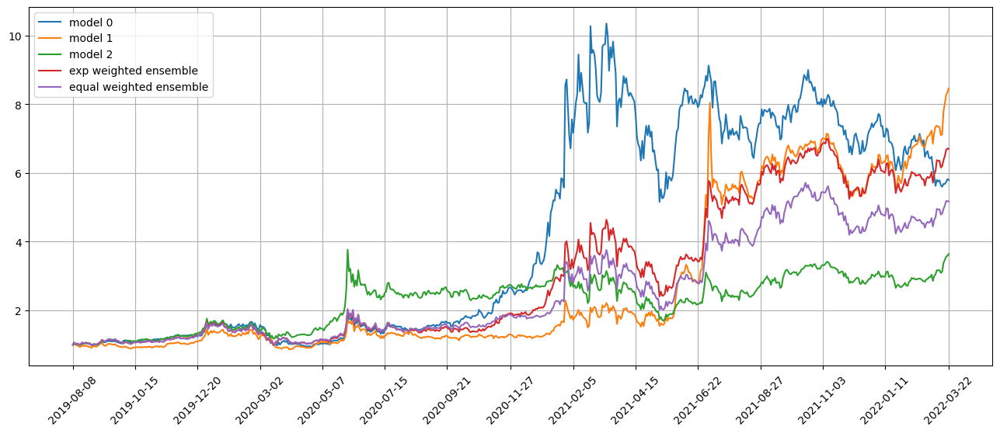

Standardization data are from 2020-08-18 to 2021-06-03
Training data are from 2021-06-04 to 2022-03-18
Testing data are from 2022-02-22 to 2022-04-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 34 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0594 - val_loss: 0.1154 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0594 - val_loss: 0.1153 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0593 - val_loss: 0.1155 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0593 - val_loss: 0.1150 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0592 - val_loss: 0.1155 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0592 - val_loss: 0.1150 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0573 - val_loss: 0.1154 - lr: 0.0025
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.1168 - lr: 0.0025
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.1156 - lr: 0.0025
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.1161 - lr: 0.0025
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0572 - val_loss: 0.1160 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0570 - val_loss: 0.1158 - lr: 0.0012
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0570 - val_loss: 0.1157 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0570 - val_loss: 0.1154 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0570 - val_loss

top_stocks by model 2 to buy on 2022-03-24 are ['PNFP', 'EXP', 'COF', 'PPBI', 'CBU', 'DFS', 'PTGX', 'EPAM', 'CAR', 'XENE']
position on 2022-03-25 market open will be {'PTGX': 0.36138204595913115, 'XENE': 0.3466605388065817, 'EPAM': 0.3619277349856267, 'COF': 0.37313577569498185, 'PNFP': 0.3745891942193894, 'CBU': 0.37236710184768035, 'PPBI': 0.37343054266974546, 'EXP': 0.3788211033547178, 'DFS': 0.37387764809694757, 'CAR': 0.3776512129221806}
Total asset on 2022-03-25 will be 3.6938428985569525
It should be the same as 3.6938428985569822
top_stocks by return weighted ensemble to buy on 2022-03-24 are ['CBU', 'EXP', 'PPBI', 'COF', 'ALLY', 'TM', 'DFS', 'EPAM', 'XENE', 'CAR']
position on 2022-03-25 market open will be {'XENE': 0.6366669195112333, 'EPAM': 0.6666679603755274, 'COF': 0.6856645943904641, 'CBU': 0.6842520993255058, 'PPBI': 0.6862062505150064, 'EXP': 0.6961118045957282, 'DFS': 0.6870278398167058, 'TM': 0.680436485638286, 'CAR': 0.6939620443712821, 'ALLY': 0.6892075181215715}
To

position on 2022-03-30 market open will be {'XENE': 0.4928615641010749, 'EPAM': 0.4844096049809011, 'YANG': 0.5182716201791374, 'MBB': 0.5007539718410677, 'SCHP': 0.5006886620744369, 'NEAR': 0.5000101556778451, 'TIP': 0.5005134061845069, 'JPST': 0.5000116808951574, 'SPMB': 0.5013714528197336, 'CWEB': 0.4773484515806976}
Total asset on 2022-03-30 will be 4.976240570334508
It should be the same as 4.976240570334559
Testing data from 2022-03-02 to 2022-03-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-03-30 are ['UGI', 'SUM', 'TSE', 'EMN', 'DFS', 'EXP', 'ALLY', 'COF', 'YANG', 'GEN']
position on 2022-03-31 market open will be {'YANG': 0.6318527197138916, 'COF': 0.5788870231333773, 'EMN': 0.5888572548362614, 'UGI': 0.5885130109596617, 'GEN': 0.5955786205937443, 'EXP': 0.5665748636207465, 'DFS': 0.5825783550352106, 'TSE': 0.566716989108811, 'ALLY': 0.5790494029978522, 'SUM': 0.5629666499886067}
Total asset on 2022-03-31 will be 5.841574889988126
It should be the s

top_stocks by model 0 to buy on 2022-04-04 are ['VTIP', 'SPSB', 'NEAR', 'SPTS', 'VGSH', 'JPST', 'SCHO', 'VMBS', 'MBB', 'SHY']
position on 2022-04-05 market open will be {'SHY': 0.5958122156110699, 'VMBS': 0.5953091221926727, 'NEAR': 0.5961474901584274, 'MBB': 0.5937955623832424, 'VGSH': 0.5959263984532165, 'JPST': 0.5959084894578158, 'SPTS': 0.5956243316430375, 'VTIP': 0.5960271980417857, 'SCHO': 0.5957860296164781, 'SPSB': 0.5946410943394236}
Total asset on 2022-04-05 will be 5.9549779318971305
It should be the same as 5.95497793189717
top_stocks by model 1 to buy on 2022-04-04 are ['BSV', 'ISTB', 'VMBS', 'SPSB', 'MBB', 'SCHO', 'CWEB', 'MINT', 'SHY', 'UCO']
position on 2022-04-05 market open will be {'UCO': 0.900060580287207, 'SHY': 0.8373095517383761, 'MBB': 0.834475499387717, 'BSV': 0.8373959121749179, 'VMBS': 0.8366025421914023, 'MINT': 0.8375278676318205, 'CWEB': 0.8621163205971287, 'ISTB': 0.8376116718325566, 'SCHO': 0.8372727519165212, 'SPSB': 0.8356637462290215}
Total asset on 

top_stocks by model 1 to buy on 2022-04-07 are ['MATX', 'XENE', 'CWEB', 'NEAR', 'MBB', 'SHY', 'SCHO', 'VMBS', 'MINT', 'UCO']
position on 2022-04-08 market open will be {'CWEB': 0.6916979475213085, 'XENE': 0.8541674171253714, 'MINT': 0.8211962985463104, 'SCHO': 0.8218624001532762, 'SHY': 0.7919046425709707, 'VMBS': 0.7886028312602464, 'NEAR': 0.7921533859476795, 'MBB': 0.7901812529429623, 'UCO': 0.7850908073066721, 'MATX': 0.7774141263470866}
Total asset on 2022-04-08 will be 7.914271109721849
It should be the same as 7.914271109721885
top_stocks by model 2 to buy on 2022-04-07 are ['SPMB', 'BX', 'UCO', 'SCHO', 'CAR', 'SHY', 'XENE', 'VMBS', 'MBB', 'AEHR']
position on 2022-04-08 market open will be {'XENE': 0.39471250461943275, 'AEHR': 0.326289102791143, 'SHY': 0.32616849734516684, 'MBB': 0.3254586702080474, 'VMBS': 0.3248085522509699, 'UCO': 0.323362025088484, 'SPMB': 0.32521307791333015, 'SCHO': 0.32626992349630984, 'CAR': 0.3313663617981953, 'BX': 0.32550245925749965}
Total asset on 2

top_stocks by model 2 to buy on 2022-04-12 are ['CWEB', 'ORI', 'PTGX', 'IRT', 'AEHR', 'SCHO', 'VNLA', 'SHY', 'XENE', 'LXP']
position on 2022-04-13 market open will be {'XENE': 0.36324991367150705, 'CWEB': 0.31203914166307484, 'PTGX': 0.3054325304296272, 'SHY': 0.32315131149369625, 'AEHR': 0.3225698192976921, 'ORI': 0.3182054068982685, 'IRT': 0.3212453371852942, 'LXP': 0.31819765367607894, 'VNLA': 0.3227015910331361, 'SCHO': 0.32309178889525714}
Total asset on 2022-04-13 will be 3.2298844942436014
It should be the same as 3.229884494243633
top_stocks by return weighted ensemble to buy on 2022-04-12 are ['ICSH', 'IRT', 'ENOV', 'ORI', 'VNLA', 'XENE', 'CWEB', 'SHY', 'SCHO', 'LXP']
position on 2022-04-13 market open will be {'XENE': 0.590083230997677, 'CWEB': 0.5751535063367113, 'ICSH': 0.6006763190229809, 'SHY': 0.6013991172862571, 'ORI': 0.5921945665012904, 'IRT': 0.5978520134192018, 'LXP': 0.5921801374062656, 'VNLA': 0.6005621672929048, 'SCHO': 0.601288343054847, 'ENOV': 0.60075514845775

position on 2022-04-19 market open will be {'CWEB': 0.4160022850849768, 'XENE': 0.4507051618993036, 'SHY': 0.4760346939403316, 'SCHO': 0.4761045077026411, 'PTGX': 0.4435630304162248, 'HWC': 0.47883729533245895, 'EXP': 0.4620440777347245, 'TFC': 0.47344697483440085, 'ABCB': 0.47874622742304956, 'VNLA': 0.47365193411774154}
Total asset on 2022-04-19 will be 4.6291361884858
It should be the same as 4.6291361884858535
Testing data from 2022-03-21 to 2022-04-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-04-19 are ['DUST', 'LABD', 'NKTR', 'CX', 'JDST', 'KOLD', 'MDU', 'GSY', 'ENOV', 'VNLA']
position on 2022-04-20 market open will be {'VNLA': 0.5679895348512051, 'GSY': 0.5741764822321379, 'KOLD': 0.5878704192626455, 'CX': 0.6108658191641994, 'MDU': 0.5812962604335795, 'JDST': 0.5840309032808888, 'NKTR': 0.54944567759319, 'ENOV': 0.6060293440561437, 'DUST': 0.5921807822717248, 'LABD': 0.5442329679644158}
Total asset on 2022-04-20 will be 5.798118191110092
It should 

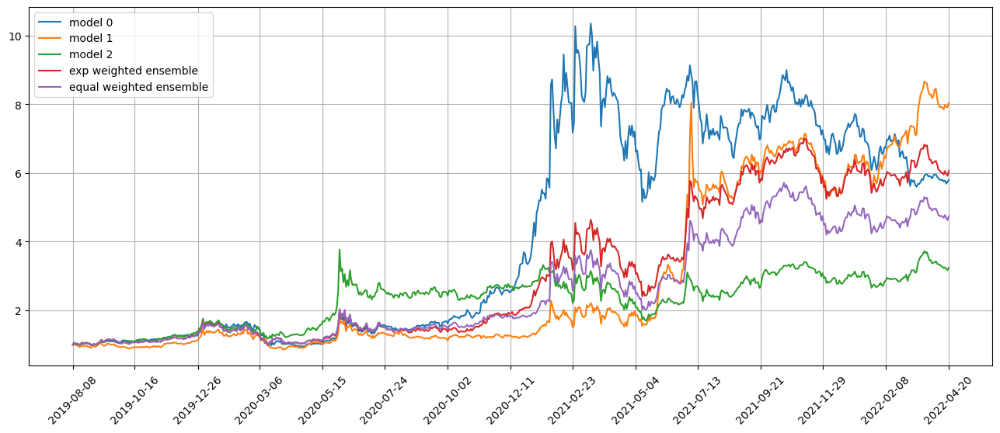

Standardization data are from 2020-09-16 to 2021-07-01
Training data are from 2021-07-02 to 2022-04-18
Testing data are from 2022-03-22 to 2022-05-16
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 35 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0659 - val_loss: 0.0824 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0658 - val_loss: 0.0822 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0658 - val_loss: 0.0828 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0657 - val_loss: 0.0824 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0656 - val_loss: 0.0833 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0655 - val_loss: 0.0825 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0620 - val_loss: 0.0838 - lr: 0.0012
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0620 - val_loss: 0.0838 - lr: 0.0012
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0619 - val_loss: 0.0840 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0619 - val_loss: 0.0839 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0619 - val_loss: 0.0840 - lr: 0.0012
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.06882306961896882
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.11320788108124202
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06632480517874066
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.11391081410518702
96/96 [==============================] - 

Testing data from 2022-03-25 to 2022-04-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-04-25 are ['VNLA', 'FTNT', 'XRX', 'BKU', 'ALLY', 'CX', 'DOV', 'SM', 'SLM', 'CAR']
position on 2022-04-26 market open will be {'VNLA': 0.5556817485518138, 'ALLY': 0.5359059935992899, 'CX': 0.5459882844394136, 'FTNT': 0.5823895697232747, 'SM': 0.5638014066972451, 'XRX': 0.58782022979571, 'BKU': 0.5469810861860314, 'DOV': 0.5468360457243072, 'SLM': 0.5596404283217834, 'CAR': 0.563787133785065}
Total asset on 2022-04-26 will be 5.588831926823898
It should be the same as 5.588831926823934
top_stocks by model 1 to buy on 2022-04-25 are ['VRN', 'VOX', 'PR', 'FIXD', 'VTLE', 'CWEB', 'SPMB', 'VMBS', 'DOV', 'MBB']
position on 2022-04-26 market open will be {'VTLE': 0.8055538439680455, 'VRN': 0.7754519936540842, 'VOX': 0.7808556628250481, 'VMBS': 0.7794380024714742, 'MBB': 0.7796666367824033, 'SPMB': 0.7813622841276735, 'CWEB': 0.8332232425261676, 'DOV': 0.7684248698627055, 'FIXD': 0.

position on 2022-04-29 market open will be {'XENE': 0.5205295776934795, 'VIXY': 0.5738516726641867, 'PTGX': 0.5310709567072165, 'SHY': 0.5647953853153154, 'IEI': 0.5636205849397519, 'BSV': 0.563835316016052, 'UVXY': 0.5772723401049525, 'VGSH': 0.564831463818765, 'VNLA': 0.5655382761543634, 'SCHO': 0.5649680679576595}
Total asset on 2022-04-29 will be 5.590313641371707
It should be the same as 5.5903136413717425
top_stocks by model 1 to buy on 2022-04-28 are ['IBN', 'ARCC', 'UHS', 'SCHO', 'NEAR', 'VZ', 'SHY', 'KOLD', 'CAR', 'PTGX']
position on 2022-04-29 market open will be {'PTGX': 0.7342100230843869, 'SHY': 0.7808343266621682, 'IBN': 0.7819364237948535, 'NEAR': 0.782341581490092, 'ARCC': 0.782341581490092, 'SCHO': 0.7810730618541808, 'VZ': 0.7738256625153999, 'CAR': 0.7532117002544904, 'KOLD': 0.783194754316001, 'UHS': 0.7846336017792771}
Total asset on 2022-04-29 will be 7.737602717240907
It should be the same as 7.737602717240942
top_stocks by model 2 to buy on 2022-04-28 are ['JDST

Testing data from 2022-04-04 to 2022-05-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-03 are ['RIO', 'SHY', 'DK', 'DHT', 'TTE', 'XENE', 'CLB', 'FTSM', 'NAT', 'FRO']
position on 2022-05-04 market open will be {'FRO': 0.5822062149454321, 'SHY': 0.5526697961694294, 'RIO': 0.541749963008703, 'XENE': 0.5513823230903108, 'DK': 0.6025978282253409, 'DHT': 0.5774430333419005, 'CLB': 0.563519750573881, 'TTE': 0.5744303835971749, 'FTSM': 0.5534857702334771, 'NAT': 0.6245967026164292}
Total asset on 2022-05-04 will be 5.724081765802045
It should be the same as 5.7240817658020795
top_stocks by model 1 to buy on 2022-05-03 are ['EME', 'PNFP', 'TTE', 'INSW', 'KOLD', 'CLB', 'AMZN', 'VRSN', 'NEO', 'CWEB']
position on 2022-05-04 market open will be {'NEO': 0.7570636908511156, 'VRSN': 0.7832773237251216, 'PNFP': 0.7582027640847913, 'AMZN': 0.75274880516221, 'CWEB': 0.7002294331110788, 'EME': 0.7597286124296254, 'CLB': 0.7689486647598813, 'INSW': 0.7870051980531321, 'TTE': 

top_stocks by model 1 to buy on 2022-05-06 are ['ZBRA', 'BHC', 'INDA', 'DPZ', 'WST', 'AKAM', 'JCI', 'WK', 'IDXX', 'UCO']
position on 2022-05-09 market open will be {'WST': 0.7294463247218118, 'AKAM': 0.7254174144438466, 'ZBRA': 0.7315917276867268, 'DPZ': 0.7407546830916668, 'WK': 0.6969513898853922, 'UCO': 0.7198694381731854, 'JCI': 0.7328711341263972, 'BHC': 0.7120482400769772, 'INDA': 0.7413695966602584, 'IDXX': 0.7157993962252899}
Total asset on 2022-05-09 will be 7.246119345091517
It should be the same as 7.246119345091553
top_stocks by model 2 to buy on 2022-05-06 are ['UEC', 'CEIX', 'PUMP', 'QSR', 'VET', 'IDXX', 'IAG', 'JCI', 'BFAM', 'UCO']
position on 2022-05-09 market open will be {'QSR': 0.3035148717100693, 'PUMP': 0.30414733238794056, 'JCI': 0.3047822319461321, 'UCO': 0.29937516141601966, 'BFAM': 0.28838297478704383, 'CEIX': 0.3076369596384727, 'IDXX': 0.29768253578071935, 'VET': 0.2986905342385129, 'IAG': 0.31029835343756634, 'UEC': 0.28900089202378987}
Total asset on 2022-0

position on 2022-05-12 market open will be {'VRN': 0.7305765121886791, 'ERX': 0.7266227467241405, 'WEN': 0.6890603588320765, 'PTEN': 0.7068060600533119, 'OII': 0.7116386316213451, 'CAR': 0.7159968167622026, 'WD': 0.7260303404833616, 'PR': 0.7164528628300448, 'VRNS': 0.6932439856505713, 'SRLN': 0.7234150209362152}
Total asset on 2022-05-12 will be 7.139843336081912
It should be the same as 7.13984333608195
top_stocks by model 2 to buy on 2022-05-11 are ['LNTH', 'GKOS', 'IAG', 'IDXX', 'PEGA', 'OII', 'CAR', 'FTNT', 'WK', 'BHC']
position on 2022-05-12 market open will be {'FTNT': 0.2864901142674659, 'PEGA': 0.2676995648176907, 'WK': 0.2745829990310741, 'OII': 0.282781037502774, 'LNTH': 0.2925758783614347, 'BHC': 0.31484692117561763, 'IDXX': 0.2853104997390575, 'CAR': 0.2845128323506071, 'GKOS': 0.2744175307486572, 'IAG': 0.2848044135429486}
Total asset on 2022-05-12 will be 2.8480217915372954
It should be the same as 2.8480217915373274
top_stocks by return weighted ensemble to buy on 2022-

position on 2022-05-17 market open will be {'BKLN': 0.5736270425331891, 'MGM': 0.5719350297532431, 'UUUU': 0.6115851057765127, 'CHH': 0.5805011396920702, 'CCJ': 0.6019989229867168, 'ZD': 0.5755628692640825, 'LOGI': 0.5881148917411075, 'MFC': 0.5881440492641069, 'ASND': 0.5956198875101023, 'SRLN': 0.5774197674691627}
Total asset on 2022-05-17 will be 5.864508705990239
It should be the same as 5.864508705990294
top_stocks by equal weighted ensemble to buy on 2022-05-16 are ['CHH', 'CCJ', 'UUUU', 'MGM', 'ZD', 'LOGI', 'MFC', 'ASND', 'BKLN', 'SRLN']
position on 2022-05-17 market open will be {'BKLN': 0.4494231419889909, 'MGM': 0.4480974902266704, 'UUUU': 0.4791623815675439, 'CHH': 0.45480883358720947, 'CCJ': 0.47165183539446737, 'ZD': 0.4509398161818644, 'LOGI': 0.4607740271964447, 'MFC': 0.46079687142209547, 'ASND': 0.466654012847436, 'SRLN': 0.4523946517523693}
Total asset on 2022-05-17 will be 4.594703062165033
It should be the same as 4.594703062165092
Testing data from 2022-04-19 to 20

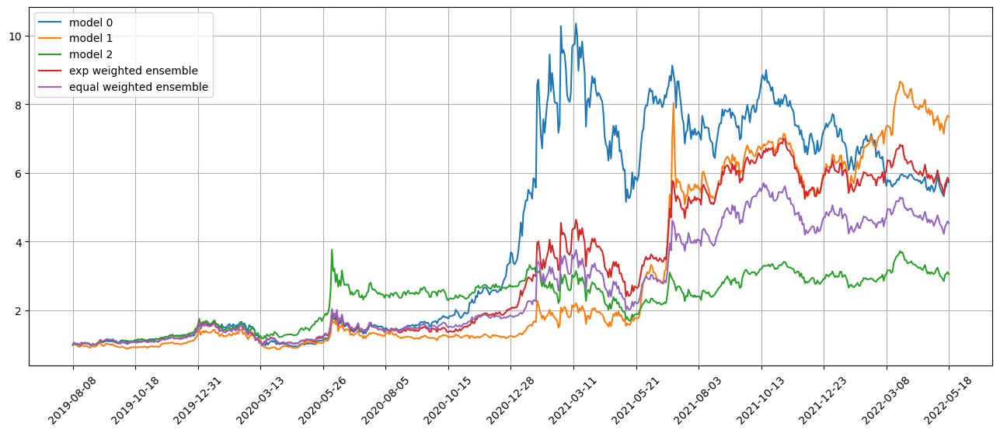

Standardization data are from 2020-10-14 to 2021-07-30
Training data are from 2021-08-02 to 2022-05-16
Testing data are from 2022-04-20 to 2022-06-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 36 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0724 - val_loss: 0.0891 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0888 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0721 - val_loss: 0.0891 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0720 - val_loss: 0.0892 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0718 - val_loss: 0.0901 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0718 - val_loss: 0.0901 - lr: 0.0100
Epoch 7/500
305/305 [

Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.07525445894335421
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.0959318674454778
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.07269243757787452
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.09712829826424703
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.07421934528686158
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.09687153827200488
Correlations between old and new weights
0.9980926465935358
-0.12945472993431262
0.9843385304414232
0.8023414773724027
0.994339097066399
0.8295770650220627
Weight of model 0 is 0.2606361815816896
Weight of model 1 is 0.42133288278093356
Weight of model 2 is 0.3180309356373767
Testing data from 2022-04-20 to 2022-05-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-05-18 are ['LNG', 'TPL', '

top_stocks by model 0 to buy on 2022-05-23 are ['DE', 'ROST', 'CSCO', 'PUMP', 'OII', 'PR', 'OVV', 'EQNR', 'BHC', 'SIGA']
position on 2022-05-24 market open will be {'DE': 0.5729933565181244, 'ROST': 0.5876283499219465, 'SIGA': 0.3866794684414236, 'PUMP': 0.5496562035125333, 'CSCO': 0.5472486601957611, 'OII': 0.5517376225060057, 'BHC': 0.5317956047713538, 'OVV': 0.5602969817565702, 'PR': 0.5639068510118058, 'EQNR': 0.5521260267330833}
Total asset on 2022-05-24 will be 5.404069125368571
It should be the same as 5.404069125368608
top_stocks by model 1 to buy on 2022-05-23 are ['HYD', 'IEP', 'FWRD', 'OII', 'BHC', 'NLY', 'HYMB', 'SAIA', 'ENTA', 'CSCO']
position on 2022-05-24 market open will be {'ENTA': 0.7387273116465273, 'HYD': 0.7580086854842293, 'IEP': 0.756293373137741, 'CSCO': 0.7525968471641131, 'OII': 0.7587702362054315, 'FWRD': 0.7280927175303284, 'BHC': 0.7313452267630675, 'SAIA': 0.7228085071386231, 'NLY': 0.7658264105188848, 'HYMB': 0.7536130016493529}
Total asset on 2022-05-24 

top_stocks by model 1 to buy on 2022-05-26 are ['SHY', 'VET', 'AR', 'CEIX', 'GUSH', 'DKS', 'ANF', 'BOIL', 'CAR', 'SIGA']
position on 2022-05-27 market open will be {'SHY': 0.7486706470377403, 'ANF': 0.8351959856434022, 'DKS': 0.967281181111077, 'SIGA': 0.9607516923963686, 'GUSH': 0.8226091438248058, 'CEIX': 0.8461608397096104, 'AR': 0.8185562802306282, 'CAR': 0.859948269298828, 'VET': 0.8128499337409285, 'BOIL': 0.6974063762445718}
Total asset on 2022-05-27 will be 8.369430349237927
It should be the same as 8.36943034923796
top_stocks by model 2 to buy on 2022-05-26 are ['IMO', 'AR', 'KOS', 'SIGA', 'PBR', 'DKS', 'BOOT', 'CAR', 'ANF', 'BOIL']
position on 2022-05-27 market open will be {'ANF': 0.319855158647558, 'DKS': 0.37043984999848745, 'IMO': 0.31492416437172566, 'SIGA': 0.37302630637678885, 'KOS': 0.31936493947542993, 'BOOT': 0.34333801969166905, 'PBR': 0.31313077206779905, 'AR': 0.31781679719381883, 'CAR': 0.33388786000629933, 'BOIL': 0.2707785233510738}
Total asset on 2022-05-27 w

position on 2022-06-02 market open will be {'DLTR': 0.3265606790704557, 'IOVA': 0.3076662617044941, 'SM': 0.3177619811594703, 'UCO': 0.3205807910402554, 'VET': 0.3294676044606998, 'COP': 0.32447485157235095, 'DDS': 0.31663987372591496, 'BHC': 0.3171135157056984, 'AEO': 0.32770629855247535, 'DVN': 0.3207184927880231}
Total asset on 2022-06-02 will be 3.2086903497798023
It should be the same as 3.2086903497798382
top_stocks by return weighted ensemble to buy on 2022-06-01 are ['BHC', 'DLTR', 'BOIL', 'CAR', 'ANF', 'VET', 'AEO', 'KOLD', 'UCO', 'SIGA']
position on 2022-06-02 market open will be {'SIGA': 0.825164913437056, 'KOLD': 0.5151483376248144, 'CAR': 0.5800748722389342, 'BOIL': 0.6637534734185543, 'DLTR': 0.612323863590925, 'UCO': 0.6011111598664102, 'BHC': 0.594609778760048, 'AEO': 0.6144719793696894, 'ANF': 0.6036628398907528, 'VET': 0.617774549788637}
Total asset on 2022-06-02 will be 6.228095767985762
It should be the same as 6.22809576798582
top_stocks by equal weighted ensemble 

position on 2022-06-07 market open will be {'SIGA': 0.5885628623784404, 'NTNX': 0.45948786205219355, 'PR': 0.5097368551843275, 'BKLN': 0.48197224289889645, 'VNOM': 0.4788427988622225, 'IEP': 0.4783772563186324, 'KHC': 0.48534470157375226, 'EXPRQ': 0.4547604718479285, 'R': 0.47727955662817767, 'SRLN': 0.4826502287704939}
Total asset on 2022-06-07 will be 4.897014836515008
It should be the same as 4.897014836515066
Testing data from 2022-05-09 to 2022-06-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-07 are ['LPG', 'TDW', 'PBR-A', 'TRGP', 'VET', 'PBR', 'OII', 'ANF', 'CAR', 'SIGA']
position on 2022-06-08 market open will be {'SIGA': 0.674346280064298, 'PBR-A': 0.5832949416270108, 'TRGP': 0.6058138515530017, 'LPG': 0.5854280459079911, 'OII': 0.584339364814567, 'PBR': 0.5774174989090546, 'TDW': 0.5903054761628596, 'ANF': 0.5749359851930146, 'CAR': 0.5942185299610239, 'VET': 0.619587423754829}
Total asset on 2022-06-08 will be 5.989687397947615
It should be the

top_stocks by model 0 to buy on 2022-06-10 are ['SBLK', 'CF', 'OII', 'PUMP', 'ENTA', 'UNG', 'GLNG', 'KOLD', 'BOIL', 'SIGA']
position on 2022-06-13 market open will be {'SIGA': 0.5667852482223993, 'KOLD': 0.4808778472125581, 'BOIL': 0.6995283521263759, 'CF': 0.5426712295748787, 'PUMP': 0.5393295077372459, 'OII': 0.5343631553131692, 'GLNG': 0.5270057877218521, 'ENTA': 0.5190110941155417, 'UNG': 0.5661945212061591, 'SBLK': 0.5524221413817348}
Total asset on 2022-06-13 will be 5.528188884611877
It should be the same as 5.528188884611915
top_stocks by model 1 to buy on 2022-06-10 are ['MINT', 'SMG', 'NTNX', 'SBLK', 'UNG', 'ENTA', 'CAR', 'BOIL', 'KOLD', 'SIGA']
position on 2022-06-13 market open will be {'SIGA': 0.9486256897120986, 'BOIL': 1.0610664211590821, 'MINT': 0.8651221131453167, 'NTNX': 0.8227492683458064, 'ENTA': 0.805461696034631, 'SMG': 0.8477228487104589, 'UNG': 0.8786864182804998, 'CAR': 0.8145289738968129, 'SBLK': 0.8573128396853872, 'KOLD': 0.8424591378950348}
Total asset on 2

position on 2022-06-16 market open will be {'SIGA': 0.5662279245088742, 'SHY': 0.5470141554756452, 'SCHO': 0.5471959598037162, 'FLOT': 0.5334414585026233, 'MBB': 0.53192061747852, 'HYD': 0.533453258755152, 'FLRN': 0.5332095128744718, 'MINT': 0.5353650217847866, 'SPSB': 0.5362337397105198, 'BOIL': 0.5760102648138002}
Total asset on 2022-06-16 will be 5.440071913708072
It should be the same as 5.440071913708111
top_stocks by model 1 to buy on 2022-06-15 are ['SHY', 'HYS', 'UNG', 'BNDX', 'HYD', 'USHY', 'MBB', 'HYMB', 'BOIL', 'SIGA']
position on 2022-06-16 market open will be {'SIGA': 0.9476928997465979, 'SHY': 0.8666108939393223, 'USHY': 0.8600453296740664, 'MBB': 0.8547296711558673, 'HYS': 0.8625328699051263, 'HYD': 0.8571924333262555, 'BNDX': 0.8523363760493604, 'UNG': 0.9000957611836288, 'HYMB': 0.8536565333438405, 'BOIL': 0.9255762007506411}
Total asset on 2022-06-16 will be 8.780468969074668
It should be the same as 8.780468969074706
top_stocks by model 2 to buy on 2022-06-15 are ['K

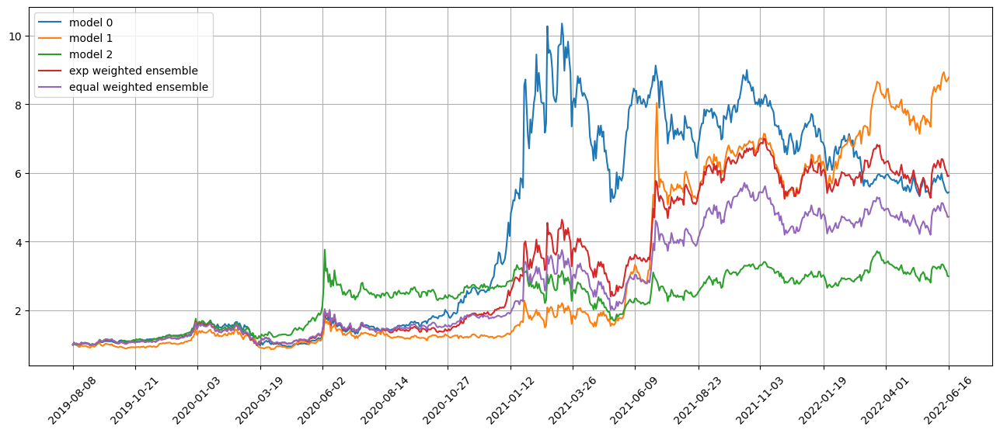

Standardization data are from 2020-11-11 to 2021-08-27
Training data are from 2021-08-30 to 2022-06-14
Testing data are from 2022-05-18 to 2022-07-14
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 37 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0752 - val_loss: 0.1045 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0750 - val_loss: 0.1052 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0749 - val_loss: 0.1053 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0748 - val_loss: 0.1063 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0747 - val_loss: 0.1061 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0746 - val_loss: 0.1045 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0712 - val_loss: 0.1065 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0711 - val_loss: 0.1063 - lr: 0.0012
Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.08086761254689376
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.08537196233279239
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.07677371009922382
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.08675373627203628
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.07975335421548407
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.08525889418022396
Correlations between old and new weights
0.9987529683447899
0.1271718262323196
0.9630248858132552
0.8922834772250392
0.9966060018505507
0.9242073799733479
Weight of model 0 is 0.2296935804199825
Weigh

position on 2022-06-22 market open will be {'SIGA': 0.6503154633327513, 'FLOT': 0.44816751826902146, 'PMT': 0.4769054695254615, 'TRP': 0.41875291544374954, 'NAVI': 0.4196476832438785, 'IFF': 0.4340058106348094, 'FLRN': 0.42645273351431345, 'SLM': 0.409433911144639, 'MDT': 0.42057239629751214, 'NXE': 0.41264108356673523}
Total asset on 2022-06-22 will be 4.516894984972811
It should be the same as 4.516894984972872
Testing data from 2022-05-23 to 2022-06-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-22 are ['NGG', 'CNX', 'NTR', 'KOLD', 'SMG', 'CF', 'XENE', 'UNG', 'BOIL', 'SIGA']
position on 2022-06-23 market open will be {'SIGA': 0.702769098512995, 'XENE': 0.5827281012032635, 'CF': 0.5246427028080017, 'NTR': 0.5374921712764382, 'CNX': 0.530718450684447, 'NGG': 0.5174197489422054, 'SMG': 0.5329440989268818, 'UNG': 0.5216842454011175, 'KOLD': 0.5100449455545586, 'BOIL': 0.5257264886953088}
Total asset on 2022-06-23 will be 5.486170052005174
It should be the 

Testing data from 2022-05-26 to 2022-06-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-06-27 are ['BG', 'LIN', 'YPF', 'FUL', 'RHI', 'KFY', 'FLOT', 'VNLA', 'XENE', 'SIGA']
position on 2022-06-28 market open will be {'SIGA': 0.6002239269435093, 'XENE': 0.5989096754265176, 'FLOT': 0.5109879417255809, 'LIN': 0.5071396323253059, 'BG': 0.5299193498668335, 'VNLA': 0.5121703064899737, 'FUL': 0.5093576330288561, 'KFY': 0.5187653453399654, 'YPF': 0.5426197831483349, 'RHI': 0.5120565651356662}
Total asset on 2022-06-28 will be 5.342150159430502
It should be the same as 5.3421501594305445
top_stocks by model 1 to buy on 2022-06-27 are ['HESM', 'EMN', 'CSTM', 'BG', 'MTZ', 'YPF', 'FUL', 'OII', 'NXE', 'CNH']
position on 2022-06-28 market open will be {'CSTM': 0.9005311192678341, 'EMN': 0.8929838781587673, 'CNH': 0.9169803572168531, 'BG': 0.9210130288382634, 'OII': 0.9587938300145122, 'HESM': 0.9200421302444024, 'FUL': 0.8852762528405208, 'NXE': 0.9004298181894868, 'YPF': 0

top_stocks by model 0 to buy on 2022-06-30 are ['COP', 'XENE', 'SM', 'CAR', 'DVN', 'FLRN', 'VET', 'GUSH', 'ERX', 'SIGA']
position on 2022-07-01 market open will be {'SIGA': 0.6526111335806455, 'XENE': 0.5762554569897459, 'DVN': 0.5190149436060129, 'GUSH': 0.5132731966309935, 'ERX': 0.525557074802211, 'FLRN': 0.5101472029550798, 'SM': 0.5142640866422346, 'COP': 0.5316697844099668, 'CAR': 0.5102227143232833, 'VET': 0.5169663774849971}
Total asset on 2022-07-01 will be 5.369981971425128
It should be the same as 5.36998197142517
top_stocks by model 1 to buy on 2022-06-30 are ['FLOT', 'DVN', 'SWBI', 'FCX', 'ERX', 'EPI', 'ASX', 'SM', 'GUSH', 'KOLD']
position on 2022-07-01 market open will be {'FLOT': 0.8977759422352958, 'FCX': 0.8765525541401126, 'GUSH': 0.9036609052741863, 'ERX': 0.9252877124820069, 'SM': 0.9054054510062889, 'ASX': 0.8825868463036342, 'EPI': 0.9005095677227903, 'DVN': 0.9137697367957972, 'KOLD': 1.0266218129867746, 'SWBI': 0.8744706931488347}
Total asset on 2022-07-01 will 

top_stocks by model 1 to buy on 2022-07-06 are ['FL', 'ASML', 'EAT', 'XYLD', 'TSM', 'KSS', 'LRCX', 'AAOI', 'STM', 'DDS']
position on 2022-07-07 market open will be {'KSS': 0.820800386501382, 'STM': 0.893337444601207, 'DDS': 0.8566733104873804, 'FL': 0.8439863117833493, 'XYLD': 0.8782180369366605, 'ASML': 0.8864914184814747, 'AAOI': 0.8983944693644867, 'LRCX': 0.9026471907487391, 'EAT': 0.8448443417744436, 'TSM': 0.9261434160272404}
Total asset on 2022-07-07 will be 8.751536326706331
It should be the same as 8.751536326706363
top_stocks by model 2 to buy on 2022-07-06 are ['SIGA', 'FLOT', 'AYI', 'VMC', 'MLM', 'LRCX', 'TSM', 'DDS', 'ASML', 'STM']
position on 2022-07-07 market open will be {'SIGA': 0.31702875095504546, 'FLOT': 0.299727183482849, 'VMC': 0.30559184098606607, 'MLM': 0.3082908171876921, 'AYI': 0.30164289145777023, 'STM': 0.30631244791081585, 'DDS': 0.2937408482999318, 'ASML': 0.3039650448864943, 'LRCX': 0.3095046247854255, 'TSM': 0.31756113951590853}
Total asset on 2022-07-07

position on 2022-07-12 market open will be {'SIGA': 0.2659527172752231, 'FLOT': 0.3085215939917454, 'KSS': 0.30571861696401503, 'MINT': 0.3083365547959636, 'FLRN': 0.3084788426896445, 'QRTEA': 0.2928605473056583, 'RH': 0.3072079186296298, 'GRPN': 0.2864860068903953, 'KOLD': 0.31834084031503473, 'CVNA': 0.2826892796889351}
Total asset on 2022-07-12 will be 2.9845929185462072
It should be the same as 2.984592918546245
top_stocks by return weighted ensemble to buy on 2022-07-11 are ['ROST', 'KSS', 'SSRM', 'CVNA', 'FL', 'GRPN', 'RH', 'QRTEA', 'FLRN', 'FLOT']
position on 2022-07-12 market open will be {'FLOT': 0.5872615560921783, 'ROST': 0.5796262761050882, 'KSS': 0.581926173794628, 'FLRN': 0.5871801802770469, 'FL': 0.5709066845314495, 'QRTEA': 0.5574512257100859, 'RH': 0.5847610146312893, 'GRPN': 0.5453174801423768, 'SSRM': 0.5997426677380322, 'CVNA': 0.5380905243382827}
Total asset on 2022-07-12 will be 5.732263783360396
It should be the same as 5.732263783360457
top_stocks by equal weigh

position on 2022-07-15 market open will be {'KRNT': 0.5384803515809241, 'GBX': 0.5837919317868633, 'FLOT': 0.5693480027003943, 'AMRC': 0.560406428005291, 'FTGC': 0.5738487821045963, 'GSG': 0.5828080226663942, 'UMC': 0.5755996991192853, 'COMT': 0.5843973513981491, 'CMPR': 0.5720904576437186, 'PDBC': 0.5806981304378022}
Total asset on 2022-07-15 will be 5.721469157443357
It should be the same as 5.721469157443418
top_stocks by equal weighted ensemble to buy on 2022-07-14 are ['DBC', 'FLOT', 'CMPR', 'SIGA', 'GSG', 'KRNT', 'GBX', 'COMT', 'PDBC', 'FTGC']
position on 2022-07-15 market open will be {'SIGA': 0.7464965894673088, 'KRNT': 0.4065005706940759, 'FLOT': 0.4296197989459219, 'FTGC': 0.4330160064210726, 'DBC': 0.43804757270823386, 'GSG': 0.43977648878091535, 'COMT': 0.44097576775784514, 'GBX': 0.4347173268676159, 'CMPR': 0.4316892062956992, 'PDBC': 0.43818440191884506}
Total asset on 2022-07-15 will be 4.639023729857467
It should be the same as 4.639023729857534
Testing data from 2022-0

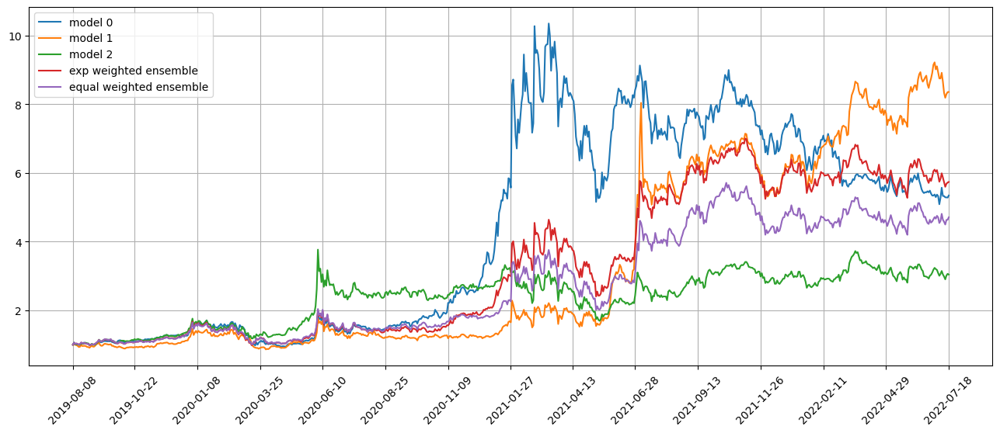

Standardization data are from 2020-12-10 to 2021-09-27
Training data are from 2021-09-28 to 2022-07-14
Testing data are from 2022-06-16 to 2022-08-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 38 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0845 - val_loss: 0.0894 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0843 - val_loss: 0.0894 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0842 - val_loss: 0.0895 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0841 - val_loss: 0.0895 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0838 - val_loss: 0.0906 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0836 - val_loss: 0.0910 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0791 - val_loss: 0.0907 - lr: 0.0012
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.08484223527470044
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.07309898635933662
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.08137672140638787
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.07348976019518062
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.08294566433629186
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.07268012707992516
Correlations between old and new weights
0.9982886247002429
0.265764538644038
0.9836913771680288
0.9448373786531485
0.9916253078411057
0.8368983049618536
Weight of model 0 is 0.23905204686725465
Weight of model 1 is 0.4490270578740938
Weight of model 2 is 0.31192089525865146
Testing data from 2022-06-16 to 2022-07

position on 2022-07-21 market open will be {'SIGA': 0.7863899193790207, 'GBIL': 0.4302066610625755, 'SCHO': 0.4302943875803763, 'VMBS': 0.43127466302840667, 'MBB': 0.43114587083594214, 'SPMB': 0.42995169861246313, 'FLOT': 0.4321195457631037, 'FLRN': 0.4322592315443303, 'DNN': 0.4316889828401123, 'ACN': 0.4335082322614223}
Total asset on 2022-07-21 will be 4.6688391929076865
It should be the same as 4.668839192907753
Testing data from 2022-06-22 to 2022-07-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-21 are ['HYLS', 'COKE', 'SCHO', 'ATRA', 'GBIL', 'BSV', 'KOLD', 'XENE', 'SPTI', 'SIGA']
position on 2022-07-22 market open will be {'SIGA': 0.7830219061839333, 'XENE': 0.5333434754572829, 'GBIL': 0.4999957971964276, 'KOLD': 0.41069543570937483, 'COKE': 0.5045906124254741, 'BSV': 0.5028768344137062, 'HYLS': 0.5042898695008021, 'SCHO': 0.5011137439904473, 'SPTI': 0.5052552383550152, 'ATRA': 0.4833289279742923}
Total asset on 2022-07-22 will be 5.228511841206711

Testing data from 2022-06-27 to 2022-07-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-07-26 are ['HYLS', 'VTNR', 'FLOT', 'KOLD', 'BTU', 'GBIL', 'XENE', 'FLRN', 'CEIX', 'SIGA']
position on 2022-07-27 market open will be {'SIGA': 0.9390689849669206, 'XENE': 0.5005035723780864, 'KOLD': 0.3522901438780373, 'FLOT': 0.4998079925891897, 'FLRN': 0.49773183864799575, 'CEIX': 0.5456408147362941, 'HYLS': 0.49786355231509266, 'GBIL': 0.5019682240764958, 'VTNR': 0.5158451127522976, 'BTU': 0.5028699397865493}
Total asset on 2022-07-27 will be 5.353590176126914
It should be the same as 5.35359017612696
top_stocks by model 1 to buy on 2022-07-26 are ['ORI', 'BIP', 'XENE', 'NUE', 'KW', 'IIPR', 'AMRC', 'UCO', 'SNAP', 'SIGA']
position on 2022-07-27 market open will be {'SIGA': 0.9102616701567302, 'UCO': 0.8717899308621974, 'XENE': 0.8372126198491325, 'AMRC': 0.8451775705054466, 'NUE': 0.8453895754830713, 'IIPR': 0.809858181309487, 'KW': 0.8403625449531023, 'ORI': 0.8394352929

top_stocks by model 0 to buy on 2022-07-29 are ['FLOT', 'BTU', 'OII', 'VMBS', 'SHW', 'GBIL', 'SPTI', 'XENE', 'FLRN', 'SIGA']
position on 2022-08-01 market open will be {'SIGA': 1.0371557262761482, 'XENE': 0.5047606290720141, 'FLRN': 0.49905208099943377, 'FLOT': 0.5074476277064274, 'BTU': 0.4408422279281179, 'VMBS': 0.4913864292029006, 'OII': 0.49388395181725236, 'SHW': 0.4861873033868693, 'GBIL': 0.4908467612797319, 'SPTI': 0.4926348069445145}
Total asset on 2022-08-01 will be 5.444197544613363
It should be the same as 5.44419754461341
top_stocks by model 1 to buy on 2022-07-29 are ['FLOT', 'SHW', 'XENE', 'SHY', 'TFLO', 'UCO', 'BTU', 'GSK', 'JNPR', 'SIGA']
position on 2022-08-01 market open will be {'SIGA': 1.0053394571922734, 'FLOT': 0.8732527007331065, 'SHY': 0.8709479281269061, 'GSK': 0.8577625424532507, 'TFLO': 0.8753802860637717, 'XENE': 0.8759916453508294, 'UCO': 0.7848255814595578, 'JNPR': 0.8729089248514189, 'SHW': 0.8662857509321514, 'BTU': 0.8094500671778733}
Total asset on 2

Testing data from 2022-07-06 to 2022-08-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-03 are ['ATRA', 'XENE', 'BSV', 'SHW', 'SHY', 'SPMB', 'VMBS', 'MBB', 'SIGA', 'GSK']
position on 2022-08-04 market open will be {'SIGA': 0.985325790203223, 'XENE': 0.5170755347294554, 'SHY': 0.4886740934371279, 'MBB': 0.4919035556909651, 'BSV': 0.48902111330199777, 'VMBS': 0.4926856085631829, 'GSK': 0.48671467178708666, 'SPMB': 0.4918398811444968, 'SHW': 0.4817850425074554, 'ATRA': 0.522212459050616}
Total asset on 2022-08-04 will be 5.44723775041556
It should be the same as 5.447237750415606
top_stocks by model 1 to buy on 2022-08-03 are ['CINF', 'CLF', 'ATRA', 'META', 'SHY', 'IGT', 'FCN', 'SIGA', 'AMX', 'GSK']
position on 2022-08-04 market open will be {'SIGA': 0.9550994802266627, 'SHY': 0.8475784778083529, 'IGT': 0.8558573980505596, 'META': 0.8760633504310935, 'CLF': 0.8513210160784493, 'GSK': 0.8441799681639279, 'CINF': 0.859898173451333, 'AMX': 0.8735041279862467, 'A

position on 2022-08-09 market open will be {'SIGA': 1.237230368590652, 'XENE': 0.6020638458346356, 'VTNR': 0.3442285244879916, 'GSK': 0.4850006973036104, 'BTU': 0.5135795544863205, 'MED': 0.5083904983233261, 'CEIX': 0.5248473969500852, 'ECPG': 0.5099114578281126, 'WES': 0.5256993496843179, 'MTDR': 0.5329680158706074}
Total asset on 2022-08-09 will be 5.783919709359614
It should be the same as 5.783919709359659
top_stocks by model 1 to buy on 2022-08-08 are ['OKE', 'DVN', 'EQC', 'VTLE', 'APA', 'CRK', 'WMB', 'ECPG', 'SIGA', 'GSK']
position on 2022-08-09 market open will be {'CRK': 0.9003514219542641, 'SIGA': 1.0110639366608143, 'DVN': 0.9510487299503467, 'VTLE': 0.8879839054761869, 'GSK': 0.8796529041103835, 'EQC': 0.8912767914552694, 'APA': 0.9255703953680535, 'OKE': 0.8992351276405384, 'WMB': 0.9024562012542091, 'ECPG': 0.8741302511479253}
Total asset on 2022-08-09 will be 9.122769665017966
It should be the same as 9.12276966501799
top_stocks by model 2 to buy on 2022-08-08 are ['PBA',

position on 2022-08-12 market open will be {'SIGA': 1.121279014127922, 'GSK': 0.7873342505900754, 'BTU': 0.9701149170385831, 'TFLO': 0.8821343338193054, 'SHV': 0.8817696625251175, 'VTNR': 0.8101275246486109, 'MWA': 0.8905295334861917, 'KOS': 0.904142504143954, 'ISTB': 0.8799456137910309, 'SEM': 0.8735063737209791}
Total asset on 2022-08-12 will be 9.000883727891745
It should be the same as 9.00088372789177
top_stocks by model 2 to buy on 2022-08-11 are ['TM', 'PUMP', 'SAP', 'TSE', 'MWA', 'MHK', 'STIP', 'TRP', 'VTNR', 'ISTB']
position on 2022-08-12 market open will be {'TRP': 0.3478933381810243, 'VTNR': 0.3136991353521025, 'MHK': 0.34208437055340213, 'MWA': 0.3448325555674706, 'STIP': 0.34131096917534376, 'PUMP': 0.34849878101794324, 'SAP': 0.33896515417200757, 'ISTB': 0.34073422986443, 'TSE': 0.3419326749062482, 'TM': 0.34389239996005067}
Total asset on 2022-08-12 will be 3.4038436087499773
It should be the same as 3.403843608750023
top_stocks by return weighted ensemble to buy on 2022

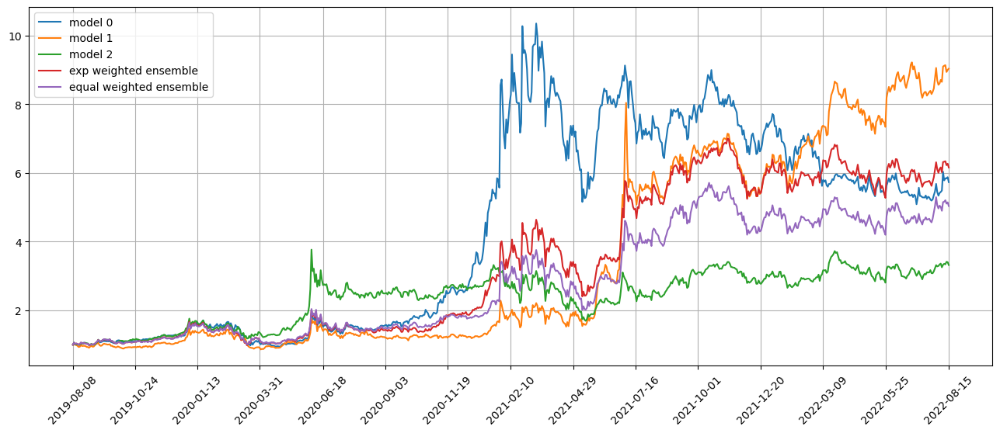

Standardization data are from 2021-01-11 to 2021-10-25
Training data are from 2021-10-26 to 2022-08-11
Testing data are from 2022-07-18 to 2022-09-09
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 39 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0889 - val_loss: 0.0781 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0886 - val_loss: 0.0778 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0884 - val_loss: 0.0792 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0882 - val_loss: 0.0807 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0878 - val_loss: 0.0786 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0875 - val_loss: 0.0797 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0829 - val_loss: 0.0806 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.08617419812078464
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.07031990847951897
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.08227347094980503
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.07107418815538952
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.08426951309385851
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.07012198962046846
Correlations between old and new weights
0.9974497944824888
-0.4335675939098268
0.9754752430686997
0.819729075695408
0.9933358312890391
0.7656987701597493
Weight of model 0 is 0.2493160766803167
Weight of model 1 is 0.407661728236786
Weight of model 2 is 0.3430221950828973
Testing data from 2022-07-18 to 2022-08-1

position on 2022-08-18 market open will be {'SIGA': 0.6322095969581955, 'DNN': 0.45047819355131963, 'USFR': 0.48777048305927656, 'FLOT': 0.48320838180328496, 'VTNR': 0.4934891119446169, 'UCO': 0.5057640835818609, 'PUMP': 0.5027143756856153, 'KRYS': 0.47895802413348726, 'SUN': 0.4875532031357316, 'ISTB': 0.48218029339767055}
Total asset on 2022-08-18 will be 5.0043257472509906
It should be the same as 5.004325747251059
Testing data from 2022-07-21 to 2022-08-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-08-18 are ['GSK', 'KRYS', 'FTNT', 'SIGA', 'KOLD', 'TRP', 'SEM', 'SNY', 'MWA', 'ISTB']
position on 2022-08-19 market open will be {'KRYS': 0.5770010783987641, 'SIGA': 0.5043357437873368, 'TRP': 0.5792857228365695, 'ISTB': 0.5874171085422482, 'FTNT': 0.6020113195381992, 'MWA': 0.6048299641242058, 'GSK': 0.5989164300786852, 'SNY': 0.5966145953597346, 'SEM': 0.6096984534463827, 'KOLD': 0.6213719676579789}
Total asset on 2022-08-19 will be 5.881482383770058
It sho

position on 2022-08-24 market open will be {'KRYS': 0.5615214521562357, 'VTNR': 0.6021172619050105, 'TRP': 0.5895571563542027, 'UCO': 0.598045402190934, 'PUMP': 0.6002667339887866, 'CARG': 0.6032169379587216, 'SUN': 0.5866817641712642, 'TDW': 0.5972662141366715, 'ISTB': 0.5838521663796528, 'TS': 0.5945814819153408}
Total asset on 2022-08-24 will be 5.917106571156771
It should be the same as 5.91710657115682
top_stocks by model 1 to buy on 2022-08-23 are ['SPTS', 'LNTH', 'UCO', 'SHY', 'SCHO', 'KRYS', 'USFR', 'SHV', 'SIGA', 'ISTB']
position on 2022-08-24 market open will be {'SIGA': 0.9682530984731803, 'USFR': 0.8805578747134554, 'KRYS': 0.8952232108192123, 'ISTB': 0.8681768922280023, 'SCHO': 0.8753082700813446, 'UCO': 0.9706698318399262, 'SHV': 0.8742581162525265, 'SPTS': 0.8738807388988384, 'SHY': 0.8740726326435749, 'LNTH': 0.8769937582874696}
Total asset on 2022-08-24 will be 8.95739442423751
It should be the same as 8.95739442423753
top_stocks by model 2 to buy on 2022-08-23 are ['V

position on 2022-08-29 market open will be {'KRYS': 0.510387337181513, 'ISTB': 0.582864864730535, 'VTNR': 0.640545061207225, 'MBB': 0.596650157348421, 'GDOT': 0.5868341623801305, 'VMBS': 0.5994020028978426, 'CRK': 0.599869978094571, 'SIGA': 0.534121693550668, 'SPMB': 0.6007995320973731, 'RYTM': 0.606243848257446}
Total asset on 2022-08-29 will be 5.857718637745674
It should be the same as 5.857718637745725
top_stocks by model 1 to buy on 2022-08-26 are ['KRYS', 'USO', 'MBB', 'MCHI', 'TDC', 'USFR', 'BNO', 'UCO', 'SIGA', 'ISTB']
position on 2022-08-29 market open will be {'SIGA': 0.7045567041708062, 'USFR': 0.8784596617835968, 'KRYS': 0.8137010420502562, 'MBB': 0.8914938246282393, 'USO': 0.9096581442097824, 'UCO': 0.9234644235521665, 'BNO': 0.9120202873912487, 'ISTB': 0.8885995291807547, 'TDC': 0.8471587818812596, 'MCHI': 0.8645756412424316}
Total asset on 2022-08-29 will be 8.633688040090524
It should be the same as 8.633688040090542
top_stocks by model 2 to buy on 2022-08-26 are ['BBVA

top_stocks by model 0 to buy on 2022-08-31 are ['SMTC', 'CEIX', 'EVTC', 'MBB', 'PFF', 'CCOI', 'SNY', 'PFFD', 'KRYS', 'SIGA']
position on 2022-09-01 market open will be {'KRYS': 0.5125882536599471, 'SIGA': 0.514096448808469, 'MBB': 0.597321508072487, 'SNY': 0.5921574824395848, 'PFF': 0.5935207432146838, 'PFFD': 0.5971687421994056, 'EVTC': 0.601634274738221, 'SMTC': 0.45193370837242913, 'CEIX': 0.6095596140101258, 'CCOI': 0.6008976390352472}
Total asset on 2022-09-01 will be 5.670878414550548
It should be the same as 5.670878414550602
top_stocks by model 1 to buy on 2022-08-31 are ['ANF', 'IART', 'BYON', 'KRYS', 'GDS', 'MBB', 'SHOO', 'BURL', 'SIGA', 'ISTB']
position on 2022-09-01 market open will be {'SIGA': 0.6781415246225164, 'KRYS': 0.817209922270242, 'ISTB': 0.8846485427441804, 'MBB': 0.8653270681117439, 'BURL': 0.868389024795156, 'IART': 0.8665818500018697, 'SHOO': 0.8204115627505744, 'BYON': 0.8422561871206561, 'ANF': 0.8351563931917243, 'GDS': 0.8362127405341714}
Total asset on 20

position on 2022-09-07 market open will be {'SIGA': 0.6107372419094539, 'USFR': 0.8480994093052475, 'HBI': 0.8347648844497475, 'WWW': 0.8414183620357069, 'IFF': 0.8569134421653424, 'LPX': 0.8461495913954623, 'PKX': 0.8341762991208197, 'KRYS': 0.7779607516934101, 'RH': 0.8096836592255844, 'ARCH': 0.7944523123738738}
Total asset on 2022-09-07 will be 8.054355953674637
It should be the same as 8.054355953674648
top_stocks by model 2 to buy on 2022-09-06 are ['INTU', 'MLKN', 'MHK', 'HBI', 'RH', 'PKX', 'NEOG', 'MDB', 'SIGA', 'SMTC']
position on 2022-09-07 market open will be {'SIGA': 0.2837506770683896, 'SMTC': 0.3176628206018652, 'RH': 0.30465678809502805, 'MLKN': 0.31075075971139593, 'HBI': 0.3085005123387117, 'MHK': 0.3055574330474824, 'PKX': 0.30828299135895826, 'NEOG': 0.30283311625667586, 'MDB': 0.3075633604417845, 'INTU': 0.3145344442937453}
Total asset on 2022-09-07 will be 3.0640929032139907
It should be the same as 3.064092903214037
top_stocks by return weighted ensemble to buy on

position on 2022-09-12 market open will be {'SIGA': 0.29560008050111863, 'SMTC': 0.3258025301280788, 'UCO': 0.349547581112569, 'BNO': 0.33282892541271775, 'TRP': 0.3252567866392259, 'SQM': 0.31851444195892725, 'PARR': 0.3253191876241642, 'GBIL': 0.3196087987171018, 'HEDJ': 0.3260674635257007, 'BTU': 0.32708339521653407}
Total asset on 2022-09-12 will be 3.2456291908360915
It should be the same as 3.245629190836138
top_stocks by return weighted ensemble to buy on 2022-09-09 are ['UCO', 'AM', 'BNO', 'LYB', 'TRP', 'RH', 'SQM', 'BTU', 'A', 'SIGA']
position on 2022-09-12 market open will be {'SIGA': 0.4462624645732295, 'UCO': 0.6562428387681186, 'BNO': 0.6248551288548182, 'TRP': 0.611156177702705, 'SQM': 0.5984873395021478, 'RH': 0.6195826972857776, 'AM': 0.61976100927221, 'LYB': 0.6104729198938965, 'A': 0.6073890828627442, 'BTU': 0.6145883677818159}
Total asset on 2022-09-12 will be 6.008798026497397
It should be the same as 6.008798026497463
top_stocks by equal weighted ensemble to buy on

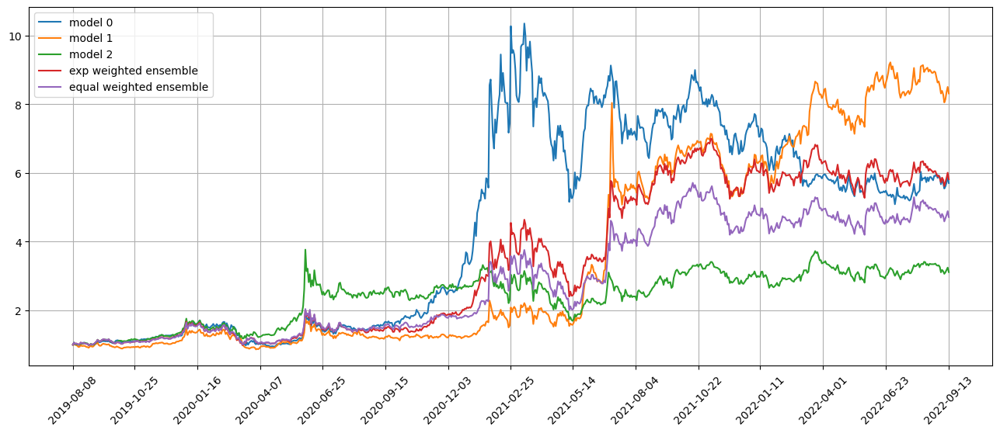

Standardization data are from 2021-02-09 to 2021-11-22
Training data are from 2021-11-23 to 2022-09-09
Testing data are from 2022-08-15 to 2022-10-07
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 40 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0888 - val_loss: 0.0737 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0885 - val_loss: 0.0731 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0882 - val_loss: 0.0719 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0881 - val_loss: 0.0725 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0876 - val_loss: 0.0747 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0873 - val_loss: 0.0734 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0822 - val_loss: 0.0731 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0821 - val_loss: 0.0732 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0823 - val_loss: 0.0732 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0821 - val_loss: 0.0733 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0821 - val_loss: 0.0732 - lr: 0.0012
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.08463198836723805
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.06964373452832351
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.08125910800006249
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.06718638028414947
96/96 [==============================] - 

top_stocks by model 2 to buy on 2022-09-15 are ['ENLC', 'OII', 'BLKB', 'WMB', 'RCI', 'GDS', 'MT', 'AEO', 'VOD', 'VRNT']
position on 2022-09-16 market open will be {'VRNT': 0.2970297766496884, 'MT': 0.30249479960757103, 'WMB': 0.3002882913801264, 'OII': 0.3016787547656007, 'VOD': 0.2985302146198967, 'AEO': 0.3016198347547554, 'BLKB': 0.2978571132908663, 'ENLC': 0.2997328860271397, 'GDS': 0.29711170828294703, 'RCI': 0.30700278862047553}
Total asset on 2022-09-16 will be 3.0033461679990214
It should be the same as 3.003346167999067
top_stocks by return weighted ensemble to buy on 2022-09-15 are ['TPH', 'CLB', 'GIII', 'MT', 'VOD', 'BLKB', 'GDS', 'OII', 'AEO', 'VRNT']
position on 2022-09-16 market open will be {'GDS': 0.5757466423122672, 'VRNT': 0.5544863940285136, 'MT': 0.5664825147780056, 'TPH': 0.5546807001533572, 'OII': 0.5649543062440053, 'CLB': 0.5593143299485231, 'VOD': 0.5590580298718768, 'AEO': 0.5648439666416133, 'BLKB': 0.5577975118925124, 'GIII': 0.5710947785713143}
Total asset 

position on 2022-09-21 market open will be {'BZUN': 0.5427908503021694, 'WELL': 0.5417186809145156, 'VYX': 0.5328934179311533, 'TRP': 0.547002018977548, 'VRNT': 0.5395217739342675, 'BLKB': 0.5365805131628252, 'SONY': 0.5409142152781304, 'CQQQ': 0.5353373230170152, 'PR': 0.5363645693282194, 'GDS': 0.5428185839303691}
Total asset on 2022-09-21 will be 5.395941946776143
It should be the same as 5.395941946776213
top_stocks by equal weighted ensemble to buy on 2022-09-20 are ['WELL', 'PR', 'SONY', 'VYX', 'BZUN', 'CQQQ', 'TRP', 'BLKB', 'GDS', 'VRNT']
position on 2022-09-21 market open will be {'BZUN': 0.44019734055393256, 'WELL': 0.4393278231094034, 'VYX': 0.43217063301896164, 'TRP': 0.4436125514965888, 'VRNT': 0.4375461559910073, 'BLKB': 0.4351608262295647, 'SONY': 0.4386754104287058, 'CQQQ': 0.43415261285293216, 'PR': 0.43498569818227073, 'GDS': 0.4402198322178406}
Total asset on 2022-09-21 will be 4.37604888408114
It should be the same as 4.376048884081207
Testing data from 2022-08-23 to

Testing data from 2022-08-26 to 2022-09-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-09-26 are ['EQNR', 'TRP', 'BNO', 'NEOG', 'OKE', 'HESM', 'PBA', 'VRNT', 'USFR', 'SIGA']
position on 2022-09-27 market open will be {'SIGA': 0.35216813692968013, 'USFR': 0.5859719056235733, 'NEOG': 0.5551386435482004, 'TRP': 0.5233427442704134, 'PBA': 0.532870485691825, 'OKE': 0.5300070403812439, 'VRNT': 0.5286390946187525, 'BNO': 0.533006061043854, 'HESM': 0.5322720091073001, 'EQNR': 0.5473336742953315}
Total asset on 2022-09-27 will be 5.220749795510121
It should be the same as 5.220749795510174
top_stocks by model 1 to buy on 2022-09-26 are ['MHK', 'WELL', 'PCH', 'XELA', 'BAND', 'FOXF', 'ORCL', 'BGNE', 'GDS', 'META']
position on 2022-09-27 market open will be {'META': 0.718093514005738, 'WELL': 0.7296958804926361, 'BGNE': 0.7401295276172356, 'BAND': 0.751276182387266, 'MHK': 0.7196643385735976, 'ORCL': 0.7279868764526013, 'PCH': 0.7249912711144885, 'FOXF': 0.7281591910236

top_stocks by model 0 to buy on 2022-09-29 are ['NFG', 'IFF', 'HPP', 'CIM', 'KRYS', 'RRC', 'INVH', 'NLY', 'NEOG', 'SIGA']
position on 2022-09-30 market open will be {'SIGA': 0.35389445794404234, 'NEOG': 0.5491045337215025, 'KRYS': 0.5416269710465047, 'HPP': 0.5414951846633502, 'INVH': 0.5443241183689806, 'IFF': 0.5343975977930099, 'CIM': 0.5009443666063578, 'RRC': 0.5397080840882721, 'NFG': 0.5442183012156158, 'NLY': 0.5241027426021092}
Total asset on 2022-09-30 will be 5.173816358049695
It should be the same as 5.173816358049745
top_stocks by model 1 to buy on 2022-09-29 are ['APPS', 'QTWO', 'WK', 'EGHT', 'W', 'SHOP', 'ALGN', 'CZR', 'TWLO', 'SQ']
position on 2022-09-30 market open will be {'TWLO': 0.7234378113732499, 'SQ': 0.7324622039412817, 'APPS': 0.7088211648379628, 'SHOP': 0.6895338649404922, 'EGHT': 0.701705702572556, 'W': 0.6761430270906187, 'WK': 0.734446104361499, 'ALGN': 0.7338408468847996, 'QTWO': 0.7293913495186495, 'CZR': 0.6797657633324219}
Total asset on 2022-09-30 will

top_stocks by model 1 to buy on 2022-10-04 are ['BGNE', 'SE', 'SWKS', 'CYH', 'MTSI', 'HUBS', 'UPBD', 'W', 'SHOP', 'CVNA']
position on 2022-10-05 market open will be {'SHOP': 0.7923785175052851, 'BGNE': 0.7608059716073481, 'W': 0.7332409658925256, 'MTSI': 0.744674752376992, 'CYH': 0.7830313159282628, 'HUBS': 0.7302272237251115, 'SWKS': 0.7491015275330603, 'SE': 0.7767076565373018, 'UPBD': 0.783564665275519, 'CVNA': 0.7090070858312055}
Total asset on 2022-10-05 will be 7.562739682212597
It should be the same as 7.562739682212613
top_stocks by model 2 to buy on 2022-10-04 are ['WW', 'AVGO', 'UPBD', 'ALGT', 'CRM', 'CZR', 'ASML', 'HUBS', 'SHOP', 'CVNA']
position on 2022-10-05 market open will be {'ALGT': 0.28311776801098143, 'WW': 0.27452867598737607, 'CRM': 0.27543351673065253, 'AVGO': 0.2769018847285051, 'ASML': 0.2719870258667756, 'HUBS': 0.27187509489204653, 'CZR': 0.28355798447884784, 'SHOP': 0.28717889843159794, 'UPBD': 0.2917334643305912, 'CVNA': 0.2639745033828757}
Total asset on 20

position on 2022-10-10 market open will be {'PZZA': 0.26122394144104144, 'SONY': 0.2626497374949415, 'TRP': 0.27209462023962694, 'NKE': 0.26492938216210915, 'CACI': 0.2664487996872426, 'MAIN': 0.2664871084418835, 'VFC': 0.2594990586546136, 'KMX': 0.25987105476767103, 'BNO': 0.2738436921106369, 'SMG': 0.24652528276457708}
Total asset on 2022-10-10 will be 2.6335726777642976
It should be the same as 2.633572677764344
top_stocks by return weighted ensemble to buy on 2022-10-07 are ['MAIN', 'UA', 'TRP', 'GDS', 'PZZA', 'UAA', 'UPBD', 'KMX', 'VFC', 'NKE']
position on 2022-10-10 market open will be {'GDS': 0.4347476398105906, 'PZZA': 0.4891861709131628, 'TRP': 0.5095433621697198, 'NKE': 0.49612523763072836, 'MAIN': 0.49904234450052726, 'VFC': 0.48595603511124547, 'KMX': 0.48665266097615384, 'UPBD': 0.48233348396707465, 'UAA': 0.5012377445459685, 'UA': 0.49505158795901294}
Total asset on 2022-10-10 will be 4.8798762675841125
It should be the same as 4.879876267584184
top_stocks by equal weight

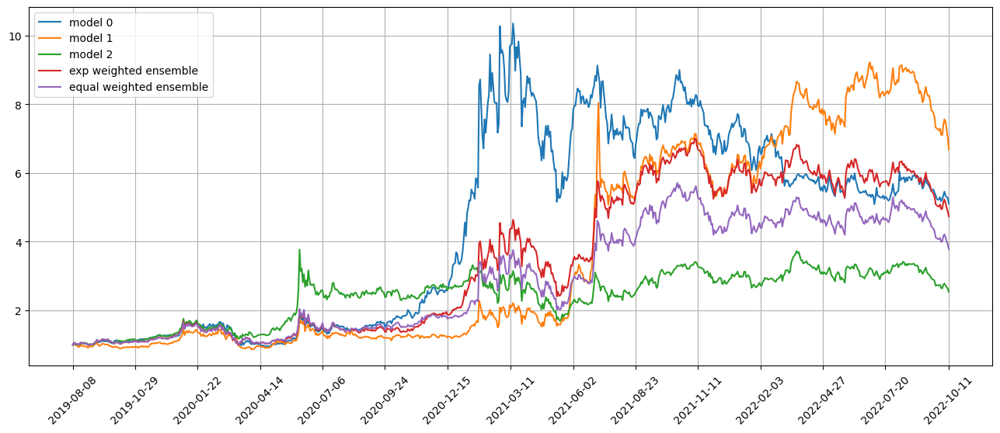

Standardization data are from 2021-03-10 to 2021-12-21
Training data are from 2021-12-22 to 2022-10-07
Testing data are from 2022-09-13 to 2022-11-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 41 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0900 - val_loss: 0.0722 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0900 - val_loss: 0.0717 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0896 - val_loss: 0.0719 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0893 - val_loss: 0.0716 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0891 - val_loss: 0.0710 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0890 - val_loss: 0.0708 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0861 - val_loss: 0.0709 - lr: 0.0100
Epoch 8/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0858 - val_loss: 0.0712 - lr: 0.0100
Epoch 9/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0857 - val_loss: 0.0716 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0855 - val_loss: 0.0709 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0853 - val_loss: 0.0717 - lr: 0.0100
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0848 - val_loss: 0.0704 - lr: 0.0050
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0844 - val_loss: 0.0705 - lr: 0.0050
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0843 - val_loss: 0.0708 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0844 - val_loss: 

Testing data from 2022-09-15 to 2022-10-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-10-13 are ['OLED', 'INO', 'TSLA', 'CABO', 'CVNA', 'APPS', 'NEOG', 'BZUN', 'ERJ', 'GDS']
position on 2022-10-14 market open will be {'ERJ': 0.5115815471423742, 'BZUN': 0.5277808150048282, 'INO': 0.5491981837952022, 'CABO': 0.5471240720077422, 'NEOG': 0.5113889718498773, 'TSLA': 0.5359950259524123, 'APPS': 0.5512605382105562, 'OLED': 0.5383082347138765, 'GDS': 0.5290060305562987, 'CVNA': 0.5458323807510069}
Total asset on 2022-10-14 will be 5.347475799984124
It should be the same as 5.347475799984174
top_stocks by model 1 to buy on 2022-10-13 are ['W', 'OLED', 'EHTH', 'BZUN', 'TMF', 'APPS', 'TSLA', 'GDS', 'INO', 'IDEX']
position on 2022-10-14 market open will be {'IDEX': 0.629960020227519, 'EHTH': 0.6872656364287076, 'BZUN': 0.6967089848305296, 'W': 0.692106516653861, 'INO': 0.7249814662157159, 'TMF': 0.692468225178079, 'TSLA': 0.7075523395106779, 'APPS': 0.7277039237401883,

top_stocks by model 0 to buy on 2022-10-18 are ['ROP', 'ALLE', 'GDS', 'VMC', 'ZROZ', 'OMI', 'LAD', 'GWRE', 'NEOG', 'GNRC']
position on 2022-10-19 market open will be {'NEOG': 0.49854632004481236, 'GNRC': 0.4381269100204749, 'VMC': 0.5396695558064473, 'OMI': 0.5350059231535902, 'ROP': 0.5248161482417866, 'ZROZ': 0.5333826324668844, 'LAD': 0.5272299752627086, 'ALLE': 0.5297600130876261, 'GWRE': 0.5317700358871795, 'GDS': 0.5063553547423799}
Total asset on 2022-10-19 will be 5.1646628687138385
It should be the same as 5.164662868713889
top_stocks by model 1 to buy on 2022-10-18 are ['ROP', 'OMI', 'TMF', 'NEOG', 'NEO', 'ADBE', 'GDS', 'LAD', 'RDFN', 'ANGI']
position on 2022-10-19 market open will be {'RDFN': 0.6861334784277047, 'GDS': 0.675770906547743, 'ADBE': 0.6905884072720324, 'OMI': 0.7021613216724949, 'ROP': 0.6887878887627378, 'NEO': 0.661162378156523, 'TMF': 0.6897054396419813, 'NEOG': 0.6574854144471357, 'LAD': 0.6919558835417654, 'ANGI': 0.6719026299747094}
Total asset on 2022-10-

top_stocks by model 1 to buy on 2022-10-21 are ['ANGI', 'NTES', 'KRNT', 'KWEB', 'GDS', 'AMC', 'CNK', 'SE', 'JD', 'RDFN']
position on 2022-10-24 market open will be {'GDS': 0.5380632247206681, 'SE': 0.6341944126974732, 'JD': 0.5666377782032721, 'KRNT': 0.6880008993404241, 'KWEB': 0.5820972410396743, 'NTES': 0.5996680247655098, 'RDFN': 0.6731553970793895, 'ANGI': 0.6394827184632502, 'CNK': 0.6955265171699856, 'AMC': 0.6661240613892426}
Total asset on 2022-10-24 will be 6.282950274868879
It should be the same as 6.282950274868889
top_stocks by model 2 to buy on 2022-10-21 are ['BIDU', 'RUN', 'NTES', 'CNK', 'SE', 'GRPN', 'CQQQ', 'FIVN', 'RDFN', 'JD']
position on 2022-10-24 market open will be {'FIVN': 0.2554621070679859, 'JD': 0.21976099890864262, 'GRPN': 0.2550647461149675, 'NTES': 0.23257122840257546, 'BIDU': 0.21954151750038714, 'RUN': 0.25811762749177974, 'CQQQ': 0.23423814321071887, 'SE': 0.2459617113398315, 'RDFN': 0.261072078448398, 'CNK': 0.26974834375743456}
Total asset on 2022-10

top_stocks by model 2 to buy on 2022-10-26 are ['MCHI', 'ZLAB', 'BZUN', 'CARG', 'HASI', 'ACMR', 'GDS', 'WW', 'BABA', 'CVNA']
position on 2022-10-27 market open will be {'BZUN': 0.25287663646872943, 'CARG': 0.2630933534481162, 'HASI': 0.2768919136479516, 'WW': 0.26721036709887597, 'BABA': 0.26655250230721095, 'ZLAB': 0.271543327406364, 'MCHI': 0.26086043752621757, 'GDS': 0.259540597368044, 'ACMR': 0.26545387802086956, 'CVNA': 0.26297267642311367}
Total asset on 2022-10-27 will be 2.646995689715448
It should be the same as 2.6469956897154927
top_stocks by return weighted ensemble to buy on 2022-10-26 are ['MODG', 'GDS', 'PII', 'CARG', 'BOOT', 'RUN', 'BABA', 'WW', 'HASI', 'CVNA']
position on 2022-10-27 market open will be {'CARG': 0.4950140954152522, 'GDS': 0.46903983765544444, 'HASI': 0.5252693696348704, 'WW': 0.5069032866896335, 'BOOT': 0.4982556926304066, 'MODG': 0.5018704479522443, 'BABA': 0.5056553043275982, 'PII': 0.5038855482664054, 'RUN': 0.49851336968147547, 'CVNA': 0.49886430468

position on 2022-11-01 market open will be {'LAD': 0.2720503119018123, 'GDS': 0.2580669421200172, 'VIPS': 0.3110154540386449, 'JD': 0.29892284197967756, 'BZUN': 0.2956309068974878, 'HELE': 0.28330663105426995, 'SNAP': 0.28275414477146454, 'BIDU': 0.29261308210583337, 'CQQQ': 0.29776720110400035, 'CVNA': 0.2908440806320354}
Total asset on 2022-11-01 will be 2.8829715966051985
It should be the same as 2.882971596605244
top_stocks by return weighted ensemble to buy on 2022-10-31 are ['HTHT', 'JD', 'SE', 'FXI', 'CVNA', 'NTES', 'LAD', 'BIDU', 'BZUN', 'GDS']
position on 2022-11-01 market open will be {'GDS': 0.3770416828591183, 'LAD': 0.5174783499725073, 'SE': 0.5573072571205767, 'JD': 0.5737111447475993, 'BZUN': 0.5673930600139935, 'FXI': 0.5639145519278503, 'NTES': 0.5746194748721102, 'BIDU': 0.5616010646468899, 'HTHT': 0.5902887416710162, 'CVNA': 0.5582058879722956}
Total asset on 2022-11-01 will be 5.441561215803892
It should be the same as 5.441561215803957
top_stocks by equal weighted 

position on 2022-11-04 market open will be {'META': 0.41888528313615003, 'BOOT': 0.44421273135667927, 'WST': 0.42538977158316044, 'ROG': 0.39674597069674156, 'GOOGL': 0.42264294700112937, 'GOOG': 0.4230648023680105, 'MANH': 0.42666086066135683, 'ENTA': 0.4172612093515943, 'WOLF': 0.4627550500167327, 'SNBR': 0.43317675056964167}
Total asset on 2022-11-04 will be 4.270795376741129
It should be the same as 4.270795376741196
Testing data from 2022-10-07 to 2022-11-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-04 are ['CCK', 'MHK', 'BBWI', 'FORM', 'EW', 'CVNA', 'SE', 'HBI', 'BZUN', 'GDS']
position on 2022-11-07 market open will be {'FORM': 0.5831469027257893, 'HBI': 0.601129450609894, 'BZUN': 0.5748976717722919, 'MHK': 0.5974770987575022, 'BBWI': 0.562140515274307, 'CCK': 0.5929729666962609, 'GDS': 0.6083097266320266, 'EW': 0.5787352730846953, 'SE': 0.5579529710599628, 'CVNA': 0.3939060925445495}
Total asset on 2022-11-07 will be 5.650668669157227
It should b

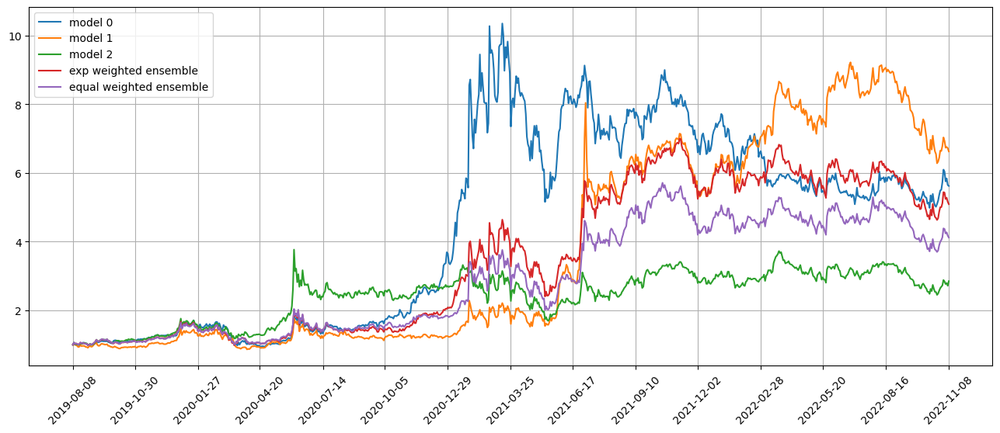

Standardization data are from 2021-04-08 to 2022-01-20
Training data are from 2022-01-21 to 2022-11-04
Testing data are from 2022-10-11 to 2022-12-05
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 42 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0854 - val_loss: 0.0933 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0850 - val_loss: 0.0934 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0850 - val_loss: 0.0931 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0845 - val_loss: 0.0931 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0843 - val_loss: 0.0942 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0842 - val_loss: 0.0928 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0799 - val_loss: 0.0932 - lr: 0.0010
Epoch 41/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0801 - val_loss: 0.0937 - lr: 0.0010
Epoch 41: early stopping
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0842 - val_loss: 0.0932 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0836 - val_loss: 0.0936 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0836 - val_loss: 0.0938 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0835 - val_loss: 0.0945 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0836 - val_loss: 0.0933 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0834 - val_loss: 0.0934 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 7ms/step - loss:

position on 2022-11-10 market open will be {'SIGA': 0.5314354298677011, 'FNKO': 0.5733458029452846, 'RPD': 0.5640363929677291, 'INSG': 0.5652844750547634, 'ROG': 0.5778837568971645, 'CDNA': 0.5495027911916793, 'PLUG': 0.5717969937706329, 'HRTX': 0.5442670221492288, 'RGNX': 0.5793462072559958, 'CYH': 0.5481789377711755}
Total asset on 2022-11-10 will be 5.605077809871301
It should be the same as 5.605077809871355
top_stocks by model 1 to buy on 2022-11-09 are ['EDIT', 'HRTX', 'GRPN', 'TGTX', 'CDNA', 'RPD', 'ROG', 'PLUG', 'RDFN', 'INSG']
position on 2022-11-10 market open will be {'RPD': 0.6616758377840233, 'ROG': 0.677920296906422, 'INSG': 0.6631399733803393, 'CDNA': 0.6446263472704966, 'PLUG': 0.6707798638752307, 'HRTX': 0.638484222558687, 'GRPN': 0.6696093773146778, 'RDFN': 0.7301660084474019, 'TGTX': 0.6979430361657074, 'EDIT': 0.6769087866578652}
Total asset on 2022-11-10 will be 6.73125375036084
It should be the same as 6.7312537503608505
top_stocks by model 2 to buy on 2022-11-09 

Testing data from 2022-10-17 to 2022-11-11 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-11-14 are ['VUZI', 'AMBA', 'VCEL', 'SSYS', 'MRVL', 'SIGA', 'ANET', 'CHRS', 'SENS', 'ZLAB']
position on 2022-11-15 market open will be {'SIGA': 0.5847566862686031, 'SSYS': 0.614581420308498, 'MRVL': 0.6493881834694577, 'SENS': 0.636586241493307, 'VUZI': 0.591596376671718, 'VCEL': 0.613855900825679, 'ZLAB': 0.5956400791225618, 'AMBA': 0.64462102463565, 'CHRS': 0.6519223899899165, 'ANET': 0.6348425924563158}
Total asset on 2022-11-15 will be 6.217790895241651
It should be the same as 6.2177908952417065
top_stocks by model 1 to buy on 2022-11-14 are ['LITE', 'BBD', 'ANET', 'MRVL', 'GBTC', 'SSYS', 'AMBA', 'CHRS', 'ZLAB', 'SENS']
position on 2022-11-15 market open will be {'BBD': 0.7670185076410052, 'MRVL': 0.8031190573638842, 'SSYS': 0.7600724243463731, 'GBTC': 0.8174711440238219, 'SENS': 0.7872864878253027, 'CHRS': 0.8062531913128614, 'ZLAB': 0.7366470641909365, 'AMBA': 0.7972

top_stocks by model 1 to buy on 2022-11-17 are ['ACMR', 'DQ', 'CQQQ', 'MOMO', 'TCOM', 'WWW', 'BBD', 'EHTH', 'BZUN', 'GDS']
position on 2022-11-18 market open will be {'DQ': 0.7454356072374159, 'BBD': 0.767743129173021, 'MOMO': 0.7758733094612037, 'EHTH': 0.7553720365098738, 'BZUN': 0.8277822276202896, 'WWW': 0.7268877148489641, 'CQQQ': 0.7526500437999768, 'GDS': 0.7988059068994537, 'ACMR': 0.7974605016920403, 'TCOM': 0.7286081514254891}
Total asset on 2022-11-18 will be 7.676618628667716
It should be the same as 7.676618628667728
top_stocks by model 2 to buy on 2022-11-17 are ['ACMR', 'CQQQ', 'BZUN', 'BRZU', 'MOMO', 'TCOM', 'WWW', 'DQ', 'GDS', 'BBD']
position on 2022-11-18 market open will be {'DQ': 0.31144936535704365, 'BBD': 0.32076963860677554, 'BZUN': 0.3458544868840263, 'MOMO': 0.3241664973916369, 'WWW': 0.3036998974526292, 'BRZU': 0.33323332711635356, 'CQQQ': 0.314463618589654, 'GDS': 0.33374793252672663, 'ACMR': 0.33318581073655634, 'TCOM': 0.3044187105529069}
Total asset on 202

position on 2022-11-23 market open will be {'WST': 0.7521313456061498, 'ALGN': 0.737266860385536, 'PLUG': 0.7453089208130054, 'CARG': 0.7543512638021018, 'SNBR': 0.736006816884395, 'AMED': 0.749752733892395, 'FIVN': 0.7817362065152033, 'SE': 0.7538450711253977, 'XELA': 0.6860893453631225, 'CVNA': 0.7699555335670848}
Total asset on 2022-11-23 will be 7.466444097954377
It should be the same as 7.466444097954392
top_stocks by model 2 to buy on 2022-11-22 are ['INTU', 'FATE', 'BPMC', 'MELI', 'FIVN', 'CVNA', 'SNBR', 'ALGN', 'WST', 'AMED']
position on 2022-11-23 market open will be {'CVNA': 0.2950899748794725, 'WST': 0.31673173178629427, 'MELI': 0.31333641087933045, 'ALGN': 0.3104721148011219, 'BPMC': 0.31448884798343746, 'FATE': 0.3131354069391888, 'AMED': 0.31573006922862284, 'FIVN': 0.32919870171088905, 'INTU': 0.3199393761334639, 'SNBR': 0.3099414950329472}
Total asset on 2022-11-23 will be 3.1380641293747207
It should be the same as 3.1380641293747686
top_stocks by return weighted ensem

position on 2022-11-29 market open will be {'CVNA': 0.596588233025352, 'SIGA': 0.5621483145566862, 'PBR-A': 0.6022030318726145, 'INSG': 0.5380737114790662, 'FIVN': 0.576736653388956, 'SIMO': 0.5606582923621194, 'OPK': 0.547841876266003, 'ANGI': 0.587644341042841, 'XELA': 0.5894023655530867, 'CHRS': 0.5539731090627731}
Total asset on 2022-11-29 will be 5.715269928609431
It should be the same as 5.715269928609499
top_stocks by equal weighted ensemble to buy on 2022-11-28 are ['FIVN', 'INSG', 'SIMO', 'OPK', 'SIGA', 'XELA', 'PBR-A', 'CHRS', 'CVNA', 'ANGI']
position on 2022-11-29 market open will be {'CVNA': 0.4827198754503592, 'SIGA': 0.4548533634519431, 'PBR-A': 0.48726300059127065, 'INSG': 0.43537378146251465, 'FIVN': 0.4666572856788866, 'SIMO': 0.45364773570341693, 'OPK': 0.44327753656243857, 'ANGI': 0.47548306757376857, 'XELA': 0.47690554513139827, 'CHRS': 0.4482385260157593}
Total asset on 2022-11-29 will be 4.624419717621688
It should be the same as 4.624419717621755
Testing data fro

position on 2022-12-02 market open will be {'HBI': 0.4946893436969614, 'CVNA': 0.500016757698865, 'SIGA': 0.486931782974221, 'CDNA': 0.5019220596988426, 'VXRT': 0.4837661499708547, 'VCEL': 0.4946531138965977, 'TSLA': 0.4828271110965579, 'OPK': 0.4697080100455258, 'SE': 0.5072915033839916, 'PLCE': 0.46130291509220084}
Total asset on 2022-12-02 will be 4.883108747554549
It should be the same as 4.883108747554619
Testing data from 2022-11-03 to 2022-12-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-02 are ['AAOI', 'GLPG', 'SIMO', 'VRNS', 'PTGX', 'HRTX', 'ACMR', 'CDNA', 'SIGA', 'SNBR']
position on 2022-12-05 market open will be {'SIGA': 0.5130691866844401, 'CDNA': 0.6379944035009175, 'PTGX': 0.6585532779131129, 'SIMO': 0.6437518398980584, 'HRTX': 0.654573434078801, 'AAOI': 0.6747234175612196, 'GLPG': 0.6301189773221477, 'VRNS': 0.6298532891851674, 'SNBR': 0.651569735973511, 'ACMR': 0.6605781306433954}
Total asset on 2022-12-05 will be 6.354785692760711
It sho

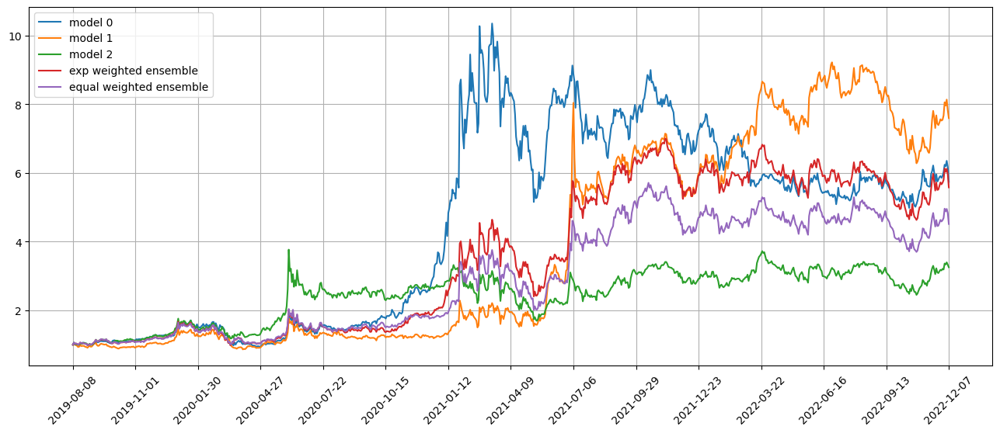

Standardization data are from 2021-05-06 to 2022-02-17
Training data are from 2022-02-18 to 2022-12-05
Testing data are from 2022-11-08 to 2023-01-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 43 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0766 - val_loss: 0.0951 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0761 - val_loss: 0.0951 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0757 - val_loss: 0.0946 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0754 - val_loss: 0.0945 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0752 - val_loss: 0.0947 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0757 - val_loss: 0.0954 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 7ms/step - loss: 0.0751 - val_loss: 0.0942 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0746 - val_loss: 0.0944 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0743 - val_loss: 0.0942 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0743 - val_loss: 0.0948 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0739 - val_loss: 0.0947 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0738 - val_loss: 0.0956 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0731 - val_loss: 0.0949 - lr: 0.0050
Epoch 8/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0729 - val_loss: 0.0948 - lr: 0.0050
Epoch 9/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0730 - val_loss: 0.0950

position on 2022-12-08 market open will be {'VXRT': 0.30909051443099195, 'ATUS': 0.31605594939973125, 'GNRC': 0.32353842662062376, 'TWLO': 0.33078182785921423, 'SRNE': 0.32748835282046795, 'HRTX': 0.34403760505080416, 'CYRX': 0.32729511773863845, 'EBS': 0.34194555419020145, 'ATRA': 0.35431213323917515, 'CVNA': 0.29922998960239827}
Total asset on 2022-12-08 will be 3.273775470952199
It should be the same as 3.2737754709522466
top_stocks by return weighted ensemble to buy on 2022-12-07 are ['MRVL', 'GNRC', 'XELA', 'SRNE', 'INSG', 'HRTX', 'TWLO', 'CVNA', 'VXRT', 'ATUS']
position on 2022-12-08 market open will be {'VXRT': 0.560715329733548, 'ATUS': 0.5733511952256487, 'CVNA': 0.3374493959027891, 'GNRC': 0.5731708895441786, 'MRVL': 0.5863589431410889, 'INSG': 0.5717686443032063, 'TWLO': 0.5860030800651412, 'HRTX': 0.6094866139497024, 'XELA': 0.5657109959995794, 'SRNE': 0.5801684593143168}
Total asset on 2022-12-08 will be 5.544183547179131
It should be the same as 5.5441835471792
top_stocks

position on 2022-12-13 market open will be {'DQ': 0.3290290775558105, 'SIRI': 0.3330413124476851, 'BZUN': 0.30638935014413204, 'USFR': 0.32464444664148867, 'ARES': 0.34649104469554926, 'KSA': 0.3302567340344466, 'CENN': 0.28941481591444834, 'NTAP': 0.3329063801538227, 'GME': 0.33726120728390746, 'BOIL': 0.33436394220467935}
Total asset on 2022-12-13 will be 3.263798311075923
It should be the same as 3.2637983110759703
top_stocks by return weighted ensemble to buy on 2022-12-12 are ['CENN', 'MARA', 'KSA', 'GME', 'DBEF', 'EHTH', 'SPB', 'KTOS', 'VNOM', 'BZUN']
position on 2022-12-13 market open will be {'EHTH': 0.5558115010763176, 'BZUN': 0.5116767687548949, 'MARA': 0.6113435268456661, 'DBEF': 0.5517360798011002, 'SPB': 0.563444065376007, 'KSA': 0.5515358104020142, 'KTOS': 0.5752252846193233, 'CENN': 0.4833289334868671, 'VNOM': 0.573409860328999, 'GME': 0.5632334305622064}
Total asset on 2022-12-13 will be 5.540745261253328
It should be the same as 5.540745261253396
top_stocks by equal we

position on 2022-12-16 market open will be {'BR': 0.40764081330441165, 'ASGN': 0.3999085668616744, 'VFC': 0.4176705953239014, 'WWW': 0.4132391311542779, 'RRC': 0.42115095404005704, 'APPF': 0.4010291463031393, 'RRX': 0.40966743961940705, 'GT': 0.4107333999330712, 'BANC': 0.4127124158289589, 'LKQ': 0.4172137491957005}
Total asset on 2022-12-16 will be 4.11096621156453
It should be the same as 4.110966211564599
Testing data from 2022-11-17 to 2022-12-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-16 are ['BMO', 'NFG', 'TRMB', 'AZPN', 'FNKO', 'COMT', 'EWT', 'INSG', 'DBEF', 'HLF']
position on 2022-12-19 market open will be {'FNKO': 0.5541918949103982, 'INSG': 0.5133299851298329, 'HLF': 0.5728000277012463, 'DBEF': 0.5435619435147696, 'TRMB': 0.5293889956786749, 'COMT': 0.5434107010752902, 'BMO': 0.5482155667558273, 'NFG': 0.5389154088692926, 'EWT': 0.5413599220551237, 'AZPN': 0.533021926169644}
Total asset on 2022-12-19 will be 5.418196371860037
It should be th

position on 2022-12-21 market open will be {'VRRM': 0.4020011563353096, 'TWLO': 0.39790484771561896, 'VFC': 0.3869359979949325, 'NWL': 0.38606398228111943, 'IEP': 0.38363520415269703, 'PYPL': 0.3869410746089565, 'ADSK': 0.38948503411176905, 'WDC': 0.3922566736167536, 'LNC': 0.39021407670040836, 'AZUL': 0.384551186638199}
Total asset on 2022-12-21 will be 3.899989234155696
It should be the same as 3.899989234155764
Testing data from 2022-11-22 to 2022-12-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-21 are ['DDS', 'GBIL', 'IDEX', 'EPD', 'TECS', 'VFC', 'M', 'BBD', 'SHV', 'TFLO']
position on 2022-12-22 market open will be {'BBD': 0.5325646651691767, 'TFLO': 0.5155910404399671, 'SHV': 0.5157788380668771, 'VFC': 0.49950365669075725, 'EPD': 0.512964963379499, 'TECS': 0.5162486820731813, 'DDS': 0.5142126546507387, 'IDEX': 0.4789643545070733, 'GBIL': 0.5159524223814141, 'M': 0.5010884821495851}
Total asset on 2022-12-22 will be 5.102869759508206
It should be the

position on 2022-12-27 market open will be {'OPK': 0.3942729852008186, 'ALGT': 0.40319765224484316, 'MARA': 0.38339796482784033, 'MDGL': 0.38977071212552716, 'CHH': 0.3998246731896014, 'JBLU': 0.3967785138111822, 'TFIN': 0.40452267183470897, 'VOD': 0.4001581644083862, 'TSLA': 0.3695047764965306, 'COMM': 0.39407295789804553}
Total asset on 2022-12-27 will be 3.9355010720374155
It should be the same as 3.935501072037484
Testing data from 2022-11-28 to 2022-12-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-27 are ['BCPC', 'SQ', 'W', 'APPF', 'ANGI', 'AVXL', 'SE', 'VKTX', 'MDGL', 'SNBR']
position on 2022-12-28 market open will be {'MDGL': 0.46813586188210493, 'AVXL': 0.49026103026700224, 'VKTX': 0.48497330009203365, 'W': 0.48993656876738595, 'SQ': 0.5005905819234252, 'BCPC': 0.5085895806760733, 'APPF': 0.5002021100257951, 'ANGI': 0.4947800025598771, 'SE': 0.5270275251281453, 'SNBR': 0.513656881540436}
Total asset on 2022-12-28 will be 4.978153442862214
It shou

Testing data from 2022-12-01 to 2022-12-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2022-12-30 are ['RIG', 'COMM', 'SRNE', 'ITUB', 'PAG', 'USFR', 'CODX', 'JBLU', 'AAL', 'AZUL']
position on 2023-01-03 market open will be {'CODX': 0.545674267904287, 'PAG': 0.5450758730563631, 'USFR': 0.5349966489965838, 'JBLU': 0.5566882137419169, 'ITUB': 0.5120316669621643, 'RIG': 0.5348902016260372, 'AAL': 0.5502336507112058, 'AZUL': 0.5131112841481368, 'COMM': 0.5550044561789131, 'SRNE': 0.7110893039213843}
Total asset on 2023-01-03 will be 5.558795567246927
It should be the same as 5.5587955672469915
top_stocks by model 1 to buy on 2022-12-30 are ['TGI', 'POOL', 'CHRS', 'VICR', 'NCLH', 'SFIX', 'CODX', 'AZUL', 'AAL', 'JBLU']
position on 2023-01-03 market open will be {'SFIX': 0.7188615778607407, 'NCLH': 0.6932282643061334, 'CODX': 0.6930605346229012, 'POOL': 0.68429558646783, 'JBLU': 0.707049340105432, 'TGI': 0.7297124472525044, 'AAL': 0.6988514037761225, 'AZUL': 0.6517023100

top_stocks by model 1 to buy on 2023-01-05 are ['ARKW', 'WSM', 'NTLA', 'JACK', 'FATE', 'ARKK', 'GME', 'RIOT', 'TSLA', 'MSTR']
position on 2023-01-06 market open will be {'FATE': 0.31250013452213765, 'NTLA': 0.7205494944901254, 'ARKK': 0.6931199420406241, 'JACK': 0.7019854918541792, 'MSTR': 0.6686817628698281, 'RIOT': 0.7508093776784523, 'WSM': 0.7212626350742932, 'TSLA': 0.6556248628074663, 'ARKW': 0.6889264049963156, 'GME': 0.6597216654643402}
Total asset on 2023-01-06 will be 6.573181771797744
It should be the same as 6.5731817717977625
top_stocks by model 2 to buy on 2023-01-05 are ['MLKN', 'AWI', 'MRVL', 'GME', 'CMCSA', 'WSM', 'SBGI', 'MSTR', 'FATE', 'TSLA']
position on 2023-01-06 market open will be {'MSTR': 0.3317123393188368, 'FATE': 0.13025820339145025, 'MLKN': 0.3303681170950636, 'MRVL': 0.31029321846920094, 'CMCSA': 0.3211446709734406, 'SBGI': 0.3185814944074547, 'WSM': 0.3235006527970241, 'TSLA': 0.29406080503023424, 'GME': 0.2958983025927452, 'AWI': 0.32079830372955026}
Tot

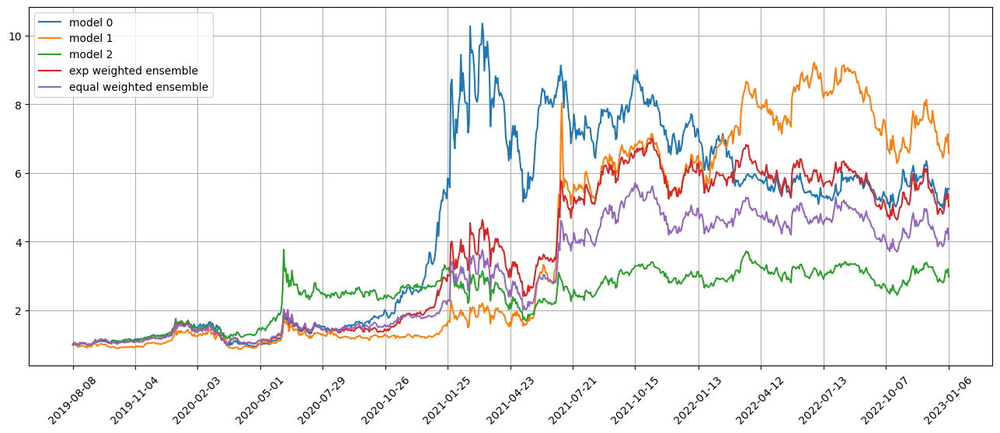

Standardization data are from 2021-06-04 to 2022-03-18
Training data are from 2022-03-21 to 2023-01-04
Testing data are from 2022-12-07 to 2023-02-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 44 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0821 - val_loss: 0.0772 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0817 - val_loss: 0.0764 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0815 - val_loss: 0.0768 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0813 - val_loss: 0.0784 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0812 - val_loss: 0.0772 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0812 - val_loss: 0.0783 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0791 - val_loss: 0.0780 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.07999530676814139
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.06500090490749458
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.07862878663184575
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.0655676813928674
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.08125388441285226
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.06479746338255508
Correlations between old and new weights
0.9949577361644787
0.8320445546951782
0.9236098640002083
0.9277281840780499
0.9465838480104392
0.940497724554007
Weight of model 0 is 0.3672277359558854
Weight of model 1 is 0.2860787747409974
Weight of model 2 is 0.34669348930311705
Testing data from 2022-12-07 to 2023-01-0

position on 2023-01-11 market open will be {'SIGA': 0.42949980040592733, 'BIL': 0.41475439923304086, 'PBR-A': 0.4301260439896079, 'RNG': 0.42471118975352773, 'TRMB': 0.4219364714528342, 'CARG': 0.41644228035642017, 'RRC': 0.42693935650866666, 'AR': 0.42047002913274056, 'PDBC': 0.42078023743964565, 'CYBR': 0.4234674575483087}
Total asset on 2023-01-11 will be 4.229127265820649
It should be the same as 4.22912726582072
Testing data from 2022-12-12 to 2023-01-10 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-01-11 are ['EOG', 'MPC', 'MUR', 'MGY', 'VRRM', 'WKHS', 'CENN', 'EGHT', 'CVNA', 'BIL']
position on 2023-01-12 market open will be {'BIL': 0.5648223542048862, 'MUR': 0.5707021690270085, 'EGHT': 0.5678796533532777, 'CVNA': 0.721799013118978, 'VRRM': 0.578041455579927, 'WKHS': 0.5903167677716544, 'EOG': 0.568759618253355, 'CENN': 0.625773860882164, 'MGY': 0.5847499287474603, 'MPC': 0.575041918784699}
Total asset on 2023-01-12 will be 5.9478867397233435
It should b

top_stocks by model 0 to buy on 2023-01-17 are ['USFR', 'TGI', 'CSTM', 'PBR-A', 'COMT', 'EBS', 'CLB', 'KNDI', 'BIL', 'VNLA']
position on 2023-01-18 market open will be {'BIL': 0.5650074129816177, 'VNLA': 0.5973969228506915, 'PBR-A': 0.6385855418141408, 'CSTM': 0.6185465750502603, 'USFR': 0.600993128282508, 'COMT': 0.6062045088601582, 'TGI': 0.5907900620116429, 'EBS': 0.6013235987855569, 'CLB': 0.622770049073371, 'KNDI': 0.5925571984406254}
Total asset on 2023-01-18 will be 6.0341749981505055
It should be the same as 6.034174998150573
top_stocks by model 1 to buy on 2023-01-17 are ['PPBI', 'PBR-A', 'PCRX', 'MYGN', 'CLB', 'EBS', 'VNLA', 'COLB', 'SIGA', 'KNDI']
position on 2023-01-18 market open will be {'SIGA': 0.7184614386699922, 'PBR-A': 0.7960132376332858, 'PCRX': 0.7630835983013762, 'COLB': 0.7392706611663825, 'PPBI': 0.7337379991348372, 'EBS': 0.7495652710438341, 'CLB': 0.7762988207587959, 'VNLA': 0.7496342605531269, 'KNDI': 0.7386377284296771, 'MYGN': 0.8052507610600046}
Total asse

top_stocks by model 1 to buy on 2023-01-20 are ['PZZA', 'KW', 'MSM', 'BYON', 'SIGA', 'HBI', 'TTEK', 'JWN', 'SHOO', 'EEMV']
position on 2023-01-23 market open will be {'SIGA': 0.7100200159796837, 'PZZA': 0.6940265213190668, 'HBI': 0.7258917693050845, 'MSM': 0.7386484607851612, 'TTEK': 0.7543689833722594, 'KW': 0.7376762726532964, 'SHOO': 0.7403722462302778, 'BYON': 0.7573330359887349, 'EEMV': 0.7254225005804115, 'JWN': 0.7718862733362047}
Total asset on 2023-01-23 will be 7.355646079550161
It should be the same as 7.355646079550181
top_stocks by model 2 to buy on 2023-01-20 are ['TBT', 'PEP', 'BYON', 'BCRX', 'BIL', 'PZZA', 'TMV', 'LDOS', 'SHOO', 'EEMV']
position on 2023-01-23 market open will be {'BIL': 0.32504417009643793, 'PZZA': 0.29976683010333255, 'PEP': 0.3139237294266107, 'LDOS': 0.31796643002915553, 'SHOO': 0.3197846689303991, 'BCRX': 0.32244753304858886, 'TBT': 0.3202899863916131, 'BYON': 0.32711044399196104, 'TMV': 0.3239321220128727, 'EEMV': 0.31332751242895296}
Total asset o

top_stocks by model 2 to buy on 2023-01-25 are ['GEVO', 'FRPT', 'CYRX', 'APPN', 'OPK', 'AMC', 'SIGA', 'EDIT', 'EEMV', 'SGMO']
position on 2023-01-26 market open will be {'SIGA': 0.31509914990087484, 'APPN': 0.3315036188553064, 'FRPT': 0.32722921271437627, 'CYRX': 0.3054385335310017, 'GEVO': 0.32897568005379474, 'OPK': 0.31418422719694183, 'SGMO': 0.3240044718763651, 'EDIT': 0.3393664838796198, 'EEMV': 0.3191897316093575, 'AMC': 0.3207014204823454}
Total asset on 2023-01-26 will be 3.2256925300999324
It should be the same as 3.225692530099984
top_stocks by return weighted ensemble to buy on 2023-01-25 are ['GME', 'EDIT', 'APPN', 'CYRX', 'VXRT', 'IDEX', 'AAOI', 'SGMO', 'INSG', 'EXPRQ']
position on 2023-01-26 market open will be {'INSG': 0.58956618221966, 'VXRT': 0.5714027715712786, 'EDIT': 0.5825743106191693, 'APPN': 0.5690765040041358, 'CYRX': 0.5243318110679206, 'AAOI': 0.5459854854651662, 'IDEX': 0.5437965212601501, 'EXPRQ': 0.602141674318435, 'GME': 0.5440540573674008, 'SGMO': 0.5562

position on 2023-01-31 market open will be {'SIGA': 0.30628812040918674, 'FATE': 0.3517555822674666, 'IRBT': 0.3364143177104117, 'VIRT': 0.33627396362163925, 'NKTR': 0.3342048185018497, 'SGMO': 0.32452166026334817, 'NVCR': 0.339994453370283, 'EEMV': 0.33264349239495916, 'CHRS': 0.336376818623554, 'SFNC': 0.3318464431738115}
Total asset on 2023-01-31 will be 3.3303196703364586
It should be the same as 3.3303196703365097
top_stocks by return weighted ensemble to buy on 2023-01-30 are ['CVNA', 'SFBS', 'OPK', 'SIGA', 'VIRT', 'SFNC', 'IRBT', 'FATE', 'SGMO', 'CHRS']
position on 2023-01-31 market open will be {'CVNA': 0.9138927039162743, 'FATE': 0.606594401862527, 'IRBT': 0.5762161288378184, 'SIGA': 0.572149385807949, 'SFNC': 0.5683921961336155, 'SFBS': 0.5797038471957529, 'VIRT': 0.5759757279825591, 'OPK': 0.5909215257167296, 'CHRS': 0.5761518997681071, 'SGMO': 0.5558461841744046}
Total asset on 2023-01-31 will be 6.1158440013956605
It should be the same as 6.115844001395738
top_stocks by eq

position on 2023-02-03 market open will be {'NFG': 0.6266542341495602, 'SIGA': 0.6517981228625892, 'HZO': 0.6079498951431709, 'DQ': 0.5578286292533696, 'FSM': 0.55983982655015, 'NTCT': 0.60458968417189, 'FFIN': 0.6228499824814493, 'GME': 0.5974338999676078, 'EEMV': 0.6030477147274385, 'EQNR': 0.5940510076297204}
Total asset on 2023-02-03 will be 6.026042996936865
It should be the same as 6.026042996936945
top_stocks by equal weighted ensemble to buy on 2023-02-02 are ['SHW', 'FSM', 'HZO', 'EQNR', 'GME', 'NTCT', 'DQ', 'NFG', 'EEMV', 'SIGA']
position on 2023-02-03 market open will be {'SIGA': 0.4990664006803552, 'NFG': 0.5183691202733962, 'HZO': 0.5077324747473779, 'DQ': 0.4658734423320386, 'FSM': 0.46755310407531275, 'NTCT': 0.5049261773111066, 'SHW': 0.5041727698190618, 'GME': 0.49894998741153795, 'EEMV': 0.503638393616643, 'EQNR': 0.49612474751555113}
Total asset on 2023-02-03 will be 4.966406617782309
It should be the same as 4.966406617782381
Testing data from 2023-01-05 to 2023-02-

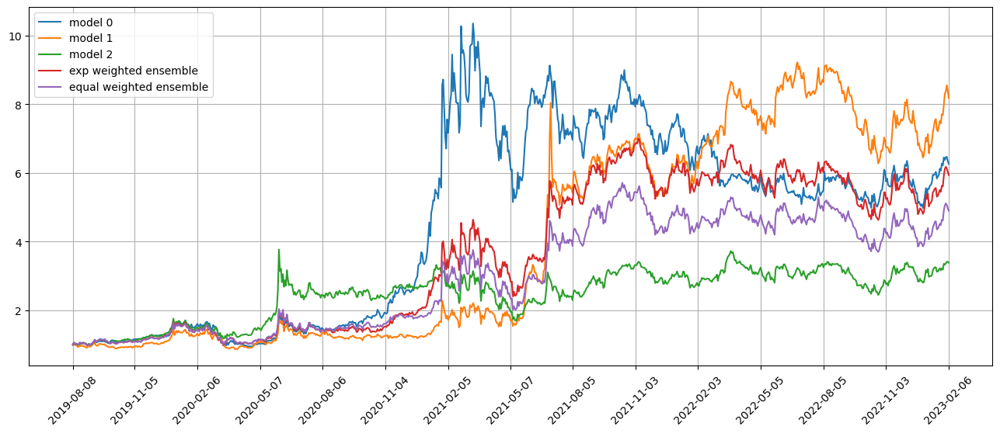

Standardization data are from 2021-07-02 to 2022-04-18
Training data are from 2022-04-19 to 2023-02-02
Testing data are from 2023-01-06 to 2023-03-03
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 45 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0779 - val_loss: 0.0706 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0776 - val_loss: 0.0705 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0772 - val_loss: 0.0713 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0769 - val_loss: 0.0708 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0770 - val_loss: 0.0712 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0766 - val_loss: 0.0713 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0715 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0717 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0741 - val_loss: 0.0713 - lr: 0.0012
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0719 - lr: 0.0012
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0718 - lr: 0.0012
Epoch 27: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.07450546086472204
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.05827542319690438
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.07343515474736778
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.058704651967572685
96/96 [==============================] -

Testing data from 2023-01-11 to 2023-02-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-09 are ['LULU', 'MDB', 'RPD', 'NVS', 'JNPR', 'FLOT', 'CHGG', 'KNDI', 'GBIL', 'SHV']
position on 2023-02-10 market open will be {'FLOT': 0.646720358509592, 'SHV': 0.6469070729135439, 'RPD': 0.6365669115791628, 'JNPR': 0.6375574256341977, 'LULU': 0.6333924964655554, 'CHGG': 0.6184713272955737, 'GBIL': 0.6468482719991682, 'MDB': 0.6150766560006232, 'NVS': 0.6365902150953298, 'KNDI': 0.633754190063458}
Total asset on 2023-02-10 will be 6.3518849255561385
It should be the same as 6.351884925556204
top_stocks by model 1 to buy on 2023-02-09 are ['BBWI', 'PMT', 'DXCM', 'CHGG', 'ILMN', 'AZTA', 'TSEM', 'LULU', 'JNPR', 'KNDI']
position on 2023-02-10 market open will be {'BBWI': 0.8060022849639467, 'PMT': 0.7767534145516535, 'TSEM': 0.7900412834192612, 'ILMN': 0.7685438061626608, 'DXCM': 0.8167277306155504, 'AZTA': 0.7072067605362338, 'CHGG': 0.76266685907932, 'LULU': 0.7810668733

Testing data from 2023-01-17 to 2023-02-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-14 are ['BTU', 'CVNA', 'UNP', 'BALL', 'EC', 'IVZ', 'HBI', 'DQ', 'RPD', 'CB']
position on 2023-02-15 market open will be {'HBI': 0.6335311714643964, 'DQ': 0.6475532980715825, 'EC': 0.6266662994426939, 'RPD': 0.6429204016193842, 'BALL': 0.6491441762900824, 'BTU': 0.6818820844835255, 'CB': 0.6307795859661527, 'UNP': 0.6269829760790894, 'IVZ': 0.6258097441649197, 'CVNA': 0.6321075386911708}
Total asset on 2023-02-15 will be 6.397377276272932
It should be the same as 6.397377276272998
top_stocks by model 1 to buy on 2023-02-14 are ['AMN', 'FFIV', 'TYL', 'IVZ', 'TRMB', 'VTLE', 'IHI', 'DQ', 'EC', 'APPS']
position on 2023-02-15 market open will be {'VTLE': 0.7874448365062416, 'DQ': 0.7889328638699664, 'EC': 0.7634856308854229, 'TRMB': 0.7724069542957118, 'IHI': 0.7720504622321985, 'FFIV': 0.7818407263113973, 'AMN': 0.7647909155239163, 'APPS': 0.7899978430909637, 'TYL': 0.783062

top_stocks by model 0 to buy on 2023-02-17 are ['AZUL', 'IT', 'FWRD', 'XELA', 'APA', 'EMR', 'BAND', 'ADM', 'NTCT', 'FN']
position on 2023-02-21 market open will be {'BAND': 0.6118736234856911, 'APA': 0.5835806371942036, 'AZUL': 0.6010467205009936, 'FN': 0.6213723269790686, 'ADM': 0.6316874221870472, 'EMR': 0.6262213748166022, 'FWRD': 0.6375491673858075, 'NTCT': 0.6174458798416393, 'XELA': 0.6421920147916942, 'IT': 0.6250280875023306}
Total asset on 2023-02-21 will be 6.197997254685015
It should be the same as 6.197997254685079
top_stocks by model 1 to buy on 2023-02-17 are ['RUN', 'BAND', 'VCYT', 'ROP', 'CSCO', 'TSEM', 'GLOB', 'APPS', 'INSG', 'MSI']
position on 2023-02-21 market open will be {'APPS': 0.7359795100930998, 'INSG': 0.7663246069705723, 'ROP': 0.7685518382373691, 'BAND': 0.7461581610136627, 'MSI': 0.7705065137593106, 'GLOB': 0.7740295731348531, 'CSCO': 0.757068356354043, 'TSEM': 0.7627445570690975, 'RUN': 0.7777056848930866, 'VCYT': 0.7450967557706777}
Total asset on 2023-02

Testing data from 2023-01-25 to 2023-02-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-02-23 are ['PBA', 'XYL', 'HAL', 'CEIX', 'MUR', 'ENB', 'CVE', 'VET', 'MGY', 'APA']
position on 2023-02-24 market open will be {'MUR': 0.5974807568637772, 'CVE': 0.5938628256173525, 'PBA': 0.6057655742397839, 'XYL': 0.6008075570113951, 'APA': 0.5916928345063346, 'HAL': 0.6009861089736928, 'CEIX': 0.5975429078034511, 'ENB': 0.5972819098846276, 'MGY': 0.6124621477597934, 'VET': 0.6170597985844857}
Total asset on 2023-02-24 will be 6.014942421244632
It should be the same as 6.014942421244695
top_stocks by model 1 to buy on 2023-02-23 are ['AR', 'PUMP', 'OVV', 'ENB', 'CNX', 'MUR', 'APA', 'PBA', 'VET', 'MGY']
position on 2023-02-24 market open will be {'MUR': 0.7473412983130236, 'PBA': 0.7577041193795485, 'PUMP': 0.7106220522639727, 'APA': 0.7401016452205101, 'MGY': 0.7660803321549393, 'ENB': 0.7470925763954455, 'AR': 0.7611452987202493, 'OVV': 0.7553649957076044, 'CNX': 0.756770

top_stocks by model 0 to buy on 2023-02-28 are ['MMM', 'NFG', 'WHR', 'BOH', 'CSCO', 'NSC', 'CBU', 'BIL', 'JWN', 'INTC']
position on 2023-03-01 market open will be {'MMM': 0.6289900536538784, 'NSC': 0.6115675447852659, 'CBU': 0.6105816073763125, 'CSCO': 0.6075543076917188, 'BOH': 0.6085130516582159, 'WHR': 0.6077856772696716, 'NFG': 0.60424444886867, 'INTC': 0.6144042416319365, 'BIL': 0.6105929674069681, 'JWN': 0.6055647912958435}
Total asset on 2023-03-01 will be 6.1097986916384155
It should be the same as 6.109798691638481
top_stocks by model 1 to buy on 2023-02-28 are ['WHR', 'SNX', 'LOGI', 'VIRT', 'LIVN', 'VFC', 'VXRT', 'TNDM', 'SENS', 'INTC']
position on 2023-03-01 market open will be {'LOGI': 0.7586127848105996, 'VFC': 0.7973822265241511, 'VXRT': 0.7639430551324783, 'SENS': 0.7901317788266544, 'VIRT': 0.7597941170217098, 'WHR': 0.7682905986084059, 'INTC': 0.7766570030269104, 'TNDM': 0.7766800349476284, 'LIVN': 0.7611251979913624, 'SNX': 0.7771523348807302}
Total asset on 2023-03-0

position on 2023-03-06 market open will be {'AWK': 0.7976796809012365, 'CPT': 0.8076423949276451, 'UDOW': 0.8153697918591988, 'IYR': 0.8044867577387776, 'VHT': 0.7999824861791731, 'IXJ': 0.7998522574553323, 'SCHH': 0.8031729190417628, 'VNQ': 0.8030710767333061, 'XLRE': 0.8052659137532859, 'ICF': 0.8026437484654712}
Total asset on 2023-03-06 will be 8.039167027055168
It should be the same as 8.03916702705519
top_stocks by model 2 to buy on 2023-03-03 are ['IYR', 'STAG', 'DDM', 'FRT', 'SPYD', 'XLRE', 'UDOW', 'CPT', 'NTRS', 'IXJ']
position on 2023-03-06 market open will be {'CPT': 0.3411929912010618, 'UDOW': 0.3444574727213897, 'STAG': 0.3395535907274321, 'IYR': 0.3398598748387001, 'FRT': 0.3370844457898578, 'NTRS': 0.34096648509225486, 'IXJ': 0.3379020045927077, 'DDM': 0.34148403731243, 'SPYD': 0.33863476829598527, 'XLRE': 0.34018903360113256}
Total asset on 2023-03-06 will be 3.4013247041729016
It should be the same as 3.4013247041729517
top_stocks by return weighted ensemble to buy on 

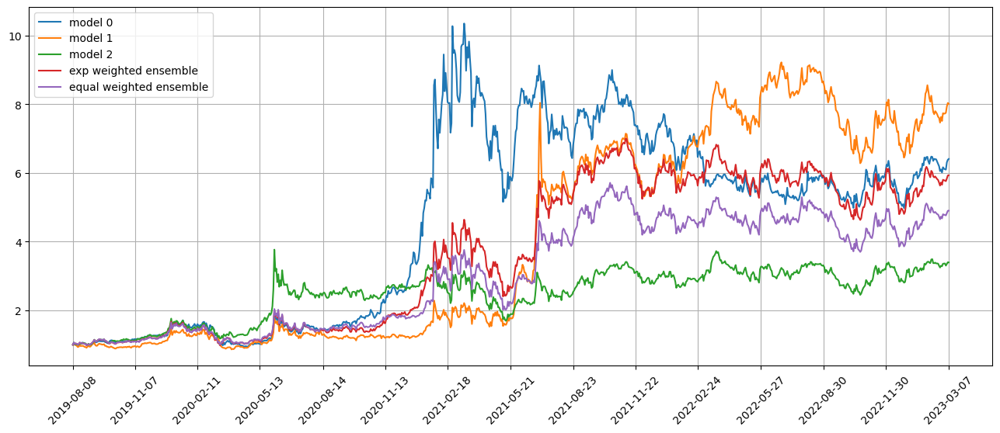

Standardization data are from 2021-08-02 to 2022-05-16
Training data are from 2022-05-17 to 2023-03-03
Testing data are from 2023-02-06 to 2023-03-31
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 46 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0761 - val_loss: 0.0608 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0755 - val_loss: 0.0604 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0754 - val_loss: 0.0606 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0751 - val_loss: 0.0607 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0748 - val_loss: 0.0605 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0750 - val_loss: 0.0610 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0723 - val_loss: 0.0613 - lr: 0.0025
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0721 - val_loss: 0.0615 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0612 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0616 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0720 - val_loss: 0.0615 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0718 - val_loss: 0.0612 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0720 - val_loss: 0.0615 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0719 - val_loss: 0.0612 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0718 - val_loss

top_stocks by model 1 to buy on 2023-03-09 are ['PLCE', 'AKAM', 'CBSH', 'WTRG', 'LKQ', 'ROST', 'QURE', 'ARWR', 'AEO', 'MGNX']
position on 2023-03-10 market open will be {'MGNX': 0.7888138147366531, 'QURE': 0.7359544621300841, 'ROST': 0.7552967364099561, 'CBSH': 0.7391314816149291, 'PLCE': 0.7600733076721268, 'WTRG': 0.7734766652691708, 'ARWR': 0.7237751615266346, 'AEO': 0.7551776300745976, 'AKAM': 0.7678265094886488, 'LKQ': 0.7513116883778344}
Total asset on 2023-03-10 will be 7.550837457300614
It should be the same as 7.550837457300635
top_stocks by model 2 to buy on 2023-03-09 are ['QURE', 'UVXY', 'GEN', 'BOH', 'ANF', 'HRL', 'KHC', 'CVS', 'TRIP', 'MKC']
position on 2023-03-10 market open will be {'CVS': 0.3163973139050872, 'TRIP': 0.32070598896978825, 'QURE': 0.31510722801828567, 'UVXY': 0.3959682184965266, 'BOH': 0.3001551550021851, 'GEN': 0.31803405828245335, 'KHC': 0.3331474126045965, 'ANF': 0.3205596490324495, 'MKC': 0.3265799241297061, 'HRL': 0.3272643305391531}
Total asset on 2

top_stocks by model 2 to buy on 2023-03-14 are ['LUMN', 'AZTA', 'SPGI', 'FATE', 'FBP', 'KN', 'CHGG', 'SBSW', 'NEM', 'HBI']
position on 2023-03-15 market open will be {'AZTA': 0.31252465211046576, 'HBI': 0.32260638270093644, 'SPGI': 0.3352274099396694, 'NEM': 0.3426402491159449, 'KN': 0.32660578841364873, 'FBP': 0.3021198385676898, 'FATE': 0.34015481759437177, 'CHGG': 0.3378332381255089, 'SBSW': 0.3352685996177604, 'LUMN': 0.31740226096257673}
Total asset on 2023-03-15 will be 3.2723832371485226
It should be the same as 3.272383237148573
top_stocks by return weighted ensemble to buy on 2023-03-14 are ['TECH', 'TSE', 'FBP', 'HD', 'VUZI', 'HBI', 'HASI', 'INFN', 'NEM', 'TNDM']
position on 2023-03-15 market open will be {'VUZI': 0.5717173572952747, 'HBI': 0.5410792730983662, 'HASI': 0.5110353717100172, 'INFN': 0.5886489073071138, 'NEM': 0.5746803128125475, 'TECH': 0.5620155439944405, 'TNDM': 0.5753416799628507, 'HD': 0.557895065020921, 'FBP': 0.5067189969156392, 'TSE': 0.5371871672208597}
T

top_stocks by model 2 to buy on 2023-03-17 are ['DE', 'ORLY', 'WRB', 'ADM', 'CFR', 'HCSG', 'IRWD', 'AGCO', 'AZUL', 'AFG']
position on 2023-03-20 market open will be {'DE': 0.3336231820387295, 'WRB': 0.32568482782071634, 'HCSG': 0.3186751803469755, 'IRWD': 0.3316237472009142, 'ORLY': 0.32443837101485484, 'ADM': 0.3247777210599752, 'CFR': 0.33209812980977005, 'AFG': 0.3267119338358034, 'AGCO': 0.3323271867488653, 'AZUL': 0.3288975448159678}
Total asset on 2023-03-20 will be 3.2788578246925217
It should be the same as 3.2788578246925724
top_stocks by return weighted ensemble to buy on 2023-03-17 are ['AIG', 'WRB', 'ADM', 'EWY', 'DE', 'AZUL', 'AGCO', 'BABA', 'IRWD', 'AFG']
position on 2023-03-20 market open will be {'AIG': 0.53642165324741, 'DE': 0.557382318240086, 'WRB': 0.5441197558185888, 'IRWD': 0.5540418740351563, 'ADM': 0.5426042578064201, 'EWY': 0.5532510668006014, 'AFG': 0.5458357358900849, 'BABA': 0.5291570662184043, 'AZUL': 0.5494872234979024, 'AGCO': 0.5552171064143415}
Total as

top_stocks by model 2 to buy on 2023-03-22 are ['JNUG', 'AAP', 'GRPN', 'PLNT', 'SGMO', 'AR', 'LEG', 'CDE', 'ESPR', 'HBI']
position on 2023-03-23 market open will be {'SGMO': 0.3039412971061188, 'ESPR': 0.31812417058456816, 'HBI': 0.32974049271413525, 'AAP': 0.3190238128211946, 'PLNT': 0.33095603001407886, 'GRPN': 0.3189716181642066, 'JNUG': 0.3563918243640141, 'AR': 0.3231271997625127, 'CDE': 0.34743516445913414, 'LEG': 0.33199303607237673}
Total asset on 2023-03-23 will be 3.279704646062288
It should be the same as 3.2797046460623402
top_stocks by return weighted ensemble to buy on 2023-03-22 are ['PLUG', 'LEG', 'MKSI', 'XRAY', 'AR', 'GDS', 'CDE', 'VNET', 'AAP', 'GRPN']
position on 2023-03-23 market open will be {'MKSI': 0.5491437234227147, 'XRAY': 0.5392588384710458, 'AAP': 0.5282511401569906, 'PLUG': 0.5524467188912424, 'GRPN': 0.5281647143606835, 'AR': 0.5350456763111663, 'VNET': 0.499272255476075, 'CDE': 0.5752956813259427, 'LEG': 0.5497260479665445, 'GDS': 0.568140692168452}
Tota

top_stocks by model 2 to buy on 2023-03-27 are ['FL', 'EBS', 'HOUS', 'BAND', 'INO', 'KSS', 'VXRT', 'TRMB', 'BB', 'VFC']
position on 2023-03-28 market open will be {'VXRT': 0.3222572122698773, 'HOUS': 0.31383185674493674, 'BAND': 0.32480454465289593, 'VFC': 0.3316187724757323, 'KSS': 0.32510758950686813, 'TRMB': 0.3223097790657492, 'INO': 0.30283459543723734, 'BB': 0.3246886439376486, 'FL': 0.323106922528269, 'EBS': 0.3588717921910965}
Total asset on 2023-03-28 will be 3.249431708810258
It should be the same as 3.249431708810311
top_stocks by return weighted ensemble to buy on 2023-03-27 are ['BL', 'TNDM', 'FL', 'MLKN', 'TRMB', 'INO', 'VXRT', 'SRNE', 'BB', 'VFC']
position on 2023-03-28 market open will be {'VXRT': 0.5365699799062632, 'MLKN': 0.5381300815953743, 'BL': 0.5350187349149575, 'VFC': 0.550811275990243, 'TRMB': 0.5353492486144775, 'INO': 0.503001409363761, 'BB': 0.5393004893289794, 'FL': 0.5366732858650223, 'TNDM': 0.5124465441941326, 'SRNE': 0.5817848207422076}
Total asset on 

position on 2023-03-31 market open will be {'FNKO': 0.58273176425813, 'WW': 0.5140595777247171, 'BURL': 0.5357504060725773, 'SHAK': 0.5322629602257555, 'GBTC': 0.5201470518507141, 'ITUB': 0.5361881574734874, 'BRZU': 0.5325526778131212, 'CLNE': 0.5420635912828541, 'SNBR': 0.5358662185522434, 'CHRS': 0.5292942408246933}
Total asset on 2023-03-31 will be 5.360916646078205
It should be the same as 5.3609166460782935
top_stocks by equal weighted ensemble to buy on 2023-03-30 are ['ITUB', 'BRZU', 'BURL', 'CHRS', 'SHAK', 'CLNE', 'GBTC', 'FNKO', 'SNBR', 'WW']
position on 2023-03-31 market open will be {'FNKO': 0.48090701317407036, 'WW': 0.4242343927001205, 'BURL': 0.4421350326065804, 'SHAK': 0.43925332696383407, 'GBTC': 0.42925459802603866, 'ITUB': 0.4424926204689171, 'BRZU': 0.43949241820940255, 'CLNE': 0.44734135885759907, 'SNBR': 0.4422269383666427, 'CHRS': 0.4368033727660339}
Total asset on 2023-03-31 will be 4.424141072139163
It should be the same as 4.42414107213924
Testing data from 202

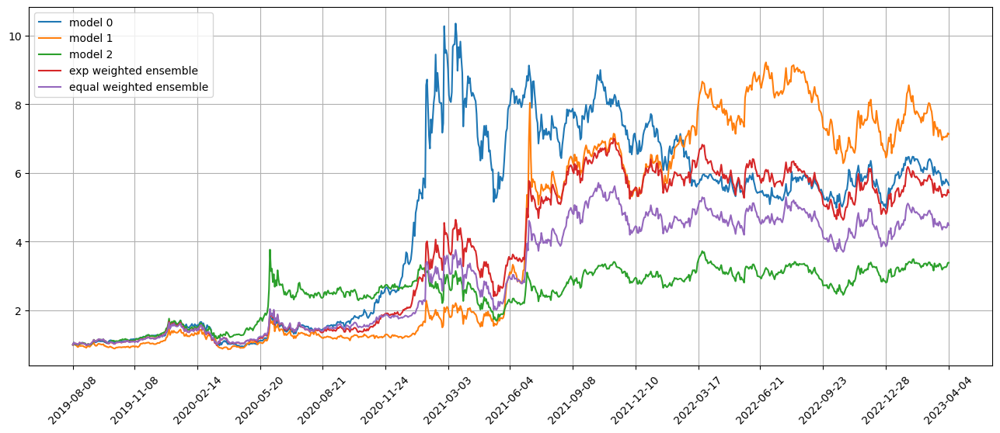

Standardization data are from 2021-08-30 to 2022-06-14
Training data are from 2022-06-15 to 2023-03-31
Testing data are from 2023-03-07 to 2023-05-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 47 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0736 - val_loss: 0.0812 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0732 - val_loss: 0.0812 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0729 - val_loss: 0.0811 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0726 - val_loss: 0.0819 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0723 - val_loss: 0.0816 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0814 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0698 - val_loss: 0.0818 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0699 - val_loss: 0.0820 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0697 - val_loss: 0.0816 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0698 - val_loss: 0.0818 - lr: 0.0010
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.0727408265680341
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.05428253674925086
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.07120676054472308
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.05425173841954792
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.07211433070050198
11/11 [==============================] - 0s 3ms/step
Model 2 t

Testing data from 2023-03-10 to 2023-04-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-10 are ['KW', 'SENS', 'AAT', 'VNO', 'EGHT', 'LUMN', 'HOUS', 'BDN', 'CUBI', 'BXP']
position on 2023-04-11 market open will be {'HOUS': 0.5793834921230712, 'BDN': 0.5554592174135029, 'EGHT': 0.5569057244450178, 'KW': 0.5617237724687013, 'CUBI': 0.5694596652726795, 'SENS': 0.514314117034161, 'VNO': 0.5642123768868308, 'BXP': 0.5606189510410379, 'AAT': 0.5521635944402746, 'LUMN': 0.5624024507336823}
Total asset on 2023-04-11 will be 5.576643361858897
It should be the same as 5.576643361858959
top_stocks by model 1 to buy on 2023-04-10 are ['CCL', 'QTWO', 'CUK', 'BLNK', 'KRNT', 'NKTR', 'EGHT', 'BDN', 'SENS', 'LUMN']
position on 2023-04-11 market open will be {'BDN': 0.6832372747174567, 'KRNT': 0.7046981527822153, 'BLNK': 0.7255943056071977, 'EGHT': 0.6850165367966314, 'CCL': 0.7053001061610022, 'SENS': 0.6326271392298132, 'CUK': 0.7060380564403815, 'NKTR': 0.7264800977917484

position on 2023-04-14 market open will be {'VFC': 0.5986125693733356, 'BDN': 0.5505417403091929, 'FIS': 0.5746179795513048, 'EXPO': 0.5635631628493689, 'RPD': 0.5437100726315037, 'CVX': 0.5632202090216135, 'CF': 0.5633993638586687, 'FIVN': 0.5582369568771822, 'BKR': 0.5627318065923411, 'COMM': 0.5429465484077705}
Total asset on 2023-04-14 will be 5.6215804094722195
It should be the same as 5.621580409472282
top_stocks by model 1 to buy on 2023-04-13 are ['EXPE', 'VRNS', 'BKR', 'EXPO', 'ALRM', 'SABR', 'RPD', 'LPSN', 'WKHS', 'VFC']
position on 2023-04-14 market open will be {'VFC': 0.7430545543029086, 'SABR': 0.6936688699729332, 'RPD': 0.6752512037638112, 'EXPO': 0.6999074015111919, 'WKHS': 0.7294346227744454, 'LPSN': 0.7307127798796481, 'BKR': 0.6988749131657073, 'EXPE': 0.6934172347713167, 'VRNS': 0.684528459236989, 'ALRM': 0.6888033081924451}
Total asset on 2023-04-14 will be 7.037653347571375
It should be the same as 7.037653347571396
top_stocks by model 2 to buy on 2023-04-13 are [

Testing data from 2023-03-20 to 2023-04-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-18 are ['TROX', 'KRC', 'UVXY', 'VNO', 'GBCI', 'KALU', 'PPBI', 'FFIN', 'VKTX', 'EXPO']
position on 2023-04-19 market open will be {'UVXY': 0.5362171474351626, 'EXPO': 0.5602763021998152, 'VKTX': 0.5832212913010727, 'KALU': 0.5612789231885902, 'PPBI': 0.5501776510161637, 'GBCI': 0.5466825970029793, 'VNO': 0.5566204213350862, 'FFIN': 0.5567870011917365, 'KRC': 0.5539354885986648, 'TROX': 0.557954558120278}
Total asset on 2023-04-19 will be 5.563151381389487
It should be the same as 5.563151381389549
top_stocks by model 1 to buy on 2023-04-18 are ['COF', 'CE', 'PPBI', 'FITB', 'GBCI', 'AVNT', 'MKSI', 'VKTX', 'FFIN', 'EXPO']
position on 2023-04-19 market open will be {'COF': 0.7092528365467208, 'MKSI': 0.6895123610480787, 'CE': 0.689051157441659, 'EXPO': 0.6951223671644903, 'VKTX': 0.7235897056473186, 'PPBI': 0.6825931948821958, 'GBCI': 0.6782569589759588, 'FITB': 0.702597511

Testing data from 2023-03-23 to 2023-04-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-04-21 are ['HOUS', 'EBS', 'LUMN', 'PETS', 'AHT', 'GEVO', 'NKTR', 'DBI', 'EGHT', 'HRTX']
position on 2023-04-24 market open will be {'EGHT': 0.5156177044651596, 'EBS': 0.5402949959054436, 'NKTR': 0.521789631360797, 'HOUS': 0.5523138482521187, 'DBI': 0.5496022742639274, 'HRTX': 0.5964389659538669, 'AHT': 0.5452845419097384, 'GEVO': 0.5798603827579631, 'PETS': 0.5543596497238, 'LUMN': 0.5808976980930451}
Total asset on 2023-04-24 will be 5.5364596926857965
It should be the same as 5.53645969268586
top_stocks by model 1 to buy on 2023-04-21 are ['NCLH', 'PLCE', 'HRTX', 'LPSN', 'NKTR', 'VIXY', 'GEVO', 'EBS', 'INSG', 'EGHT']
position on 2023-04-24 market open will be {'LPSN': 0.6676249372150417, 'VIXY': 0.6854803822019864, 'INSG': 0.7065854488470955, 'EGHT': 0.6432840689909781, 'NKTR': 0.6509841580541703, 'NCLH': 0.7135437659576029, 'HRTX': 0.7436908240783063, 'GEVO': 0.72301923

top_stocks by model 0 to buy on 2023-04-26 are ['JELD', 'BZUN', 'VFC', 'MLKN', 'GBX', 'CLNE', 'MMYT', 'TRUP', 'EGHT', 'VNET']
position on 2023-04-27 market open will be {'MLKN': 0.5257945610770889, 'BZUN': 0.5199183538079252, 'EGHT': 0.5356874288862772, 'JELD': 0.5305530088636906, 'VFC': 0.5336612307760162, 'GBX': 0.5215704947081604, 'CLNE': 0.5253894810227779, 'VNET': 0.5399934450503923, 'TRUP': 0.5307194345745518, 'MMYT': 0.5369168273356819}
Total asset on 2023-04-27 will be 5.300204266102497
It should be the same as 5.300204266102561
top_stocks by model 1 to buy on 2023-04-26 are ['MPW', 'GRPN', 'IDEX', 'GEVO', 'PLXS', 'DUST', 'QRTEA', 'BZUN', 'PRLB', 'INSG']
position on 2023-04-27 market open will be {'GRPN': 0.674919454292054, 'IDEX': 0.445687530686704, 'INSG': 0.6379328040378553, 'BZUN': 0.6574808721891505, 'PLXS': 0.6691828495975556, 'QRTEA': 0.6614795961659632, 'GEVO': 0.6709292958316029, 'PRLB': 0.6745171896237222, 'DUST': 0.71146462878303, 'MPW': 0.6692665630307257}
Total ass

position on 2023-05-02 market open will be {'LPSN': 0.6702772389489119, 'VNET': 0.6316462605196482, 'BB': 0.7125025664313025, 'KALU': 0.6353882572477815, 'HRTX': 0.6778728627072712, 'ECPG': 0.6514224444518405, 'NKTR': 0.667123546693393, 'ARCH': 0.640028337578918, 'UNF': 0.6618562941280349, 'M': 0.6465894432608674}
Total asset on 2023-05-02 will be 6.594707251967945
It should be the same as 6.59470725196797
top_stocks by model 2 to buy on 2023-05-01 are ['ROIC', 'OVV', 'BB', 'IRWD', 'DEA', 'LYB', 'LPSN', 'UNF', 'FSK', 'VNET']
position on 2023-05-02 market open will be {'LPSN': 0.3508997744824995, 'VNET': 0.3306759016860369, 'DEA': 0.33517624885528513, 'FSK': 0.3305814734689923, 'IRWD': 0.3430690804479629, 'BB': 0.36533040722709337, 'LYB': 0.3314282596988668, 'OVV': 0.3356514570703371, 'UNF': 0.33936190668152943, 'ROIC': 0.3333944052208808}
Total asset on 2023-05-02 will be 3.3955689148394317
It should be the same as 3.395568914839484
top_stocks by return weighted ensemble to buy on 2023

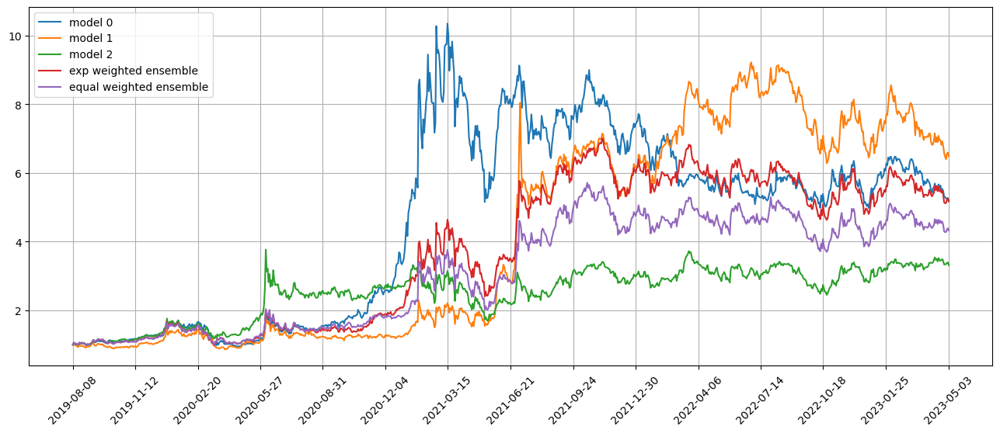

Standardization data are from 2021-09-28 to 2022-07-14
Training data are from 2022-07-15 to 2023-05-01
Testing data are from 2023-04-04 to 2023-05-30
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 48 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0721 - val_loss: 0.0735 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0719 - val_loss: 0.0735 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0717 - val_loss: 0.0735 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0715 - val_loss: 0.0740 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0712 - val_loss: 0.0732 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0710 - val_loss: 0.0740 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0691 - val_loss: 0.0745 - lr: 0.0025
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0745 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0741 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0747 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0689 - val_loss: 0.0749 - lr: 0.0025
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0688 - val_loss: 0.0745 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0688 - val_loss: 0.0752 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0687 - val_loss: 0.0749 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0688 - val_loss

position on 2023-05-08 market open will be {'GNRC': 0.674948465099941, 'VIAV': 0.6591123578160402, 'KNX': 0.6797121517316682, 'SBH': 0.6378055155659008, 'QRTEA': 0.7868231696635853, 'FTSM': 0.661044431232366, 'TNET': 0.6662996188825174, 'IBTX': 0.6616818088118323, 'BANC': 0.7095293066177335, 'AZPN': 0.6717216919248677}
Total asset on 2023-05-08 will be 6.808678517346429
It should be the same as 6.808678517346452
top_stocks by model 2 to buy on 2023-05-05 are ['AMCX', 'GNRC', 'ROG', 'CSGS', 'BIO', 'LABD', 'GBTC', 'FTSM', 'INSG', 'MLKN']
position on 2023-05-08 market open will be {'MLKN': 0.32920999209966173, 'GNRC': 0.342591597244119, 'ROG': 0.33710532247639596, 'INSG': 0.36395432998813554, 'BIO': 0.3227999002960526, 'GBTC': 0.3263345222716347, 'FTSM': 0.33553416187366664, 'AMCX': 0.3378799660945139, 'LABD': 0.32815573192984093, 'CSGS': 0.3325111318843475}
Total asset on 2023-05-08 will be 3.3560766561583155
It should be the same as 3.3560766561583684
top_stocks by return weighted ensem

position on 2023-05-11 market open will be {'SFIX': 0.5272075795611263, 'INFY': 0.5199908466691929, 'SATS': 0.510904557221369, 'MTCH': 0.522547427630225, 'WKHS': 0.543280966188426, 'CNO': 0.5038064813481025, 'MOS': 0.48926003362888065, 'BIL': 0.5226709628328822, 'TT': 0.5171465640687637, 'SGMO': 0.5264666969874945}
Total asset on 2023-05-11 will be 5.1832821161363665
It should be the same as 5.183282116136463
top_stocks by equal weighted ensemble to buy on 2023-05-10 are ['INFY', 'BIL', 'CNO', 'TT', 'SATS', 'MOS', 'WKHS', 'SFIX', 'SGMO', 'MTCH']
position on 2023-05-11 market open will be {'SFIX': 0.44143365985352234, 'INFY': 0.4353910517117286, 'SATS': 0.4277830541014129, 'MTCH': 0.43753169030284994, 'WKHS': 0.45489199042425527, 'CNO': 0.4218397981010679, 'MOS': 0.4096599814529283, 'BIL': 0.4376351269732314, 'TT': 0.43300951903533885, 'SGMO': 0.4408133150051569}
Total asset on 2023-05-11 will be 4.339989186961417
It should be the same as 4.339989186961492
Testing data from 2023-04-13 t

Testing data from 2023-04-18 to 2023-05-15 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-16 are ['ECL', 'COMM', 'SBH', 'HBI', 'FIZZ', 'WGO', 'INSG', 'IDEX', 'WHR', 'BIL']
position on 2023-05-17 market open will be {'IDEX': 0.5329424352219144, 'HBI': 0.5134167965285272, 'INSG': 0.5042512869167556, 'ECL': 0.5290310670639448, 'SBH': 0.5221705268491343, 'WGO': 0.5270348291722465, 'FIZZ': 0.5231572573278052, 'WHR': 0.5254411572716942, 'BIL': 0.5292720141016387, 'COMM': 0.5059385894256784}
Total asset on 2023-05-17 will be 5.212655959879273
It should be the same as 5.212655959879339
top_stocks by model 1 to buy on 2023-05-16 are ['FIZZ', 'WHR', 'MPW', 'FCPT', 'SMG', 'HBI', 'SATS', 'AMCX', 'KALU', 'NTAP']
position on 2023-05-17 market open will be {'HBI': 0.6501520114130538, 'SATS': 0.6709985536038671, 'FCPT': 0.6647145360239175, 'KALU': 0.6632228635431968, 'FIZZ': 0.6624865906935911, 'WHR': 0.6653787480059844, 'AMCX': 0.6344901010297832, 'NTAP': 0.670156669120176

top_stocks by model 0 to buy on 2023-05-19 are ['SFIX', 'SJNK', 'DPST', 'LEA', 'BIL', 'IEP', 'QRTEA', 'SHV', 'SNBR', 'XELA']
position on 2023-05-22 market open will be {'SNBR': 0.5198129930645387, 'BIL': 0.535845337208934, 'SFIX': 0.5321965139520917, 'SHV': 0.544341280748894, 'DPST': 0.5151692739522559, 'IEP': 0.5326403978287114, 'QRTEA': 0.44255509262883475, 'SJNK': 0.5451827185942285, 'LEA': 0.545291272402935, 'XELA': 0.4171767029190472}
Total asset on 2023-05-22 will be 5.130211583300405
It should be the same as 5.13021158330047
top_stocks by model 1 to buy on 2023-05-19 are ['TSLA', 'FN', 'SHOO', 'USHY', 'TM', 'JNK', 'SHYG', 'SJNK', 'SNBR', 'XELA']
position on 2023-05-22 market open will be {'SNBR': 0.6484380128052718, 'USHY': 0.6884860241725034, 'XELA': 0.5272417315556196, 'SHYG': 0.6888998034877101, 'FN': 0.6810437596833301, 'SHOO': 0.6562231112987946, 'JNK': 0.6891807696343663, 'SJNK': 0.6890199729623905, 'TSLA': 0.7016000017629704, 'TM': 0.685908938962521}
Total asset on 2023-0

position on 2023-05-25 market open will be {'BIL': 0.5362545561548101, 'XELA': 0.5165786314067283, 'IBM': 0.4912327446106772, 'KPTI': 0.4825053817825998, 'ASGN': 0.4938938514490277, 'AXON': 0.49748444378271267, 'FLS': 0.4921175697640186, 'PENN': 0.49708738264540486, 'AGCO': 0.4856332356401468, 'WIX': 0.5099432389392587}
Total asset on 2023-05-25 will be 5.002731036175315
It should be the same as 5.002731036175384
top_stocks by model 1 to buy on 2023-05-24 are ['DQ', 'GTN', 'AVNT', 'AGCO', 'MRCY', 'PBI', 'IBM', 'KPTI', 'PEGA', 'ASGN']
position on 2023-05-25 market open will be {'DQ': 0.6528937166605405, 'IBM': 0.6562319769625207, 'KPTI': 0.644573196831979, 'ASGN': 0.659786917915863, 'MRCY': 0.6588828758832102, 'PEGA': 0.6741221463469781, 'AVNT': 0.6665624108280915, 'AGCO': 0.6487516595731277, 'PBI': 0.6677778097882656, 'GTN': 0.6371535927688663}
Total asset on 2023-05-25 will be 6.566736303559412
It should be the same as 6.566736303559443
top_stocks by model 2 to buy on 2023-05-24 are [

Testing data from 2023-05-01 to 2023-05-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-05-30 are ['NMRK', 'R', 'FDS', 'WTM', 'BZUN', 'SBSW', 'VTNR', 'FTSM', 'IEP', 'XELA']
position on 2023-05-31 market open will be {'XELA': 0.5199623579532064, 'IEP': 0.5142600764825326, 'NMRK': 0.5027794466682751, 'VTNR': 0.5028369719511061, 'BZUN': 0.4826488205522025, 'FDS': 0.5113990008335654, 'WTM': 0.5233435375071412, 'FTSM': 0.5083365344926056, 'SBSW': 0.5056024449443557, 'R': 0.5117301653505076}
Total asset on 2023-05-31 will be 5.082899356735428
It should be the same as 5.082899356735497
top_stocks by model 1 to buy on 2023-05-30 are ['EW', 'SMG', 'UPS', 'STM', 'EC', 'VET', 'ARKW', 'VTNR', 'ARKK', 'XELA']
position on 2023-05-31 market open will be {'XELA': 0.6531122879589323, 'ARKK': 0.6525313872008477, 'EC': 0.6515337258447589, 'VTNR': 0.6524799509023705, 'UPS': 0.6514778524937662, 'STM': 0.6439834993738616, 'EW': 0.6590373511340195, 'SMG': 0.647508162512711, 'VET': 

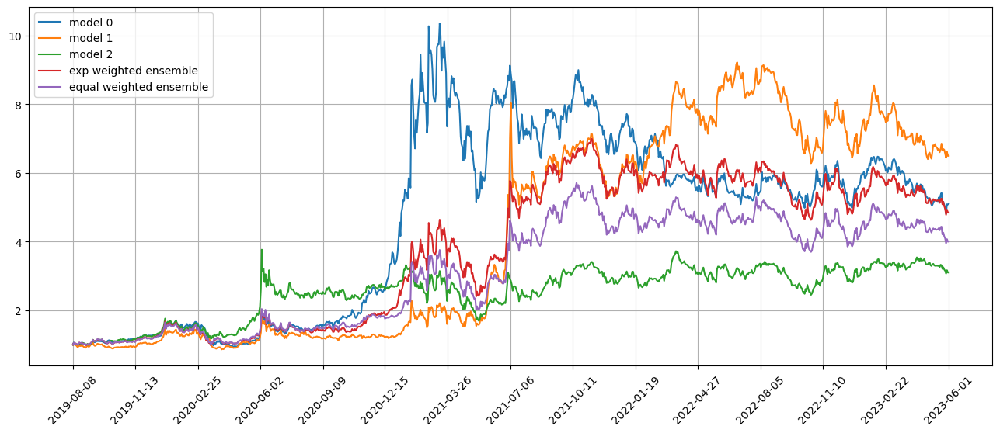

Standardization data are from 2021-10-26 to 2022-08-11
Training data are from 2022-08-12 to 2023-05-30
Testing data are from 2023-05-03 to 2023-06-28
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 49 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0748 - val_loss: 0.0625 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0745 - val_loss: 0.0615 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0618 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0740 - val_loss: 0.0624 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0739 - val_loss: 0.0623 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0736 - val_loss: 0.0616 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0712 - val_loss: 0.0636 - lr: 0.0050
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0710 - val_loss: 0.0633 - lr: 0.0025
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0629 - lr: 0.0025
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0629 - lr: 0.0025
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0634 - lr: 0.0025
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0707 - val_loss: 0.0637 - lr: 0.0025
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0706 - val_loss: 0.0630 - lr: 0.0012
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0705 - val_loss: 0.0633 - lr: 0.0012
Epoch 30/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0704 - val_loss

position on 2023-06-06 market open will be {'EGHT': 0.6369405922187067, 'MLKN': 0.6593942462587534, 'HBI': 0.6784592567414509, 'BDN': 0.671681843805545, 'SFIX': 0.5965351745805748, 'HPP': 0.6471775854502091, 'LPSN': 0.6664537711837498, 'ARKW': 0.6767466384421524, 'SMG': 0.6507042899432746, 'JWN': 0.6726449084004836}
Total asset on 2023-06-06 will be 6.556738307024871
It should be the same as 6.5567383070249
top_stocks by model 2 to buy on 2023-06-05 are ['JWN', 'HOUS', 'QRTEA', 'SGMO', 'LPSN', 'SMG', 'BDN', 'HPP', 'EGHT', 'AAP']
position on 2023-06-06 market open will be {'HOUS': 0.3047669424917289, 'BDN': 0.31957214309940063, 'HPP': 0.3079135305734036, 'EGHT': 0.3029698713064654, 'AAP': 0.31419042430047556, 'QRTEA': 0.30719677709432136, 'LPSN': 0.3170847357242653, 'SMG': 0.30959146265288606, 'JWN': 0.32003034904822303, 'SGMO': 0.3098278511931578}
Total asset on 2023-06-06 will be 3.1131440874842746
It should be the same as 3.1131440874843275
top_stocks by return weighted ensemble to b

position on 2023-06-09 market open will be {'SYNA': 0.32606524406683784, 'SPTL': 0.3283614360034447, 'VGLT': 0.3283380732680268, 'ZROZ': 0.3299803942740068, 'SPLB': 0.32787372324835307, 'TLT': 0.3285045718415364, 'CIEN': 0.3240944744297224, 'BLV': 0.3281025680516502, 'TRI': 0.3240586734587899, 'LQD': 0.327277974437626}
Total asset on 2023-06-09 will be 3.272657133079941
It should be the same as 3.2726571330799943
top_stocks by return weighted ensemble to buy on 2023-06-08 are ['SCHZ', 'MXL', 'TRI', 'SPR', 'ZROZ', 'VGLT', 'TLT', 'SPTL', 'SPLB', 'BLV']
position on 2023-06-09 market open will be {'SPR': 0.5267797375345198, 'MXL': 0.5108054775809623, 'SPTL': 0.5130366404971489, 'VGLT': 0.5130001382225897, 'SCHZ': 0.5107902597673843, 'ZROZ': 0.5155661242341658, 'TLT': 0.5132602779936927, 'SPLB': 0.5122746310588749, 'BLV': 0.5126321814780342, 'TRI': 0.5063139422788858}
Total asset on 2023-06-09 will be 5.13445941064615
It should be the same as 5.134459410646259
top_stocks by equal weighted e

position on 2023-06-14 market open will be {'XELA': 0.4192159295088413, 'MXL': 0.4295134597060229, 'IEUR': 0.4349888559209192, 'SIMO': 0.43171131145489433, 'IXUS': 0.4329212425453409, 'IDV': 0.4331317759612649, 'EPP': 0.4329569916081501, 'IDXX': 0.43905975083951776, 'EFG': 0.43179446138442495, 'CHRS': 0.4345176490209643}
Total asset on 2023-06-14 will be 4.31981142795026
It should be the same as 4.319811427950341
Testing data from 2023-05-16 to 2023-06-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-06-14 are ['CUBI', 'GEN', 'ANY', 'PPLT', 'NVRO', 'WTM', 'GDS', 'XELA', 'EGHT', 'CGC']
position on 2023-06-15 market open will be {'XELA': 0.5571830810519215, 'EGHT': 0.5246372768286484, 'CUBI': 0.5201995740020537, 'NVRO': 0.5501081915499507, 'GEN': 0.5358149071497782, 'ANY': 0.5554114946100167, 'WTM': 0.5498341281582635, 'PPLT': 0.5446013911304198, 'CGC': 0.5096476370013633, 'GDS': 0.5623673010739241}
Total asset on 2023-06-15 will be 5.409804982556264
It should b

Testing data from 2023-05-19 to 2023-06-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-06-20 are ['GDS', 'SMCI', 'SPTL', 'SGMO', 'TSE', 'RPD', 'GGB', 'BURL', 'PLCE', 'XELA']
position on 2023-06-21 market open will be {'XELA': 0.5131049898367589, 'RPD': 0.533498321287534, 'BURL': 0.5473506001415076, 'SPTL': 0.5436206249305303, 'PLCE': 0.5623790828176157, 'GGB': 0.5379699147297224, 'TSE': 0.5168752145022059, 'GDS': 0.5336461638184314, 'SMCI': 0.5299674771296907, 'SGMO': 0.5689819652168867}
Total asset on 2023-06-21 will be 5.387394354410808
It should be the same as 5.387394354410884
top_stocks by model 1 to buy on 2023-06-20 are ['BL', 'GDS', 'CGC', 'TRGP', 'CVX', 'TSE', 'GGB', 'APA', 'WMB', 'SGMO']
position on 2023-06-21 market open will be {'CGC': 0.6748128488171646, 'TRGP': 0.7144505763876308, 'CVX': 0.7078102962569701, 'BL': 0.7365943831816327, 'APA': 0.7139662269194712, 'WMB': 0.7256074755484615, 'GGB': 0.7145074665432154, 'TSE': 0.6864904336118779, 'GDS'

top_stocks by model 1 to buy on 2023-06-23 are ['TRIP', 'SCO', 'GDS', 'TZA', 'CMF', 'SRTY', 'VAC', 'TRUP', 'CPRI', 'UNH']
position on 2023-06-26 market open will be {'VAC': 0.680258204943947, 'CPRI': 0.7096221766360001, 'TRIP': 0.6897185770374136, 'SCO': 0.6807931252495281, 'CMF': 0.7029558906628287, 'TZA': 0.7076629805890697, 'SRTY': 0.7075467581429682, 'GDS': 0.7216680478103881, 'UNH': 0.7030465867503966, 'TRUP': 0.6847129927202533}
Total asset on 2023-06-26 will be 6.987985340542762
It should be the same as 6.987985340542792
top_stocks by model 2 to buy on 2023-06-23 are ['TWLO', 'CMCSA', 'CMF', 'GDS', 'HBI', 'BDN', 'RUN', 'UNH', 'FIVN', 'CHRS']
position on 2023-06-26 market open will be {'BDN': 0.3177472482820924, 'HBI': 0.3114587369802824, 'CMCSA': 0.3235154152749563, 'TWLO': 0.32003212187359703, 'CMF': 0.3237466761040193, 'CHRS': 0.3411926744121705, 'FIVN': 0.33534533303008635, 'RUN': 0.3205986414852844, 'GDS': 0.33236456914642093, 'UNH': 0.32378844623110087}
Total asset on 2023-

position on 2023-06-29 market open will be {'BR': 0.33966892799261517, 'SPLV': 0.3369034680346151, 'EWS': 0.33996275797085007, 'EFAV': 0.3374344020211565, 'EWG': 0.3374347173013281, 'EFV': 0.3378590333631095, 'EUFN': 0.3397821147484199, 'ERY': 0.3317244066154698, 'RMD': 0.3402803269207421, 'INTU': 0.34113258240760486}
Total asset on 2023-06-29 will be 3.3821827373758544
It should be the same as 3.382182737375911
top_stocks by return weighted ensemble to buy on 2023-06-28 are ['ZLAB', 'ACWV', 'EFV', 'SPLV', 'INTU', 'EUFN', 'EWG', 'BR', 'GGG', 'EFAV']
position on 2023-06-29 market open will be {'BR': 0.529619913411782, 'SPLV': 0.5253079421279924, 'ACWV': 0.5275217566535418, 'EFAV': 0.5261357870935042, 'EWG': 0.5261362786858855, 'EFV': 0.5267978824340647, 'EUFN': 0.5297963969075288, 'ZLAB': 0.5286714906307224, 'INTU': 0.5319020783690326, 'GGG': 0.5196662376581178}
Total asset on 2023-06-29 will be 5.271555763972061
It should be the same as 5.271555763972172
top_stocks by equal weighted en

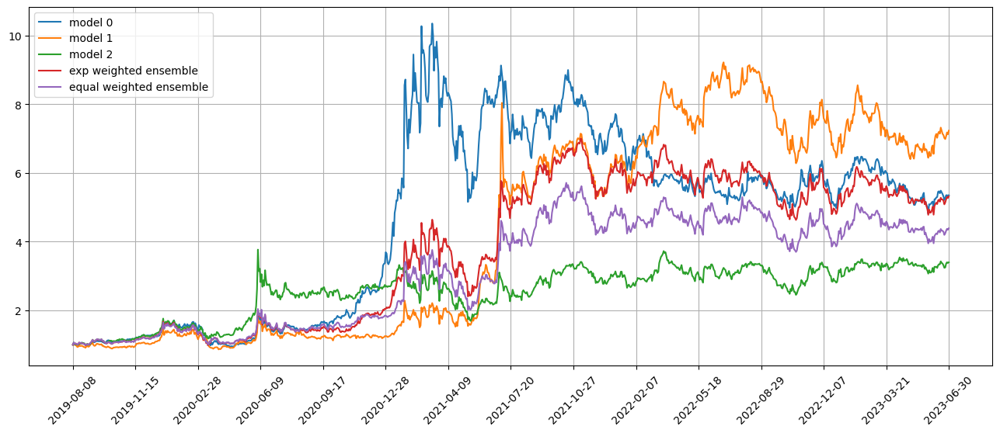

Standardization data are from 2021-11-23 to 2022-09-09
Training data are from 2022-09-12 to 2023-06-28
Testing data are from 2023-06-01 to 2023-07-27
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 50 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0749 - val_loss: 0.0594 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0745 - val_loss: 0.0592 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0743 - val_loss: 0.0594 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0742 - val_loss: 0.0598 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0740 - val_loss: 0.0599 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0738 - val_loss: 0.0593 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0724 - val_loss: 0.0593 - lr: 0.0100
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0722 - val_loss: 0.0596 - lr: 0.0100
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0724 - val_loss: 0.0590 - lr: 0.0100
Epoch 12/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0719 - val_loss: 0.0600 - lr: 0.0100
Epoch 13/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0719 - val_loss: 0.0594 - lr: 0.0100
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0721 - val_loss: 0.0591 - lr: 0.0100
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0718 - val_loss: 0.0598 - lr: 0.0100
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0719 - val_loss: 0.0595 - lr: 0.0100
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0712 - val_loss

position on 2023-07-05 market open will be {'PLCE': 0.4713219408624373, 'YANG': 0.4619257271722079, 'RIO': 0.4413162924726358, 'YINN': 0.4313686693857308, 'VFC': 0.44485373910574655, 'UVXY': 0.45668514462951926, 'PKX': 0.4506448706081832, 'TSE': 0.4618682637467553, 'IDEX': 0.5307070821147167, 'TNDM': 0.44346734100520313}
Total asset on 2023-07-05 will be 4.594159071103049
It should be the same as 4.594159071103136
Testing data from 2023-06-05 to 2023-07-03 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-07-05 are ['CIB', 'CABO', 'TZA', 'VFC', 'SBGI', 'CC', 'ENOV', 'VKTX', 'TSE', 'EPAM']
position on 2023-07-06 market open will be {'VFC': 0.5278005103675703, 'EPAM': 0.5521998808950264, 'VKTX': 0.5538373085027333, 'CIB': 0.5339242940404046, 'SBGI': 0.5324953937195214, 'CABO': 0.5429381967777877, 'CC': 0.5271016623016205, 'TSE': 0.5278706566341538, 'TZA': 0.5774466618287086, 'ENOV': 0.5368904972093816}
Total asset on 2023-07-06 will be 5.412505062276837
It should be

top_stocks by model 0 to buy on 2023-07-10 are ['DIN', 'LUMN', 'RPD', 'ITW', 'AMH', 'CIEN', 'XELA', 'WIT', 'PBR', 'PBR-A']
position on 2023-07-11 market open will be {'RPD': 0.5711951900353367, 'PBR-A': 0.5451100392234052, 'DIN': 0.565531959918321, 'AMH': 0.5547080025475161, 'ITW': 0.5636906718338471, 'PBR': 0.5453843544962166, 'CIEN': 0.559938967333829, 'WIT': 0.5503069559987497, 'XELA': 0.5620630844889961, 'LUMN': 0.5235250342848292}
Total asset on 2023-07-11 will be 5.541454260160976
It should be the same as 5.541454260161047
top_stocks by model 1 to buy on 2023-07-10 are ['SEE', 'UNP', 'PBR-A', 'PBR', 'VTRS', 'EBS', 'CIEN', 'LUMN', 'BAX', 'IFF']
position on 2023-07-11 market open will be {'EBS': 0.7207335625922413, 'PBR-A': 0.7308744903720111, 'VTRS': 0.7491546346962684, 'IFF': 0.741577609573942, 'SEE': 0.7447492085580057, 'PBR': 0.7312422877354625, 'CIEN': 0.7507568709843911, 'BAX': 0.7429979179780848, 'UNP': 0.7516017670835271, 'LUMN': 0.7019336741165734}
Total asset on 2023-07-1

top_stocks by model 1 to buy on 2023-07-13 are ['AMCX', 'SEE', 'LITE', 'BCE', 'PUK', 'SBSW', 'NKE', 'CPA', 'LEG', 'LUMN']
position on 2023-07-14 market open will be {'PUK': 0.806951969711407, 'NKE': 0.7999982089123708, 'BCE': 0.8136188623496868, 'CPA': 0.8584234313766691, 'SEE': 0.826513986818671, 'AMCX': 0.8114919284025166, 'SBSW': 0.8151096833408105, 'LEG': 0.8067671166025432, 'LITE': 0.8064645589980726, 'LUMN': 0.8162597531737816}
Total asset on 2023-07-14 will be 8.161599499686494
It should be the same as 8.16159949968653
top_stocks by model 2 to buy on 2023-07-13 are ['VXRT', 'CPA', 'EUFN', 'PUK', 'INO', 'BIL', 'ALL', 'MDGL', 'LUMN', 'LEG']
position on 2023-07-14 market open will be {'PUK': 0.3946607146466158, 'CPA': 0.41983416313820704, 'LEG': 0.3945703074566129, 'INO': 0.4251939746982943, 'VXRT': 0.38534677289527586, 'MDGL': 0.40264215137999665, 'EUFN': 0.3981611895741061, 'BIL': 0.3953989708497498, 'ALL': 0.39839552008601653, 'LUMN': 0.39921292668762537}
Total asset on 2023-07-

position on 2023-07-19 market open will be {'INSG': 0.8232854037433237, 'NYCB': 0.816078939433928, 'MRVL': 0.8132368622125868, 'CRM': 0.8304396859982206, 'GRPN': 0.874740380337431, 'SOXS': 0.7863475412328292, 'QTWO': 0.8080042615048986, 'AMD': 0.8315512983531298, 'TGTX': 0.8043305343746524, 'VSAT': 0.8141959134041141}
Total asset on 2023-07-19 will be 8.202210820595077
It should be the same as 8.202210820595115
top_stocks by model 2 to buy on 2023-07-18 are ['QTWO', 'LITE', 'MDGL', 'VIAV', 'CRM', 'TGTX', 'IDEX', 'GRPN', 'BIL', 'VSAT']
position on 2023-07-19 market open will be {'IDEX': 0.38937848874458025, 'VIAV': 0.38145371945867357, 'CRM': 0.39380919678225995, 'MDGL': 0.37956902430212436, 'GRPN': 0.4148173701014939, 'QTWO': 0.3831699214102456, 'BIL': 0.3821871107910156, 'TGTX': 0.38142777498498126, 'LITE': 0.39577472763935595, 'VSAT': 0.3861061123248868}
Total asset on 2023-07-19 will be 3.88769344653956
It should be the same as 3.8876934465396173
top_stocks by return weighted ensemb

top_stocks by model 2 to buy on 2023-07-21 are ['SABR', 'VIRT', 'BLDP', 'PRKS', 'ALLY', 'MRIN', 'MU', 'CGC', 'SBSW', 'INSG']
position on 2023-07-24 market open will be {'INSG': 0.3938045070672238, 'SABR': 0.3998562451491857, 'MU': 0.39616888395975935, 'PRKS': 0.3977899542781548, 'MRIN': 0.3740599352999443, 'BLDP': 0.3890085203164112, 'VIRT': 0.39574459233312126, 'SBSW': 0.39737988595853413, 'ALLY': 0.391004345696806, 'CGC': 0.3927389401041771}
Total asset on 2023-07-24 will be 3.92755581016326
It should be the same as 3.9275558101633177
top_stocks by return weighted ensemble to buy on 2023-07-21 are ['MNRO', 'MRIN', 'RBC', 'ALLY', 'WKHS', 'VIRT', 'BLDP', 'SBSW', 'CGC', 'INSG']
position on 2023-07-24 market open will be {'INSG': 0.6241563174514884, 'WKHS': 0.5909695862308105, 'MRIN': 0.587233198112988, 'BLDP': 0.6107008420867933, 'VIRT': 0.6212757386202062, 'MNRO': 0.6171665294218782, 'ALLY': 0.6138340697072935, 'SBSW': 0.6238429708065001, 'RBC': 0.6240792029806101, 'CGC': 0.61655719326

position on 2023-07-27 market open will be {'TSE': 0.6285346729079457, 'LGF-A': 0.6664629780861825, 'INSG': 0.6252443205117707, 'DORM': 0.6105230769182405, 'DIN': 0.6132149970283625, 'EWH': 0.6213639035042309, 'WB': 0.6245013642309623, 'SON': 0.6104583128992843, 'IRBT': 0.5973854635630956, 'LUMN': 0.631916768235733}
Total asset on 2023-07-27 will be 6.229605857885697
It should be the same as 6.229605857885809
top_stocks by equal weighted ensemble to buy on 2023-07-26 are ['WB', 'LGF-A', 'IRBT', 'DIN', 'INSG', 'LUMN', 'SON', 'EWH', 'DORM', 'TSE']
position on 2023-07-27 market open will be {'TSE': 0.5216426008277657, 'LGF-A': 0.5531206092988472, 'INSG': 0.5189118239023821, 'DORM': 0.5066941561641491, 'DIN': 0.5089282734976733, 'EWH': 0.5156913320069321, 'WB': 0.5182952188631895, 'SON': 0.5066404062713517, 'IRBT': 0.4957907977741641, 'LUMN': 0.5244495183759609}
Total asset on 2023-07-27 will be 5.1701647369823265
It should be the same as 5.170164736982415
Testing data from 2023-06-28 to 2

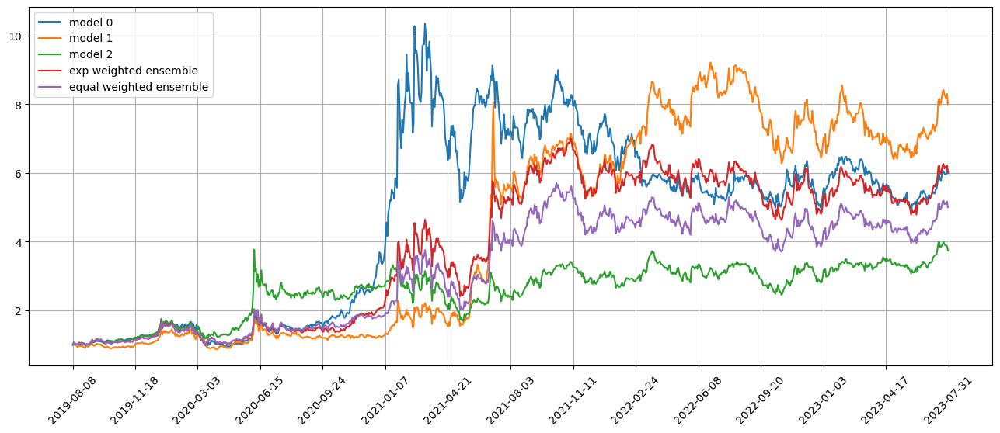

Standardization data are from 2021-12-22 to 2022-10-07
Training data are from 2022-10-10 to 2023-07-27
Testing data are from 2023-06-30 to 2023-08-24
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 51 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0692 - val_loss: 0.0512 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0512 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0689 - val_loss: 0.0509 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0689 - val_loss: 0.0514 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0689 - val_loss: 0.0515 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0687 - val_loss: 0.0510 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0682 - val_loss: 0.0511 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0684 - val_loss: 0.0509 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0682 - val_loss: 0.0511 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0680 - val_loss: 0.0513 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0676 - val_loss: 0.0516 - lr: 0.0050
Epoch 8/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0675 - val_loss: 0.0513 - lr: 0.0050
Epoch 9/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0675 - val_loss: 0.0514 - lr: 0.0050
Epoch 10/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0673 - val_loss: 0.0513 - lr: 0.0050
Epoch 11/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0672 - val_loss: 0.05

position on 2023-08-02 market open will be {'VIXY': 0.5319593187547381, 'RIO': 0.4972312366855777, 'UVXY': 0.545310129681637, 'LW': 0.5048052624516839, 'FFIV': 0.5087950282398249, 'FELE': 0.49634205515927476, 'SOXS': 0.5135146195448631, 'TOON': 0.5137273915517114, 'BANC': 0.4982981136846649, 'GDS': 0.4796758117028561}
Total asset on 2023-08-02 will be 5.089658967456742
It should be the same as 5.089658967456833
Testing data from 2023-07-05 to 2023-08-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-02 are ['TDY', 'VICR', 'WKHS', 'TNET', 'KALU', 'MRIN', 'TRUP', 'RUN', 'TSEM', 'SIMO']
position on 2023-08-03 market open will be {'SIMO': 0.6199328960882807, 'KALU': 0.6040736282229423, 'WKHS': 0.595325391692223, 'MRIN': 0.6275222682493503, 'RUN': 0.6645327559185911, 'TSEM': 0.5986542397352747, 'TNET': 0.6066269135103061, 'VICR': 0.5584387024601408, 'TDY': 0.601352966391195, 'TRUP': 0.6050004422989721}
Total asset on 2023-08-03 will be 6.081460204567199
It should

Testing data from 2023-07-10 to 2023-08-04 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-07 are ['VFC', 'CBU', 'BDN', 'MNRO', 'LUMN', 'WKHS', 'SIMO', 'CGC', 'CSGS', 'HPP']
position on 2023-08-08 market open will be {'BDN': 0.6073140077448379, 'HPP': 0.6308340010496973, 'VFC': 0.5862838301712352, 'SIMO': 0.589007118143021, 'CBU': 0.6022210724777697, 'CSGS': 0.6057493324711454, 'WKHS': 0.5442599824198331, 'MNRO': 0.594744390699494, 'CGC': 0.5935121749361439, 'LUMN': 0.606206847405413}
Total asset on 2023-08-08 will be 5.9601327575185135
It should be the same as 5.960132757518591
top_stocks by model 1 to buy on 2023-08-07 are ['CWST', 'AON', 'HAS', 'NUS', 'LEG', 'HPP', 'MNRO', 'CBU', 'WKHS', 'CGC']
position on 2023-08-08 market open will be {'WKHS': 0.7214086116960595, 'HPP': 0.8599398340502569, 'CWST': 0.8199468800733615, 'CBU': 0.8209352829212875, 'NUS': 0.8394942186069022, 'MNRO': 0.8107432253008067, 'HAS': 0.8376267541962198, 'LEG': 0.8075195995992525, 'CG

top_stocks by model 0 to buy on 2023-08-10 are ['UVXY', 'GGB', 'TREE', 'ECPG', 'KN', 'TOON', 'VIXY', 'TFLO', 'SAGE', 'CSGS']
position on 2023-08-11 market open will be {'TFLO': 0.6258247732519543, 'VIXY': 0.6616684398499256, 'SAGE': 0.6451267562904863, 'UVXY': 0.6798329851340388, 'KN': 0.6149120796963752, 'ECPG': 0.6178527514360912, 'GGB': 0.6184954194705864, 'TOON': 0.6102446884783816, 'TREE': 0.6087914357453703, 'CSGS': 0.6242080892156013}
Total asset on 2023-08-11 will be 6.306957418568732
It should be the same as 6.306957418568811
top_stocks by model 1 to buy on 2023-08-10 are ['NUS', 'CGC', 'GGB', 'LNTH', 'SBH', 'UVXY', 'NICE', 'LNC', 'ECPG', 'FWRD']
position on 2023-08-11 market open will be {'CGC': 0.7390605304039468, 'SBH': 0.8078857391896683, 'UVXY': 0.9168287268043792, 'NUS': 0.845993531392528, 'NICE': 0.8409257549354915, 'LNTH': 0.8343248010834516, 'ECPG': 0.8332416399890443, 'LNC': 0.8195009531833461, 'GGB': 0.8341083477374305, 'FWRD': 0.7000228113463884}
Total asset on 202

position on 2023-08-16 market open will be {'TFLO': 0.8040474268935407, 'TRP': 0.7874577268802251, 'PLCE': 0.784179542309062, 'RIG': 0.7962600502561141, 'CHGG': 0.7800459963611996, 'THG': 0.8035280666178158, 'HE': 0.5987253505923373, 'SLG': 0.7963780174619068, 'CGC': 0.7877215579663316, 'CVNA': 0.7672802378207545}
Total asset on 2023-08-16 will be 7.705623973159242
It should be the same as 7.705623973159288
top_stocks by model 2 to buy on 2023-08-15 are ['RIG', 'PLCE', 'BMY', 'TFLO', 'STX', 'PPBI', 'AMAT', 'CHGG', 'CSGS', 'CGC']
position on 2023-08-16 market open will be {'TFLO': 0.3673563153052489, 'STX': 0.3547471777760461, 'PPBI': 0.3610570248752104, 'BMY': 0.3662219548826, 'CSGS': 0.3640661706743947, 'RIG': 0.3637983883823661, 'CHGG': 0.3563904483830939, 'AMAT': 0.36543201656487306, 'CGC': 0.35989728881917815, 'PLCE': 0.358278998930937}
Total asset on 2023-08-16 will be 3.6172457845938903
It should be the same as 3.6172457845939485
top_stocks by return weighted ensemble to buy on 2

top_stocks by model 2 to buy on 2023-08-18 are ['ORI', 'JELD', 'DELL', 'DORM', 'COMM', 'WBA', 'AIZ', 'ALGN', 'SWBI', 'IMAX']
position on 2023-08-21 market open will be {'IMAX': 0.3748255564106397, 'DORM': 0.36788779838764146, 'WBA': 0.3632431716657123, 'JELD': 0.37124722469825694, 'ORI': 0.36826706273165727, 'DELL': 0.36883941103116397, 'AIZ': 0.363756712462484, 'ALGN': 0.3708439427178038, 'COMM': 0.37510592914003865, 'SWBI': 0.3673002509831179}
Total asset on 2023-08-21 will be 3.6913170602284575
It should be the same as 3.691317060228516
top_stocks by return weighted ensemble to buy on 2023-08-18 are ['JELD', 'SXT', 'G', 'BANC', 'ZBRA', 'ALGN', 'WWW', 'IMAX', 'SWBI', 'COMM']
position on 2023-08-21 market open will be {'IMAX': 0.6037806848842444, 'G': 0.5935628534224288, 'ZBRA': 0.6074154526245701, 'JELD': 0.5980165966701566, 'WWW': 0.5937470321417435, 'ALGN': 0.5973669774907944, 'COMM': 0.6042323180124665, 'BANC': 0.596643480165213, 'SXT': 0.5919330080481623, 'SWBI': 0.59165868843207

position on 2023-08-24 market open will be {'TDS': 0.36933786538503965, 'VFC': 0.3935169517597103, 'SBGI': 0.35623063999814, 'UVXY': 0.3540281211344541, 'CYRX': 0.3709538338123176, 'URI': 0.3791311412753388, 'QRTEA': 0.3742819250207122, 'EBS': 0.37677715530473316, 'COMM': 0.3658946628341233, 'SRNE': 0.3672641594054852}
Total asset on 2023-08-24 will be 3.707416455929995
It should be the same as 3.7074164559300544
top_stocks by return weighted ensemble to buy on 2023-08-23 are ['VRNT', 'SSTK', 'URI', 'TDS', 'CYRX', 'COMM', 'EBS', 'SBGI', 'QRTEA', 'SRNE']
position on 2023-08-24 market open will be {'VRNT': 0.6240592443411578, 'SRNE': 0.5904689894311688, 'SBGI': 0.5727298474880221, 'TDS': 0.593723993093383, 'CYRX': 0.5964010638319464, 'URI': 0.609548130732714, 'QRTEA': 0.6017518028088632, 'EBS': 0.6057635095503784, 'COMM': 0.5882671811800437, 'SSTK': 0.6167602201584571}
Total asset on 2023-08-24 will be 5.999473982616017
It should be the same as 5.999473982616133
top_stocks by equal weigh

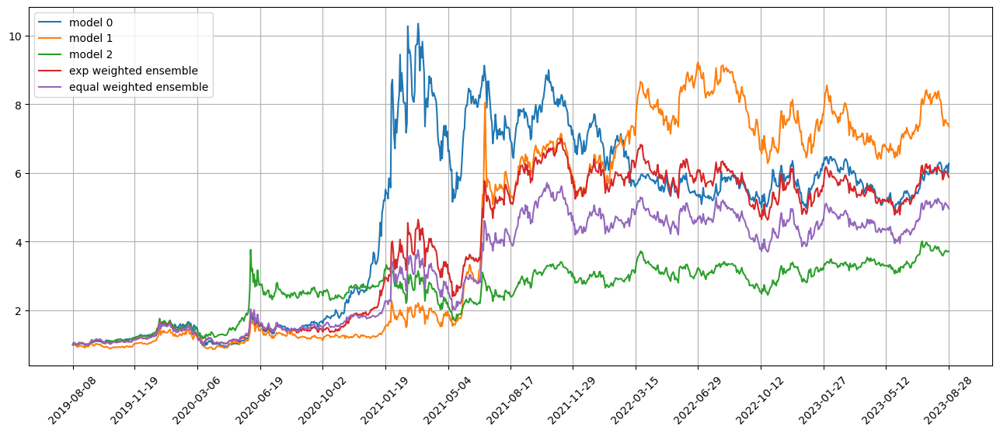

Standardization data are from 2022-01-21 to 2022-11-04
Training data are from 2022-11-07 to 2023-08-24
Testing data are from 2023-07-31 to 2023-09-22
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 52 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0647 - val_loss: 0.0564 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0646 - val_loss: 0.0562 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0643 - val_loss: 0.0563 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0643 - val_loss: 0.0563 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0642 - val_loss: 0.0570 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0642 - val_loss: 0.0564 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0631 - val_loss: 0.0565 - lr: 0.0012
Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.06171558432231706
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.04290647151876598
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06087309464402953
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.04333349616418486
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.06227160366183642
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.04260344918370728
Correlations between old and new weights
0.9815431557802454
0.8095343088876216
0.9723419268607327
0.6068919810814448
0.9106513251332057
0.6911273217246365
Weight of model 0 is 0.326294927781615
Weight of model 1 is 0.30705486000043114
Weight of model 2 is 0.36665021221795385
Testing data from 2023-07-31 to 2023-08

Testing data from 2023-08-03 to 2023-08-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-08-31 are ['HZO', 'BMO', 'VRNT', 'ATUS', 'APAM', 'SGH', 'LPSN', 'VICR', 'QCOM', 'SMTC']
position on 2023-09-01 market open will be {'HZO': 0.6735460482385194, 'SGH': 0.6748380273542434, 'APAM': 0.6753601813099089, 'SMTC': 0.6868719681830611, 'BMO': 0.6714038440734792, 'VRNT': 0.6437714500973902, 'QCOM': 0.6840565016102077, 'LPSN': 0.699105445515897, 'VICR': 0.658519902348187, 'ATUS': 0.6437539883504109}
Total asset on 2023-09-01 will be 6.711227357081222
It should be the same as 6.711227357081306
top_stocks by model 1 to buy on 2023-08-31 are ['MHK', 'EWT', 'HZO', 'SMTC', 'EBS', 'SGH', 'LPSN', 'ATUS', 'AAP', 'ERIE']
position on 2023-09-01 market open will be {'HZO': 0.7884960573910398, 'SGH': 0.7900085307277095, 'MHK': 0.7888992143229709, 'SMTC': 0.8040962310760599, 'AAP': 0.7920163021706826, 'EBS': 0.8033780967244993, 'EWT': 0.7822478419456879, 'LPSN': 0.8184175216104642,

top_stocks by model 1 to buy on 2023-09-06 are ['INGN', 'FNKO', 'EXPRQ', 'M', 'FL', 'MRIN', 'TGI', 'NGVT', 'TSE', 'HZO']
position on 2023-09-07 market open will be {'FNKO': 0.7608891499570236, 'HZO': 0.7572975990020961, 'INGN': 0.7472801864122133, 'FL': 0.7541330227836756, 'MRIN': 0.8372475484846548, 'TGI': 0.7440425411932824, 'NGVT': 0.7554782989198402, 'TSE': 0.7209632193774084, 'EXPRQ': 0.7038692256748372, 'M': 0.7565405386527864}
Total asset on 2023-09-07 will be 7.537741330457762
It should be the same as 7.537741330457817
top_stocks by model 2 to buy on 2023-09-06 are ['DBI', 'SSTK', 'EXPRQ', 'LPSN', 'FL', 'TGI', 'SMTC', 'MRIN', 'WOLF', 'TSE']
position on 2023-09-07 market open will be {'DBI': 0.48404402384952017, 'SMTC': 0.3436687575191013, 'MRIN': 0.421171742593675, 'FL': 0.3793615399986539, 'TGI': 0.3742855911675978, 'TSE': 0.36267569370696634, 'LPSN': 0.3603358519350378, 'EXPRQ': 0.3540766752582081, 'WOLF': 0.3625642750963622, 'SSTK': 0.3798009713986573}
Total asset on 2023-09

position on 2023-09-12 market open will be {'INSG': 0.7064662284747769, 'CRI': 0.7425852273826153, 'EVTC': 0.7408569983770097, 'GNL': 0.7503526195476095, 'TDS': 0.7415249001664782, 'CC': 0.7315415199978428, 'CYH': 0.7289139375763535, 'SMG': 0.7355961300363597, 'CMP': 0.7360455550126348, 'SGMO': 0.7753644000359388}
Total asset on 2023-09-12 will be 7.389247516607561
It should be the same as 7.38924751660762
top_stocks by model 2 to buy on 2023-09-11 are ['PEGA', 'IFF', 'CMP', 'CIEN', 'SMG', 'PLCE', 'GNL', 'HE', 'SGMO', 'EVTC']
position on 2023-09-12 market open will be {'HE': 0.3880607004109901, 'SGMO': 0.373611624713824, 'GNL': 0.37147146411700954, 'EVTC': 0.36677053790305186, 'PEGA': 0.35682564424235375, 'IFF': 0.3622578887775477, 'CIEN': 0.3729342427293164, 'SMG': 0.3641660791271149, 'CMP': 0.364388572591652, 'PLCE': 0.3762687894095837}
Total asset on 2023-09-12 will be 3.6967555440223863
It should be the same as 3.6967555440224444
top_stocks by return weighted ensemble to buy on 202

top_stocks by model 2 to buy on 2023-09-14 are ['APPS', 'CCK', 'NNDM', 'MMM', 'MAN', 'MRCY', 'PLCE', 'XRX', 'CGC', 'HE']
position on 2023-09-15 market open will be {'XRX': 0.3615236901634746, 'MAN': 0.36645551347747174, 'NNDM': 0.3796208656487036, 'MRCY': 0.3771738333280877, 'CCK': 0.37965898181540647, 'HE': 0.3683548153592297, 'MMM': 0.3792457699342589, 'APPS': 0.38962598476078747, 'CGC': 0.4929669106656411, 'PLCE': 0.4058985857746942}
Total asset on 2023-09-15 will be 3.9005249509276974
It should be the same as 3.9005249509277555
top_stocks by return weighted ensemble to buy on 2023-09-14 are ['APPS', 'TRUP', 'DG', 'NNDM', 'ETSY', 'XRX', 'GME', 'MAN', 'MRCY', 'PLCE']
position on 2023-09-15 market open will be {'MAN': 0.5740724912344456, 'NNDM': 0.5895812921819635, 'MRCY': 0.5857808570421973, 'XRX': 0.5970301785578142, 'PLCE': 0.630392674246021, 'ETSY': 0.5705392836040963, 'APPS': 0.6051200351445158, 'GME': 0.6057999656551564, 'TRUP': 0.6196271599372001, 'DG': 0.5731960315430502}
Tota

position on 2023-09-20 market open will be {'GDDY': 0.3823721318236197, 'XRX': 0.39313437330830775, 'ABT': 0.3841570102487251, 'BAX': 0.3911583813447864, 'HE': 0.392865772521314, 'PDM': 0.38987672011566066, 'SGMO': 0.37160662587476395, 'TOON': 0.38227777863483364, 'MMM': 0.381220428300817, 'CSGS': 0.38810394189133535}
Total asset on 2023-09-20 will be 3.8567731640641054
It should be the same as 3.856773164064163
top_stocks by return weighted ensemble to buy on 2023-09-19 are ['MCY', 'BAX', 'MGNX', 'HE', 'TSE', 'ABT', 'TOON', 'SGMO', 'CGC', 'CSGS']
position on 2023-09-20 market open will be {'MGNX': 0.5879909089120685, 'CSGS': 0.5890519898258744, 'ABT': 0.5830614607772484, 'BAX': 0.5936879222234942, 'HE': 0.5962793469975984, 'TSE': 0.5821511245591356, 'TOON': 0.58020922197722, 'MCY': 0.5870379191113346, 'CGC': 0.5292355770967799, 'SGMO': 0.5640128810268493}
Total asset on 2023-09-20 will be 5.792718352507491
It should be the same as 5.792718352507603
top_stocks by equal weighted ensembl

position on 2023-09-25 market open will be {'PZZA': 0.5497536783158155, 'EHTH': 0.5502417672106005, 'KMPR': 0.549485145159241, 'INSG': 0.54689563253939, 'DPZ': 0.559164022925986, 'IOVA': 0.5361471969873405, 'JBLU': 0.5531758532957157, 'CATY': 0.5512172830984661, 'BX': 0.5578041007849055, 'PLCE': 0.5166260603705276}
Total asset on 2023-09-25 will be 5.470510740687874
It should be the same as 5.470510740687988
top_stocks by equal weighted ensemble to buy on 2023-09-22 are ['JBLU', 'BX', 'IOVA', 'EHTH', 'DPZ', 'CATY', 'PZZA', 'KMPR', 'INSG', 'PLCE']
position on 2023-09-25 market open will be {'PZZA': 0.4661805816843118, 'EHTH': 0.4665944717115356, 'KMPR': 0.4659528707147064, 'INSG': 0.4637570136481394, 'DPZ': 0.4741603735388358, 'IOVA': 0.4546425463230617, 'JBLU': 0.4690825204719572, 'CATY': 0.4674216904860251, 'BX': 0.4730071856298136, 'PLCE': 0.438088996647789}
Total asset on 2023-09-25 will be 4.638888250856079
It should be the same as 4.6388882508561755
Testing data from 2023-08-25 to

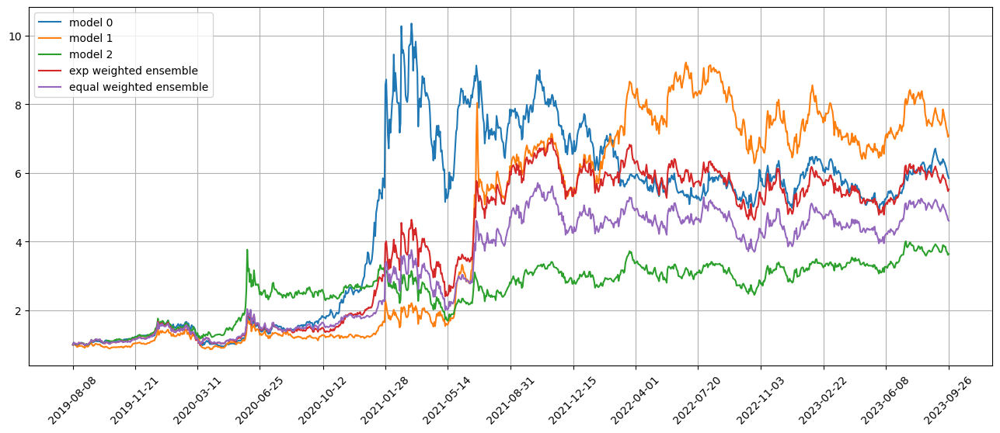

Standardization data are from 2022-02-18 to 2022-12-05
Training data are from 2022-12-06 to 2023-09-22
Testing data are from 2023-08-28 to 2023-10-20
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 53 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0623 - val_loss: 0.0487 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0621 - val_loss: 0.0490 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0619 - val_loss: 0.0482 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0620 - val_loss: 0.0484 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0622 - val_loss: 0.0498 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0618 - val_loss: 0.0484 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0487 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0607 - val_loss: 0.0491 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0605 - val_loss: 0.0489 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0605 - val_loss: 0.0491 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0605 - val_loss: 0.0488 - lr: 0.0010
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0605 - val_loss: 0.0489 - lr: 0.0010
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0604 - val_loss: 0.0490 - lr: 0.0010
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0604 - val_loss: 0.0487 - lr: 0.0010
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0604 - val_loss

top_stocks by model 1 to buy on 2023-09-28 are ['UE', 'PCRX', 'HQY', 'HLNE', 'URBN', 'ARCB', 'WW', 'PTCT', 'USFR', 'CSGS']
position on 2023-09-29 market open will be {'HQY': 0.6684679328446268, 'WW': 0.6763787136079279, 'PCRX': 0.6836074405178739, 'USFR': 0.6794337330859509, 'URBN': 0.6923090052064034, 'UE': 0.6900706503228798, 'ARCB': 0.701044049209332, 'PTCT': 0.6724050593365916, 'HLNE': 0.6849300641775744, 'CSGS': 0.6800928554701972}
Total asset on 2023-09-29 will be 6.828739503779303
It should be the same as 6.8287395037793575
top_stocks by model 2 to buy on 2023-09-28 are ['FLS', 'ESPR', 'PTCT', 'FTI', 'GPRO', 'SIMO', 'XELA', 'USFR', 'INSG', 'CSGS']
position on 2023-09-29 market open will be {'XELA': 0.4225351511800698, 'ESPR': 0.35267434399287834, 'FTI': 0.35023092274928946, 'GPRO': 0.354076241079678, 'INSG': 0.34761967481508327, 'SIMO': 0.3640761679967805, 'USFR': 0.35631015839756147, 'FLS': 0.36179739421548196, 'PTCT': 0.3526241655847168, 'CSGS': 0.3566558168329581}
Total asset

position on 2023-10-04 market open will be {'XELA': 0.37656486738554, 'INSG': 0.32843948690653385, 'SATS': 0.32078621946543756, 'VLO': 0.3304135847829144, 'AAP': 0.34453960676787876, 'MPC': 0.3366798149397898, 'WLY': 0.33347274361505286, 'CGC': 0.3414945892260896, 'TRUP': 0.33290892321766746, 'SRNE': 0.34486144559064535}
Total asset on 2023-10-04 will be 3.3901612818974964
It should be the same as 3.3901612818975497
top_stocks by return weighted ensemble to buy on 2023-10-03 are ['ELS', 'PDI', 'WLY', 'AAP', 'SATS', 'ARR', 'IDEX', 'MPC', 'INSG', 'CGC']
position on 2023-10-04 market open will be {'INSG': 0.498483217547694, 'SATS': 0.486867606359395, 'AAP': 0.5229188894791589, 'MPC': 0.5109898295581885, 'WLY': 0.5061223538234124, 'ELS': 0.5250149634110062, 'IDEX': 0.4977043395397562, 'CGC': 0.5182973680049393, 'ARR': 0.4915995081185067, 'PDI': 0.5280529703541521}
Total asset on 2023-10-04 will be 5.086051046196093
It should be the same as 5.086051046196208
top_stocks by equal weighted ens

position on 2023-10-09 market open will be {'DORM': 0.42214285804547264, 'MTN': 0.42967354346215975, 'RILY': 0.424160311883596, 'MRIN': 0.422868792356293, 'CATY': 0.4277164869095331, 'ENR': 0.423752243222237, 'ASR': 0.4489918935614435, 'IGF': 0.427601660426224, 'SXT': 0.4217407583619846, 'CDE': 0.4469182283903808}
Total asset on 2023-10-09 will be 4.295566776619223
It should be the same as 4.295566776619324
Testing data from 2023-09-11 to 2023-10-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-09 are ['FIBK', 'TDS', 'PFSI', 'SIRI', 'VFC', 'SGMO', 'ARR', 'CBRL', 'INSG', 'HBI']
position on 2023-10-10 market open will be {'HBI': 0.5711543056567023, 'SIRI': 0.5896639053448787, 'CBRL': 0.5801176530368097, 'INSG': 0.5575554059686225, 'VFC': 0.5597880616035396, 'TDS': 0.5983849895846639, 'FIBK': 0.5767768649979569, 'PFSI': 0.5839794594295797, 'ARR': 0.5941599828820189, 'SGMO': 0.5219168523579718}
Total asset on 2023-10-10 will be 5.733497480862653
It should be th

top_stocks by model 0 to buy on 2023-10-12 are ['ENR', 'PB', 'HPP', 'PDM', 'MRIN', 'DORM', 'HIW', 'BDN', 'CATY', 'SXT']
position on 2023-10-13 market open will be {'HPP': 0.5656909203402218, 'MRIN': 0.6361897488057253, 'HIW': 0.5877113020306849, 'CATY': 0.5833650514598697, 'ENR': 0.5732125287536212, 'SXT': 0.5522240062195022, 'BDN': 0.5730978563117564, 'PB': 0.5656008134590951, 'DORM': 0.5824745623343698, 'PDM': 0.5741630675271002}
Total asset on 2023-10-13 will be 5.793729857241856
It should be the same as 5.793729857241946
top_stocks by model 1 to buy on 2023-10-12 are ['EXPRQ', 'VIXY', 'CATY', 'CFG', 'DORM', 'H', 'ENR', 'UVXY', 'RCKT', 'MRIN']
position on 2023-10-13 market open will be {'CATY': 0.6618504109906507, 'ENR': 0.6503319778776159, 'VIXY': 0.6738325252499838, 'DORM': 0.6650726378932167, 'H': 0.6464605346302053, 'RCKT': 0.639029551695965, 'UVXY': 0.682952885523913, 'MRIN': 0.7152375482877559, 'EXPRQ': 0.6462876374372543, 'CFG': 0.6509479472996433}
Total asset on 2023-10-13 w

position on 2023-10-18 market open will be {'GRPN': 0.647163156884018, 'HPP': 0.6551979002030851, 'HSIC': 0.6536641698999229, 'BANC': 0.6698498989400783, 'AUB': 0.6724430798104901, 'ENR': 0.6689669684387395, 'MORN': 0.6564638784035188, 'VVV': 0.6633438347591447, 'CGC': 0.6416050914778594, 'SRNE': 0.6575049329325185}
Total asset on 2023-10-18 will be 6.5862029117493215
It should be the same as 6.586202911749375
top_stocks by model 2 to buy on 2023-10-17 are ['KRC', 'BXP', 'BDN', 'SLG', 'PDM', 'HIW', 'G', 'TFC', 'SRNE', 'HPP']
position on 2023-10-18 market open will be {'BDN': 0.35339098051829826, 'HPP': 0.347144131387527, 'G': 0.3493248579018241, 'HIW': 0.3526278280354315, 'TFC': 0.35946637909036866, 'PDM': 0.35428210424041917, 'BXP': 0.3554506205872286, 'KRC': 0.34939544925662974, 'SLG': 0.34994950150424975, 'SRNE': 0.3483664687495569}
Total asset on 2023-10-18 will be 3.519398321271479
It should be the same as 3.5193983212715336
top_stocks by return weighted ensemble to buy on 2023-10

position on 2023-10-23 market open will be {'GNL': 0.5053051729195479, 'JBGS': 0.5056849881258895, 'FN': 0.5077293632748866, 'HIW': 0.5065251787995517, 'CATY': 0.5041762745046791, 'NTCT': 0.5055587004352381, 'KRC': 0.5077418351799784, 'KWR': 0.5054091946120455, 'NYMT': 0.5114960420071135, 'SRNE': 0.5187373075220412}
Total asset on 2023-10-23 will be 5.078364057380851
It should be the same as 5.078364057380972
top_stocks by equal weighted ensemble to buy on 2023-10-20 are ['NYMT', 'GNL', 'KRC', 'JBGS', 'CATY', 'KWR', 'FN', 'HIW', 'SRNE', 'NTCT']
position on 2023-10-23 market open will be {'GNL': 0.4254780118647605, 'JBGS': 0.42579782457899906, 'FN': 0.4275192331861489, 'HIW': 0.42650528350990946, 'CATY': 0.42452745469872066, 'NTCT': 0.4256914875802487, 'KRC': 0.4275297348031261, 'KWR': 0.4255656004058771, 'NYMT': 0.43069085909502586, 'SRNE': 0.4367881631001974}
Total asset on 2023-10-23 will be 4.276093652822913
It should be the same as 4.276093652823014
Testing data from 2023-09-25 to 

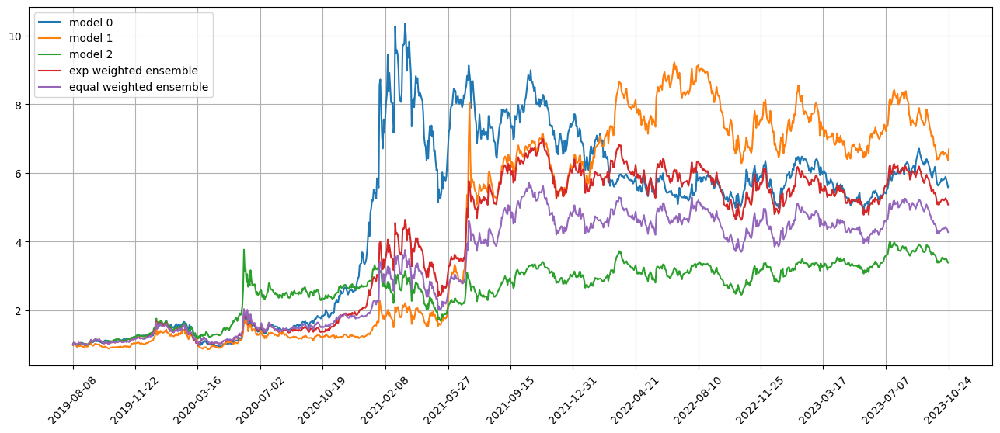

Standardization data are from 2022-03-21 to 2023-01-04
Training data are from 2023-01-05 to 2023-10-20
Testing data are from 2023-09-26 to 2023-11-17
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 54 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0609 - val_loss: 0.0474 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0467 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0607 - val_loss: 0.0470 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0608 - val_loss: 0.0484 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0475 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0470 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05800243052026216
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.07743728235811911
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.058168539348384674
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.09827235166378849
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.057874224516344795
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.07906773127949696
Correlations between old and new weights
0.9833757494778786
0.8136791871832584
0.9687716990190259
0.023630377944317417
0.9160312563181823
0.9567613516504236
Weight of model 0 is 0.34518896409305216
Weight of model 1 is 0.3283089415520006
Weight of model 2 is 0.3265020943549472
Testing data from 2023-09-26 to 2023-10-23 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-24 are ['VSAT', 'TVTX', 'TPIC', 'BOH', 'BDC'

Testing data from 2023-09-29 to 2023-10-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-10-27 are ['FTSM', 'LW', 'NVCR', 'GVI', 'WAFD', 'UNFI', 'NEP', 'FHN', 'DPST', 'IEP']
position on 2023-10-30 market open will be {'DPST': 0.561095788098117, 'IEP': 0.5487244874833156, 'FHN': 0.5597968955602314, 'NEP': 0.6584222739335448, 'UNFI': 0.5413472782617234, 'LW': 0.5608571757350879, 'WAFD': 0.5581066286748684, 'FTSM': 0.5571067640369545, 'NVCR': 0.5404608953032305, 'GVI': 0.5555297044841829}
Total asset on 2023-10-30 will be 5.64144789157117
It should be the same as 5.641447891571256
top_stocks by model 1 to buy on 2023-10-27 are ['EG', 'VRNT', 'FTSM', 'PRG', 'EEFT', 'SEIC', 'TRU', 'ONB', 'JAZZ', 'CBU']
position on 2023-10-30 market open will be {'TRU': 0.6626942333307855, 'ONB': 0.6774106995496356, 'PRG': 0.6509133259300843, 'CBU': 0.671620804876823, 'SEIC': 0.6822818445642554, 'EEFT': 0.6656089400774915, 'JAZZ': 0.6682810160940469, 'VRNT': 0.6611460860240164, 'FTS

position on 2023-11-02 market open will be {'DPST': 0.6068890440607391, 'IEP': 0.527458600025409, 'FHN': 0.5771917105146986, 'NEP': 0.6560470493898353, 'ELF': 0.6528297204179132, 'AEHR': 0.5896320158164868, 'NWL': 0.5622623922701584, 'OZK': 0.5725954537729531, 'FMC': 0.536005392516667, 'NTCT': 0.5833325137632388}
Total asset on 2023-11-02 will be 5.8642438925480125
It should be the same as 5.8642438925480995
top_stocks by model 1 to buy on 2023-11-01 are ['WK', 'WHR', 'IGT', 'NWL', 'WEN', 'AON', 'SNY', 'PAR', 'HUBG', 'LPLA']
position on 2023-11-02 market open will be {'IGT': 0.6833904277048544, 'NWL': 0.6663792154004033, 'LPLA': 0.649717328402762, 'WK': 0.6787894387886734, 'WEN': 0.6784699194118503, 'SNY': 0.6905215159885149, 'HUBG': 0.6672573132593888, 'WHR': 0.6801161288042283, 'PAR': 0.692010240357934, 'AON': 0.6732984951291378}
Total asset on 2023-11-02 will be 6.759950023247688
It should be the same as 6.759950023247747
top_stocks by model 2 to buy on 2023-11-01 are ['KNSL', 'FMC'

position on 2023-11-07 market open will be {'DPST': 0.7142973221253762, 'IEP': 0.6411988638473216, 'FHN': 0.6056559577374334, 'SGH': 0.6255950150825206, 'ELF': 0.6228148708690813, 'BDC': 0.5941075161304293, 'HAS': 0.5795235553298205, 'PAYC': 0.6045867795263884, 'NEP': 0.593229599756747, 'GVI': 0.6005534283020065}
Total asset on 2023-11-07 will be 6.181562908707038
It should be the same as 6.181562908707126
top_stocks by model 1 to buy on 2023-11-06 are ['AMN', 'SHV', 'GBIL', 'OI', 'BIL', 'SLAB', 'PAYC', 'YUMC', 'GVI', 'FOXF']
position on 2023-11-07 market open will be {'SHV': 0.6917136554064466, 'YUMC': 0.6748049126951783, 'AMN': 0.6662031353253768, 'SLAB': 0.6903791963709505, 'GBIL': 0.6917266759715384, 'FOXF': 0.6842798505306095, 'PAYC': 0.6969884341830059, 'BIL': 0.6916637039736949, 'OI': 0.66346353734374, 'GVI': 0.6923386481645386}
Total asset on 2023-11-07 will be 6.843561749965019
It should be the same as 6.84356174996508
top_stocks by model 2 to buy on 2023-11-06 are ['YUMC', 'I

Testing data from 2023-10-12 to 2023-11-08 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-09 are ['FTSM', 'FIBK', 'FMC', 'UI', 'NTCT', 'HUBG', 'PETS', 'FHN', 'DPST', 'IEP']
position on 2023-11-10 market open will be {'DPST': 0.6438066128814374, 'IEP': 0.6121999319917008, 'FHN': 0.5887882705742346, 'FMC': 0.5627148750448695, 'UI': 0.5842344214597559, 'FIBK': 0.5858398711472806, 'HUBG': 0.5884463717981592, 'NTCT': 0.5811432069957335, 'PETS': 0.6027483877897345, 'FTSM': 0.5979217390414124}
Total asset on 2023-11-10 will be 5.947843688724233
It should be the same as 5.947843688724318
top_stocks by model 1 to buy on 2023-11-09 are ['HUBG', 'BAX', 'THS', 'GPRO', 'INFY', 'TREE', 'RDFN', 'PETS', 'UI', 'CDNA']
position on 2023-11-10 market open will be {'INFY': 0.683717128450193, 'GPRO': 0.6457725900168756, 'UI': 0.6738820863557754, 'CDNA': 0.6318036556104987, 'HUBG': 0.6787403380736018, 'PETS': 0.6952369223580667, 'BAX': 0.6702584575621561, 'RDFN': 0.611248523481480

Testing data from 2023-10-17 to 2023-11-13 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-14 are ['HPP', 'SLAB', 'PDI', 'IVW', 'FHN', 'FOXF', 'NTCT', 'DPST', 'GVI', 'IEP']
position on 2023-11-15 market open will be {'DPST': 0.78748935519091, 'IEP': 0.6305659201183681, 'FHN': 0.649933686810504, 'HPP': 0.6539084226565736, 'PDI': 0.6267122857357368, 'IVW': 0.6300897867518632, 'SLAB': 0.6464760699140193, 'NTCT': 0.6449342333366435, 'FOXF': 0.6543833085854867, 'GVI': 0.6253700877951006}
Total asset on 2023-11-15 will be 6.54986315689512
It should be the same as 6.5498631568952055
top_stocks by model 1 to buy on 2023-11-14 are ['INFY', 'CNK', 'GNW', 'MS', 'G', 'DOX', 'SLAB', 'BDX', 'PDI', 'NTCT']
position on 2023-11-15 market open will be {'GNW': 0.7088922383214157, 'INFY': 0.7011029188812676, 'G': 0.714625882785756, 'DOX': 0.6908921161418254, 'SLAB': 0.7146679495802336, 'MS': 0.7090704834872127, 'NTCT': 0.7129634763033069, 'BDX': 0.682033016560883, 'CNK': 0.67953

position on 2023-11-20 market open will be {'DPST': 0.8228633454488956, 'IEP': 0.5571019676116995, 'FHN': 0.6462438928109725, 'KPTI': 0.721136911602101, 'GVI': 0.6525226858001859, 'SEDG': 0.6684382886675386, 'FWRD': 0.660318162856923, 'PETS': 0.645815821478923, 'COMM': 0.728667202537537, 'SRNE': 0.6543133900800397}
Total asset on 2023-11-20 will be 6.757421668894728
It should be the same as 6.757421668894815
top_stocks by model 1 to buy on 2023-11-17 are ['GNRC', 'VYX', 'POOL', 'MKSI', 'BLDP', 'KPTI', 'NVMI', 'FSLR', 'JKS', 'CSIQ']
position on 2023-11-20 market open will be {'GNRC': 0.702025690144727, 'MKSI': 0.7187008871604426, 'KPTI': 0.7804166810062266, 'CSIQ': 0.6965420041163259, 'VYX': 0.7346887738131294, 'POOL': 0.7023240536153004, 'BLDP': 0.7023117733135057, 'FSLR': 0.702570139038627, 'JKS': 0.6696036800210828, 'NVMI': 0.7188790904814156}
Total asset on 2023-11-20 will be 7.1280627727107255
It should be the same as 7.128062772710783
top_stocks by model 2 to buy on 2023-11-17 are

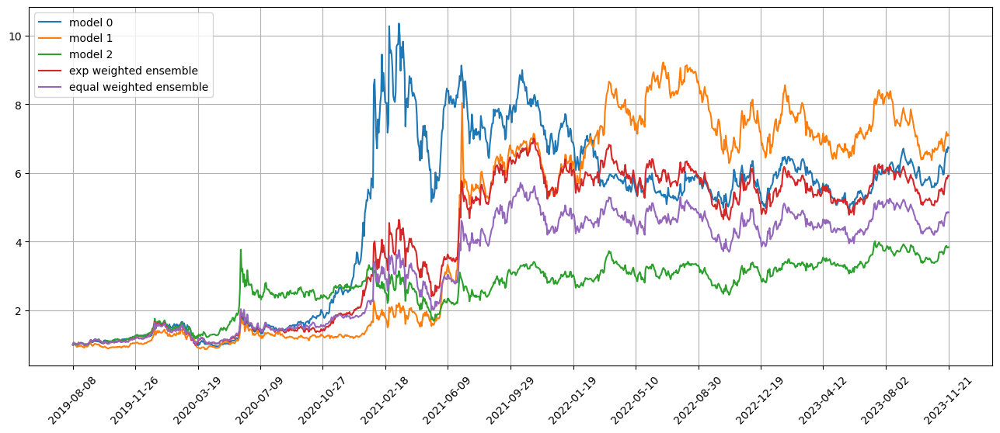

Standardization data are from 2022-04-19 to 2023-02-02
Training data are from 2023-02-03 to 2023-11-17
Testing data are from 2023-10-24 to 2023-12-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 55 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0589 - val_loss: 0.0654 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0587 - val_loss: 0.0685 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0587 - val_loss: 0.0654 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0586 - val_loss: 0.0668 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0593 - val_loss: 0.0685 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0591 - val_loss: 0.0690 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0580 - val_loss: 0.0701 - lr: 0.0050
Epoch 14/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0578 - val_loss: 0.0695 - lr: 0.0050
Epoch 15/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0577 - val_loss: 0.0719 - lr: 0.0050
Epoch 16/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0580 - val_loss: 0.0709 - lr: 0.0050
Epoch 17/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0577 - val_loss: 0.0690 - lr: 0.0050
Epoch 18/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0575 - val_loss: 0.0698 - lr: 0.0025
Epoch 19/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0715 - lr: 0.0025
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0575 - val_loss: 0.0698 - lr: 0.0025
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0575 - val_loss

Testing data from 2023-10-26 to 2023-11-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-11-24 are ['WAL', 'VFC', 'SRNE', 'ALGN', 'XELA', 'MRIN', 'MXL', 'HAS', 'VUZI', 'IVW']
position on 2023-11-27 market open will be {'WAL': 0.6850284621981461, 'IVW': 0.6648950122015286, 'MXL': 0.6682720112807561, 'VFC': 0.6584860984978608, 'ALGN': 0.6641278865589839, 'MRIN': 0.6652869911594368, 'VUZI': 0.6468919042401352, 'HAS': 0.6667398778735315, 'XELA': 0.673927073927904, 'SRNE': 0.6652869911594368}
Total asset on 2023-11-27 will be 6.6589423090976325
It should be the same as 6.65894230909772
top_stocks by model 1 to buy on 2023-11-24 are ['HUN', 'FMC', 'TSCO', 'MTZ', 'EW', 'HAS', 'VUZI', 'PEN', 'MAT', 'MXL']
position on 2023-11-27 market open will be {'TSCO': 0.6823588283414537, 'MXL': 0.6876357211578285, 'PEN': 0.6850678197182802, 'MAT': 0.6904847573821888, 'FMC': 0.6739099882102715, 'HUN': 0.689783612400055, 'VUZI': 0.6656361086121334, 'HAS': 0.6860591929737919, 'EW': 

top_stocks by model 1 to buy on 2023-11-29 are ['IPGP', 'DAN', 'CACC', 'USFR', 'BMA', 'SAVE', 'DORM', 'FTSL', 'PETS', 'IVW']
position on 2023-11-30 market open will be {'DAN': 0.6969533543819083, 'CACC': 0.7163345013493853, 'DORM': 0.6869300915988186, 'FTSL': 0.6991573606694843, 'USFR': 0.6978938422730172, 'IVW': 0.6943221929667455, 'BMA': 0.7219769943714816, 'SAVE': 0.7392093361016349, 'PETS': 0.6889022248808384, 'IPGP': 0.6968986474968795}
Total asset on 2023-11-30 will be 7.038578546090134
It should be the same as 7.038578546090193
top_stocks by model 2 to buy on 2023-11-29 are ['FTSL', 'USFR', 'CACC', 'JBLU', 'LAZ', 'SGMO', 'SNBR', 'DORM', 'SAVE', 'PETS']
position on 2023-11-30 market open will be {'CACC': 0.39789499711201914, 'DORM': 0.3815620304452694, 'FTSL': 0.3883537865067124, 'USFR': 0.3876519528692619, 'JBLU': 0.3935984189747102, 'SAVE': 0.4106010475542901, 'PETS': 0.3826574711438196, 'LAZ': 0.3940844356022701, 'SNBR': 0.42917622001318073, 'SGMO': 0.39710636209153494}
Total 

top_stocks by model 2 to buy on 2023-12-04 are ['CYRX', 'QRTEA', 'MKL', 'TOON', 'IRBT', 'INSG', 'PZZA', 'RGR', 'SGMO', 'IVW']
position on 2023-12-05 market open will be {'PZZA': 0.44747099880135915, 'INSG': 0.4558113671651117, 'IVW': 0.43612695497068443, 'CYRX': 0.46017129831141806, 'QRTEA': 0.4890587841136438, 'MKL': 0.43348703684988193, 'RGR': 0.4422578714765762, 'TOON': 0.44845044560969977, 'IRBT': 0.42745740905747737, 'SGMO': 0.48730382038500664}
Total asset on 2023-12-05 will be 4.527595986740803
It should be the same as 4.5275959867408595
top_stocks by return weighted ensemble to buy on 2023-12-04 are ['ATRA', 'TOON', 'INSG', 'FTNT', 'MKL', 'PZZA', 'IRBT', 'SGMO', 'RGR', 'IVW']
position on 2023-12-05 market open will be {'PZZA': 0.6771497362478072, 'INSG': 0.6897710642285099, 'FTNT': 0.6633267720944602, 'IVW': 0.6599830007308648, 'MKL': 0.6559880605805406, 'RGR': 0.6692608053395269, 'TOON': 0.6786319153157538, 'ATRA': 0.7561671544715276, 'IRBT': 0.6468635343425582, 'SGMO': 0.7374

position on 2023-12-08 market open will be {'AB': 0.7187894303949828, 'SLB': 0.6858080965733696, 'PTEN': 0.7000394556455545, 'PUMP': 0.706959044579651, 'SSRM': 0.6883979175199735, 'CLB': 0.7121988362603523, 'FRO': 0.6954490520258275, 'TNK': 0.6937679544338005, 'SNBR': 0.7498005561411845, 'IRBT': 0.7163986604321113}
Total asset on 2023-12-08 will be 7.06760900400668
It should be the same as 7.067609004006807
top_stocks by equal weighted ensemble to buy on 2023-12-07 are ['TNK', 'SSRM', 'AB', 'SNBR', 'SLB', 'FRO', 'PUMP', 'PTEN', 'IRBT', 'CLB']
position on 2023-12-08 market open will be {'AB': 0.5905971444865133, 'SLB': 0.5634978567775978, 'PUMP': 0.580876645289872, 'PTEN': 0.5751911283739483, 'SSRM': 0.5656257968823307, 'CLB': 0.5851819478909772, 'FRO': 0.5714193989143741, 'TNK': 0.5700381161694279, 'SNBR': 0.6160776002897582, 'IRBT': 0.5886327556773734}
Total asset on 2023-12-08 will be 5.807138390752064
It should be the same as 5.807138390752173
Testing data from 2023-11-09 to 2023-12

top_stocks by model 0 to buy on 2023-12-13 are ['INSW', 'WOR', 'EG', 'VUZI', 'ACGL', 'FRO', 'WAL', 'MRIN', 'XELA', 'ALT']
position on 2023-12-14 market open will be {'WAL': 0.8935153995896764, 'XELA': 0.7513214303077126, 'MRIN': 0.8076337316527301, 'WOR': 0.7667480569796741, 'VUZI': 0.7776413976957733, 'INSW': 0.7422966153087078, 'FRO': 0.7467589175654811, 'ALT': 0.7930599359038134, 'ACGL': 0.7030552922639874, 'EG': 0.7008464131899068}
Total asset on 2023-12-14 will be 7.682877190457375
It should be the same as 7.682877190457463
top_stocks by model 1 to buy on 2023-12-13 are ['EBS', 'RILY', 'SILJ', 'FRO', 'EG', 'MRIN', 'VUZI', 'TV', 'CSIQ', 'ALT']
position on 2023-12-14 market open will be {'RILY': 0.6663711162473938, 'CSIQ': 0.8516052067482225, 'TV': 0.8087558777493629, 'SILJ': 0.8520000614792399, 'MRIN': 0.8621849778642802, 'VUZI': 0.8301668256062517, 'EBS': 0.8669388754993143, 'FRO': 0.7971984026640323, 'ALT': 0.8466268018338353, 'EG': 0.7481847594525955}
Total asset on 2023-12-14 w

position on 2023-12-19 market open will be {'WAL': 0.9048616160654478, 'XELA': 0.712682028132997, 'BLDR': 0.7593631613134749, 'RILY': 0.8898743748585826, 'ASR': 0.7890786662481895, 'ECPG': 0.7819257617265736, 'ANY': 0.9039334595721549, 'FIX': 0.7769521598499339, 'VNET': 0.8052799341261482, 'RMBS': 0.7680568112559256}
Total asset on 2023-12-19 will be 8.09200797314934
It should be the same as 8.092007973149428
top_stocks by model 1 to buy on 2023-12-18 are ['DOC', 'GDOT', 'ECPG', 'NTCT', 'RMBS', 'ASR', 'SEE', 'RILY', 'GGAL', 'FIX']
position on 2023-12-19 market open will be {'GDOT': 0.8570867107338499, 'RILY': 0.9690001029922225, 'SEE': 0.8557963470558096, 'GGAL': 0.8595489661056122, 'ASR': 0.8592418553292682, 'NTCT': 0.8345557458492617, 'ECPG': 0.8514529298202707, 'DOC': 0.8397837394798627, 'FIX': 0.8460370858912082, 'RMBS': 0.8363507819057545}
Total asset on 2023-12-19 will be 8.608854265163055
It should be the same as 8.608854265163119
top_stocks by model 2 to buy on 2023-12-18 are [

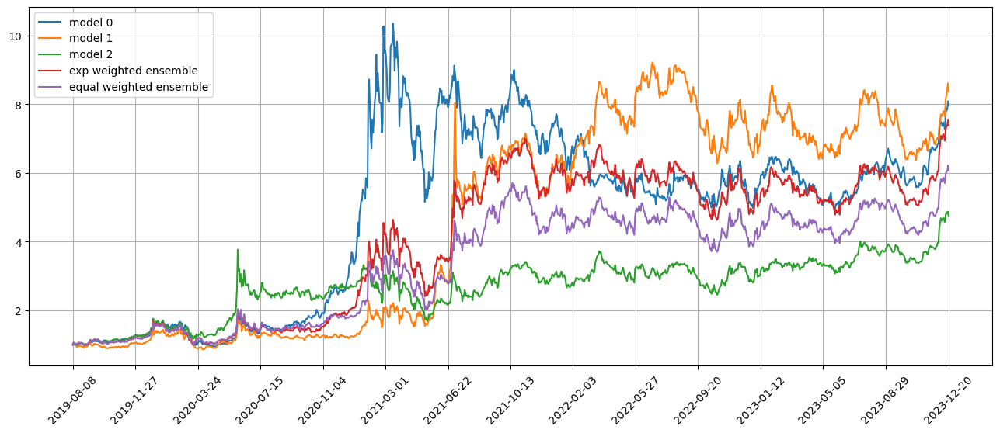

Standardization data are from 2022-05-17 to 2023-03-03
Training data are from 2023-03-06 to 2023-12-18
Testing data are from 2023-11-21 to 2024-01-18
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 56 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0535 - val_loss: 0.0700 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0534 - val_loss: 0.0716 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0533 - val_loss: 0.0716 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0533 - val_loss: 0.0706 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0532 - val_loss: 0.0774 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0531 - val_loss: 0.0754 - lr: 0.0100
Epoch 7/500
305/305 [

Epoch 21: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05656033119025673
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.04645951423160707
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.056519160396618015
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.046478122111931384
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05642997406979104
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.046549853527377616
Correlations between old and new weights
0.9925801876621125
0.2453830069594426
0.9609019271346022
0.07633450923181959
0.9739330941024834
0.9431948707649709
Weight of model 0 is 0.3807963282702936
Weight of model 1 is 0.27346656181930384
Weight of model 2 is 0.3457371099104027
Testing data from 2023-11-21 to 2023-12-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2023-12-20 are ['NOV', 'NOK

position on 2023-12-26 market open will be {'BLNK': 0.8668079862955731, 'ZION': 0.7466709792218902, 'SEDG': 0.7334903342667519, 'FMC': 0.7485392528741655, 'SFBS': 0.750295442195947, 'GBCI': 0.737924511666493, 'TFC': 0.7429327251697084, 'ECPG': 0.7377594831196538, 'DOC': 0.7539635303895986, 'FFIN': 0.7452514464963624}
Total asset on 2023-12-26 will be 7.563635691696011
It should be the same as 7.5636356916961445
top_stocks by equal weighted ensemble to buy on 2023-12-22 are ['BLNK', 'FMC', 'FFIN', 'GBCI', 'TFC', 'ECPG', 'DOC', 'SFBS', 'SEDG', 'ZION']
position on 2023-12-26 market open will be {'BLNK': 0.7127349199701872, 'ZION': 0.6139519813310852, 'SEDG': 0.604486150858394, 'FMC': 0.616888308676425, 'SFBS': 0.6183356244401202, 'GBCI': 0.6081404578115622, 'TFC': 0.6122678410391301, 'ECPG': 0.6080044540138294, 'DOC': 0.6213585797670043, 'FFIN': 0.6141787522866021}
Total asset on 2023-12-26 will be 6.2303470701942265
It should be the same as 6.230347070194339
Testing data from 2023-11-27 

top_stocks by model 0 to buy on 2023-12-29 are ['CRK', 'CBRL', 'PII', 'SIGI', 'INSW', 'FRO', 'ALK', 'NAT', 'FTSM', 'DHT']
position on 2024-01-02 market open will be {'CBRL': 0.7965781747296998, 'CRK': 0.8238748032533583, 'SIGI': 0.8170051310460515, 'DHT': 0.8301711116599284, 'INSW': 0.8463189205983881, 'FTSM': 0.8197968501732368, 'FRO': 0.8295619537612305, 'PII': 0.8089509149853348, 'ALK': 0.8013608315750367, 'NAT': 0.8279651745052902}
Total asset on 2024-01-02 will be 8.201583866287468
It should be the same as 8.201583866287557
top_stocks by model 1 to buy on 2023-12-29 are ['FSLR', 'EEFT', 'IVW', 'KN', 'MAN', 'CSGS', 'ALK', 'SEDG', 'ECPG', 'FTSM']
position on 2024-01-02 market open will be {'SEDG': 0.8170645288791976, 'IVW': 0.8364318023082429, 'KN': 0.8250739324865083, 'MAN': 0.8430083648959815, 'EEFT': 0.8382782387759716, 'ECPG': 0.8282755660826522, 'FTSM': 0.84747600885089, 'FSLR': 0.8358276596980637, 'ALK': 0.8284175269142958, 'CSGS': 0.8367956898778248}
Total asset on 2024-01-02

top_stocks by model 0 to buy on 2024-01-04 are ['NTES', 'BLNK', 'VET', 'UUUU', 'VTNR', 'IEP', 'ALB', 'SQM', 'TPL', 'DBI']
position on 2024-01-05 market open will be {'IEP': 0.8490439019430541, 'VTNR': 0.8525068721350199, 'DBI': 0.8104706766104777, 'BLNK': 0.7785534430892792, 'SQM': 0.7888546797980269, 'ALB': 0.7907989510906346, 'TPL': 0.8028880014059929, 'UUUU': 0.833529246705841, 'NTES': 0.8167038762498966, 'VET': 0.8021014576602216}
Total asset on 2024-01-05 will be 8.12545110668835
It should be the same as 8.125451106688445
top_stocks by model 1 to buy on 2024-01-04 are ['DORM', 'SQM', 'BBY', 'IVW', 'SSYS', 'MXL', 'FMC', 'DBI', 'THRM', 'ALB']
position on 2024-01-05 market open will be {'IVW': 0.8201260264875275, 'SSYS': 0.8239524771021857, 'MXL': 0.821989346071264, 'DORM': 0.8138560532001224, 'DBI': 0.8093930593730971, 'THRM': 0.8084939764883637, 'BBY': 0.8243983950407318, 'SQM': 0.7878058036014275, 'FMC': 0.8007319461416079, 'ALB': 0.789747489753919}
Total asset on 2024-01-05 will 

top_stocks by model 0 to buy on 2024-01-09 are ['FIX', 'MMS', 'PAYC', 'FMC', 'G', 'SEDG', 'IEP', 'SEE', 'MODG', 'ALK']
position on 2024-01-10 market open will be {'IEP': 0.8045076010960913, 'MMS': 0.8253648924802685, 'G': 0.827298040647963, 'SEDG': 0.8308234887428307, 'FMC': 0.8071402586899722, 'SEE': 0.8145655790836543, 'MODG': 0.8386891898272628, 'FIX': 0.8321963331394099, 'ALK': 0.7977652224015749, 'PAYC': 0.83234794684502}
Total asset on 2024-01-10 will be 8.210698552953954
It should be the same as 8.210698552954048
top_stocks by model 1 to buy on 2024-01-09 are ['TRIP', 'PARR', 'VC', 'G', 'FIX', 'VMI', 'SEDG', 'MODG', 'ALK', 'SEE']
position on 2024-01-10 market open will be {'TRIP': 0.7636513521713778, 'G': 0.8115825275676103, 'SEDG': 0.8150410055707737, 'SEE': 0.7990919342979519, 'VC': 0.8063173389651129, 'MODG': 0.822757288280926, 'PARR': 0.8094655445898525, 'VMI': 0.8158635452530582, 'FIX': 0.8163877711505159, 'ALK': 0.7826107204304559}
Total asset on 2024-01-10 will be 8.04276

position on 2024-01-16 market open will be {'FWRD': 0.8111133344052017, 'NG': 0.8306091635353268, 'VTNR': 0.8089125702469566, 'ATSG': 0.8045293269155466, 'SEDG': 0.763544059337067, 'IEP': 0.8377679799644097, 'EXK': 0.8424137570624667, 'AHT': 0.788100152166467, 'GRFS': 0.8051432564713477, 'ECPG': 0.7973245424137423}
Total asset on 2024-01-16 will be 8.089458142518437
It should be the same as 8.089458142518533
top_stocks by model 1 to buy on 2024-01-12 are ['GOGO', 'VTNR', 'GNL', 'EXK', 'ECPG', 'FWRD', 'ATSG', 'RILY', 'GRFS', 'IEP']
position on 2024-01-16 market open will be {'IEP': 0.8159039192459671, 'FWRD': 0.7891151564223338, 'GNL': 0.7804261442573498, 'VTNR': 0.788950229889521, 'ATSG': 0.7846751562150917, 'RILY': 0.7802109721796148, 'EXK': 0.8216246745845753, 'GRFS': 0.7852739352203892, 'ECPG': 0.7776481713491407, 'GOGO': 0.7852049107592356}
Total asset on 2024-01-16 will be 7.909033270123169
It should be the same as 7.909033270123219
top_stocks by model 2 to buy on 2024-01-12 are [

top_stocks by model 1 to buy on 2024-01-18 are ['TTD', 'ALK', 'HDB', 'PARR', 'IEP', 'HAS', 'YPF', 'BIL', 'SAVE', 'RILY']
position on 2024-01-19 market open will be {'RILY': 0.728787194160672, 'SAVE': 0.833545440572234, 'IEP': 0.7837937580713964, 'PARR': 0.7942815937880989, 'HAS': 0.7896371319255179, 'ALK': 0.8168803082743782, 'BIL': 0.7883202308386333, 'YPF': 0.800225047798551, 'TTD': 0.7832350379491587, 'HDB': 0.7728284145583207}
Total asset on 2024-01-19 will be 7.891534157936911
It should be the same as 7.891534157936961
top_stocks by model 2 to buy on 2024-01-18 are ['UUP', 'HDB', 'HAS', 'AMRC', 'SGMO', 'TVTX', 'PSEC', 'BIL', 'SAVE', 'RILY']
position on 2024-01-19 market open will be {'RILY': 0.4147522098538405, 'HDB': 0.428520957082743, 'AMRC': 0.43762278473873123, 'TVTX': 0.41562965501108157, 'UUP': 0.43685803703005005, 'SAVE': 0.5402415922882552, 'HAS': 0.4378411211939981, 'BIL': 0.43711092066888213, 'PSEC': 0.4421742357742297, 'SGMO': 0.447178665558865}
Total asset on 2024-01-1

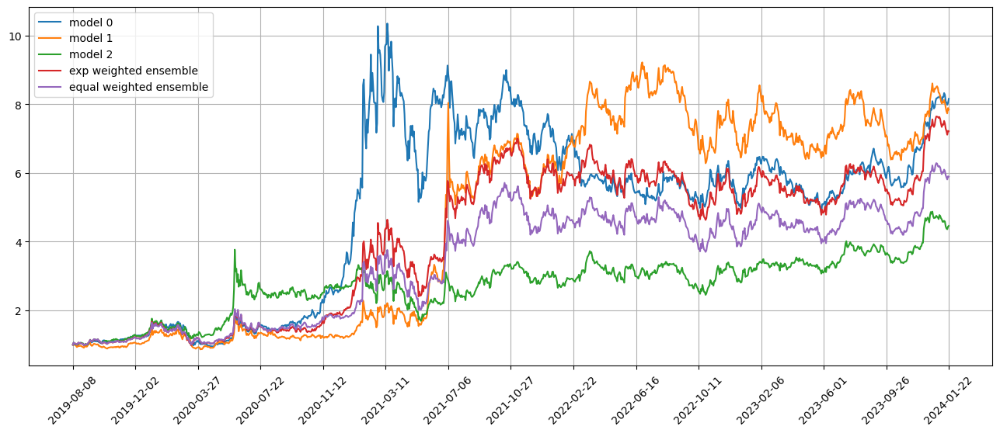

Standardization data are from 2022-06-15 to 2023-03-31
Training data are from 2023-04-03 to 2024-01-18
Testing data are from 2023-12-20 to 2024-02-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 57 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 7ms/step - loss: 0.0565 - val_loss: 0.0565 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0564 - val_loss: 0.0565 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0563 - val_loss: 0.0563 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0562 - val_loss: 0.0567 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0563 - val_loss: 0.0565 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0560 - val_loss: 0.0571 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0551 - val_loss: 0.0572 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0551 - val_loss: 0.0571 - lr: 0.0012
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05632457038734328
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.060059859648651966
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.0563378045984458
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.06020795639494417
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05634013206215906
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.06002503864329714
Correlations between old and new weights
0.9173997374418187
-0.3337395285231203
0.9915145528736681
-0.18987488980520728
0.8489262449281708
0.6988556339282103
Weight of model 0 is 0.39601259805431005
W

Testing data from 2023-12-26 to 2024-01-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-01-25 are ['CMA', 'ONB', 'PB', 'SSB', 'GBCI', 'MPW', 'WSFS', 'VET', 'VTNR', 'FIBK']
position on 2024-01-26 market open will be {'VTNR': 0.6174796020673106, 'PB': 0.8757574913885467, 'CMA': 0.8641317130621391, 'WSFS': 0.8488106877113172, 'ONB': 0.8783184649883186, 'SSB': 0.8716508013270595, 'FIBK': 0.8548655682741471, 'GBCI': 0.8627997837249671, 'VET': 0.8796742899400161, 'MPW': 0.8837070657990862}
Total asset on 2024-01-26 will be 8.437195468282816
It should be the same as 8.437195468282908
top_stocks by model 1 to buy on 2024-01-25 are ['NTCT', 'RF', 'LAAC', 'ZION', 'RILY', 'GBCI', 'CFG', 'GDOT', 'CMA', 'FIBK']
position on 2024-01-26 market open will be {'CMA': 0.804681571329794, 'GDOT': 0.8087756610775292, 'ZION': 0.8078778780873456, 'RF': 0.8027071067743272, 'RILY': 0.8251596505685392, 'LAAC': 0.7893267640045454, 'FIBK': 0.796052914568953, 'GBCI': 0.8034412754631629, 'N

position on 2024-01-31 market open will be {'VTNR': 0.6663449011748964, 'SAVE': 0.9488042157739422, 'IBKR': 0.8414459570863752, 'BLNK': 0.8351081327589379, 'COLB': 0.8479397231893036, 'CBU': 0.8244275971992714, 'PYPL': 0.8529661243256158, 'LYG': 0.8476512473362311, 'FULT': 0.8251292042567661, 'IRBT': 0.7833510950888233}
Total asset on 2024-01-31 will be 8.27316819819007
It should be the same as 8.273168198190163
top_stocks by model 1 to buy on 2024-01-30 are ['SSRM', 'BCS', 'DHT', 'SQM', 'IBKR', 'NOC', 'TSE', 'FRO', 'WTM', 'BLNK']
position on 2024-01-31 market open will be {'TSE': 0.8109282399627878, 'BCS': 0.8272973130080153, 'IBKR': 0.8121339525638904, 'BLNK': 0.8060169081139772, 'SQM': 0.7882833937852647, 'NOC': 0.8263619629204312, 'DHT': 0.839210739415462, 'WTM': 0.8281244608027417, 'FRO': 0.8391768612232067, 'SSRM': 0.8193694703798003}
Total asset on 2024-01-31 will be 8.196903302175526
It should be the same as 8.196903302175578
top_stocks by model 2 to buy on 2024-01-30 are ['AR'

position on 2024-02-05 market open will be {'FMC': 0.7649674506351971, 'AHT': 0.7398364725887281, 'MAN': 0.7860814634712278, 'TCBI': 0.7919318087440428, 'ASB': 0.7883177052062283, 'CALX': 0.7919834808849976, 'BOKF': 0.7914807359590836, 'PSEC': 0.7898658410394735, 'SFNC': 0.785852568480456, 'INDB': 0.805505182252138}
Total asset on 2024-02-05 will be 7.835822709261523
It should be the same as 7.835822709261572
top_stocks by model 2 to buy on 2024-02-02 are ['CALX', 'LSCC', 'PB', 'FORM', 'AXS', 'MAN', 'FWRD', 'AHT', 'BOKF', 'INDB']
position on 2024-02-05 market open will be {'PB': 0.4548059428909327, 'FORM': 0.4575192034852535, 'AXS': 0.44924560213378295, 'MAN': 0.45074961962673143, 'LSCC': 0.4613389101009391, 'AHT': 0.4242321236437069, 'FWRD': 0.45220001455578046, 'CALX': 0.45413391531097197, 'BOKF': 0.45384563464967215, 'INDB': 0.4618874396353219}
Total asset on 2024-02-05 will be 4.519958406033027
It should be the same as 4.519958406033092
top_stocks by return weighted ensemble to buy

position on 2024-02-08 market open will be {'VET': 0.7309909653186247, 'NYCB': 0.7513023670928937, 'EXTR': 0.7371373077548208, 'EXPO': 0.7238676226271421, 'LMBS': 0.7431826946231085, 'RILY': 0.7113003947271931, 'MKTX': 0.7478393763072827, 'VLY': 0.7342849358207714, 'IRBT': 0.7330309621478323, 'SRNE': 0.7425663150155786}
Total asset on 2024-02-08 will be 7.35550294143511
It should be the same as 7.3555029414352475
top_stocks by equal weighted ensemble to buy on 2024-02-07 are ['BGNE', 'KW', 'MKTX', 'RILY', 'LMBS', 'VLY', 'VET', 'EXTR', 'EXPO', 'IRBT']
position on 2024-02-08 market open will be {'VET': 0.6158288107502139, 'EXTR': 0.6210068429455864, 'EXPO': 0.6098276973761931, 'BGNE': 0.6122379698774775, 'LMBS': 0.6260998243670459, 'KW': 0.6058922029630893, 'RILY': 0.5992403421567218, 'MKTX': 0.6300228807106456, 'VLY': 0.6186038408575957, 'IRBT': 0.6175474213498914}
Total asset on 2024-02-08 will be 6.156307833354347
It should be the same as 6.15630783335446
Testing data from 2024-01-10 

top_stocks by model 0 to buy on 2024-02-13 are ['RILY', 'ASB', 'MTB', 'NG', 'VLY', 'CCK', 'CFG', 'EXPO', 'NYCB', 'SRNE']
position on 2024-02-14 market open will be {'MTB': 0.8382347566573329, 'NYCB': 0.8386712552834388, 'EXPO': 0.8293575725194826, 'RILY': 0.7966544811661702, 'VLY': 0.8140623582698472, 'CCK': 0.8312254693202114, 'NG': 0.8282313744668978, 'ASB': 0.8374188554159797, 'CFG': 0.8357191160845432, 'SRNE': 0.8386712552834388}
Total asset on 2024-02-14 will be 8.288246494467248
It should be the same as 8.288246494467343
top_stocks by model 1 to buy on 2024-02-13 are ['UNG', 'ZION', 'FIBK', 'CFR', 'LC', 'CMA', 'CFG', 'MTB', 'LITE', 'ABCB']
position on 2024-02-14 market open will be {'MTB': 0.8041697329588077, 'CMA': 0.7966926293144615, 'ZION': 0.8041816118447963, 'FIBK': 0.7957399536788782, 'CFR': 0.8225633227592563, 'ABCB': 0.8059638891633482, 'LC': 0.8216670519202608, 'UNG': 0.7875901480842066, 'CFG': 0.8017563255075253, 'LITE': 0.8029295726841963}
Total asset on 2024-02-14 wil

position on 2024-02-20 market open will be {'IBKR': 0.8372284215867487, 'BTG': 0.8613418970966753, 'KEY': 0.8316255492681814, 'NTRS': 0.8273870427477077, 'JKHY': 0.8305266489784815, 'JBT': 0.821757572749759, 'EGO': 0.8450565662917647, 'HAS': 0.838234964964824, 'TDC': 0.8289926238358702, 'AEM': 0.8552799324843258}
Total asset on 2024-02-20 will be 8.377431220004294
It should be the same as 8.37743122000434
top_stocks by model 2 to buy on 2024-02-16 are ['AGCO', 'PBF', 'FR', 'ABR', 'SLG', 'WPC', 'HDB', 'REXR', 'EGO', 'TDC']
position on 2024-02-20 market open will be {'WPC': 0.4717717219180596, 'SLG': 0.4808209136937725, 'TDC': 0.4619844296999942, 'FR': 0.4717579541875284, 'EGO': 0.4709366098290291, 'AGCO': 0.4613047670768865, 'ABR': 0.47991808687484555, 'PBF': 0.4392760685972843, 'REXR': 0.46862747741469835, 'HDB': 0.48186891793703907}
Total asset on 2024-02-20 will be 4.688266947229069
It should be the same as 4.688266947229137
top_stocks by return weighted ensemble to buy on 2024-02-16

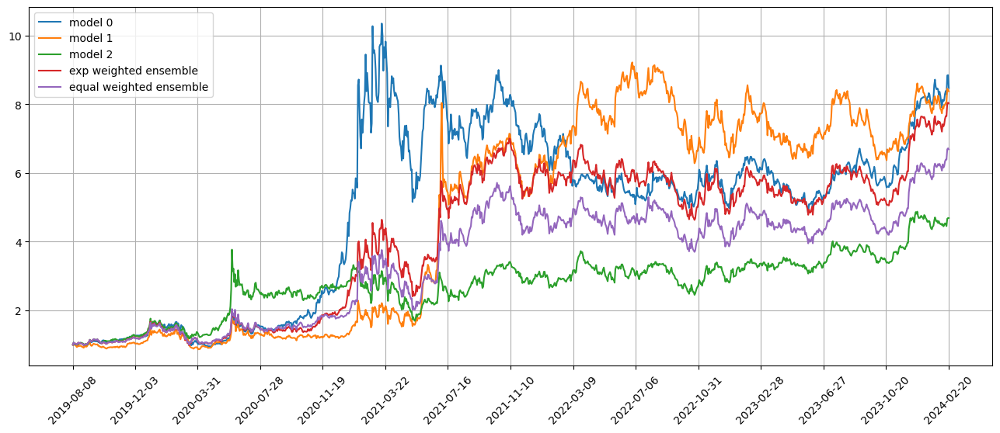

Standardization data are from 2022-07-15 to 2023-05-01
Training data are from 2023-05-02 to 2024-02-15
Testing data are from 2024-01-22 to 2024-03-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 58 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0552 - val_loss: 0.0556 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0551 - val_loss: 0.0555 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0550 - val_loss: 0.0552 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0550 - val_loss: 0.0552 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0552 - val_loss: 0.0556 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0549 - val_loss: 0.0553 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0539 - val_loss: 0.0556 - lr: 0.0012
Epoch 20/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0538 - val_loss: 0.0554 - lr: 0.0012
Epoch 21/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0539 - val_loss: 0.0554 - lr: 0.0012
Epoch 22/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0539 - val_loss: 0.0555 - lr: 0.0012
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0539 - val_loss: 0.0557 - lr: 0.0012
Epoch 23: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.0553193327053488
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.06286706280127194
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05541289530942371
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.06289208491962944
96/96 [==============================] - 0

top_stocks by model 2 to buy on 2024-02-22 are ['LABD', 'SIGI', 'HP', 'SBUX', 'FUN', 'GPRO', 'ERIE', 'SMCI', 'SRNE', 'RILY']
position on 2024-02-23 market open will be {'SMCI': 0.557655314572462, 'SBUX': 0.4925870336017382, 'GPRO': 0.46825744514991546, 'SIGI': 0.4972157408433561, 'SRNE': 0.4875008829451278, 'RILY': 0.42555039525048594, 'FUN': 0.48471309138585084, 'HP': 0.481019483368477, 'ERIE': 0.4859139294609587, 'LABD': 0.46155680137478083}
Total asset on 2024-02-23 will be 4.841970117953084
It should be the same as 4.841970117953153
top_stocks by return weighted ensemble to buy on 2024-02-22 are ['SIGI', 'SBUX', 'LABD', 'AAOI', 'FUN', 'ERIE', 'EG', 'RILY', 'SMCI', 'SRNE']
position on 2024-02-23 market open will be {'SMCI': 0.9549280253929421, 'AAOI': 0.5779051227869128, 'SBUX': 0.8047529516741684, 'SIGI': 0.8123149976904654, 'RILY': 0.6952333563469768, 'FUN': 0.7918890762424199, 'EG': 0.8105786898804367, 'LABD': 0.7540580099230855, 'ERIE': 0.7938509183525537, 'SRNE': 0.796443567800

position on 2024-02-28 market open will be {'SMCI': 0.4465457945647124, 'EVR': 0.4873255653398228, 'CBRL': 0.45604453242949633, 'MRCY': 0.4893469461453548, 'CARS': 0.4992978440018149, 'PIPR': 0.4878255278058056, 'SGMO': 0.4788503460234194, 'PFSI': 0.4791884328811863, 'ACGL': 0.48872383683271187, 'INDB': 0.4847055112381072}
Total asset on 2024-02-28 will be 4.797854337262363
It should be the same as 4.797854337262431
top_stocks by return weighted ensemble to buy on 2024-02-27 are ['TTD', 'TXRH', 'AAOI', 'ACGL', 'CARS', 'EVR', 'SGMO', 'PIPR', 'PFSI', 'SMCI']
position on 2024-02-28 market open will be {'SMCI': 0.8346560981386641, 'EVR': 0.7567669127218065, 'CARS': 0.7753586407280378, 'PIPR': 0.7575433034527027, 'TXRH': 0.7498006508225387, 'AAOI': 0.7692548158864408, 'PFSI': 0.7441307757179194, 'ACGL': 0.7589382857752245, 'TTD': 0.7711762557651605, 'SGMO': 0.7436057613009031}
Total asset on 2024-02-28 will be 7.661231500309249
It should be the same as 7.661231500309398
top_stocks by equal 

position on 2024-03-04 market open will be {'SMCI': 1.0575703642706262, 'VKTX': 0.7725445413201354, 'YUMC': 0.7454635413543275, 'SRNE': 0.7746904983793579, 'BWXT': 0.7542782230032437, 'WW': 0.7975499820858906, 'ERIE': 0.7282214049728183, 'SAVE': 0.6200089587717696, 'GOGO': 0.7575036266915869, 'OI': 0.7471153021778975}
Total asset on 2024-03-04 will be 7.754946443027505
It should be the same as 7.754946443027654
top_stocks by equal weighted ensemble to buy on 2024-03-01 are ['YUMC', 'GOGO', 'WW', 'BWXT', 'SAVE', 'ERIE', 'OI', 'SMCI', 'VKTX', 'SRNE']
position on 2024-03-04 market open will be {'SMCI': 0.880992298375969, 'VKTX': 0.6388358698331945, 'YUMC': 0.6164419323398992, 'SRNE': 0.6406104139160644, 'BWXT': 0.6243948135789461, 'WW': 0.660215365096481, 'ERIE': 0.6028248655937211, 'SAVE': 0.5132461291115796, 'GOGO': 0.6270648168659047, 'OI': 0.6184653163761565}
Total asset on 2024-03-04 will be 6.423091821087803
It should be the same as 6.423091821087916
Testing data from 2024-02-02 to 

position on 2024-03-07 market open will be {'SMCI': 0.9606970994096724, 'AAOI': 0.5919430622787599, 'SSRM': 0.6269670553663503, 'SGMO': 0.6274101865098612, 'VKTX': 0.5283015787371941, 'NAIL': 0.6106527033199405, 'FUN': 0.6039811115428944, 'GPRE': 0.5759631381330719, 'EXPRQ': 0.47372927183168556, 'SNBR': 0.6193305892324201}
Total asset on 2024-03-07 will be 6.218975796361738
It should be the same as 6.21897579636185
Testing data from 2024-02-07 to 2024-03-06 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-07 are ['KOLD', 'ANY', 'NVDA', 'CLS', 'AAOI', 'ANF', 'ERIE', 'RILY', 'VKTX', 'SMCI']
position on 2024-03-08 market open will be {'SMCI': 1.2185075180248301, 'AAOI': 0.6220143760029321, 'ANF': 0.8139560940600488, 'VKTX': 0.7002508932002529, 'NVDA': 0.8864177381003239, 'KOLD': 0.9273886102972909, 'CLS': 0.8453157150620972, 'RILY': 0.7567020604934729, 'ANY': 0.8256178600694732, 'ERIE': 0.8449589474099791}
Total asset on 2024-03-08 will be 8.441129812720607
It sh

position on 2024-03-13 market open will be {'SMCI': 1.1548978463797621, 'AAOI': 0.5778501287582557, 'ANF': 0.7720973484010898, 'VKTX': 0.6169530884992827, 'CLS': 0.7893380812890011, 'DELL': 0.8395019375672562, 'PLCE': 0.7932510148854114, 'NVDA': 0.8768410999187339, 'NAIL': 0.8738222169267502, 'SGMO': 0.8778196040928377}
Total asset on 2024-03-13 will be 8.172372366718287
It should be the same as 8.172372366718381
top_stocks by model 1 to buy on 2024-03-12 are ['VKTX', 'PLUG', 'META', 'ANF', 'KOLD', 'AAOI', 'PKX', 'ASH', 'NVDA', 'SGMO']
position on 2024-03-13 market open will be {'AAOI': 0.6697075503496323, 'ASH': 0.7130690722501042, 'NVDA': 0.732243976068403, 'VKTX': 0.7449882818906535, 'META': 0.7111280252842607, 'PLUG': 0.6584482383649705, 'PKX': 0.7030192772916826, 'ANF': 0.7335766789254883, 'KOLD': 0.8011938213512809, 'SGMO': 0.7330611181789993}
Total asset on 2024-03-13 will be 7.200436039955425
It should be the same as 7.200436039955474
top_stocks by model 2 to buy on 2024-03-12 

top_stocks by model 1 to buy on 2024-03-15 are ['BAND', 'CBU', 'GBCI', 'LAAC', 'PLCE', 'RS', 'GL', 'EXPRQ', 'HEFA', 'VKTX']
position on 2024-03-18 market open will be {'CBU': 0.7018110405434279, 'VKTX': 0.6421936046050868, 'RS': 0.702143228356676, 'BAND': 0.6749666470518254, 'LAAC': 0.6898105274976369, 'GBCI': 0.6903678191339737, 'GL': 0.6997599953995798, 'HEFA': 0.6870786073250056, 'EXPRQ': 0.6419420398959944, 'PLCE': 0.6808086942724676}
Total asset on 2024-03-18 will be 6.810882204081624
It should be the same as 6.810882204081674
top_stocks by model 2 to buy on 2024-03-15 are ['VKTX', 'MFC', 'GBCI', 'CBU', 'INDB', 'EXPRQ', 'LAAC', 'CVBF', 'GL', 'SMCI']
position on 2024-03-18 market open will be {'VKTX': 0.4576218259675692, 'CBU': 0.46008866824711975, 'CVBF': 0.4543675880840263, 'LAAC': 0.457863035047336, 'GBCI': 0.45823293841912893, 'GL': 0.46446701308057237, 'EXPRQ': 0.42609023636894977, 'MFC': 0.4568057231524855, 'SMCI': 0.4493720399716342, 'INDB': 0.46823106261031455}
Total asset 

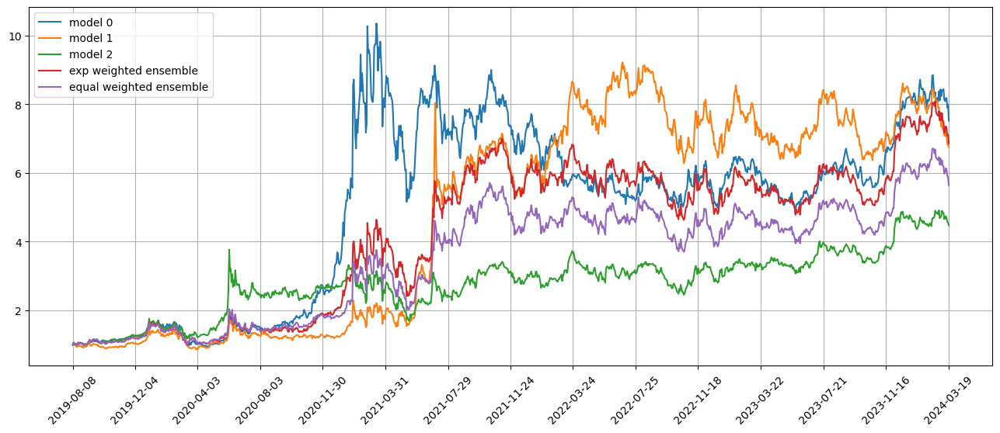

Standardization data are from 2022-08-12 to 2023-05-30
Training data are from 2023-05-31 to 2024-03-15
Testing data are from 2024-02-20 to 2024-04-15
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 59 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0541 - val_loss: 0.0623 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0540 - val_loss: 0.0625 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0539 - val_loss: 0.0624 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0538 - val_loss: 0.0625 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0540 - val_loss: 0.0626 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0537 - val_loss: 0.0627 - lr: 0.0100
Epoch 7/500
305/305 [

11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.054847228724403015
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05583336122860342
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.05471895516848544
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05563375782815531
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.05477122073377927
Correlations between old and new weights
0.9742379967456832
0.6007354867332539
0.9584671070222425
-0.8253877387077293
0.9838330817006665
0.8730448812054745
Weight of model 0 is 0.37580970365989913
Weight of model 1 is 0.2689632246925724
Weight of model 2 is 0.3552270716475285
Testing data from 2024-02-20 to 2024-03-18 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-19 are ['MOD', 'TPIC', 'CLS', 'ANF', 'DELL', 'IRWD', 'MSTR', 'AAOI', 'VKTX', 'SMCI']
position on 2024-03-20 market open will be {'SMCI': 0.90

Testing data from 2024-02-23 to 2024-03-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-03-22 are ['VLY', 'VKTX', 'SRNE', 'DELL', 'LAAC', 'PLCE', 'MSTR', 'AAOI', 'NYCB', 'SMCI']
position on 2024-03-25 market open will be {'SMCI': 0.9779729674892489, 'AAOI': 0.6083936261169495, 'VKTX': 0.6489907110640004, 'DELL': 0.8230077337000559, 'MSTR': 0.7911744466147133, 'NYCB': 0.8537730088299739, 'PLCE': 0.8070570860734145, 'VLY': 0.8276784053521912, 'LAAC': 0.8003417328747425, 'SRNE': 0.8563656389106673}
Total asset on 2024-03-25 will be 7.994755357025866
It should be the same as 7.994755357025957
top_stocks by model 1 to buy on 2024-03-22 are ['VLY', 'PBW', 'BBD', 'KW', 'MDRX', 'SAVE', 'NYMT', 'NYCB', 'SRNE', 'HDB']
position on 2024-03-25 market open will be {'SAVE': 0.7314137939017218, 'NYCB': 0.6844863166781804, 'VLY': 0.7002427768895144, 'BBD': 0.7066629184124174, 'PBW': 0.6940014051986639, 'MDRX': 0.7091777307215846, 'KW': 0.6974419003043049, 'SRNE': 0.7091777307

top_stocks by model 0 to buy on 2024-03-27 are ['MOD', 'NEAR', 'DELL', 'CLS', 'PLCE', 'AAOI', 'VKTX', 'ANF', 'MSTR', 'SMCI']
position on 2024-03-28 market open will be {'SMCI': 1.0140355427610315, 'AAOI': 0.5728971323781635, 'VKTX': 0.7643261383296883, 'DELL': 0.8302563215147533, 'MSTR': 0.9577893918486704, 'MOD': 0.778793135356273, 'CLS': 0.8036461738799829, 'ANF': 0.7457057671597349, 'PLCE': 0.8303543168361114, 'NEAR': 0.7932623816046361}
Total asset on 2024-03-28 will be 8.091066301668954
It should be the same as 8.091066301669045
top_stocks by model 1 to buy on 2024-03-27 are ['FIVE', 'O', 'VOYA', 'BMI', 'RWR', 'VICI', 'PLCE', 'VKTX', 'HDB', 'SAVE']
position on 2024-03-28 market open will be {'VKTX': 0.7445514003107593, 'SAVE': 0.6667635746007172, 'PLCE': 0.6917040965080753, 'O': 0.7029634160803752, 'BMI': 0.7067156856244506, 'VICI': 0.7059581956926475, 'FIVE': 0.714603601927319, 'RWR': 0.7086985539932562, 'VOYA': 0.7091844821035169, 'HDB': 0.6989800878936353}
Total asset on 2024-0

position on 2024-04-03 market open will be {'SAVE': 0.6581601820194177, 'SMCI': 0.6868629877041125, 'ADC': 0.7113219690302676, 'NSIT': 0.7011537266567629, 'PCH': 0.7045131354540888, 'LXP': 0.7017236286959245, 'NNN': 0.6999504964720652, 'NFG': 0.706127026139604, 'GBIL': 0.7115898947746131, 'IRBT': 0.6857322952274185}
Total asset on 2024-04-03 will be 6.967135342174222
It should be the same as 6.9671353421742745
top_stocks by model 2 to buy on 2024-04-02 are ['EVRI', 'LXP', 'NHI', 'FWRD', 'ADC', 'GNL', 'NYCB', 'SMCI', 'IRBT', 'GBIL']
position on 2024-04-03 market open will be {'NYCB': 0.4326196814730282, 'GNL': 0.4595476654442181, 'EVRI': 0.45714968723086913, 'NHI': 0.4686501941726882, 'ADC': 0.47518036413230536, 'LXP': 0.46876843949941827, 'FWRD': 0.4510478220285121, 'GBIL': 0.475359345041516, 'SMCI': 0.46338246824434315, 'IRBT': 0.4580858400699573}
Total asset on 2024-04-03 will be 4.60979150733678
It should be the same as 4.609791507336856
top_stocks by return weighted ensemble to buy

position on 2024-04-08 market open will be {'SAVE': 0.6352177334289333, 'SMCI': 0.6780570519643162, 'NYCB': 0.7166823912620435, 'SRNE': 0.727198172129821, 'CLS': 0.7245076258558174, 'NAIL': 0.7246384122951035, 'PENN': 0.7031041244134283, 'SCHO': 0.6995559761622904, 'ANF': 0.6922282049534335, 'HDB': 0.6818993180335067}
Total asset on 2024-04-08 will be 6.98308901049864
It should be the same as 6.983089010498695
top_stocks by model 2 to buy on 2024-04-05 are ['BLNK', 'CPA', 'DELL', 'PYPL', 'HDB', 'WPM', 'FSM', 'PENN', 'ANF', 'NYCB']
position on 2024-04-08 market open will be {'NYCB': 0.439665586676162, 'DELL': 0.47875757569283506, 'CPA': 0.45924868934614815, 'BLNK': 0.4476847268065984, 'FSM': 0.4955919504696401, 'WPM': 0.4610798531901814, 'PYPL': 0.4601204912416799, 'PENN': 0.456121270067662, 'ANF': 0.449065788489617, 'HDB': 0.4423651806326617}
Total asset on 2024-04-08 will be 4.58970111261311
It should be the same as 4.589701112613186
top_stocks by return weighted ensemble to buy on 20

position on 2024-04-11 market open will be {'NVDA': 0.729662391084299, 'ANF': 0.6990365933966595, 'MSTR': 0.7790057251826294, 'BGC': 0.7121593515046956, 'SRNE': 0.7004993015640675, 'LPG': 0.709545005069747, 'AMCX': 0.6935133827480983, 'EXPRQ': 0.7942281124108763, 'SMCI': 0.729162080951287, 'EG': 0.6921376889902872}
Total asset on 2024-04-11 will be 7.2389496329025915
It should be the same as 7.238949632902647
top_stocks by model 2 to buy on 2024-04-10 are ['EG', 'AMCX', 'ACGL', 'SRNE', 'LPG', 'MSTR', 'EXPRQ', 'LW', 'ANF', 'NYCB']
position on 2024-04-11 market open will be {'NYCB': 0.4241645593918494, 'MSTR': 0.487696806939793, 'SRNE': 0.46771091106112606, 'LPG': 0.4737505662304943, 'LW': 0.47081725445017886, 'EXPRQ': 0.5302919691948829, 'AMCX': 0.46304653745401375, 'ANF': 0.46673428686169083, 'ACGL': 0.46847900119843944, 'EG': 0.4621280112265496}
Total asset on 2024-04-11 will be 4.714819904008944
It should be the same as 4.714819904009018
top_stocks by return weighted ensemble to buy 

position on 2024-04-16 market open will be {'SMCI': 0.9174295926332046, 'NYCB': 0.6030541845944891, 'MSTR': 0.6047994477670283, 'IRWD': 0.674057282181679, 'GL': 0.647589919262045, 'GPRO': 0.6629719280994478, 'KW': 0.6670233448223089, 'WAFD': 0.6809242343689552, 'CMP': 0.6495244032558888, 'IRBT': 0.652411207106385}
Total asset on 2024-04-16 will be 6.759785544091269
It should be the same as 6.759785544091432
top_stocks by equal weighted ensemble to buy on 2024-04-15 are ['CMP', 'MKTX', 'KW', 'WAFD', 'SMCI', 'IRBT', 'GPRO', 'MSTR', 'NYCB', 'GL']
position on 2024-04-16 market open will be {'SMCI': 0.7642502406631644, 'NYCB': 0.49788117338651716, 'MSTR': 0.5016535117155838, 'GL': 0.536942556226504, 'GPRO': 0.5493991398227852, 'KW': 0.5527565140467352, 'MKTX': 0.546787599117478, 'WAFD': 0.5642760617621151, 'CMP': 0.5382552915410391, 'IRBT': 0.5406475610853113}
Total asset on 2024-04-16 will be 5.592849649367121
It should be the same as 5.592849649367233
Testing data from 2024-03-18 to 2024-

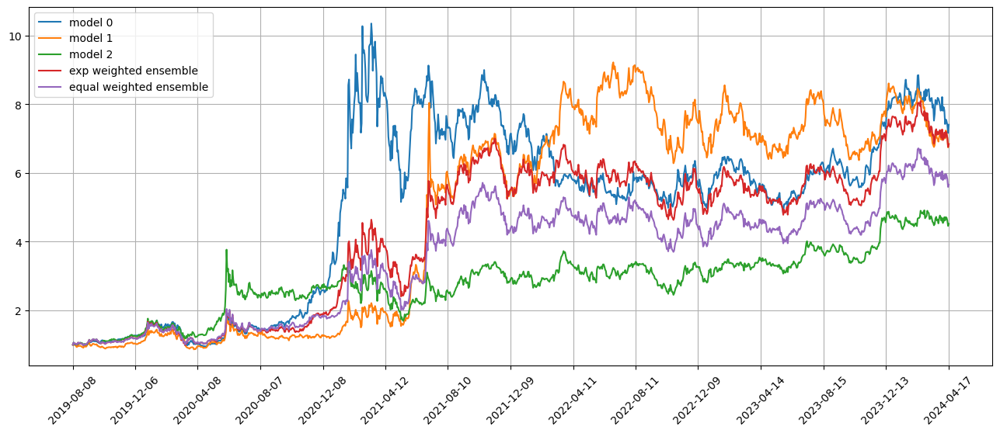

Standardization data are from 2022-09-12 to 2023-06-28
Training data are from 2023-06-29 to 2024-04-15
Testing data are from 2024-03-19 to 2024-05-13
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 60 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0559 - val_loss: 0.0581 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0557 - val_loss: 0.0581 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0558 - val_loss: 0.0585 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0555 - val_loss: 0.0583 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0555 - val_loss: 0.0585 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0556 - val_loss: 0.0584 - lr: 0.0100
Epoch 7/500
305/305 [

Epoch 22: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.05639317178683553
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.08691384527753492
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05640887553202457
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.08671938215727798
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0562517237451202
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.08693962021073248
Correlations between old and new weights
0.988007193696886
0.3061115646409827
0.981510702864334
0.31842153812647545
0.9654543655493827
0.05558624539313292
Weight of model 0 is 0.3637040872412777
Weight of model 1 is 0.27010619718927004
Weight of model 2 is 0.36618971556945235
Testing data from 2024-03-19 to 2024-04-16 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-17 are ['LW', 'SMCI', '

Testing data from 2024-03-22 to 2024-04-19 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-22 are ['MOD', 'CLS', 'DELL', 'VST', 'EXPRQ', 'SMCI', 'ANF', 'MSTR', 'AAOI', 'GBIL']
position on 2024-04-23 market open will be {'SMCI': 0.7339195631646657, 'AAOI': 0.46021633680158747, 'MSTR': 0.6462490640506829, 'ANF': 0.7188546899889531, 'CLS': 0.723698342362422, 'DELL': 0.7162983806502489, 'MOD': 0.7948065803780974, 'EXPRQ': 1.2255647273340355, 'VST': 0.752247335495163, 'GBIL': 0.7384396528832474}
Total asset on 2024-04-23 will be 7.510294673109015
It should be the same as 7.510294673109103
top_stocks by model 1 to buy on 2024-04-22 are ['MOD', 'NAIL', 'MMYT', 'DELL', 'EXPRQ', 'SRNE', 'ANF', 'MSTR', 'GBIL', 'GL']
position on 2024-04-23 market open will be {'MSTR': 0.7079863338106944, 'MOD': 0.729026042827411, 'GL': 0.7153540751402329, 'ANF': 0.7400386684722717, 'DELL': 0.6642113637854683, 'NAIL': 0.6724173880960342, 'GBIL': 0.6564666002368521, 'EXPRQ': 1.08951666772

Testing data from 2024-03-27 to 2024-04-24 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-25 are ['CBOE', 'X', 'SMCI', 'SRNE', 'CLS', 'DELL', 'MSTR', 'AAOI', 'ANF', 'GL']
position on 2024-04-26 market open will be {'SMCI': 0.803511194206732, 'AAOI': 0.4531995820890611, 'MSTR': 0.6038558860454982, 'ANF': 0.7198445677415997, 'CLS': 0.7093496748549895, 'DELL': 0.7731689866663394, 'SRNE': 0.9778312221082343, 'GL': 0.8698500315990491, 'CBOE': 0.9013480215284465, 'X': 0.9033125564388633}
Total asset on 2024-04-26 will be 7.715271723278724
It should be the same as 7.715271723278813
top_stocks by model 1 to buy on 2024-04-25 are ['IRWD', 'XRAY', 'NYCB', 'CMP', 'PLCE', 'EVR', 'AEHR', 'MSTR', 'ANF', 'GL']
position on 2024-04-26 market open will be {'MSTR': 0.6615432635703311, 'GL': 0.7974873208044819, 'NYCB': 0.7387066555914111, 'EVR': 0.758790964399062, 'AEHR': 0.765151086954559, 'XRAY': 0.7392380257137499, 'IRWD': 0.7545967093340755, 'ANF': 0.7712050175287907, 'CMP'

Testing data from 2024-04-02 to 2024-04-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-04-30 are ['GL', 'SMCI', 'VST', 'ANF', 'BCC', 'DELL', 'CLS', 'MSTR', 'AAOI', 'SRNE']
position on 2024-05-01 market open will be {'SMCI': 0.7815338521501828, 'AAOI': 0.40243133967092837, 'MSTR': 0.5005990011696047, 'ANF': 0.7462626117474026, 'CLS': 0.7053914694777627, 'DELL': 0.7564894197168357, 'VST': 0.9221587781343291, 'GL': 0.9583170324020404, 'BCC': 0.9009597706661396, 'SRNE': 0.9187150221611038}
Total asset on 2024-05-01 will be 7.5928582972962415
It should be the same as 7.592858297296329
top_stocks by model 1 to buy on 2024-04-30 are ['FCNCA', 'BCC', 'DELL', 'HE', 'FBND', 'JBHT', 'MSTR', 'TRV', 'CLS', 'SRNE']
position on 2024-05-01 market open will be {'DELL': 0.7364916434453718, 'CLS': 0.7363461672661498, 'MSTR': 0.644082847620616, 'JBHT': 0.7544248079999895, 'TRV': 0.758343073587019, 'FCNCA': 0.7573198863513749, 'BCC': 0.745755320946959, 'HE': 0.7558384600531417, 

Testing data from 2024-04-05 to 2024-05-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-03 are ['ACB', 'PACB', 'ANF', 'EXPRQ', 'DELL', 'SMCI', 'CLS', 'VST', 'MSTR', 'AAOI']
position on 2024-05-06 market open will be {'SMCI': 0.7960815312956168, 'AAOI': 0.46558209272074974, 'MSTR': 0.6279361904806623, 'ANF': 0.8040481829266806, 'CLS': 0.7581680235189278, 'DELL': 0.769352978985841, 'VST': 1.003077687505782, 'EXPRQ': 1.0780633212140711, 'ACB': 0.9538428788912705, 'PACB': 1.0073415381330517}
Total asset on 2024-05-06 will be 8.263494425672565
It should be the same as 8.263494425672654
top_stocks by model 1 to buy on 2024-05-03 are ['SIGI', 'TRU', 'MRIN', 'VST', 'DELL', 'PACB', 'ACGL', 'SMCI', 'CLS', 'EXPRQ']
position on 2024-05-06 market open will be {'CLS': 0.8045111676636902, 'DELL': 0.7914846880536784, 'EXPRQ': 0.9030043258509409, 'SMCI': 0.7949775938148096, 'TRU': 0.7991809313333909, 'SIGI': 0.7912034804349718, 'VST': 0.8014083308683971, 'MRIN': 0.75103890

position on 2024-05-09 market open will be {'AAOI': 0.44535734766131063, 'MSTR': 0.6063206039477246, 'DELL': 0.807328230758763, 'VST': 1.0914304204680203, 'ACB': 0.8983868852610934, 'SRNE': 0.921383643392355, 'GL': 1.0491211418999176, 'MOD': 1.0166723922745557, 'ANF': 0.9184106526597706, 'SMCI': 0.8092845848454759}
Total asset on 2024-05-09 will be 8.563695903168899
It should be the same as 8.563695903168986
top_stocks by model 1 to buy on 2024-05-08 are ['XPO', 'MSTR', 'NSIT', 'TSE', 'CMP', 'ST', 'PLCE', 'ANF', 'SRNE', 'EXPRQ']
position on 2024-05-09 market open will be {'SRNE': 0.8029443420693302, 'CMP': 0.8175245050527169, 'ST': 0.8130371018228306, 'ANF': 0.7982735415964523, 'MSTR': 0.8141533076659584, 'XPO': 0.8046727835741253, 'NSIT': 0.8006220357603668, 'TSE': 0.8886186181067699, 'EXPRQ': 0.7606316744024791, 'PLCE': 0.8478460716198262}
Total asset on 2024-05-09 will be 8.148323981670796
It should be the same as 8.148323981670856
top_stocks by model 2 to buy on 2024-05-08 are ['CL

position on 2024-05-14 market open will be {'AAOI': 0.4226560847303673, 'MSTR': 0.6045854554819191, 'DELL': 0.7969881718004695, 'VST': 1.084849654028165, 'SRNE': 0.921383643392355, 'GL': 0.9933833165949998, 'MOD': 0.9860404242130425, 'CLS': 0.8446434660517795, 'ACB': 0.9750601211933183, 'ANF': 0.8080637712472473}
Total asset on 2024-05-14 will be 8.437654108733579
It should be the same as 8.437654108733664
top_stocks by model 1 to buy on 2024-05-13 are ['CLS', 'XPO', 'AMGN', 'KOLD', 'UNH', 'EQIX', 'PCTY', 'GBIL', 'WK', 'SRNE']
position on 2024-05-14 market open will be {'SRNE': 0.8029443420693302, 'CLS': 0.7699993327701157, 'KOLD': 0.8082401497632251, 'PCTY': 0.8502642664237535, 'XPO': 0.7884306731726187, 'EQIX': 0.8522663208395816, 'WK': 0.8487927484211811, 'GBIL': 0.8331354681915373, 'AMGN': 0.8239249134746374, 'UNH': 0.8371681058813794}
Total asset on 2024-05-14 will be 8.215166321007299
It should be the same as 8.21516632100736
top_stocks by model 2 to buy on 2024-05-13 are ['AMGN'

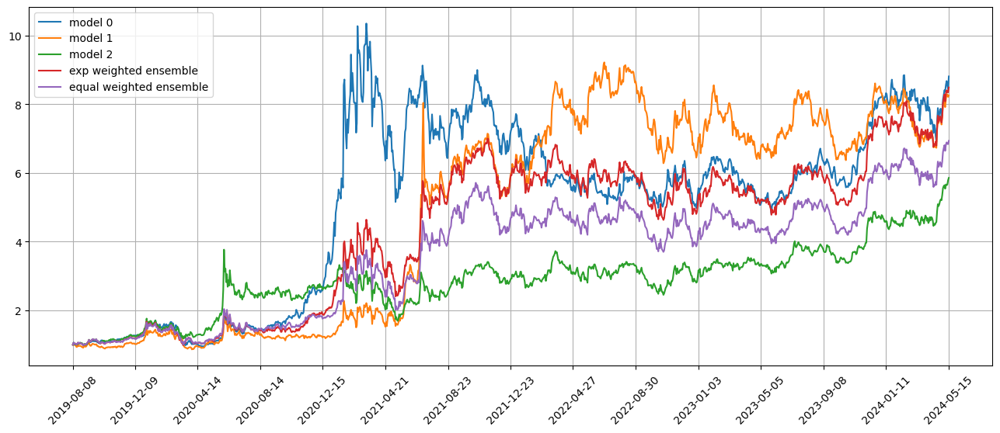

Standardization data are from 2022-10-10 to 2023-07-27
Training data are from 2023-07-28 to 2024-05-13
Testing data are from 2024-04-17 to 2024-06-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 61 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0564 - val_loss: 0.0716 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0561 - val_loss: 0.0716 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0562 - val_loss: 0.0716 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0561 - val_loss: 0.0716 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0560 - val_loss: 0.0716 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0561 - val_loss: 0.0717 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0552 - val_loss: 0.0718 - lr: 0.0010
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0552 - val_loss: 0.0718 - lr: 0.0010
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.059479219585129264
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.054092498552405506
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.05959482344450498
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.05410547132172651
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.05918886162947099
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.054591716527662794
Correlations between old and new weights
0.9947693449347713
0.841710073579637
0.9790370902193725
0.38268477792116234
0.9387991364789487
-0.07768498420874041
Weight of model 0 is 0.3222287580695977


position on 2024-05-20 market open will be {'MSTR': 1.1228354130364606, 'MGNX': 0.8279630045261805, 'GL': 0.8191229261037586, 'SRNE': 0.8410459739826011, 'DELL': 0.8324757766612148, 'PZZA': 0.7636889634525226, 'PRI': 0.790580922150297, 'CLS': 0.7649649768988521, 'UNIT': 0.7832491237497267, 'GBIL': 0.7792145887199683}
Total asset on 2024-05-20 will be 8.325141669281408
It should be the same as 8.325141669281582
top_stocks by equal weighted ensemble to buy on 2024-05-17 are ['VST', 'PZZA', 'DELL', 'CLS', 'MSTR', 'GL', 'MGNX', 'PRI', 'UNIT', 'SRNE']
position on 2024-05-20 market open will be {'MSTR': 0.919141045654571, 'MGNX': 0.6760505294329296, 'VST': 0.6973829187782521, 'GL': 0.6688324053560852, 'SRNE': 0.6867330700527603, 'DELL': 0.6801514313748628, 'PZZA': 0.610446052400489, 'PRI': 0.6319418325072994, 'UNIT': 0.6260812431773312, 'CLS': 0.6114660191780634}
Total asset on 2024-05-20 will be 6.808226547912523
It should be the same as 6.808226547912644
Testing data from 2024-04-22 to 202

Testing data from 2024-04-25 to 2024-05-22 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-05-23 are ['SSD', 'DELL', 'CLS', 'VST', 'ACB', 'NYCB', 'SUN', 'MSTR', 'GL', 'MGNX']
position on 2024-05-24 market open will be {'MSTR': 0.759133113885769, 'VST': 1.1706432155376134, 'GL': 0.9516682783635443, 'CLS': 0.8774346421761615, 'DELL': 0.7846547385452248, 'ACB': 0.8008468273983662, 'NYCB': 0.8902440368759832, 'MGNX': 0.9070606212728556, 'SSD': 0.9085130940469949, 'SUN': 0.8971580650458658}
Total asset on 2024-05-24 will be 8.947356633148292
It should be the same as 8.947356633148381
top_stocks by model 1 to buy on 2024-05-23 are ['ZLAB', 'CBOE', 'SAVE', 'PETS', 'AMN', 'NYCB', 'KOLD', 'GL', 'MGNX', 'SRNE']
position on 2024-05-24 market open will be {'MGNX': 0.8333570655930874, 'PETS': 0.751198488005837, 'NYCB': 0.7622069390469727, 'SAVE': 0.7522303747546124, 'CBOE': 0.7708529193707574, 'AMN': 0.7788053458409511, 'GL': 0.7453806759112015, 'ZLAB': 0.7341050350591155, '

top_stocks by model 0 to buy on 2024-05-29 are ['SMCI', 'ACB', 'GL', 'MGNX', 'CLS', 'DELL', 'VST', 'ANF', 'MSTR', 'SRNE']
position on 2024-05-30 market open will be {'MSTR': 0.8148357535195326, 'GL': 0.977946338525124, 'CLS': 0.9308984264601684, 'DELL': 0.8992197526251838, 'MGNX': 0.8189013277532272, 'ANF': 1.1066601096774842, 'ACB': 0.9597276411386564, 'VST': 0.9454714432351617, 'SMCI': 0.9240762926864289, 'SRNE': 0.953653421519648}
Total asset on 2024-05-30 will be 9.331390507140524
It should be the same as 9.331390507140616
top_stocks by model 1 to buy on 2024-05-29 are ['PACB', 'UPS', 'EPAM', 'JNJ', 'L', 'VSAT', 'DELL', 'VST', 'MGNX', 'SRNE']
position on 2024-05-30 market open will be {'MGNX': 0.7523611889898444, 'VST': 0.7873662610152082, 'SRNE': 0.7969811889801414, 'JNJ': 0.7667366344345611, 'EPAM': 0.7776572584432719, 'UPS': 0.751140587614682, 'DELL': 0.8234728571159968, 'L': 0.767258957259118, 'PACB': 0.7457371403495906, 'VSAT': 0.8104949717117499}
Total asset on 2024-05-30 wil

Testing data from 2024-05-03 to 2024-05-31 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-03 are ['EXP', 'CLS', 'DHI', 'FR', 'CX', 'PHM', 'DELL', 'MSTR', 'ANF', 'SRNE']
position on 2024-06-04 market open will be {'MSTR': 0.7972968275464044, 'CLS': 0.8607665670641715, 'DELL': 0.6648593206032369, 'SRNE': 0.953653421519648, 'ANF': 0.9972056942658635, 'FR': 1.0124416873902182, 'EXP': 0.8929319908347191, 'PHM': 0.9016573615851066, 'CX': 0.8714044102394459, 'DHI': 0.91452875138804}
Total asset on 2024-06-04 will be 8.866746032436765
It should be the same as 8.866746032436854
top_stocks by model 1 to buy on 2024-06-03 are ['EXP', 'LEG', 'NOW', 'DELL', 'INTU', 'PSTG', 'VST', 'VKTX', 'ANF', 'SRNE']
position on 2024-06-04 market open will be {'VST': 0.7021944298957746, 'SRNE': 0.7969811889801414, 'EXP': 0.7648461018760578, 'ANF': 0.7805887101707639, 'PSTG': 0.7716810432015025, 'VKTX': 0.828954447212599, 'DELL': 0.7469589990574197, 'NOW': 0.7926940259353383, 'LEG': 0.8

top_stocks by model 0 to buy on 2024-06-06 are ['SSD', 'MOD', 'ANF', 'CLS', 'DELL', 'AMC', 'MGNX', 'VST', 'DFEN', 'SRNE']
position on 2024-06-07 market open will be {'CLS': 0.8189390393542333, 'DELL': 0.6613389007380622, 'SRNE': 0.953653421519648, 'MGNX': 0.9737580233179363, 'VST': 0.8583647808230195, 'ANF': 0.9664405185909255, 'SSD': 0.9128084683383628, 'DFEN': 0.8897385730075251, 'AMC': 0.9546736001895734, 'MOD': 0.8595897569180464}
Total asset on 2024-06-07 will be 8.849305082797242
It should be the same as 8.849305082797333
top_stocks by model 1 to buy on 2024-06-06 are ['FDS', 'PEGA', 'PETS', 'MOD', 'AEO', 'BRK-A', 'GRMN', 'SKYW', 'ANF', 'SRNE']
position on 2024-06-07 market open will be {'SRNE': 0.7969811889801414, 'BRK-A': 0.8231700592114748, 'MOD': 0.7634816608432662, 'PEGA': 0.8002034413215247, 'FDS': 0.8276783099587491, 'PETS': 0.8336806952425481, 'AEO': 0.8045633404169256, 'SKYW': 0.777154281593818, 'GRMN': 0.8031667568458342, 'ANF': 0.8268122365424432}
Total asset on 2024-0

top_stocks by model 1 to buy on 2024-06-11 are ['DOX', 'CLH', 'CVNA', 'SMTC', 'DELL', 'ANF', 'FWRD', 'VST', 'SRNE', 'DFEN']
position on 2024-06-12 market open will be {'SRNE': 0.7969811889801414, 'VST': 0.8803711769213237, 'DFEN': 0.795790336477385, 'SMTC': 0.7950121101299049, 'DELL': 0.8121313687081135, 'FWRD': 0.8177422434767585, 'CLH': 0.816659375101695, 'ANF': 0.8118534428233554, 'DOX': 0.7975344133210805, 'CVNA': 0.8198373475600313}
Total asset on 2024-06-12 will be 8.143913003499721
It should be the same as 8.143913003499788
top_stocks by model 2 to buy on 2024-06-11 are ['MVIS', 'NYCB', 'VST', 'DELL', 'KNSL', 'GPRO', 'DOX', 'ANF', 'DFEN', 'SRNE']
position on 2024-06-12 market open will be {'SRNE': 0.5610179783332684, 'VST': 0.6326630878377727, 'DFEN': 0.5718805712243757, 'DELL': 0.5894809774662355, 'DOX': 0.5753332995295186, 'NYCB': 0.6325046967997375, 'MVIS': 0.5870783557780139, 'GPRO': 0.6103929069235541, 'KNSL': 0.5718819866103452, 'ANF': 0.571492841748012}
Total asset on 202

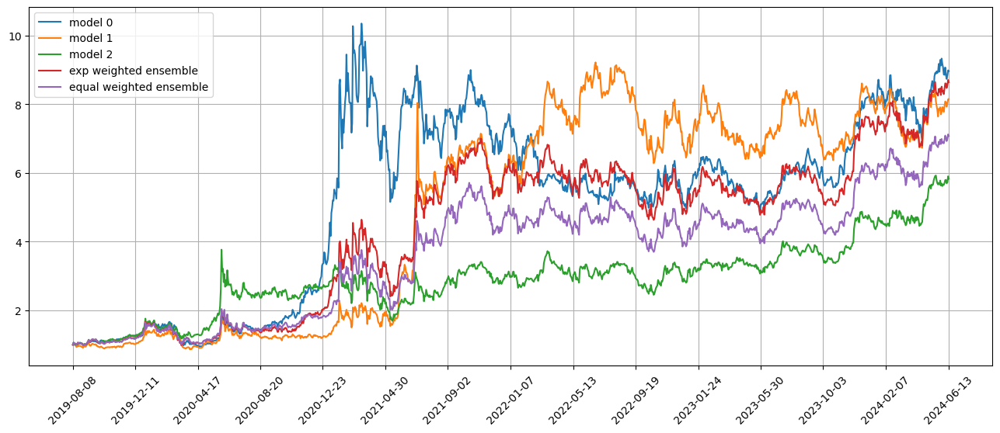

Standardization data are from 2022-11-07 to 2023-08-24
Training data are from 2023-08-25 to 2024-06-11
Testing data are from 2024-05-15 to 2024-07-11
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 62 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0728 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0575 - val_loss: 0.0728 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0728 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0577 - val_loss: 0.0729 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0574 - val_loss: 0.0729 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0573 - val_loss: 0.0729 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.060663730656074256
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.06196127125695852
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.0606133567199499
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.06209963032453226
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.06056062546744733
11/11 [==============================] - 0s 3ms/step
Model 2 test loss 0.061985550160336786
Correlations between old and new weights
0.9876007724084462
0.8495243455659615
0.9723407679796038
0.4836480423009622
0.959695757712969
0.04529178327229909
Weight of model 0 is 0.3364010981974551
Weight of model 1 is 0.2891788797060452
Weight of model 2 is 0.3744200220964996
Testing data from 2024-05-15 to 2024-06-12 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-13 are ['DELL', 'ACMR', 'PAA', 'HUBS', 'BKNG', '

Testing data from 2024-05-20 to 2024-06-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-18 are ['SBUX', 'VST', 'JBL', 'JACK', 'MPW', 'BLDR', 'NICE', 'PENN', 'DFEN', 'SRNE']
position on 2024-06-20 market open will be {'JBL': 0.8942771831247466, 'DFEN': 0.91844338619305, 'MPW': 0.8844906147545127, 'SRNE': 0.8863371927632439, 'SBUX': 0.8836707632960569, 'JACK': 0.8698582118190453, 'BLDR': 0.890726885341394, 'VST': 0.9435523196544789, 'NICE': 0.8873988593126028, 'PENN': 0.8944079932660445}
Total asset on 2024-06-20 will be 8.95316340952508
It should be the same as 8.953163409525176
top_stocks by model 1 to buy on 2024-06-18 are ['FIVE', 'EMR', 'SBUX', 'MSM', 'LEG', 'PETS', 'NICE', 'PENN', 'DFEN', 'SRNE']
position on 2024-06-20 market open will be {'DFEN': 0.826909033228358, 'SBUX': 0.7945983175470325, 'NICE': 0.7979506280968935, 'EMR': 0.8168867287903171, 'PENN': 0.8042532537785363, 'PETS': 0.8102130752009897, 'FIVE': 0.8017593443450335, 'MSM': 0.8083886507762

Testing data from 2024-05-23 to 2024-06-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-06-24 are ['MED', 'ULTA', 'GGB', 'JBL', 'NEU', 'SSD', 'CX', 'NVRO', 'BBVA', 'DFEN']
position on 2024-06-25 market open will be {'CX': 0.8805193008443161, 'JBL': 0.9095245175388565, 'NVRO': 0.8328945165254709, 'MED': 0.8473311325897804, 'DFEN': 0.8386882656774765, 'NEU': 0.8752376614785294, 'GGB': 0.8734526020603361, 'BBVA': 0.8708852941990902, 'ULTA': 0.8933161045103998, 'SSD': 0.8834705050550257}
Total asset on 2024-06-25 will be 8.705319900479184
It should be the same as 8.705319900479282
top_stocks by model 1 to buy on 2024-06-24 are ['HOUS', 'PLUG', 'MDRX', 'TRUP', 'MD', 'ENOV', 'BBVA', 'MED', 'PACB', 'DFEN']
position on 2024-06-25 market open will be {'MED': 0.7682884636777103, 'HOUS': 0.8009248288451507, 'MDRX': 0.8658587662222451, 'PLUG': 0.8444052826393371, 'MD': 0.8197410856977205, 'DFEN': 0.7833184368035832, 'BBVA': 0.8133898317227648, 'PACB': 0.7987281003800502,

top_stocks by model 0 to buy on 2024-06-27 are ['SUM', 'DELL', 'ITCI', 'RCL', 'SHOP', 'ANF', 'JBL', 'NEU', 'HUBS', 'RYAAY']
position on 2024-06-28 market open will be {'HUBS': 0.8945162943205573, 'DELL': 0.8648356803042999, 'ANF': 0.8573861303412377, 'SHOP': 0.8770112180235229, 'RCL': 0.8549423769211986, 'RYAAY': 0.8720507735043721, 'NEU': 0.8519139399339208, 'JBL': 0.8293096885632539, 'ITCI': 0.8519105167571376, 'SUM': 0.8771834746320784}
Total asset on 2024-06-28 will be 8.631060093301482
It should be the same as 8.63106009330158
top_stocks by model 1 to buy on 2024-06-27 are ['SEDG', 'ITCI', 'BYD', 'ANF', 'BOX', 'DQ', 'DRI', 'CLM', 'RYAAY', 'HUBS']
position on 2024-06-28 market open will be {'HUBS': 0.8021310273560535, 'ANF': 0.7951681138404547, 'DQ': 0.8167498278844089, 'DRI': 0.8100621871147634, 'SEDG': 0.8225312290632041, 'BOX': 0.8267522525515191, 'CLM': 0.8140529655368471, 'BYD': 0.8250421880445142, 'RYAAY': 0.8202774286501848, 'ITCI': 0.8013328917964563}
Total asset on 2024-06

position on 2024-07-03 market open will be {'NEU': 0.8772951277927763, 'IBP': 0.8544546749267431, 'MSTR': 0.8183707108627764, 'MLM': 0.874098481299577, 'NICE': 0.8676051110885872, 'BDX': 0.8569507021861622, 'CVS': 0.8538147020163421, 'RDY': 0.8745278625180827, 'NVR': 0.8612817117313112, 'SRNE': 0.860934762064024}
Total asset on 2024-07-03 will be 8.599333846486289
It should be the same as 8.599333846486381
top_stocks by model 1 to buy on 2024-07-02 are ['JACK', 'MKTX', 'BA', 'WOR', 'MLM', 'SRNE', 'CYRX', 'ITCI', 'ANF', 'BDX']
position on 2024-07-03 market open will be {'SRNE': 0.8388397469730751, 'BA': 0.8060357335319268, 'JACK': 0.8023785750447099, 'MLM': 0.8240648757529898, 'WOR': 0.8207052157117513, 'MKTX': 0.814688686650253, 'CYRX': 0.7862108955395634, 'ITCI': 0.8003243069028865, 'BDX': 0.8078986396058607, 'ANF': 0.806202330339208}
Total asset on 2024-07-03 will be 8.107349006052155
It should be the same as 8.107349006052225
top_stocks by model 2 to buy on 2024-07-02 are ['BA', 'RD

position on 2024-07-09 market open will be {'DBA': 0.8626713951007998, 'MHO': 0.8687013290422682, 'RUSHA': 0.8605105123951735, 'FDX': 0.866318966278021, 'NAIL': 0.8700573707082381, 'DFEN': 0.8731738196744911, 'ARCB': 0.8390046804470453, 'TREE': 0.8557748043268907, 'PHM': 0.8603979329370247, 'TOL': 0.861177113449812}
Total asset on 2024-07-09 will be 8.61778792435967
It should be the same as 8.617787924359765
top_stocks by model 1 to buy on 2024-07-08 are ['SAVA', 'NSC', 'TREE', 'PHM', 'DBA', 'CYRX', 'ANF', 'LKQ', 'HDB', 'MHO']
position on 2024-07-09 market open will be {'HDB': 0.8030436072701674, 'DBA': 0.8142828190447647, 'MHO': 0.8199745246425131, 'ANF': 0.8431382193677678, 'TREE': 0.8077730687399912, 'CYRX': 0.7861984900675767, 'SAVA': 0.7880845823667808, 'PHM': 0.8121368788985818, 'NSC': 0.812120837624727, 'LKQ': 0.8157629437049075}
Total asset on 2024-07-09 will be 8.102515971727712
It should be the same as 8.10251597172778
top_stocks by model 2 to buy on 2024-07-08 are ['ACMR', '

position on 2024-07-12 market open will be {'QD': 0.8066133408344046, 'SRNE': 0.8154772149920037, 'EVTC': 0.8391810575772517, 'QURE': 0.7233088414730029, 'WBA': 0.8295455976891015, 'EVRI': 0.830937682768875, 'TVTX': 0.837830286508381, 'FR': 0.8418686246572119, 'STAA': 0.8224621336849948, 'HDB': 0.8266136857722106}
Total asset on 2024-07-12 will be 8.173838465957367
It should be the same as 8.173838465957438
top_stocks by model 2 to buy on 2024-07-11 are ['WBA', 'SNPS', 'EVRI', 'QRVO', 'EXP', 'QD', 'FR', 'QURE', 'PCAR', 'HDB']
position on 2024-07-12 market open will be {'QD': 0.5705001033788939, 'HDB': 0.5799812765871144, 'WBA': 0.5820384092546081, 'QURE': 0.507498959265794, 'SNPS': 0.5637591904605908, 'EVRI': 0.5830151451780288, 'QRVO': 0.5626893572541322, 'EXP': 0.5992971822852693, 'FR': 0.5906846790120527, 'PCAR': 0.5846647570699214}
Total asset on 2024-07-12 will be 5.724129059746321
It should be the same as 5.724129059746406
top_stocks by return weighted ensemble to buy on 2024-07-

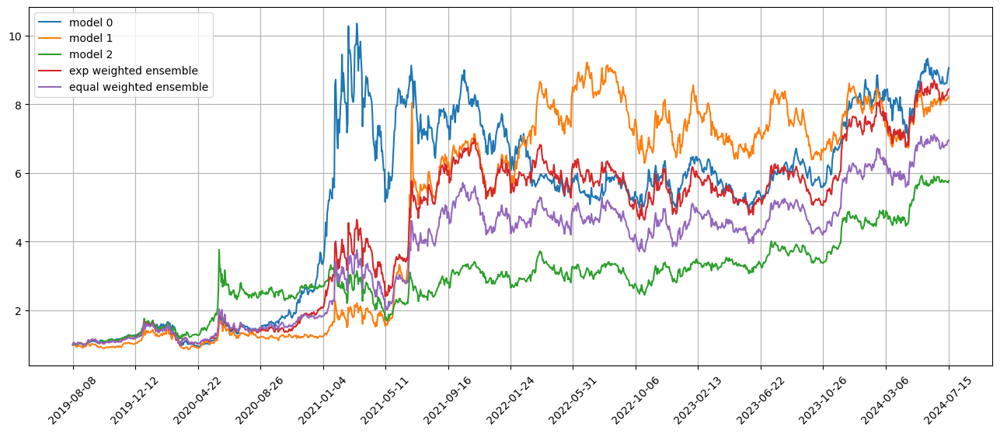

Standardization data are from 2022-12-06 to 2023-09-22
Training data are from 2023-09-25 to 2024-07-11
Testing data are from 2024-06-13 to 2024-08-08
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 63 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0627 - val_loss: 0.0603 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0625 - val_loss: 0.0601 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0624 - val_loss: 0.0600 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0623 - val_loss: 0.0602 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0623 - val_loss: 0.0600 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0625 - val_loss: 0.0600 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0601 - lr: 0.0012
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0601 - lr: 0.0012
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0603 - lr: 0.0010
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0603 - lr: 0.0010
Epoch 27/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0613 - val_loss: 0.0604 - lr: 0.0010
Epoch 28/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0603 - lr: 0.0010
Epoch 29/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0614 - val_loss: 0.0603 - lr: 0.0010
Epoch 29: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.06192019853249695
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.124701778920949

top_stocks by model 2 to buy on 2024-07-17 are ['NEU', 'HUBS', 'CPAY', 'RHI', 'CYRX', 'VST', 'PLCE', 'ANF', 'AHT', 'SRNE']
position on 2024-07-18 market open will be {'VST': 0.5249297696409054, 'CYRX': 0.6464891420269285, 'HUBS': 0.5938084005031588, 'SRNE': 0.5845500506135546, 'AHT': 0.5944098235993329, 'NEU': 0.5761881381990507, 'CPAY': 0.5885813990927836, 'ANF': 0.5552783162785226, 'RHI': 0.5937821040925196, 'PLCE': 0.5415377414075508}
Total asset on 2024-07-18 will be 5.799554885454221
It should be the same as 5.799554885454308
top_stocks by return weighted ensemble to buy on 2024-07-17 are ['HOUS', 'HUBS', 'NEU', 'CPAY', 'CYRX', 'ANF', 'RHI', 'AHT', 'MDRX', 'SRNE']
position on 2024-07-18 market open will be {'MDRX': 0.836240151632988, 'CYRX': 0.9787953085319576, 'SRNE': 0.8439911033272633, 'HUBS': 0.8606422355886542, 'CPAY': 0.8661161946192089, 'HOUS': 0.8901234660920517, 'AHT': 0.8831562043726218, 'NEU': 0.856082973284448, 'ANF': 0.8250157899569253, 'RHI': 0.8822235576446605}
Tota

top_stocks by model 2 to buy on 2024-07-22 are ['ITB', 'HI', 'SEDG', 'CSIQ', 'WST', 'HHH', 'PLUG', 'DQ', 'SGMO', 'RILY']
position on 2024-07-23 market open will be {'DQ': 0.576093459458306, 'SEDG': 0.5515876934555497, 'RILY': 0.5369531327827113, 'SGMO': 0.5415011528484401, 'WST': 0.583197568998584, 'CSIQ': 0.561448065034043, 'ITB': 0.5848586706710682, 'HI': 0.5917004137624378, 'PLUG': 0.5571539249520718, 'HHH': 0.5767463517949802}
Total asset on 2024-07-23 will be 5.661240433758104
It should be the same as 5.661240433758191
top_stocks by return weighted ensemble to buy on 2024-07-22 are ['HI', 'LAAC', 'CSIQ', 'CX', 'HHH', 'PLUG', 'MDRX', 'WST', 'SGMO', 'RILY']
position on 2024-07-23 market open will be {'MDRX': 0.8761234798611033, 'RILY': 0.8058614426640256, 'WST': 0.8733579649916954, 'CSIQ': 0.8407873516493473, 'CX': 0.9008682376503799, 'HI': 0.8860912608666267, 'LAAC': 0.8380266222289049, 'PLUG': 0.8343567325200195, 'HHH': 0.8636970503580261, 'SGMO': 0.893554743515184}
Total asset on

position on 2024-07-26 market open will be {'VST': 0.6467090412106961, 'EWW': 0.6932971473555657, 'ANF': 0.690964617271788, 'MDRX': 0.640880375582613, 'PCTY': 0.6980068021704932, 'MSTR': 0.6984300327071472, 'DELL': 0.6541056441376002, 'GGB': 0.6704098540840501, 'FTAI': 0.6695419672642273, 'SRNE': 0.6641247677895984}
Total asset on 2024-07-26 will be 6.726470249573651
It should be the same as 6.726470249573779
Testing data from 2024-06-27 to 2024-07-25 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-26 are ['CX', 'DXCM', 'WY', 'PCH', 'CLF', 'GE', 'SGMO', 'MT', 'RILY', 'SRNE']
position on 2024-07-29 market open will be {'SRNE': 0.8537712303123048, 'CX': 0.8762014967219861, 'WY': 0.8828507130460977, 'GE': 0.8929905955857118, 'MT': 0.8694406661299101, 'CLF': 0.8755413773245487, 'RILY': 0.8674334136920742, 'PCH': 0.8833739376996164, 'DXCM': 0.8593147011952439, 'SGMO': 1.2406391036691637}
Total asset on 2024-07-29 will be 9.10155723537655
It should be the same as 9

Testing data from 2024-07-02 to 2024-07-30 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-07-31 are ['MELI', 'ZTO', 'PUK', 'GGB', 'FTAI', 'ON', 'DXCM', 'VST', 'ANF', 'SRNE']
position on 2024-08-01 market open will be {'VST': 0.996271945659457, 'PUK': 0.8876901442627041, 'ANF': 0.895875680597605, 'MELI': 0.9065262024571902, 'ON': 0.9038327345024316, 'ZTO': 0.8787409443541185, 'DXCM': 0.8756595665209899, 'GGB': 0.9120484865888895, 'FTAI': 0.8946918407937483, 'SRNE': 0.8981453215775004}
Total asset on 2024-08-01 will be 9.049482867314525
It should be the same as 9.049482867314635
top_stocks by model 1 to buy on 2024-07-31 are ['FTAI', 'ON', 'EW', 'MXL', 'LSCC', 'NVDA', 'DXCM', 'VST', 'SRNE', 'ANF']
position on 2024-08-01 market open will be {'VST': 0.8935229954613315, 'NVDA': 0.8439910007076941, 'MXL': 0.8201493947132654, 'ANF': 0.8086939003626272, 'ON': 0.8158766167785897, 'LSCC': 0.8206623777212154, 'DXCM': 0.7904451092670947, 'EW': 0.8024697684154891, 'FTAI': 0

top_stocks by model 0 to buy on 2024-08-05 are ['CPA', 'LAAC', 'HTHT', 'FTAI', 'EVRI', 'ANF', 'PBF', 'VST', 'RGNX', 'SRNE']
position on 2024-08-06 market open will be {'VST': 0.8774412839789869, 'ANF': 0.8161373956055804, 'RGNX': 0.8473465898736765, 'SRNE': 0.8338106507161193, 'CPA': 0.8053607362635075, 'EVRI': 0.7911702876771778, 'LAAC': 0.834795385248476, 'FTAI': 0.8423641799364959, 'HTHT': 0.7827284275213737, 'PBF': 0.8062446166242913}
Total asset on 2024-08-06 will be 8.237399553445576
It should be the same as 8.237399553445686
top_stocks by model 1 to buy on 2024-08-05 are ['EWW', 'ARCH', 'JBL', 'MUFG', 'MOD', 'RGNX', 'FIVE', 'NVDA', 'VST', 'SRNE']
position on 2024-08-06 market open will be {'MUFG': 0.7306842299716523, 'RGNX': 0.8080407389567822, 'SRNE': 0.7951326911637566, 'NVDA': 0.8661688459845511, 'MOD': 0.8737134425522166, 'VST': 0.8044525353066991, 'EWW': 0.7807133135002616, 'JBL': 0.7874108471436498, 'ARCH': 0.7794827113566366, 'FIVE': 0.7896638106225012}
Total asset on 202

position on 2024-08-09 market open will be {'WW': 0.8192487398561731, 'VST': 0.8444629541989296, 'XRX': 0.8301720459703023, 'DQ': 0.8109972524198032, 'ADNT': 0.7960270983689464, 'LAAC': 0.883271344174922, 'ODP': 0.8534825592552727, 'NUS': 0.8145910823944966, 'GT': 0.8219902973880887, 'ANF': 0.8285346710732525}
Total asset on 2024-08-09 will be 8.302778045100077
It should be the same as 8.302778045100188
top_stocks by model 1 to buy on 2024-08-08 are ['EVTC', 'THRM', 'SAN', 'ANF', 'NVRO', 'CYRX', 'GFF', 'SRNE', 'ODP', 'DXCM']
position on 2024-08-09 market open will be {'DXCM': 0.7865970090962159, 'SRNE': 0.8220274638917732, 'SAN': 0.8084163148571644, 'EVTC': 0.8236001099265748, 'THRM': 0.7896937001677209, 'ODP': 0.8661862651994303, 'NVRO': 0.9517747670585117, 'CYRX': 0.8686563706819955, 'ANF': 0.840867038866495, 'GFF': 0.8133186933367255}
Total asset on 2024-08-09 will be 8.37113773308253
It should be the same as 8.371137733082607
top_stocks by model 2 to buy on 2024-08-08 are ['ODP', '

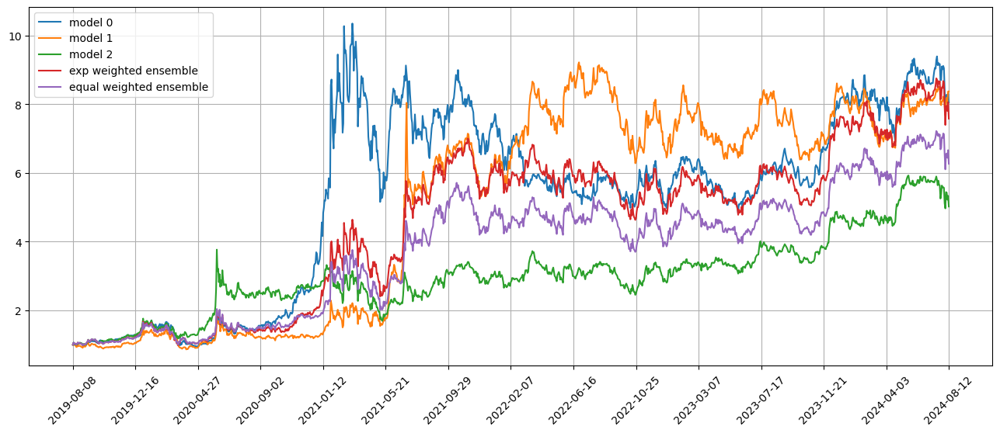

Standardization data are from 2023-01-05 to 2023-10-20
Training data are from 2023-10-23 to 2024-08-08
Testing data are from 2024-07-15 to 2024-09-06
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 64 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0599 - val_loss: 0.0981 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0598 - val_loss: 0.0981 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0598 - val_loss: 0.0981 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0598 - val_loss: 0.0980 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0599 - val_loss: 0.0981 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0597 - val_loss: 0.0981 - lr: 0.0100
Epoch 7/500
305/305 [

Epoch 38: early stopping
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0596 - val_loss: 0.0982 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0598 - val_loss: 0.0982 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0595 - val_loss: 0.0981 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0596 - val_loss: 0.0981 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0595 - val_loss: 0.0982 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0595 - val_loss: 0.0981 - lr: 0.0100
Epoch 7/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0594 - val_loss: 0.0981 - lr: 0.0100
Epoch 8/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0596 - val_loss: 0.0981 - lr: 0.0100
Epoch 9/500
305/305 [==============================] - 2s 6ms/s

top_stocks by model 1 to buy on 2024-08-13 are ['BOND', 'VGIT', 'BND', 'SCHP', 'GOVT', 'IEF', 'GVI', 'SPAB', 'UVXY', 'VIXY']
position on 2024-08-14 market open will be {'SPAB': 0.8368788071020818, 'BOND': 0.8373598324843046, 'VIXY': 0.7738609365480422, 'SCHP': 0.8365550554775606, 'VGIT': 0.8364156065531071, 'UVXY': 0.74437746450548, 'GOVT': 0.8369147176419935, 'BND': 0.8379081019610826, 'IEF': 0.8364690867374831, 'GVI': 0.8369491746091687}
Total asset on 2024-08-14 will be 8.213688783620228
It should be the same as 8.213688783620304
top_stocks by model 2 to buy on 2024-08-13 are ['CRL', 'SPXS', 'ODP', 'TZA', 'SPLB', 'TWM', 'VIXY', 'TMF', 'SPAB', 'IDEX']
position on 2024-08-14 market open will be {'IDEX': 0.5023744481158738, 'VIXY': 0.4633147542569057, 'SPAB': 0.5010438963166894, 'SPXS': 0.48315865167861416, 'CRL': 0.5269371159330788, 'TWM': 0.4873513100727665, 'ODP': 0.4908330543498938, 'TMF': 0.5044281869904789, 'SPLB': 0.5044856130861932, 'TZA': 0.48183410124600223}
Total asset on 20

top_stocks by model 2 to buy on 2024-08-16 are ['OI', 'SIGA', 'FSLR', 'MED', 'PCRX', 'IONS', 'PRO', 'EVRI', 'RILY', 'IDEX']
position on 2024-08-19 market open will be {'RILY': 0.3893271028705163, 'IONS': 0.49150746552118807, 'PCRX': 0.48623302864404394, 'SIGA': 0.5169291470396958, 'EVRI': 0.49216188218639817, 'PRO': 0.49659909454658563, 'MED': 0.4916680097183608, 'IDEX': 0.49140180545123324, 'FSLR': 0.48281836780143006, 'OI': 0.5007271074324516}
Total asset on 2024-08-19 will be 4.839373011211815
It should be the same as 4.8393730112119036
top_stocks by return weighted ensemble to buy on 2024-08-16 are ['HAE', 'BEP', 'DDS', 'IONS', 'PRO', 'SIGA', 'EVRI', 'PCRX', 'RILY', 'IDEX']
position on 2024-08-19 market open will be {'PCRX': 0.7663023527262386, 'RILY': 0.5803401401334517, 'IONS': 0.745941325565652, 'SIGA': 0.7845228001927267, 'EVRI': 0.7469345077021664, 'PRO': 0.7536686883646406, 'DDS': 0.7615394680902118, 'HAE': 0.7607892357916778, 'BEP': 0.7304813533994396, 'IDEX': 0.745780969481

position on 2024-08-22 market open will be {'RVNC': 0.6266068183768234, 'SBUX': 0.6269497000174391, 'MSTR': 0.65856959218682, 'TPIC': 0.653947967058169, 'RILY': 0.8519407975246487, 'RGNX': 0.6377451694032649, 'NTR': 0.6325001595243555, 'INSM': 0.6343598396830145, 'ANF': 0.6234201615600112, 'SRNE': 0.6257319257694319}
Total asset on 2024-08-22 will be 6.571772131103846
It should be the same as 6.571772131103978
Testing data from 2024-07-25 to 2024-08-21 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-22 are ['NVDA', 'SBUX', 'DECK', 'MMYT', 'RILY', 'VST', 'GEVO', 'GL', 'EXPRQ', 'IDEX']
position on 2024-08-23 market open will be {'GL': 0.8346931922431748, 'NVDA': 0.792157636788341, 'SBUX': 0.7890465773165628, 'IDEX': 0.7859872638637043, 'RILY': 0.6484196867076167, 'VST': 0.8156064334507378, 'GEVO': 0.7306753844419897, 'EXPRQ': 0.8007401383438562, 'DECK': 0.7968026726904568, 'MMYT': 0.7906406962070371}
Total asset on 2024-08-23 will be 7.784769682053358
It should

position on 2024-08-27 market open will be {'RILY': 0.6628706829437938, 'MSTR': 0.6611660362023558, 'LMBS': 0.6296654789990624, 'BRC': 0.6410085687600063, 'EXPRQ': 0.6482267345519003, 'MDT': 0.6552504036536813, 'ULTA': 0.6398776169452346, 'ACGL': 0.6528658397135508, 'KNDI': 0.6410242219571576, 'VRSK': 0.6461531387186926}
Total asset on 2024-08-27 will be 6.478108722445302
It should be the same as 6.478108722445435
Testing data from 2024-07-30 to 2024-08-26 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-08-27 are ['FTAI', 'DELL', 'KOLD', 'RILY', 'GL', 'MSTR', 'LMBS', 'SRNE', 'EXPRQ', 'IDEX']
position on 2024-08-28 market open will be {'GL': 0.8542975828399832, 'LMBS': 0.7618686753335305, 'MSTR': 0.7635879769065246, 'FTAI': 0.7715668273210491, 'SRNE': 0.7593875259512531, 'EXPRQ': 0.7990277631682219, 'RILY': 0.7808253294233556, 'DELL': 0.8038130712990055, 'KOLD': 0.8200515796273531, 'IDEX': 0.8040316878924295}
Total asset on 2024-08-28 will be 7.9184580197625865
I

top_stocks by model 0 to buy on 2024-08-30 are ['RILY', 'ERY', 'RWM', 'VRSK', 'DRIP', 'GL', 'MSTR', 'SRNE', 'LMBS', 'IDEX']
position on 2024-09-03 market open will be {'GL': 0.8760801893442413, 'MSTR': 0.7295426337579353, 'SRNE': 0.7593875259512531, 'IDEX': 0.8040316878924295, 'RILY': 0.6963419077967484, 'LMBS': 0.7729096130943204, 'DRIP': 0.7920242973666278, 'RWM': 0.779978339457681, 'VRSK': 0.7743583451319995, 'ERY': 0.7848714735721855}
Total asset on 2024-09-03 will be 7.769526013365301
It should be the same as 7.7695260133654225
top_stocks by model 1 to buy on 2024-08-30 are ['PSTG', 'SSYS', 'INTU', 'VRSK', 'TWM', 'RWM', 'AEO', 'RILY', 'DRIP', 'ERY']
position on 2024-09-03 market open will be {'RILY': 0.753525365354904, 'SSYS': 0.8302295688747063, 'PSTG': 0.8416055149516835, 'TWM': 0.8525594406001822, 'RWM': 0.8462105224788863, 'DRIP': 0.859279367881665, 'ERY': 0.8515191590988122, 'AEO': 0.8226785845777235, 'INTU': 0.850355630777183, 'VRSK': 0.8401133040125761}
Total asset on 2024-

top_stocks by model 0 to buy on 2024-09-05 are ['JKS', 'SID', 'SQM', 'PENN', 'MTZ', 'CRK', 'VUZI', 'GGB', 'LMBS', 'IDEX']
position on 2024-09-06 market open will be {'IDEX': 0.8040316878924295, 'SID': 0.7645995261799049, 'SQM': 0.7287464957829534, 'CRK': 0.7416169238620671, 'LMBS': 0.750340020011399, 'VUZI': 0.7912464533047608, 'PENN': 0.7383468999769849, 'GGB': 0.7592386226612866, 'JKS': 0.7706316668703758, 'MTZ': 0.7342287193698915}
Total asset on 2024-09-06 will be 7.583027015911933
It should be the same as 7.583027015912054
top_stocks by model 1 to buy on 2024-09-05 are ['ANF', 'RDFN', 'SID', 'PCRX', 'CRK', 'GGB', 'VUZI', 'SQM', 'LMBS', 'IDEX']
position on 2024-09-06 market open will be {'SQM': 0.7790925158806685, 'IDEX': 0.790472529427374, 'SID': 0.8187590640014807, 'LMBS': 0.8034895019315427, 'CRK': 0.7941485151876647, 'PCRX': 0.7766915624996388, 'VUZI': 0.8472934959024092, 'GGB': 0.8130184269793315, 'RDFN': 0.7999185646660733, 'ANF': 0.7958886342038893}
Total asset on 2024-09-06

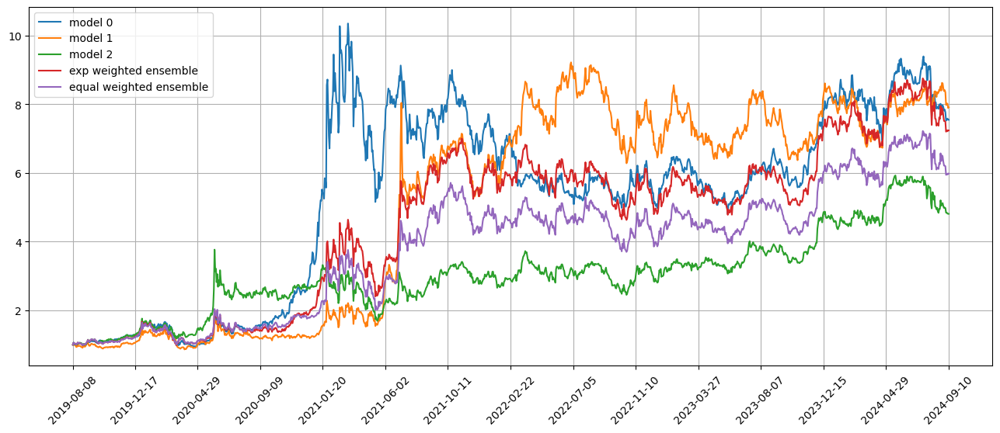

Standardization data are from 2023-02-03 to 2023-11-17
Training data are from 2023-11-20 to 2024-09-06
Testing data are from 2024-08-12 to 2024-10-04
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 65 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0608 - val_loss: 0.0873 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0607 - val_loss: 0.0866 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0607 - val_loss: 0.0870 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0608 - val_loss: 0.0868 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0868 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0606 - val_loss: 0.0884 - lr: 0.0100
Epoch 7/500
305/305 [

96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.0659216768558998
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.05287134836523986
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06577736138126136
11/11 [==============================] - 0s 2ms/step
Model 1 test loss 0.05303149817259793
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.0658418200214794
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.05252113289442979
Correlations between old and new weights
0.9913545980909743
0.06302628724626157
0.9653754985657012
0.5966939252624801
0.9934638914216937
0.5838511229556818
Weight of model 0 is 0.3071102647611332
Weight of model 1 is 0.3631258492924967
Weight of model 2 is 0.32976388594637
Testing data from 2024-08-12 to 2024-09-09 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-10 are ['CRS', 'MOD', 'GE', 'AAPL', 'APH', 'MTSI', '

position on 2024-09-13 market open will be {'EXPRQ': 0.7249748157534986, 'IDEX': 0.723723987817695, 'GL': 0.7322500195020635, 'BRK-A': 0.740091159212716, 'KMB': 0.7362517028673456, 'WRB': 0.7532319338135843, 'BRK-B': 0.739430645245096, 'MCK': 0.7436731774173767, 'GKOS': 0.7527258910568048, 'CPRT': 0.7497529091799332}
Total asset on 2024-09-13 will be 7.396106241865919
It should be the same as 7.396106241866114
top_stocks by equal weighted ensemble to buy on 2024-09-12 are ['KMB', 'BRK-B', 'MCK', 'CPRT', 'GKOS', 'WRB', 'GL', 'BRK-A', 'EXPRQ', 'IDEX']
position on 2024-09-13 market open will be {'EXPRQ': 0.5928514671001212, 'IDEX': 0.5985549596546575, 'GL': 0.6056064027970077, 'BRK-A': 0.6121510562137054, 'KMB': 0.6089753295105178, 'WRB': 0.6230201754448348, 'BRK-B': 0.6116047257814482, 'MCK': 0.6151138482969027, 'GKOS': 0.6226016126715929, 'CPRT': 0.6201425723582792}
Total asset on 2024-09-13 will be 6.110622149828933
It should be the same as 6.110622149829068
Testing data from 2024-08-1

position on 2024-09-18 market open will be {'ANF': 0.6118526765702513, 'JACK': 0.6285798153387901, 'MOD': 0.6313307082593449, 'LMBS': 0.6245813843305487, 'FIX': 0.6332537662739446, 'CASY': 0.6117612411854514, 'FTAI': 0.6164053746349736, 'CYBR': 0.6227093031630317, 'PWR': 0.6247655605916534, 'ANET': 0.619801037061135}
Total asset on 2024-09-18 will be 6.225040867408988
It should be the same as 6.225040867409125
Testing data from 2024-08-20 to 2024-09-17 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-18 are ['ERJ', 'L', 'CSX', 'RSG', 'AFG', 'X', 'GKOS', 'XPO', 'WRB', 'CPRT']
position on 2024-09-19 market open will be {'ERJ': 0.7900413335471856, 'WRB': 0.7897455387219307, 'XPO': 0.8167268905565699, 'CSX': 0.8064311146711286, 'X': 0.8006315998485701, 'RSG': 0.7892856090916821, 'AFG': 0.7979644600618622, 'L': 0.8003702611864151, 'GKOS': 0.8211315699542221, 'CPRT': 0.8095805345617311}
Total asset on 2024-09-19 will be 8.021908912201171
It should be the same as 8.0

Testing data from 2024-08-23 to 2024-09-20 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-09-23 are ['QRVO', 'CSTM', 'TEAM', 'DLTR', 'STLD', 'QD', 'CPRT', 'DECK', 'AAPL', 'HPE']
position on 2024-09-24 market open will be {'DECK': 0.8305264707240129, 'CSTM': 0.8016745881475766, 'DLTR': 0.8036705767111622, 'QRVO': 0.8013380282996555, 'STLD': 0.8163747354123808, 'HPE': 0.8003381035548228, 'QD': 0.8301741930171215, 'AAPL': 0.7994277500254692, 'TEAM': 0.7855244655380661, 'CPRT': 0.7980881543788718}
Total asset on 2024-09-24 will be 8.06713706580901
It should be the same as 8.06713706580914
top_stocks by model 1 to buy on 2024-09-23 are ['KLAC', 'NVDA', 'HEFA', 'HPE', 'ICLR', 'CSTM', 'SRNE', 'DECK', 'GL', 'EXPRQ']
position on 2024-09-24 market open will be {'GL': 0.8199241556964043, 'EXPRQ': 0.8264788397820189, 'NVDA': 0.8320607616884219, 'SRNE': 0.8379877439716918, 'CSTM': 0.863442815138889, 'KLAC': 0.8624801924584024, 'HPE': 0.8620033557419987, 'HEFA': 0.8592759885

top_stocks by model 0 to buy on 2024-09-26 are ['FDX', 'DECK', 'GNTX', 'NUS', 'SKX', 'SEDG', 'ALB', 'SIRI', 'VTNR', 'EXPRQ']
position on 2024-09-27 market open will be {'EXPRQ': 0.800934259258637, 'SIRI': 0.8040673889467704, 'VTNR': 0.6876552792777141, 'SEDG': 0.842125772146568, 'ALB': 0.8443219645159422, 'FDX': 0.7991824517326099, 'NUS': 0.8267888729656193, 'SKX': 0.8194829745959604, 'GNTX': 0.8076650992274802, 'DECK': 0.806767829439355}
Total asset on 2024-09-27 will be 8.038991892106534
It should be the same as 8.038991892106656
top_stocks by model 1 to buy on 2024-09-26 are ['SITC', 'UCTT', 'AMCX', 'CMP', 'ALB', 'NRG', 'VTNR', 'NBIX', 'GL', 'EXPRQ']
position on 2024-09-27 market open will be {'GL': 0.836331749611797, 'EXPRQ': 0.8264788397820189, 'VTNR': 0.7336644514412134, 'UCTT': 0.8440196179195564, 'ALB': 0.9008132848001997, 'NRG': 0.8465395059865064, 'SITC': 0.8465010162947239, 'NBIX': 0.8607079197230685, 'AMCX': 0.891528812285973, 'CMP': 0.9061395745006879}
Total asset on 2024-

top_stocks by model 1 to buy on 2024-10-01 are ['REGN', 'MCK', 'ROST', 'RDY', 'NVDA', 'VTNR', 'MDRX', 'SRNE', 'GL', 'IDEX']
position on 2024-10-02 market open will be {'GL': 0.8013033729692426, 'NVDA': 0.7982611032168214, 'IDEX': 0.8498834409594507, 'MDRX': 0.839614412560137, 'VTNR': 0.860642373698925, 'REGN': 0.8495623828114509, 'ROST': 0.847310621321579, 'MCK': 0.8683796886495023, 'RDY': 0.8657587576814193, 'SRNE': 0.860642373698925}
Total asset on 2024-10-02 will be 8.441358527567377
It should be the same as 8.441358527567454
top_stocks by model 2 to buy on 2024-10-01 are ['NRG', 'SHM', 'ARWR', 'CBOE', 'RDY', 'AMCX', 'ACN', 'VTNR', 'IDEX', 'EXPRQ']
position on 2024-10-02 market open will be {'AMCX': 0.5417519725105031, 'EXPRQ': 0.5256667003133039, 'IDEX': 0.5256667003133039, 'VTNR': 0.5316532646382223, 'SHM': 0.5317637998901907, 'NRG': 0.5386202143123797, 'ACN': 0.5282386083726075, 'ARWR': 0.5263920979610981, 'CBOE': 0.5432841255932455, 'RDY': 0.5348138599453589}
Total asset on 2024

position on 2024-10-07 market open will be {'GL': 0.8090874372597799, 'IDEX': 0.8498834409594507, 'KOLD': 0.959891169862511, 'MDRX': 0.8284370940902988, 'YANG': 0.7858654667928289, 'PAG': 0.8503428798231303, 'NEU': 0.8413965777381697, 'PPC': 0.8739388986120006, 'ENSG': 0.835511460902873, 'KNDI': 0.839156156794436}
Total asset on 2024-10-07 will be 8.473510582835404
It should be the same as 8.473510582835479
top_stocks by model 2 to buy on 2024-10-04 are ['IBN', 'NG', 'LLY', 'INFY', 'PPLT', 'YANG', 'KOLD', 'KNDI', 'NVDA', 'IDEX']
position on 2024-10-07 market open will be {'YANG': 0.4353150151532075, 'KNDI': 0.5162350321385896, 'NVDA': 0.5337227646925881, 'INFY': 0.5363407925029089, 'IBN': 0.5305998914566995, 'NG': 0.5071269420889543, 'PPLT': 0.5253850714241164, 'IDEX': 0.5335092780496425, 'LLY': 0.5362794943144066, 'KOLD': 0.5780168688762685}
Total asset on 2024-10-07 will be 5.232531150697286
It should be the same as 5.232531150697382
top_stocks by return weighted ensemble to buy on 2

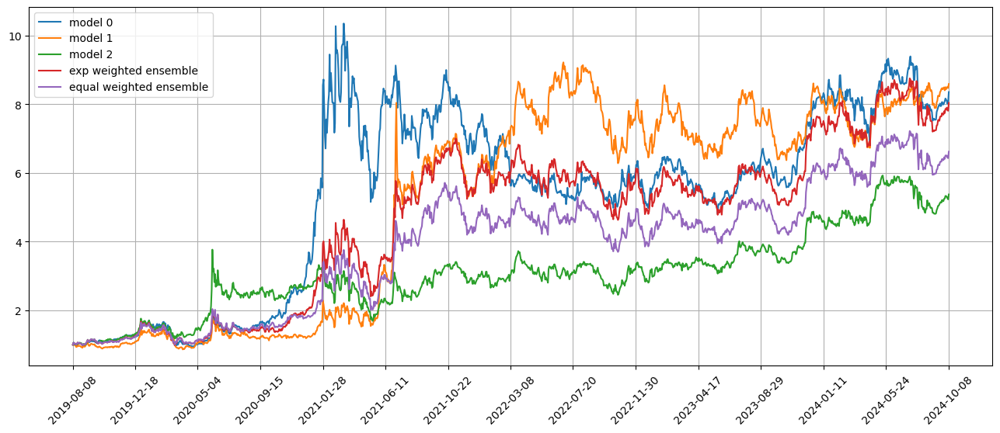

Standardization data are from 2023-03-06 to 2023-12-18
Training data are from 2023-12-19 to 2024-10-04
Testing data are from 2024-09-10 to 2024-11-01
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 66 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0711 - val_loss: 0.0491 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0709 - val_loss: 0.0503 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0710 - val_loss: 0.0504 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0710 - val_loss: 0.0492 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0709 - val_loss: 0.0493 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0708 - val_loss: 0.0497 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0696 - val_loss: 0.0508 - lr: 0.0012
Epoch 24: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.06663229505306313
11/11 [==============================] - 0s 2ms/step
Model 0 test loss 0.051195946086525834
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06651968784049729
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.05093303175291279
96/96 [==============================] - 0s 3ms/step
Model 2 training loss 0.06648217071301324
11/11 [==============================] - 0s 2ms/step
Model 2 test loss 0.05142038605309155
Correlations between old and new weights
0.9924302272693125
0.28657705429216396
0.93194210515962
0.005212599022197938
0.9168814861694077
0.5433563687350317
Weight of model 0 is 0.3128488452826646
Weight of model 1 is 0.35475393267665045
Weight of model 2 is 0.33239722204068506
Testing data from 2024-09-10 to 2024

top_stocks by model 0 to buy on 2024-10-11 are ['EFX', 'HUM', 'LSTR', 'KBH', 'WSM', 'GL', 'LMBS', 'VTNR', 'YANG', 'EXPRQ']
position on 2024-10-14 market open will be {'VTNR': 0.8066372049360394, 'YANG': 1.037104969288761, 'GL': 0.8457635782765086, 'EXPRQ': 0.8373544817054998, 'LMBS': 0.8331953803315818, 'KBH': 0.8309786560710385, 'HUM': 0.876868316338393, 'WSM': 0.8487571908119682, 'EFX': 0.8341139346466987, 'LSTR': 0.8524171644938476}
Total asset on 2024-10-14 will be 8.603190876900214
It should be the same as 8.603190876900337
top_stocks by model 1 to buy on 2024-10-11 are ['VCYT', 'AWK', 'NMRK', 'VTNR', 'LSTR', 'SWX', 'NWE', 'SHM', 'SRNE', 'EXPRQ']
position on 2024-10-14 market open will be {'EXPRQ': 0.8548238443806171, 'AWK': 0.8701475312426171, 'VTNR': 0.8561491459154756, 'SRNE': 0.8561491459154756, 'SHM': 0.8568638110025617, 'SWX': 0.8731945065856198, 'VCYT': 0.8920212749290309, 'NMRK': 0.8807304502397942, 'NWE': 0.8693472628370096, 'LSTR': 0.8762571177041704}
Total asset on 2024

position on 2024-10-17 market open will be {'EXPRQ': 0.8702137203735015, 'MOG-A': 0.8744451846524808, 'ATI': 0.8719342190404313, 'LMBS': 0.868299057013877, 'CDNA': 0.8611308254666156, 'VPL': 0.8681824171190686, 'PKX': 0.8514373440762222, 'RACE': 0.8868057153881603, 'SITE': 0.8579510865385491, 'UNH': 0.872264746252156}
Total asset on 2024-10-17 will be 8.682664315920984
It should be the same as 8.682664315921063
top_stocks by model 2 to buy on 2024-10-16 are ['VTNR', 'HII', 'SCHX', 'RACE', 'MOG-A', 'NRG', 'CDNA', 'MSTR', 'LMBS', 'EXPRQ']
position on 2024-10-17 market open will be {'HII': 0.5673673844416168, 'VTNR': 0.5630023306989954, 'MSTR': 0.5430057748432081, 'LMBS': 0.56403468901392, 'NRG': 0.5759513823960204, 'CDNA': 0.5593783079907229, 'SCHX': 0.5684111168158411, 'RACE': 0.5760563504639783, 'EXPRQ': 0.5630023306989954, 'MOG-A': 0.5680271259091086}
Total asset on 2024-10-17 will be 5.648236793272311
It should be the same as 5.648236793272408
top_stocks by return weighted ensemble t

top_stocks by model 2 to buy on 2024-10-21 are ['PAAS', 'SKX', 'GL', 'GNR', 'UNH', 'CENX', 'SRNE', 'ASML', 'CDNA', 'EXPRQ']
position on 2024-10-22 market open will be {'EXPRQ': 0.5630023306989954, 'GL': 0.5578693455666971, 'GNR': 0.5593476205677343, 'CENX': 0.5397373854963227, 'UNH': 0.562526969808419, 'CDNA': 0.5485665135123184, 'SKX': 0.5568456658450983, 'ASML': 0.5635208089015086, 'PAAS': 0.5623046650523476, 'SRNE': 0.564300229107458}
Total asset on 2024-10-22 will be 5.578021534556803
It should be the same as 5.578021534556899
top_stocks by return weighted ensemble to buy on 2024-10-21 are ['CAT', 'SKX', 'HMY', 'UNH', 'PAAS', 'GNR', 'CDNA', 'GL', 'CENX', 'EXPRQ']
position on 2024-10-22 market open will be {'GL': 0.7798700538182464, 'EXPRQ': 0.8514748155769583, 'GNR': 0.8356472599503734, 'CENX': 0.8063502028040946, 'UNH': 0.840397104919244, 'CDNA': 0.819540634591092, 'CAT': 0.8375447638900222, 'PAAS': 0.84006498880137, 'SKX': 0.8319094204895233, 'HMY': 0.8465590032818118}
Total asse

position on 2024-10-25 market open will be {'YANG': 0.5692675766684566, 'CACC': 0.5597228264928511, 'MDRX': 0.5592562371472853, 'LMBS': 0.5513201217231871, 'ITRI': 0.5508572802187568, 'GL': 0.5254568752940683, 'CBOE': 0.5533704129540181, 'FIXD': 0.5520238175362373, 'EXPRQ': 0.5506428087763605, 'MMYT': 0.5705502144972573}
Total asset on 2024-10-25 will be 5.542468171308381
It should be the same as 5.542468171308479
top_stocks by return weighted ensemble to buy on 2024-10-24 are ['ITRI', 'MGPI', 'FIXD', 'ERIE', 'CSX', 'CBOE', 'GL', 'LMBS', 'MMYT', 'MDRX']
position on 2024-10-25 market open will be {'MGPI': 0.8124879971304677, 'GL': 0.8065282455822739, 'MDRX': 0.8396145251834354, 'LMBS': 0.8276999905908595, 'CSX': 0.8227194215524973, 'ITRI': 0.8270051240446057, 'CBOE': 0.8307781043139053, 'FIXD': 0.8287564530613748, 'ERIE': 0.8139138371488476, 'MMYT': 0.8565702367164869}
Total asset on 2024-10-25 will be 8.266073935324554
It should be the same as 8.266073935324755
top_stocks by equal weig

Testing data from 2024-10-02 to 2024-10-29 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-10-30 are ['ANF', 'AVY', 'VKTX', 'CRS', 'FTAI', 'GL', 'MGPI', 'MMYT', 'SRNE', 'IDEX']
position on 2024-10-31 market open will be {'IDEX': 0.8490730706003573, 'GL': 0.8021724934899654, 'MGPI': 0.8592144370708766, 'AVY': 0.8659832562639467, 'VKTX': 0.8626624892820833, 'CRS': 0.8425491590442161, 'FTAI': 0.8432122576287514, 'ANF': 0.8355378160743857, 'MMYT': 0.8392686318853931, 'SRNE': 0.8581901973089273}
Total asset on 2024-10-31 will be 8.457863808648774
It should be the same as 8.457863808648904
top_stocks by model 1 to buy on 2024-10-30 are ['PANW', 'CPRI', 'RMD', 'MMYT', 'SWK', 'ECL', 'CHKP', 'WU', 'SRNE', 'CROX']
position on 2024-10-31 market open will be {'PANW': 0.8644822741257434, 'CHKP': 0.8626895433966735, 'ECL': 0.8478763535695244, 'SRNE': 0.8636763050205628, 'SWK': 0.8655254926717916, 'RMD': 0.8590615010001175, 'CPRI': 0.8307866153332629, 'WU': 0.8604922480583909,

Testing data from 2024-10-07 to 2024-11-01 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-11-04 are ['DHI', 'MDRX', 'VST', 'NRG', 'DECK', 'TOL', 'GRMN', 'SRNE', 'MGPI', 'IDEX']
position on 2024-11-05 market open will be {'IDEX': 0.8490730706003573, 'MDRX': 0.843191687490191, 'DHI': 0.8304480303795934, 'NRG': 0.8593754443696651, 'VST': 0.8258809804826908, 'MGPI': 0.8462905754884733, 'GRMN': 0.8501400997055828, 'TOL': 0.8295656367775098, 'DECK': 0.8559785795155755, 'SRNE': 0.835679964315649}
Total asset on 2024-11-05 will be 8.425624069125156
It should be the same as 8.425624069125288
top_stocks by model 1 to buy on 2024-11-04 are ['CPT', 'UFPI', 'CTSH', 'VRRM', 'AMED', 'TREE', 'NEAR', 'HPE', 'MDRX', 'ESNT']
position on 2024-11-05 market open will be {'ESNT': 0.8435227411150186, 'MDRX': 0.857135495146276, 'CPT': 0.8582127352824315, 'NEAR': 0.8496674745548753, 'CTSH': 0.8565730410260728, 'VRRM': 0.8234682380965349, 'HPE': 0.844018944092522, 'AMED': 0.8468307273047

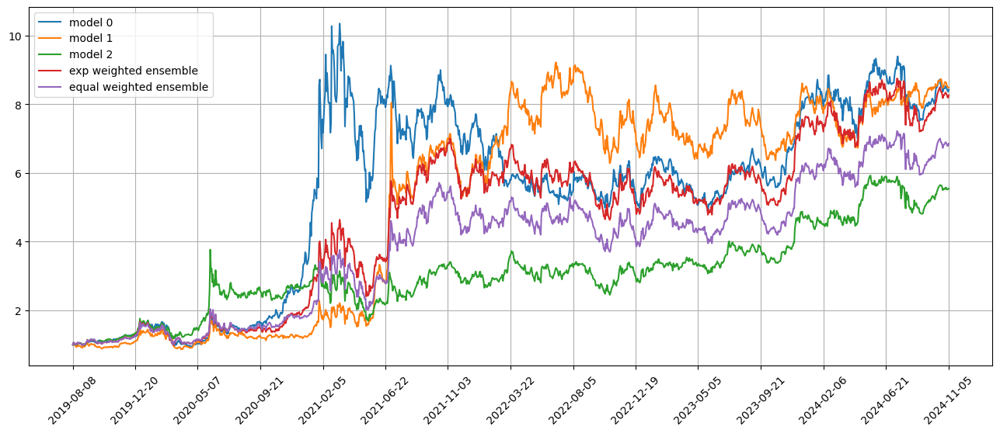

Standardization data are from 2023-04-03 to 2024-01-18
Training data are from 2024-01-19 to 2024-11-01
Testing data are from 2024-10-08 to 2024-12-02
Training data have shape (389512, 20, 28), (389512,)
Testing data have shape (43040, 20, 28), (43040,)
Running iteration 67 out of 67 iterations
Epoch 1/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0693 - val_loss: 0.0509 - lr: 0.0100
Epoch 2/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0693 - val_loss: 0.0506 - lr: 0.0100
Epoch 3/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0691 - val_loss: 0.0509 - lr: 0.0100
Epoch 4/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0691 - val_loss: 0.0509 - lr: 0.0100
Epoch 5/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0510 - lr: 0.0100
Epoch 6/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0690 - val_loss: 0.0510 - lr: 0.0100
Epoch 7/500
305/305 [

305/305 [==============================] - 2s 6ms/step - loss: 0.0681 - val_loss: 0.0513 - lr: 0.0010
Epoch 23/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0680 - val_loss: 0.0513 - lr: 0.0010
Epoch 24/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0681 - val_loss: 0.0513 - lr: 0.0010
Epoch 25/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0680 - val_loss: 0.0513 - lr: 0.0010
Epoch 26/500
305/305 [==============================] - 2s 6ms/step - loss: 0.0680 - val_loss: 0.0514 - lr: 0.0010
Epoch 26: early stopping
96/96 [==============================] - 0s 3ms/step
Model 0 training loss 0.065712382301195
11/11 [==============================] - 0s 3ms/step
Model 0 test loss 0.08902014274981103
96/96 [==============================] - 0s 3ms/step
Model 1 training loss 0.06559233152975469
11/11 [==============================] - 0s 3ms/step
Model 1 test loss 0.0891949360226384
96/96 [==============================] - 0s 

position on 2024-11-08 market open will be {'GL': 0.8751718117224772, 'IDEX': 0.8689746948947601, 'FBND': 0.8789806125355287, 'DHI': 0.8854271199364169, 'GE': 0.8694690323884112, 'IRM': 0.9041895954990005, 'VST': 0.8578938115788955, 'CBOE': 0.8580957877674655, 'NNN': 0.8779922821007865, 'LOGI': 0.8608724298586854}
Total asset on 2024-11-08 will be 8.737067178282224
It should be the same as 8.737067178282429
top_stocks by equal weighted ensemble to buy on 2024-11-07 are ['DHI', 'CBOE', 'GE', 'FBND', 'VST', 'LOGI', 'IRM', 'NNN', 'GL', 'IDEX']
position on 2024-11-08 market open will be {'GL': 0.7260159307483406, 'IDEX': 0.7208749910135747, 'FBND': 0.7291755961195096, 'DHI': 0.7345234226925801, 'GE': 0.7212850783709936, 'IRM': 0.7500882020607617, 'VST': 0.7116826270613495, 'CBOE': 0.7118501803675341, 'NNN': 0.7283557072350011, 'LOGI': 0.7141535982395567}
Total asset on 2024-11-08 will be 7.24800533390906
It should be the same as 7.248005333909202
Testing data from 2024-10-11 to 2024-11-07 

top_stocks by model 0 to buy on 2024-11-13 are ['NNN', 'WELL', 'EGO', 'HII', 'IIPR', 'NRG', 'GL', 'IRM', 'VST', 'IDEX']
position on 2024-11-14 market open will be {'IDEX': 0.8490730706003573, 'VST': 1.0099307952124517, 'GL': 0.9035828620743639, 'HII': 0.9233390473331426, 'NNN': 0.9288734655629132, 'WELL': 0.9147273042355624, 'IIPR': 0.9158587119618966, 'IRM': 0.933229110595096, 'NRG': 0.9244534502094468, 'EGO': 0.9108911476607322}
Total asset on 2024-11-14 will be 9.21395896544583
It should be the same as 9.213958965445963
top_stocks by model 1 to buy on 2024-11-13 are ['DLR', 'EGO', 'IIPR', 'CVNA', 'NRG', 'IRM', 'VST', 'GL', 'EXPRQ', 'IDEX']
position on 2024-11-14 market open will be {'GL': 0.9088508259308206, 'IDEX': 0.8487533737911888, 'EXPRQ': 0.9420315256818226, 'DLR': 0.9289288289781508, 'IIPR': 0.9325730476573544, 'IRM': 0.9502604544383468, 'NRG': 0.9413246390727654, 'VST': 0.9243899585726882, 'EGO': 0.9275148257730562, 'CVNA': 0.9183446972506003}
Total asset on 2024-11-14 will 

top_stocks by model 1 to buy on 2024-11-18 are ['NRG', 'AGI', 'HMY', 'IRM', 'KGC', 'FTAI', 'VST', 'GL', 'IDEX', 'EXPRQ']
position on 2024-11-19 market open will be {'GL': 0.8877510390322261, 'IDEX': 0.8487533737911888, 'EXPRQ': 0.9420315256818226, 'VST': 0.9760343668180017, 'AGI': 0.9716564842395915, 'IRM': 0.9563385741363544, 'NRG': 0.9429780946281398, 'FTAI': 0.9510371877657305, 'KGC': 0.9730132636489086, 'HMY': 0.9841520850337366}
Total asset on 2024-11-19 will be 9.433745994775618
It should be the same as 9.4337459947757
top_stocks by model 2 to buy on 2024-11-18 are ['APPS', 'OLED', 'NSIT', 'OTEX', 'NNN', 'AVGO', 'MPWR', 'HMY', 'KGC', 'IRM']
position on 2024-11-19 market open will be {'IRM': 0.5933286941824699, 'AVGO': 0.590106583574969, 'NSIT': 0.5730305797439151, 'NNN': 0.6005616461052761, 'APPS': 0.5507450227491855, 'OLED': 0.5850361827743016, 'OTEX': 0.5708724069094737, 'KGC': 0.6036739547648077, 'HMY': 0.6105846687375869, 'MPWR': 0.6015010066214201}
Total asset on 2024-11-19 

position on 2024-11-22 market open will be {'EXPRQ': 0.5873457835534374, 'CE': 0.6123640024401141, 'AKAM': 0.6141562401684308, 'NVDA': 0.5783227067767492, 'AG': 0.5828948057213804, 'NEAR': 0.5919931991316073, 'GGAL': 0.5720855329599079, 'WKHS': 0.5749655350598188, 'BMA': 0.5746371449704171, 'CMG': 0.6061432110377201}
Total asset on 2024-11-22 will be 5.894908161819477
It should be the same as 5.894908161819583
top_stocks by return weighted ensemble to buy on 2024-11-21 are ['NEAR', 'NVDA', 'VST', 'GGAL', 'CE', 'GL', 'BMA', 'WKHS', 'IDEX', 'EXPRQ']
position on 2024-11-22 market open will be {'GL': 0.8676589017711618, 'IDEX': 0.8689746948947601, 'EXPRQ': 0.8862504043525877, 'CE': 0.9419795477654878, 'VST': 0.9794505688592856, 'NVDA': 0.9177834875328834, 'NEAR': 0.9394782126452014, 'GGAL': 0.9078852506646237, 'WKHS': 0.9124557410506748, 'BMA': 0.9119345942964653}
Total asset on 2024-11-22 will be 9.133851403832931
It should be the same as 9.133851403833132
top_stocks by equal weighted ens

position on 2024-11-27 market open will be {'GL': 0.8911566849959474, 'EXPRQ': 0.8862504043525877, 'IDEX': 0.9145066890438083, 'GD': 0.9266477940226381, 'CACI': 0.9318364685112139, 'SAIC': 0.9178841091574108, 'LDOS': 0.9324954212931897, 'VST': 0.9641534970250548, 'FTAI': 0.9428280260601892, 'HRB': 0.9330598684932471}
Total asset on 2024-11-27 will be 9.240818962955085
It should be the same as 9.240818962955288
top_stocks by equal weighted ensemble to buy on 2024-11-26 are ['CACI', 'FTAI', 'LDOS', 'HRB', 'GD', 'GL', 'SAIC', 'IDEX', 'VST', 'EXPRQ']
position on 2024-11-27 market open will be {'EXPRQ': 0.7352063944172988, 'GL': 0.7520811795001623, 'IDEX': 0.7544419621480568, 'GD': 0.7657120686889423, 'CACI': 0.7699995991854579, 'SAIC': 0.7584704183976696, 'LDOS': 0.770544108222343, 'VST': 0.796703961853598, 'FTAI': 0.7790821959641145, 'HRB': 0.7710105249515571}
Total asset on 2024-11-27 will be 7.653252413329053
It should be the same as 7.653252413329201
Testing data from 2024-10-30 to 202

position on 2024-12-03 market open will be {'EXPRQ': 0.7352063944172988, 'GL': 0.7460105587904317, 'IDEX': 0.7639972425109142, 'CACI': 0.7581002446747614, 'SAVE': 0.7618529524384353, 'EME': 0.7548437834563922, 'LBTYK': 0.7708159324902591, 'MLI': 0.7577216095546907, 'HRB': 0.7587711054523056, 'SRNE': 0.7618529524384353}
Total asset on 2024-12-03 will be 7.569172776223778
It should be the same as 7.569172776223924
Testing data from 2024-11-04 to 2024-12-02 have shape (2152, 20, 28), (2152,)
top_stocks by model 0 to buy on 2024-12-03 are ['IDEX', 'BAH', 'LDOS', 'SGMO', 'NRG', 'GL', 'MSTR', 'SAVE', 'VST', 'EXPRQ']
position on 2024-12-04 market open will be {'IDEX': 0.8490730706003573, 'GL': 0.8875844733549949, 'EXPRQ': 0.9375864091474863, 'SGMO': 1.0605535443874126, 'VST': 1.0225698802809298, 'SAVE': 1.018042904797768, 'LDOS': 1.004606274612136, 'NRG': 1.0073004159301995, 'BAH': 0.9855804715532142, 'MSTR': 1.0413988083118992}
Total asset on 2024-12-04 will be 9.814296252976265
It should be

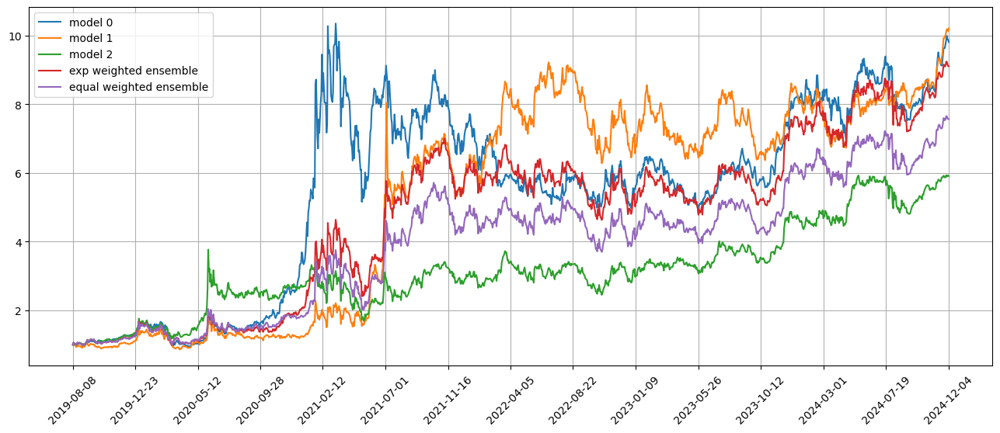

In [17]:
# Retrain all the rest
# %run C:\Projects\Stock_price_prediction\Experiments_YHdata\Baseline\CNN_MSE\CNN_Class.ipynb
print(f'Running {num_iters} iterations; first iteration already completed.')
first_run = False

for num_iter in range(1, num_iters):
    # Find train and test data
    ftd += seq_length
    ltd += seq_length
    data_train, x_train, y_train, data_test, x_test, y_test, sector_train, sector_test = prep_train_test_data(data, seq_length, ftd, ltd, all_days)
    print(f'Running iteration {num_iter+1} out of {num_iters} iterations')
    CNN_model.retrain_model(x_train, y_train, sector_train) 
    CNN_model.evaluate_model(x_train, y_train, sector_train, x_test, y_test, sector_test, batch_size)

    if save:
        for i in range(model_params['num_models']):
            CNN_model.model_dict[i].save(f"models/model_{i}_{all_days[ftd]}_{all_days[ltd]}.keras")

    gc.collect()
    
    # Check how much the weights are trained
    print("Correlations between old and new weights")
    for i in range(num_of_models):
        new_weights[i] = CNN_model.model_dict[i].get_weights()
        print(np.corrcoef(old_weights[i][0][0], new_weights[i][0][0])[0, 1])
        x = old_weights[i][-1]
        y = new_weights[i][-1]
        print(np.corrcoef(x.reshape(8, ), y.reshape(8, ))[0, 1])
    old_weights = new_weights.copy()
    
    total_asset_dict, total_dict, position_dict_all, return_dict = simulate(ftd, ltd, total_dict, first_run, num_stocks, total_asset_dict, 
                                                                            position_dict_all, return_dict)

In [18]:
import json

with open('total_asset_dict.json', 'w') as f:
    json.dump(total_asset_dict, f)
    
# with open('total_asset_dict.json', 'r') as fr:
#     test = json.load(fr)

In [19]:
last_simul_day = "2024-12-03"
rfr = list(data[data['datadate'] <= last_simul_day][['datadate', 'TBill1y']].drop_duplicates(subset=['datadate'])['TBill1y'])
rfr = rfr[-(len(total_asset_dict[0])-1):]

def calculate_SR(total_asset, rfr):
    '''
    Calculates the Sharpe Ratio of the simulated strategy
    Inputs:
        total_asset: list of total assets on each day
        rfr: list of risk-free rates on the same days as in total_asset
    Output:
        SR: Sharpe Ratio
    '''
    
    daily_ret = [(total_asset[i] - total_asset[i-1]) / total_asset[i-1] for i in range(1, len(total_asset))]
    assert len(daily_ret) == len(rfr)
    excess_ret = [daily_ret[i] - rfr[i] for i in range(len(rfr))]
    SR = np.mean(excess_ret) / np.std(excess_ret) * np.sqrt(252)
    
    return SR

for key, item in total_asset_dict.items():
    SR = calculate_SR(item, rfr)
    print(f'SR for model {key} is {SR}')

SR for model 0 is 0.9532032815331968
SR for model 1 is 0.9685266118342681
SR for model 2 is 0.8291473882532341
SR for model ensemble_weighted is 0.9659568001228931
SR for model ensemble_equal is 0.8917447535348149
